In [1]:
import pandas
import os
import itertools
import numpy as np
import nibabel as ni
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.formula.api as smf
from glob import glob
from scipy import stats
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn import model_selection, linear_model
from sklearn import mixture
from sklearn.metrics import roc_auc_score, roc_curve, auc, accuracy_score
from nilearn import image, plotting
from mpl_toolkits.mplot3d import Axes3D

In [2]:
def PCA_LR_pipeline(in_mtx, y, pca = PCA(random_state=123), 
                    clf = linear_model.LassoCV(random_state = 123), 
                    cv_strategy = None, cv = 10, test_gene_num = [100], illustrative = False,
                   sanity_check_style = 'separate', cv_labels = [], reverse_axes = True):
    
    final_outputs = {}
    
    if type(in_mtx) == pandas.core.frame.DataFrame:
        in_mtx = in_mtx.values
    
    if type(pca) == type(None):
        pca_tfm = in_mtx
    else:
        print('running PCA')
        dat_pca = pca.fit(in_mtx)
        print('transforming data')
        pca_tfm = dat_pca.transform(in_mtx)
        if len(y) != pca_tfm.shape[-1]:
            raise ValueError('length of y-axis of transformed item must match the length of y')
        final_outputs.update({'pca_object': dat_pca})
    
    
    print('performing model cross-validation')
    if hasattr(cv_strategy, 'get_n_splits'):
        folds = cv_strategy.get_n_splits(pca_tfm)
        #scores = model_selection.cross_val_score(clf, pca_tfm, y=y, groups=folds, cv=cv)
        predicted = model_selection.cross_val_predict(clf, pca_tfm, y=y, groups=folds, cv=cv)
        observed = y
        score = stats.pearsonr(predicted, y)[0]**2
    elif cv_strategy == 'LOLO':
        print('using leave-one-label-out cross-validation')
        observed, predicted = leave_one_x_out(cv_labels, pca_tfm, y, clf)
        score = stats.pearsonr(predicted,observed)[0]**2
    elif cv_strategy == 'balanced':
        print('balancing cross-validation by labels')
        observed, predicted = balanced_cv(cv_labels, pca_tfm, y, clf, cv)
        score = stats.pearsonr(predicted,observed)[0]**2
    elif type(cv_strategy) == int:
        print('using %s iterations of %s-fold cross-validation'%(cv_strategy,cv))
        score = []
        preds = np.zeros((cv_strategy,len(y)))
        for i in range(cv_strategy):
            sel = model_selection.KFold(n_splits=cv, shuffle=True)
            predicted = model_selection.cross_val_predict(clf, pca_tfm, y=y, cv=sel)
            preds[i,:] = predicted
            score.append(stats.pearsonr(predicted, y)[0]**2)
            print('completed iteration',i+1)
    elif type(cv_strategy) != type(None):
        print('using basic %s-fold cross-validation'%cv)
        #scores = model_selection.cross_val_score(clf, pca_tfm, y=y, cv=cv)
        predicted = model_selection.cross_val_predict(clf, pca_tfm, y=y, cv=cv)
        observed = y
        score = stats.pearsonr(predicted, y)[0]**2
    else:
        score = None
    if type(score) != type(None):
        if type(score) == list:
            if illustrative:
                plt.close()
                sns.regplot(preds.mean(0), y, fit_reg=False)
                plt.xlabel('Average CV model predicted position along axis')
                plt.ylabel('Actual position along axis')
                plt.show()

                jnk = pandas.DataFrame(index = range(cv_strategy+1), 
                                       columns = ['score','iteration'])
                jnk.loc[:,'iteration'] = list(range(cv_strategy)) + ['mean']
                jnk.loc[:,'score'] = score + [np.mean(score)]
                plt.close()
                sns.factorplot(x='iteration',y='score',data=jnk)
                plt.show()
                print('model cv scores (r2):')
                print(score)
                print('average r2:',np.mean(score))
                final_outputs.update({'CV_scores': score})
        else:        
            if illustrative:
                plt.close()
                sns.regplot(predicted, observed, fit_reg=False)
                plt.xlabel('CV model predicted position along axis')
                plt.ylabel('Actual position along axis')
                plt.show()
            print('model cv score: r2 = ',score)
            final_outputs.update({'CV_scores': score})
    else:
        print('no valid cross-validation method specified')
    
    print('running final model')
    mod = clf.fit(pca_tfm, y)
    if not hasattr(mod,'coef_'):
        raise IOError('right now, this pipeline can only accept clf objects with a coef_ attribute')
    final_outputs.update({'final_model': mod})
    scr = mod.score(pca_tfm, y)
    print('final model fit r2 = ',scr)
    if illustrative:
        plt.close()
        sns.regplot(x=mod.predict(pca_tfm), y=y)
        plt.xlabel('Model predicted position along A-P axis')
        plt.ylabel('Actual position along A-P axis')
        plt.show()
    
    if type(pca) == type(None):
        f_betas = mod.coef_
    else:
        f_betas = back_transform(dat_pca, mod)
    final_outputs.update({'betas': f_betas})
    
    gene_selections = sanity_check(in_mtx, y, f_betas, test_gene_num, 
                                   illustrative, sanity_check_style, reverse_axes)
    final_outputs.update({'gene_selections': gene_selections})
    
    return final_outputs
    
def back_transform(pca_obj, clf_obj):
    return np.dot(pca_obj.components_.T,clf_obj.coef_)

def sanity_check(in_mtx, y, betas, test_gene_num, illustrative, 
                 sanity_check_style, reverse_axes):
    
    if sanity_check_style == 'separate':
        ascores = []
        pscores = []
    else:
        scores = []
    print('running sanity_check')
    betas = pandas.Series(betas)
    outputs = {}
    for num in test_gene_num:
      
        p_chk = betas.sort_values(ascending=False)[:num].index
        a_chk = betas.sort_values(ascending=False)[-num:].index

        pchk_vals = []
        achk_vals = []
        
        for sample in range(in_mtx.shape[0]):
            to_avg = []
            for gene in p_chk:
                to_avg.append(in_mtx[sample,gene])
            if sanity_check_style == 'model':
                pchk_vals.append(np.mean(np.array(to_avg) * betas.loc[p_chk].values))
            else:
                pchk_vals.append(np.mean(to_avg))
        
        for sample in range(in_mtx.shape[0]):
            to_avg = []
            for gene in a_chk:
                to_avg.append(in_mtx[sample,gene])
            if sanity_check_style == 'separate':
                achk_vals.append(np.mean(to_avg))
            elif sanity_check_style == 'model':
                achk_vals.append(np.mean(np.array(to_avg) * betas.loc[a_chk].values))
            else:
                achk_vals.append(np.mean(to_avg) * -1)

        if sanity_check_style != 'separate':
            chk_vals = np.array(pchk_vals) + np.array(achk_vals)
            
        if sanity_check_style == 'separate':
            pr,pp = stats.pearsonr(pchk_vals, y)
            if illustrative:
                plt.close()
                sns.regplot(x=np.array(pchk_vals), y=y, fit_reg=None)
                if reverse_axes:
                    plt.xlabel('expression of anterior direction genes')
                    plt.ylabel('location along hippocampus (anterior = higher)')
                    plt.show()
                    print('anterior %s genes vs. y:  r2 = %s, p = %s \n\n'%(num, pr**2, pp))
                else:
                    plt.xlabel('expression of posterior direction genes')
                    plt.ylabel('location along hippocampus (posterior = higher)')
                    plt.show()
                    print('posterior %s genes vs. y:  r2 = %s, p = %s \n\n'%(num, pr**2, pp))

            ar,ap = stats.pearsonr(achk_vals, y)
            if illustrative:
                plt.close()
                sns.regplot(x=np.array(achk_vals), y=y, fit_reg=None)
                if reverse_axes:
                    plt.xlabel('expression of posterior direction genes')
                    plt.ylabel('location along hippocampus (anterior = higher)')
                    plt.show()
                    print('posterior %s genes vs. y:  r2 = %s, p = %s \n\n'%(num, ar**2, ap))
                else:
                    plt.xlabel('expression of anterior direction genes')
                    plt.ylabel('location along hippocampus (posterior = higher)')
                    plt.show()
                    print('anterior %s genes vs. y:  r2 = %s, p = %s \n\n'%(num, ar**2, ap))
            
        else:
            r,p = stats.pearsonr(chk_vals, y)
            if illustrative:
                plt.close()
                sns.regplot(x=np.array(chk_vals), y=y, fit_reg=None)
                plt.xlabel('expression of A-P axis genes')
                if reverse_axes:
                    plt.ylabel('location along hippocampus (anterior = higher)')
                else:
                    plt.ylabel('location along hippocampus (posterior = higher)')
                plt.show()
                print('posterior and anterior %s genes vs. y:  r2 = %s, p = %s \n\n'%(
                                                                                num, r**2, p))
            
        if sanity_check_style == 'separate':
            if reverse_axes:
                ascores.append(pr**2)
                pscores.append(ar**2)
            else:
                ascores.append(ar**2)
                pscores.append(pr**2)
        else:
            scores.append(r**2)
        if reverse_axes:
            outputs.update({'posterior_genes_%s'%num: a_chk}) 
            outputs.update({'anterior_genes_%s'%num: p_chk})
        else:
            outputs.update({'posterior_genes_%s'%num: p_chk}) 
            outputs.update({'anterior_genes_%s'%num: a_chk})
            
    if len(test_gene_num) > 1:
        if sanity_check_style == 'separate':
            jnk = pandas.concat([pandas.Series(test_gene_num), 
                                 pandas.Series(ascores),
                                pandas.Series(pscores)],axis=1)
            jnk.columns = ['num','a','p']

            plt.close()
            fig,(ax1,ax2) = plt.subplots(2, figsize=(8,10))
            sns.factorplot(x='num', y='a', data=jnk, ax=ax1)
            sns.factorplot(x='num', y='p', data=jnk, ax=ax2)
            ax1.set(xlabel = 'Number of posterior genes', 
                    ylabel ='Explained variance in \nhippocampus a-p gradient')
            ax2.set(xlabel = 'Number of anterior genes', 
                    ylabel ='Explained variance in \nhippocampus a-p gradient')
            plt.show()
        else:
            jnk = pandas.concat([pandas.Series(test_gene_num), 
                                 pandas.Series(scores)
                                ],axis=1)
            jnk.columns = ['num','score']

            plt.close()
            fig,ax1 = plt.subplots(1, figsize=(8,10))
            sns.factorplot(x='num', y='score', data=jnk, ax=ax1)
            ax1.set(xlabel = 'Number of genes', 
                    ylabel ='Explained variance in \nhippocampus a-p gradient')
            plt.show()

    return outputs

def leave_one_x_out(labels, in_X, in_y, clf):

    obsz = []
    predz = []
    label_map = dict(zip(labels.unique(), range(len(labels.unique()))))
    labels = [label_map[x] for x in labels]
    for label in np.unique(labels):
        Tr_samps = [i for i in labels if labels[i] != label]
        Te_samps = [i for i in labels if labels[i] == label]
        X = in_X[Tr_samps,:]
        in_y = y.iloc[Tr_samps]
        mod = clf.fit(X,y)
        pred = mod.predict(in_X[Te_samps,:])
        for x in range(len(pred)):
            obsz.append(y.values[x])
            predz.append(pred[x])
    
    return obsz, predz

def balanced_cv(labels, in_X, in_y, clf, cv):
    
    obsz = []
    predz = []
    tst = model_selection.StratifiedKFold(n_splits=cv, random_state=123)
    label_map = dict(zip(labels.unique(), range(len(labels.unique()))))
    labels = [label_map[x] for x in labels]
    for tr_idx, te_idx in tst.split(in_X, labels):
        X = in_X[tr_idx,:]
        y = in_y.loc[tr_idx]
        mod = clf.fit(X,y)
        pred = mod.predict(in_X[te_idx,:])
        for i in range(len(predz)):
            obsz.append(y.values[x])
            predz.append(pred[i])
            
    return obsz, predz

In [3]:
def convert_coords(coord, to_what = 'mni', vs = 1):
    origin = [90, 126, 72]
    origin = (np.array(origin) / vs).astype(int).tolist()
    x,y,z = coord[0],coord[1],coord[2]
    
    if to_what == 'mni':
        x = (origin[0]-x)*vs
        y = (y-origin[1])*vs
        z = (z-origin[2])*vs
        
    elif to_what == 'xyz':
        x=origin[0]- x/vs
        y=y/vs + origin[1]
        z=z/vs + origin[2]
        
    else:
        raise IOError('please set to_what to either mni or xyz')
    
    return x,y,z

In [4]:
def make_sphere(coord, radius):
    summers = []
    negrad = (radius*-1)+1
    for x in itertools.product(range(negrad,radius),repeat=3):
        summers.append(np.array(x))
    s_coords = [np.array(coord) + x for x in summers]
    xs = [int(x[0]) for x in s_coords]
    ys = [int(x[1]) for x in s_coords]
    zs = [int(x[2]) for x in s_coords]
    
    return xs, ys, zs

In [5]:
def run_hipp_connectivity_analysis(ant_cut, post_cut, df, ycol, 
                                   ccol, wdir, gdf, msk, gcx_col, plabs,
                                   del_img = True, diff_img = True,  vrad = 5, vdim = 1,
                                  in_imgs = [], bootstrap = False, n_iter = 100,
                                   hue_vals=[], return_results=False, return_vectors = False,
                                   illustrative=True):
    
    if len(in_imgs) == 0:
        a_idx = df.loc[[x for x in df.index if df.loc[x,ycol] < ant_cut]].index
        p_idx = df.loc[[x for x in df.index if df.loc[x,ycol] > post_cut]].index
        print('%s maps used for posterior, %s used for anterior'%(len(p_idx),len(a_idx)))
        print('\n')
        print('processing anterior image')
        aimg = make_mean_img(df.loc[a_idx,ccol].tolist(),wdir,del_img, 'ant')
        print('processing posterior image')
        pimg = make_mean_img(df.loc[p_idx,ccol].tolist(),wdir,del_img,'post')
    
        if diff_img:
            print('running analysis')
            diff_img = pimg - aimg
            res, vectors = run_gvfcx_analysis(diff_img, gdf, msk, vrad, vdim, gcx_col, plabs, 
                                     bootstrap, n_iter, hue_vals, illustrative)
        else:
            print('running posterior analysis')
            res, vectors = run_gvfcx_analysis(pimg, gdf, msk, vrad, vdim, gcx_col,  plabs, 
                                     bootstrap, n_iter, hue_vals, illustrative)
            print('running anterior analysis')
            res, vectors = run_gvfcx_analysis(aimg, gdf, msk, vrad, vdim, gcx_col, plabs, 
                                     bootstrap, n_iter, hue_vals, illustrative)
    else:
        if diff_img:
            diff_img = ni.load(in_imgs[1]).get_data() - ni.load(in_imgs[0]).get_data()
            res, vectors = run_gvfcx_analysis(diff_img, gdf, msk, vrad, vdim, gcx_col, plabs, 
                                     bootstrap, n_iter, hue_vals, illustrative)
        else:
            for img in in_imgs:
                print('running analysis for image',img)
                dat = ni.load(img).get_data()
                res, vectors = run_gvfcx_analysis(dat, gdf, msk, vrad, vdim, gcx_col, plabs, 
                                         bootstrap, hue_vals, illustrative)
    
    if return_results and return_vectors:
        return res, vectors
    elif return_results and not return_vectors:
        return res
    elif return_vectors and not return_results:
        return vectors
    
def make_mean_img(scans, wdir, del_img, lab):
    
    print('making mean image')
    img = ni.concat_images(scans)
    x,y,z,q,t = img.shape
    mat = img.get_data().reshape(x,y,z,t)
    mimg = ni.Nifti1Image(mat.mean(axis=3),img.affine)
    fnm = os.path.join(wdir,'del_%s_img.nii'%lab)
    mimg.to_filename(fnm)
    
    print('moving to template space')
    #mni = '/Users/jakevogel/Science/tau/MNI152_T1_1mm_brain.nii'
    mni = '/home/users/jvogel/Science/templates/templates/MNI152_T1_1mm_brain.nii'
    #tfm = '/Users/jakevogel/Science/AHBA/cx_maps/2_to_1_mm_tfm'
    tfm = '/home/users/jvogel/Science/templates/tfms/2_to_1mm_MNI.tfm'
    nfnm = os.path.join(wdir,'%s_img.nii'%lab)
    #os.system('flirt -in %s -ref %s -applyxfm -init %s -out %s'%(fnm,mni,tfm,nfnm))
    os.system('fsl5.0-flirt -in %s -ref %s -applyxfm -init %s -out %s'%(fnm,mni,tfm,nfnm))
    os.remove(fnm)
    nfnm = nfnm+'.gz'
    fimg = ni.load(nfnm).get_data()
    if del_img:
        os.remove(nfnm)
    
    return fimg

def run_gvfcx_analysis(img, gdf, msk, vrad, vdim, gcx_col, plabs,
                       bootstrap, n_iter, hue_vals, illustrative):
    
    if type(vrad) != list:
        vrad = [vrad]
    res = pandas.DataFrame(index=vrad,columns=['r2','p'])
    for vs in vrad:
        g_cx = []
        f_cx = []
        if len(hue_vals) > 0:
            hvs = []

        for i,row in gdf.iterrows():
            #coord = convert_coords([row['mni_x'], row['mni_y'], row['mni_z']], 'xyz')
            coord = convert_coords([row['mni_nlin_x'], row['mni_nlin_y'], row['mni_nlin_z']], 
                                   'xyz', vdim)
            coord = [round(x) for x in coord]
            if msk[coord[0],coord[1],coord[2]] != 0:
                xs,ys,zs = make_sphere(coord, vs)
                val = img[xs,ys,zs]
                f_cx.append(val.mean())
                g_cx.append(row[gcx_col])
                if len(hue_vals) > 0:
                    hvs.append(hue_vals[i])

        if len(hue_vals) == 0:
            if illustrative:
                plt.close()
                sns.regplot(np.array(g_cx), np.array(f_cx))
                plt.title(plabs[0])
                plt.xlabel(plabs[1])
                plt.ylabel(plabs[2])
                plt.show()
        else:
            if illustrative:
                jnk = pandas.DataFrame(index=range(len(g_cx)),columns = plabs[1:])
                jnk.loc[:,plabs[1]] = g_cx
                jnk.loc[:,plabs[2]] = f_cx
                jnk.loc[:,'sample expression cluster'] = hvs
                sns.lmplot(x=plabs[1],y=plabs[2],hue='sample expression cluster',data=jnk)
                plt.show()

        r, p = stats.pearsonr(np.array(g_cx), np.array(f_cx))
        print('standard statistics: r2 = %s, p = %s'%(r**2,p))
        res.loc[vs,['r2','p']] = [r**2,p]
        
        vectors = {'g_vector': g_cx, 'cx_vector': f_cx}
        
        if bootstrap == 'permute':
            distr = []
            for i in range(n_iter):
                distr.append(stats.pearsonr(np.random.permutation(np.array(g_cx)),
                                            np.array(f_cx)
                                           )[0]**2)
            distr = np.array(distr)
            p = (n_iter - len(distr[distr<r**2])) * (1/n_iter)
            ci_l = sorted(distr)[int(n_iter*0.05)]
            ci_u = sorted(distr)[int(n_iter*0.95)]
            mn = np.mean(distr)
            print('Occurence greater than chance: p = %s (chance r2 = %s [%s,%s])'%(
                                                                p, mn, ci_l, ci_u))
            res.loc[vs,'manual_FDR'] = p
            res.loc[vs,'chance_r2'] = mn
            res.loc[vs,'ci_l'] = ci_l
            res.loc[vs,'ci_u'] = ci_u

        elif bootstrap == 'bootstrap':
            # NEED TO MAKE THIS FASTER SO I CAN DO IT AT LEAST 100 TIMES.
            # AS OF NOW, IT TAKES LIKE >15 seconds to run 1
            distr = []
            for n in range(n_iter):
                r_cx = []
                possible_coords = np.where(msk!=0)
                rand_coords = np.random.permutation(range(len(possible_coords[0])))[:len(g_cx)]
                for i in rand_coords:
                    rand_coord = [possible_coords[0][i], 
                                  possible_coords[1][i], 
                                  possible_coords[2][i]]
                    xs,ys,zs = make_sphere(rand_coord, vs)
                    r_cx.append(img[xs,ys,zs].mean())
                distr.append(stats.pearsonr(np.array(g_cx), np.array(r_cx))[0]**2)
            distr = np.array(distr)
            p = (n_iter - len(distr[distr<r**2])) * (1/n_iter)
            ci_l = sorted(distr)[int(n_iter*0.05)]
            ci_u = sorted(distr)[int(n_iter*0.95)]
            mn = np.mean(distr)
            print('Occurence greater than chance: p = %s (chance r2 = %s [%s,%s])'%(
                                                                p, mn, ci_l, ci_u))
            res.loc[vs,'manual_FDR'] = p
            res.loc[vs,'chance_r2'] = mn
            res.loc[vs,'ci_l'] = ci_l
            res.loc[vs,'ci_u'] = ci_u

    return res, vectors

In [6]:
def make_expression_image(vector, coords, projection_space, 
                          wdir = './', nm = 'gene', vrad=5,
                         return_img = False):
    if len(vector) != len(coords):
        print('input and coordinate vectors must have the same length')
    if type(projection_space) == str:
        jnk = ni.load(projection_space)
        aff = jnk.affine
        dat = jnk.get_data()
    else:
        try:
            aff = projection_space.affine
            dat = projection_space.get_data()
        except:
            raise IOError('projection_space must be a NiftiImage object or path to .nii file')
    nimg = np.zeros_like(dat).astype(float)
    for i in range(len(vector)):
        xs,ys,zs = make_sphere(coords[i], vrad)
        nimg[xs,ys,zs] = vector[i]
    nimg = ni.Nifti1Image(nimg,aff)
    flnm = os.path.join(wdir,'%s_xp_image.nii.gz'%nm)
    nimg.to_filename(flnm)
    
    if return_img:
        return nimg

In [7]:
def find_closest_point_along_axis(coords,skel_coords):
    closest_coords = []
    y_coord = []
    for coord in sample_coords:
        dists = []
        for i in range(len(skel_coords[0])):
            dist = sum([abs(skel_coords[0][i] - coord[0]), 
                        abs(skel_coords[1][i] - coord[1]), 
                        abs(skel_coords[2][i] - coord[2])])
            dists.append(dist)
        gind = np.argmin(dists)
        closest_coords.append([skel_coords[0][gind],
                               skel_coords[1][gind],
                                skel_coords[2][gind]])
        y_coord.append(skel_coords[1][gind])

    return y_coord, closest_coords

In [8]:
def label_coordinate_by_atlas(atlas, coordinates, cube_size = 1):
    ''' This function will take a set of coordinates and an atlas and return the
    atlas label for each coordinate. Optionally, a cube can be drawn around the 
    coordinate. In this case, the most frequent non-zero value inside the cube will 
    be selected as the label. The function will output a pandas dataframe with a
    label for each input coordinate.
    
    atlas can be a path to a nifti image, or a nifti object, or a 3D np.ndarray
    
    coordinates can be a pandas Dataframe, a numpy.ndarray or a list of lists, 
    representing the mni coordinates for each input corrdinate. as such, the 
    length of one of the dimensions should be 3
    
    cube_size represents the radius of the cube to be created. leaving it as 1 will
    only retrieve the value at the coordinate specified. Increasing the value will 
    draw a cube of increasing size and collect values from within the cube. The most
    frequent non-zero value within the cube will be selected
    
    '''
    
    # initiate and check inputs
    atl, coords = init_and_chk_inputs(atlas,coordinates)
    
    # convert coordinates to xyz space
    xyz = np.array([convert_coords(coords[x],'xyz') for x in range(coords.shape[0])
                   ]).astype(int)
    
    # create output container
    results = pandas.DataFrame(index=range(coords.shape[0]),columns = ['Label'])
    
    # get labels for each coordinate
    print('extracting labels')
    if cube_size == 1:
        results.loc[:,'Label'] = atl[xyz[:,0].tolist(),xyz[:,1].tolist(),xyz[:,2].tolist()]
    else:
        labs = []
        for i in range(xyz.shape[0]):
            labs.append(extract_value_from_cube(xyz[i,:], cube_size, atl))
        results.loc[:,'Label'] = labs
    
    print('completed')
    print('%s coordinates were outside of the provided atlas'%(
                                            len(results[results.Label==0])))

    return results
    
def init_and_chk_inputs(atlas,coordinates):
    print('checking and initializing inputs')
    if type(atlas) == str:
        atl = ni.load(atlas).get_data()
    elif type(atlas) == ni.nifti1.Nifti1Image: 
        atl = atlas.get_data()
    elif type(atlas) == np.core.memmap.memmap or type(atlas) == np.ndarray:
        atl = atlas
    else:
        raise IOError('atlas must be a nifti object, a numpy array or a path to a nifti file')
    
    if type(coordinates) == pandas.core.frame.DataFrame:
        coords = coordinates.values
       
    elif type(coordinates) == list or type(coordinates) == tuple:
        if len(coordinates)== 3:
            coords = np.zeros((len(coordinates[0]),3))
            for i in range(3):
                coords[:,i] = coords[i]
    elif type(coordinates) == np.ndarray:
        coords = coordinates
    else:
        raise IOError('coordiantes must be a pandas dataframe, numpy array or list of lists')
    
    if not any(x==3 for x in coords.shape):
        raise IOError('Coordinates are 3D and thus 3 columns are expected...')
    elif coords.shape[-1] != 3:
        coords = coords.T
    
    coords = coords.round()
    
    return atl,coords
    
def convert_coords(coord, to_what = 'mni', vs = 1):
    origin = [90, 126, 72]
    origin = (np.array(origin) / vs).astype(int).tolist()
    x,y,z = coord[0],coord[1],coord[2]
    
    if to_what == 'mni':
        x = (origin[0]-x)*vs
        y = (y-origin[1])*vs
        z = (z-origin[2])*vs
        
    elif to_what == 'xyz':
        x=origin[0]- x/vs
        y=y/vs + origin[1]
        z=z/vs + origin[2]
        
    else:
        raise IOError('please set to_what to either mni or xyz')
    
    return x,y,z

def extract_value_from_cube(coord, radius, atl):
    
    xs,ys,zs = make_cube(coord, radius)
    cube_vals = atl[xs,ys,zs]
    if stats.mode(cube_vals)[0][0] == 0:
        if len(cube_vals[cube_vals!=0]) > 0:
            lab = stats.mode(cube_vals[cube_vals!=0])[0][0]
        else:
            lab = 0
    else:
        lab = stats.mode(cube_vals)[0][0]
    
    return lab
        
def make_cube(coord, radius):
    summers = []
    negrad = (radius*-1)+1
    for x in itertools.product(range(negrad,radius),repeat=3):
        summers.append(np.array(x))
    s_coords = [np.array(coord) + x for x in summers]
    xs = [int(x[0]) for x in s_coords]
    ys = [int(x[1]) for x in s_coords]
    zs = [int(x[2]) for x in s_coords]
    
    return xs, ys, zs

In [9]:
def get_gene_vector(bigdf, gene_vec = [], probe_ids = [], betas = []):

    if len(gene_vec) == 0 and len(probe_ids) == 0:
        raise IOError('please supply either a gene vector or probe IDs')
    if len(gene_vec) > 0 and len(probe_ids) > 0:
        raise IOError('please supply either a gene vector or probe IDs, but NOT BOTH!')
    #if type(clf) != type(None) and len(probe_ids) == 0:
    #   raise IOError('must pass probe_ids with clf')
    if len(betas) == 0 and len(probe_ids==0):
        raise IOError('please supply probe_ids along with the betas argument')
        
    if len(gene_vec) > 0:
        gene_vec = np.array(gene_vec)
        vals = []
        for i in range(bigdf.shape[-1]):
            try:
                vals.append(stats.pearsonr(gene_vec,
                                        bigdf.loc[:,bigdf.columns[i]])[0])
            except:
                bigdf.columns = ['col_%s'%x for x in range(bigdf.shape[-1])]
                vals.append(stats.pearsonr(gene_vec,
                                        bigdf.loc[:,bigdf.columns[i]])[0])
    elif len(probe_ids) > 0:
        #if type(clf) == type(None):
        if len(betas) == 0:
            vals = bigdf.loc[probe_ids].mean().values
        else:
            X = bigdf.loc[probe_ids].values.T
            vals = np.dot(X,betas)
        #    vals = clf.predict(X)
    return vals

# Get hippocampus samples

In [10]:
wdir = '/data1/users/jvogel/Allen_Human_Brain_Atlas/'
df = pandas.read_csv(os.path.join(wdir,'MAIN_hippocampus_sample_info.csv'))
xp = pandas.read_csv(os.path.join(wdir,'MAIN_hippocampus_gxp.csv'),index_col=0)
#gdf = pandas.read_csv(os.path.join(wdir,'MAIN_gcx_wholebrain_info.csv'))
gdf = pandas.read_csv(os.path.join(wdir,'MAIN_gcx_wholebrain_info_W_SMALL_SETS.csv'))
probes = pandas.read_csv(os.path.join(wdir,'normalized_microarray_donor9861/Probes.csv'))

In [312]:
# PERSONAL COMPUTER
wdir = '/Users/jakevogel/Science/AHBA/'
df = pandas.read_csv(os.path.join(wdir,'MAIN_hippocampus_sample_info.csv'))
xp = pandas.read_csv(os.path.join(wdir,'MAIN_hippocampus_gxp.csv'),index_col=0)
gdf = pandas.read_csv(os.path.join(wdir,'MAIN_gcx_wholebrain_info.csv'))
probes = pandas.read_csv('/Users/jakevogel/Downloads/normalized_microarray_donor9861/Probes.csv')

In [10]:
hipp_labs = [x for x in gdf.structure_name.unique() if 'CA' in x or 'dentate gyrus' in x or 'subiculum' in x]
hipp_samps = [x for x in gdf.index if gdf.loc[x,'structure_name'] in hipp_labs]
len(hipp_samps)

188

In [11]:
gdf.columns[-3:]

Index(['mni_nlin_x', 'mni_nlin_y', 'mni_nlin_z'], dtype='object')

In [18]:
vec = np.ones(len(hipp_samps))
input_coords = []
for i,row in gdf.loc[hipp_samps].iterrows():
    input_coords.append(convert_coords([row['mni_nlin_x'], row['mni_nlin_y'], row['mni_nlin_z']], 'xyz'))
mni = ni.load('/home/users/jvogel/Science/templates/templates/MNI152_T1_1mm_brain.nii')
nm = 'binary_hippocampus_sample'
hsamp_img = make_expression_image(vec, input_coords, mni, wdir, nm, 2, return_img=True)

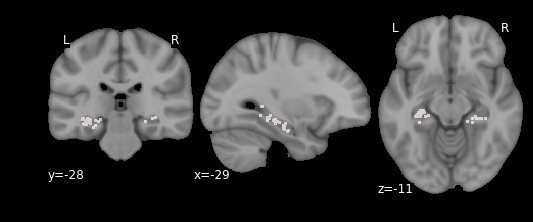

In [19]:
plt.close()
plotting.plot_roi(hsamp_img, mni, draw_cross=False, cmap='Reds')
plt.show()

In [24]:
[x for x in range(len(gdf.columns)) if 'mni' in gdf.columns[x]]

[13, 14, 15, 28, 29, 30]

In [27]:
# Figure out how many sample coordinates are outside of the hippocampus mask (by an unreasonable margin)
hipp_mask = ni.load('/home/users/jvogel/Science/templates/masks/Hippocampus_maxprob_thr0_1mm.nii')
lin_inside = label_coordinate_by_atlas(hipp_mask, gdf.loc[hipp_samps,gdf.columns[13:16]], cube_size = 3)
nlin_inside = label_coordinate_by_atlas(hipp_mask, gdf.loc[hipp_samps,gdf.columns[-3:]], cube_size = 3) 

checking and initializing inputs
extracting labels
completed
27 coordinates were outside of the provided atlas
checking and initializing inputs
extracting labels
completed
18 coordinates were outside of the provided atlas


In [39]:
# updating hipp_samps to remove the 18 samples that are too far out
hipp_samps = gdf.loc[hipp_samps].index[nlin_inside[nlin_inside.Label==1].index]

In [99]:
df = gdf.loc[hipp_samps]
df.shape

(170, 31)

In [78]:
#df.drop(df.columns[16:27],axis=1,inplace=True)
#df.columns

Index(['Unnamed: 0', 'donor', 'sample', 'structure_id', 'slab_num', 'well_id',
       'slab_type', 'structure_acronym', 'structure_name', 'polygon_id',
       'mri_voxel_x', 'mri_voxel_y', 'mri_voxel_z', 'mni_x', 'mni_y', 'mni_z',
       'gabe_label', 'mni_nlin_x', 'mni_nlin_y', 'mni_nlin_z',
       'position_along_hipp_AP_axis'],
      dtype='object')

In [79]:
df.to_csv(os.path.join(wdir,'MAIN_hippocampus_sample_info.csv'),index=False)

In [374]:
# GET GENE EXPRESSION FOR HIPPOCAMPAL SAMPLES 
# (loading this df takes awhile and may not work on computers without lots of memory (its about 60k x 4k))
wdir = '/data1/users/jvogel/Allen_Human_Brain_Atlas/'
shtz = sorted(glob(os.path.join(wdir,'normalized_microarray_donor*/MExp_all_genes_ctr_for_donor')))
holder = []
for sht in shtz:
    holder.append(pandas.read_csv(sht,index_col=0))
bigdf = pandas.concat(holder,axis=1)
del(holder)
ncols = ['%s_%s'%(gdf.loc[x,'donor'],bigdf.columns[x]) for x in range(gdf.shape[0])]
bigdf.columns = ncols

In [56]:
xp = bigdf.loc[:,bigdf.columns[hipp_samps.astype(int)]]
xp.shape

(58692, 170)

In [66]:
xp.to_csv(os.path.join(wdir,'MAIN_hippocampus_gxp.csv'))

This whole section is me cross-checking with my old data to be sure i'm indexing properly

In [67]:
old_xp = pandas.read_csv(os.path.join(wdir,'whole_hippocampus_xp_allsubs_cleaned_labeled.csv'))

In [59]:
#CHECK OLD DATA TO MAKE SURE EVERYTHING IS CORRECT
old_df = pandas.read_csv(os.path.join(
        wdir,'whole_hippocampus_hit_coordinates_cleaned_all_c_labs.csv'))
old_df = old_df.loc[[x for x in old_df.index if pandas.notnull(old_df.loc[x,'2_c_solution'])]]

In [112]:
old_id = []
for i,row in old_df.iterrows():
    old_id.append(df[(df.donor==row['sub']) & (df['sample']==row['label']+1)].index[0])

In [102]:
df.loc[:,'basic_idx'] = range(df.shape[0])

In [103]:
match_df = df.loc[old_id]
match_df.head()

,Unnamed: 0,donor,sample,structure_id,slab_num,well_id,slab_type,structure_acronym,structure_name,polygon_id,...,mixed_test_p20_avg_gene_expression,p20_LARS_avg_gene_expression,p20_SPCR_avg_gene_expression,p500_SPCR_avg_gene_expression,p50_SPCR_avg_gene_expression,gabe_label,mni_nlin_x,mni_nlin_y,mni_nlin_z,basic_idx
524,524,10021,525,4258,13,5905,CX,DG,"dentate gyrus, left",1027911,...,-0.770956,-0.461315,-1.193483,-0.491563,-0.596289,H0351.2002,-30.060635,-17.008006,-17.804403,5
525,525,10021,526,4257,13,5897,CX,CA4,"CA4 field, left",1029991,...,-0.474285,-0.288329,-0.637411,-0.038679,-0.508617,H0351.2002,-28.809634,-17.152891,-17.827365,6
527,527,10021,528,4254,13,5881,CX,CA1,"CA1 field, left",1027902,...,-0.682998,-0.233764,-1.059782,-0.086003,-0.713043,H0351.2002,-33.634115,-15.568971,-20.362231,8
528,528,10021,529,4251,13,5873,CX,S,"subiculum, left",1027901,...,-0.366067,-0.434494,-0.339502,-0.066769,-0.151106,H0351.2002,-23.591102,-15.565700,-23.657211,9
531,531,10021,532,4258,15,5828,CX,DG,"dentate gyrus, left",1013074,...,0.312757,0.214687,0.225555,0.422113,0.109198,H0351.2002,-28.284228,-34.642097,-7.793446,10


In [107]:
match_xp = xp.iloc[:,match_df.basic_idx]

In [111]:
for i in range(match_xp.shape[-1]):
    print(stats.pearsonr(match_xp.values[:,i],old_xp.values[:-6,i]))

(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(0.99999999999999978, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0, 0.0)
(1.0,

ok we're good

# Get location of samples along axis

In [335]:
plotting.plot_roi?

//anaconda/envs/py3/lib/python3.5/site-packages/matplotlib/cbook.py:136: MatplotlibDeprecationWarning: The axisbg attribute was deprecated in version 2.0. Use facecolor instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


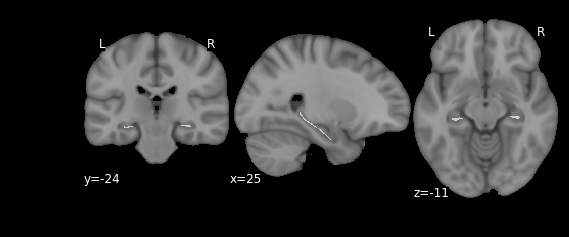

In [135]:
ap_axis = ni.load('/Users/jakevogel/Science/AHBA/blob_line_skel_1mm_2nii.nii')
#ap_axis = ni.load('/data1/users/jvogel/Allen_Human_Brain_Atlas/axis/blob_line_skel_1mm_2nii.nii')
#mni = ni.load('/home/users/jvogel/Science/templates/templates/MNI152_T1_1mm_brain.nii')
mni = ni.load('/Users/jakevogel/Science/tau/MNI152_T1_1mm_brain.nii')
plt.close()
plotting.plot_roi(ap_axis, mni, draw_cross=False, cmap='Reds')
plt.show()

In [64]:
sample_coords = []
for i,row in df.iterrows():
    sample_coords.append(convert_coords([row['mni_nlin_x'], row['mni_nlin_y'], row['mni_nlin_z']], 'xyz'))
skel_coords = np.where(ap_axis.get_data() > 0)
y_location, closest_points = find_closest_point_along_axis(sample_coords,skel_coords)

In [67]:
df.loc[:,'position_along_hipp_AP_axis'] = y_location

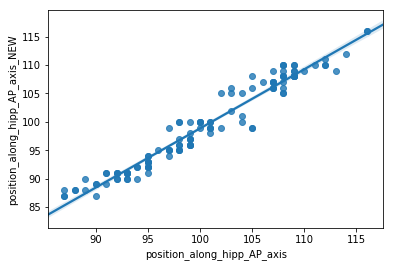

In [117]:
# how has it changed since after getting the correct (non-linear) coordinates?
match_df = df.loc[old_id]
plt.close()
sns.regplot(match_df.position_along_hipp_AP_axis, old_df.position_along_hipp_AP_axis_NEW)
plt.show()

# Run main analysis pipeline and evaluate

In [203]:
1e3

1000.0

running PCA
transforming data
performing model cross-validation
using basic cross-validation


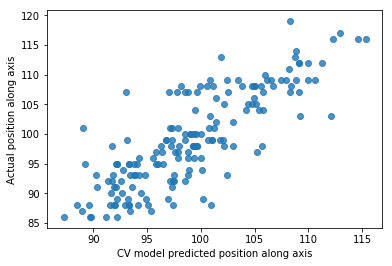

model cv score: r2 =  0.675885977482
running final model
final model fit r2 =  0.876810509326


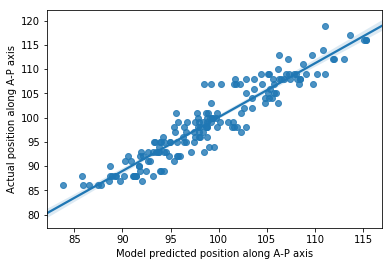

running sanity_check


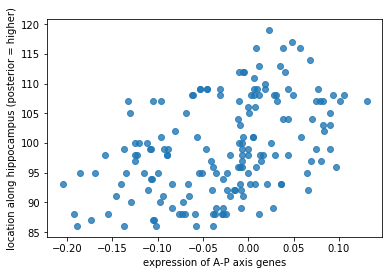

posterior 1 genes vs. y:  r2 = 0.194543256836, p = 1.74450292532e-09 




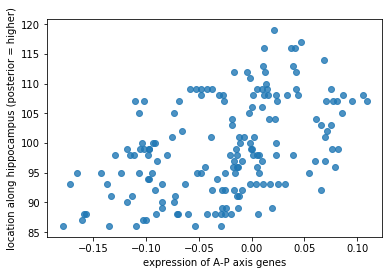

posterior 2 genes vs. y:  r2 = 0.217821271576, p = 1.40784426722e-10 




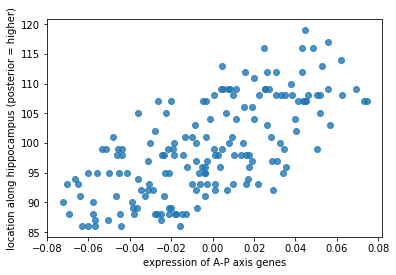

posterior 5 genes vs. y:  r2 = 0.463295928263, p = 1.78044835777e-24 




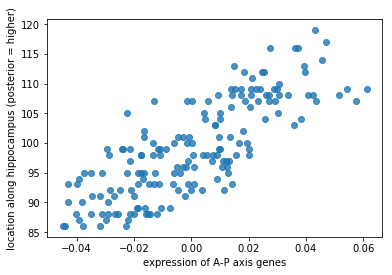

posterior 10 genes vs. y:  r2 = 0.639241956446, p = 4.90368232063e-39 




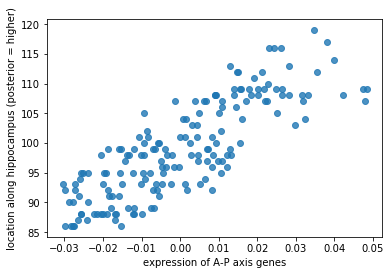

posterior 20 genes vs. y:  r2 = 0.676221182095, p = 5.41063626393e-43 




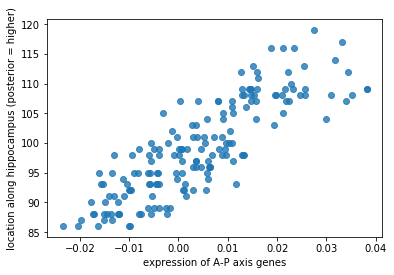

posterior 50 genes vs. y:  r2 = 0.715680282029, p = 9.55117495886e-48 




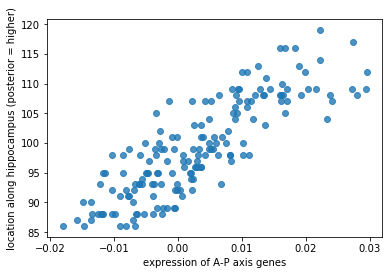

posterior 100 genes vs. y:  r2 = 0.711342582284, p = 3.41757281096e-47 




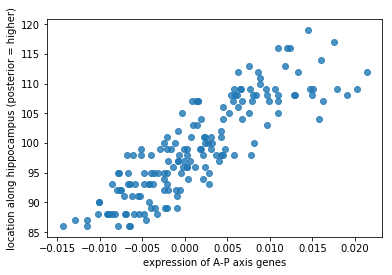

posterior 200 genes vs. y:  r2 = 0.744205066079, p = 1.30269265537e-51 




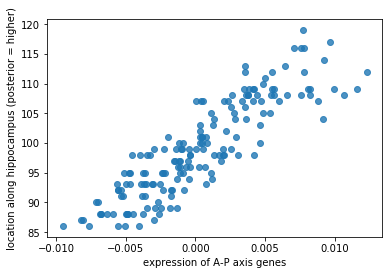

posterior 500 genes vs. y:  r2 = 0.77405157133, p = 3.80447691495e-56 




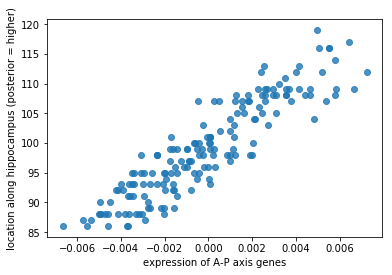

posterior 1000 genes vs. y:  r2 = 0.827396971692, p = 5.51210390865e-66 




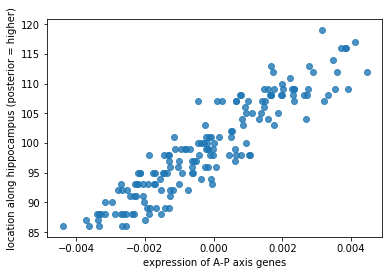

posterior 2000 genes vs. y:  r2 = 0.852289608838, p = 1.13092020632e-71 




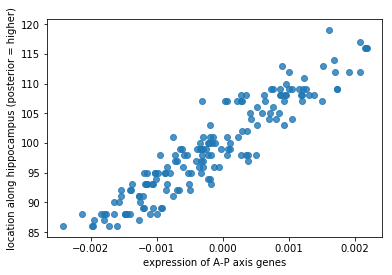

posterior 5000 genes vs. y:  r2 = 0.875286566296, p = 7.48019047274e-78 




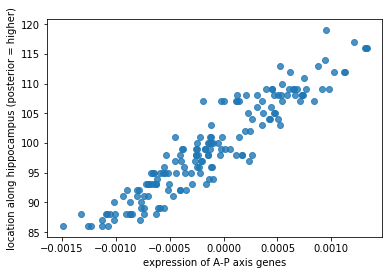

posterior 10000 genes vs. y:  r2 = 0.882847528315, p = 3.89475581772e-80 




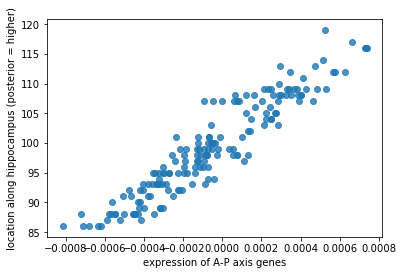

posterior 20000 genes vs. y:  r2 = 0.885890006722, p = 4.26392839513e-81 




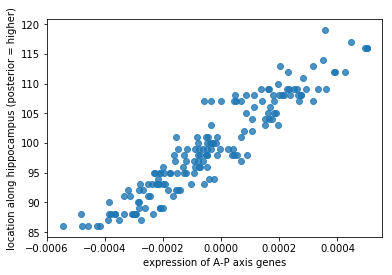

posterior 30000 genes vs. y:  r2 = 0.885696338267, p = 4.91722053348e-81 




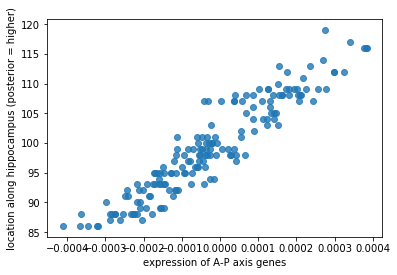

posterior 40000 genes vs. y:  r2 = 0.884896167026, p = 8.83900414206e-81 




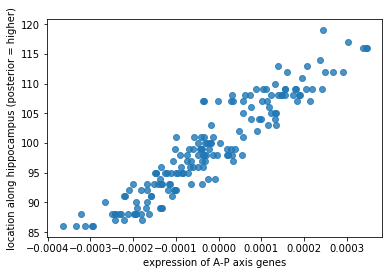

posterior 50000 genes vs. y:  r2 = 0.88258730058, p = 4.69339649337e-80 




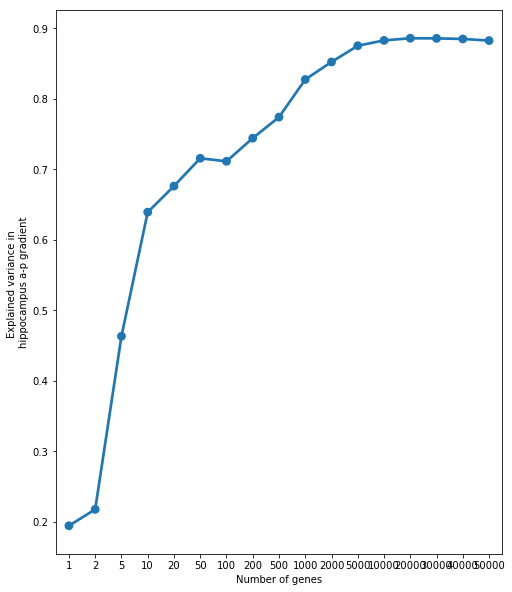

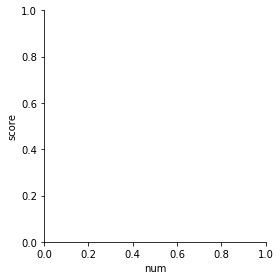

In [13]:
# testing weighted averages
pcalr_out_NEW2 = PCA_LR_pipeline(xp.values.T, 
                            (df.position_along_hipp_AP_axis), 
                            cv_strategy='score', illustrative=True,
                           test_gene_num = [1, 2, 5, 10, 20, 50, 100, 
                                            200, 500, 1000, 2000, 5000,
                                           1e4, 2e4, 3e4, 4e4, 5e4],
                               sanity_check_style = 'model')

running PCA
transforming data
performing model cross-validation
using basic 10-fold cross-validation


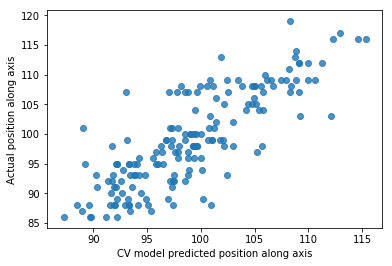

model cv score: r2 =  0.675885977482
running final model
final model fit r2 =  0.876810509326


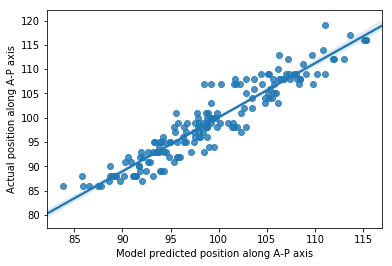

running sanity_check


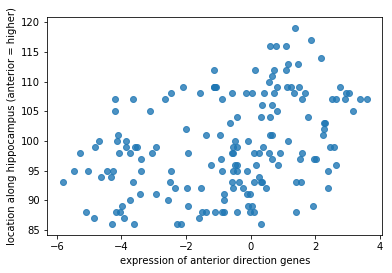

anterior 1 genes vs. y:  r2 = 0.146291960145, p = 2.64362300167e-07 




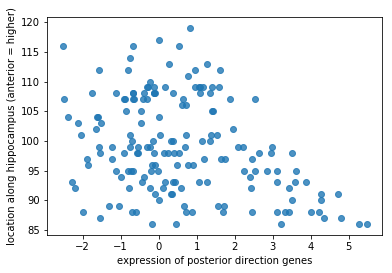

posterior 1 genes vs. y:  r2 = 0.120839023188, p = 3.40674823134e-06 




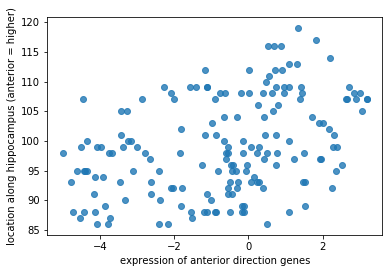

anterior 2 genes vs. y:  r2 = 0.156810463199, p = 9.03376115525e-08 




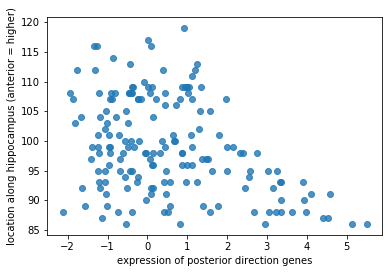

posterior 2 genes vs. y:  r2 = 0.140782455333, p = 4.61980605763e-07 




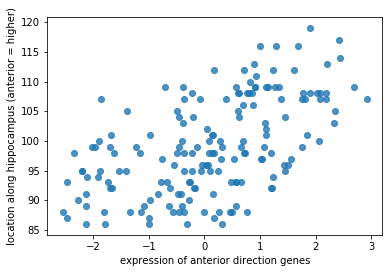

anterior 5 genes vs. y:  r2 = 0.312027641285, p = 2.46628262071e-15 




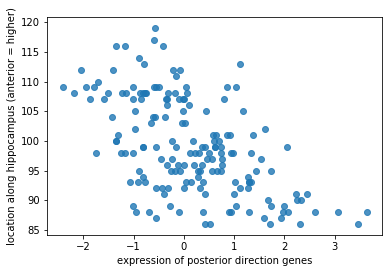

posterior 5 genes vs. y:  r2 = 0.308872084395, p = 3.6401288821e-15 




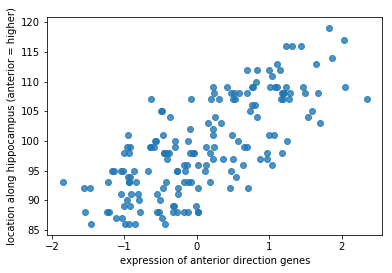

anterior 10 genes vs. y:  r2 = 0.541743338152, p = 2.83625582234e-30 




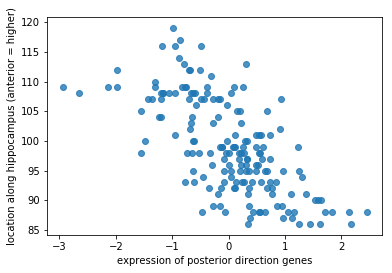

posterior 10 genes vs. y:  r2 = 0.45513306654, p = 6.38206163432e-24 




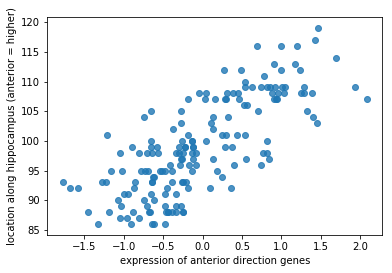

anterior 20 genes vs. y:  r2 = 0.577277974194, p = 3.12395740458e-33 




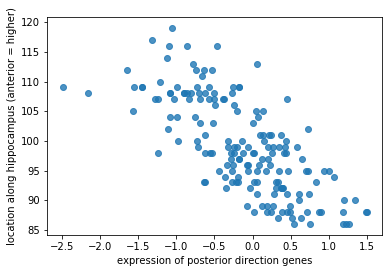

posterior 20 genes vs. y:  r2 = 0.528759540293, p = 3.00011527119e-29 




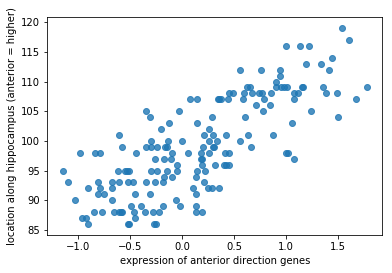

anterior 50 genes vs. y:  r2 = 0.604781566638, p = 1.07277863382e-35 




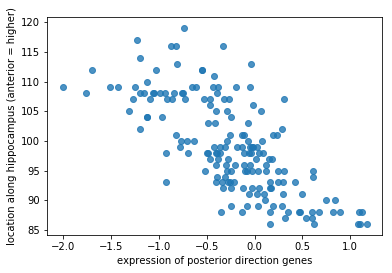

posterior 50 genes vs. y:  r2 = 0.521495808996, p = 1.09169856187e-28 




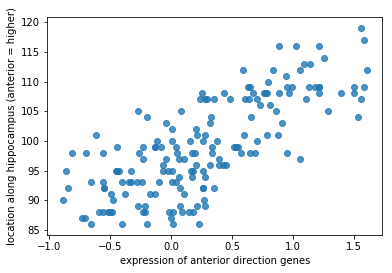

anterior 100 genes vs. y:  r2 = 0.568535370196, p = 1.75686862748e-32 




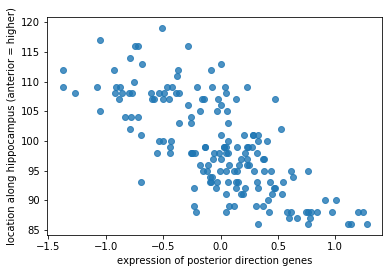

posterior 100 genes vs. y:  r2 = 0.530569444547, p = 2.16785299609e-29 




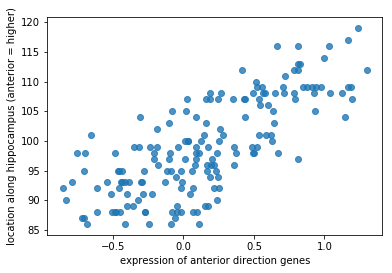

anterior 200 genes vs. y:  r2 = 0.573989954195, p = 6.00589222139e-33 




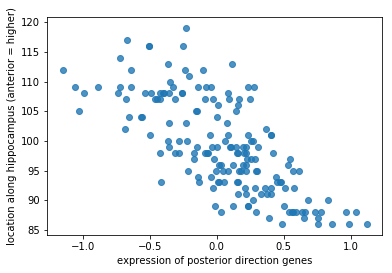

posterior 200 genes vs. y:  r2 = 0.530012749169, p = 2.396015094e-29 




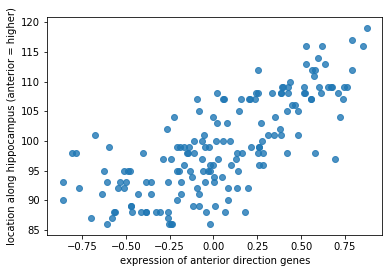

anterior 500 genes vs. y:  r2 = 0.561315373964, p = 7.1262999131e-32 




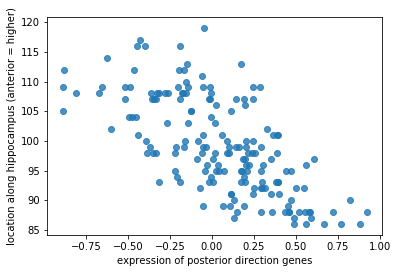

posterior 500 genes vs. y:  r2 = 0.456701046713, p = 5.00149396762e-24 




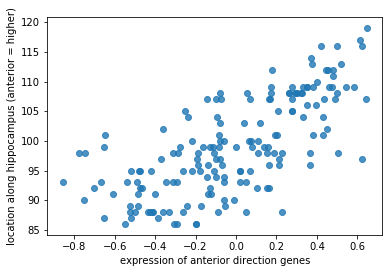

anterior 1000 genes vs. y:  r2 = 0.506219222541, p = 1.5519698984e-27 




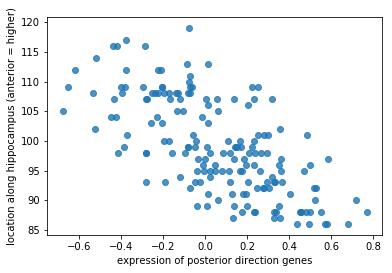

posterior 1000 genes vs. y:  r2 = 0.454418293527, p = 7.13048262374e-24 




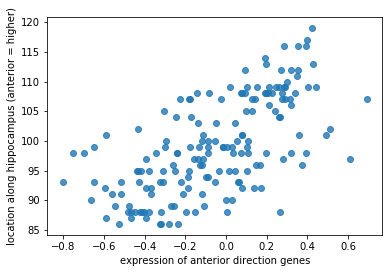

anterior 2000 genes vs. y:  r2 = 0.413582900724, p = 3.20747873988e-21 




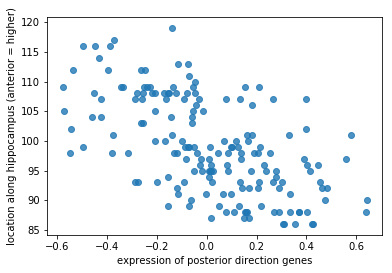

posterior 2000 genes vs. y:  r2 = 0.348659261806, p = 2.35874690133e-17 




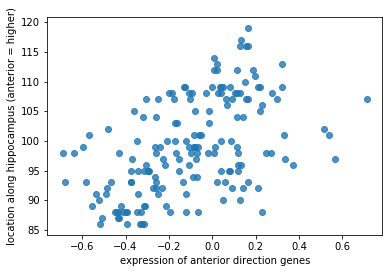

anterior 5000 genes vs. y:  r2 = 0.260250683548, p = 1.19416253845e-12 




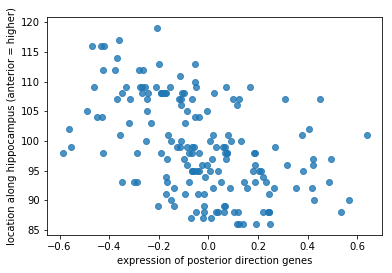

posterior 5000 genes vs. y:  r2 = 0.227039856261, p = 5.09894187119e-11 




//anaconda/envs/py3/lib/python3.5/site-packages/seaborn/categorical.py:1460: FutureWarning: remove_na is deprecated and is a private function. Do not use.
  stat_data = remove_na(group_data)


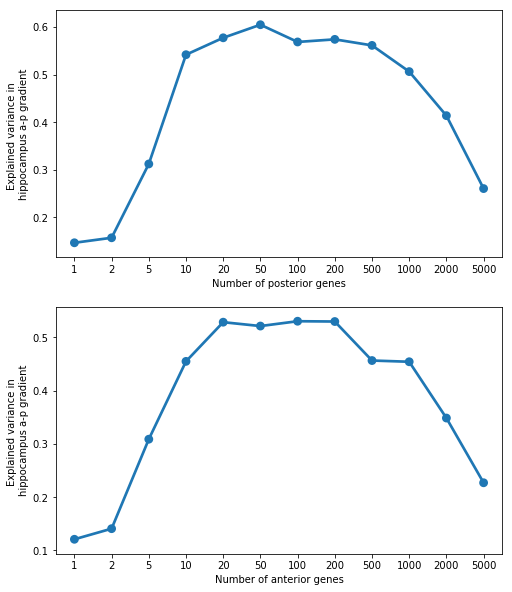

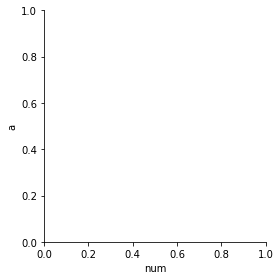

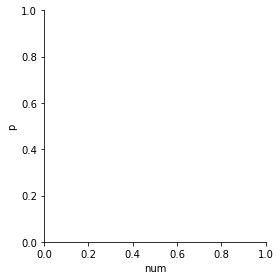

In [23]:
pcalr_out_NEW = PCA_LR_pipeline(xp.values.T, 
                            (df.position_along_hipp_AP_axis), 
                            cv_strategy='score', illustrative=True,
                           test_gene_num = [1, 2, 5, 10, 20, 50, 100, 
                                            200, 500, 1000, 2000, 5000],
                               sanity_check_style = 'separate')

running PCA
transforming data
performing model cross-validation
using 10 iterations of 10-fold cross-validation


//anaconda/envs/py3/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


completed iteration 1
completed iteration 2


//anaconda/envs/py3/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
//anaconda/envs/py3/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


completed iteration 3
completed iteration 4


//anaconda/envs/py3/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


completed iteration 5


//anaconda/envs/py3/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


completed iteration 6


//anaconda/envs/py3/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
//anaconda/envs/py3/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


completed iteration 7
completed iteration 8
completed iteration 9
completed iteration 10


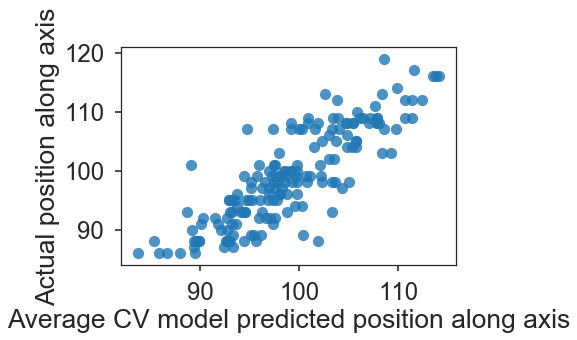

//anaconda/envs/py3/lib/python3.5/site-packages/seaborn/categorical.py:1460: FutureWarning: remove_na is deprecated and is a private function. Do not use.
  stat_data = remove_na(group_data)


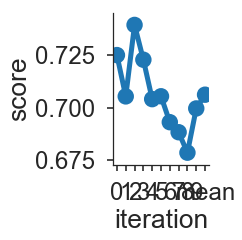

model cv scores (r2):
[0.72498247033534724, 0.70529712426358138, 0.73935976682315552, 0.72277965545537726, 0.70398894919691668, 0.7053545595861388, 0.69300251147356873, 0.68822074244319387, 0.67846727666597972, 0.69955235596508725]
average r2: 0.706100541221
running final model
final model fit r2 =  0.876810509326


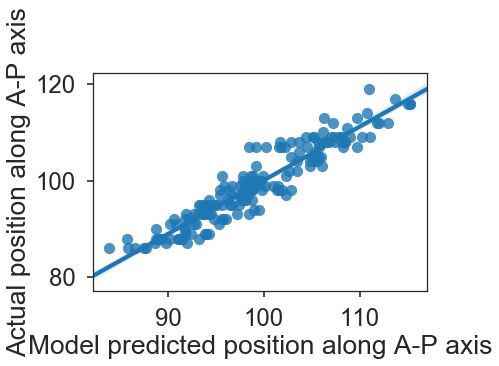

running sanity_check


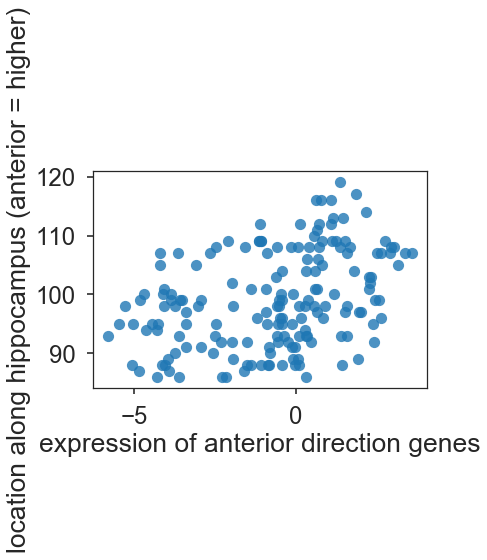

anterior 1 genes vs. y:  r2 = 0.146291960145, p = 2.64362300167e-07 




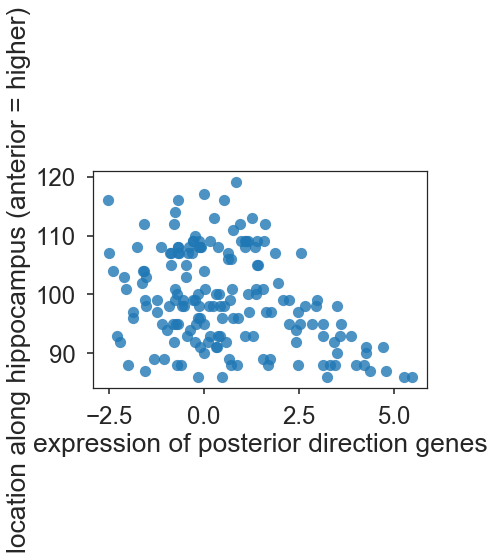

posterior 1 genes vs. y:  r2 = 0.120839023188, p = 3.40674823134e-06 




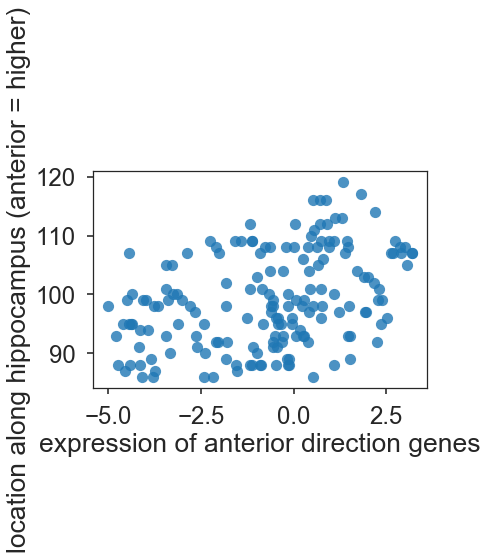

anterior 2 genes vs. y:  r2 = 0.156810463199, p = 9.03376115525e-08 




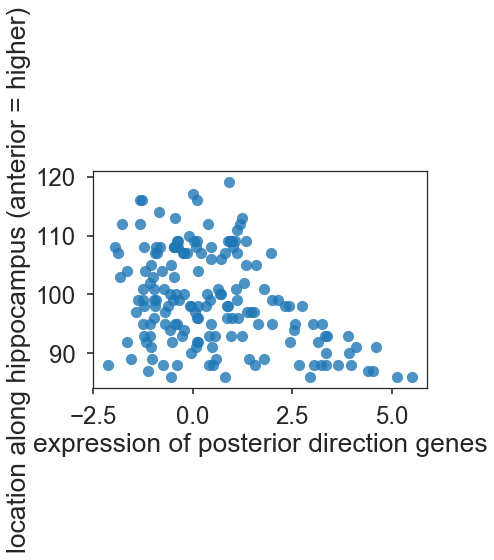

posterior 2 genes vs. y:  r2 = 0.140782455333, p = 4.61980605763e-07 




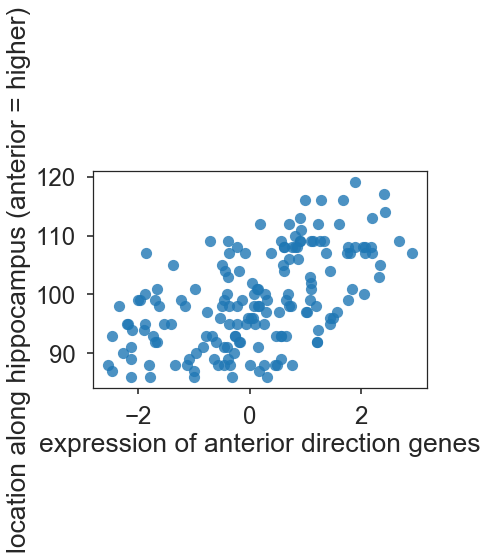

anterior 5 genes vs. y:  r2 = 0.312027641285, p = 2.46628262071e-15 




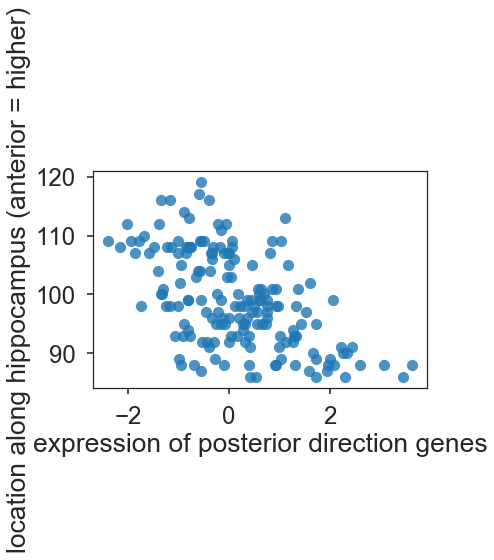

posterior 5 genes vs. y:  r2 = 0.308872084395, p = 3.6401288821e-15 




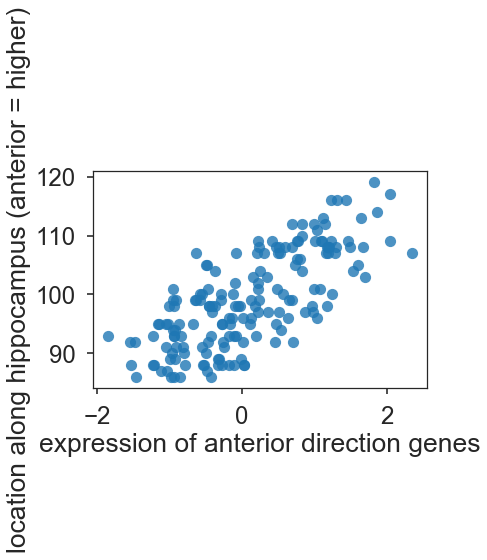

anterior 10 genes vs. y:  r2 = 0.541743338152, p = 2.83625582234e-30 




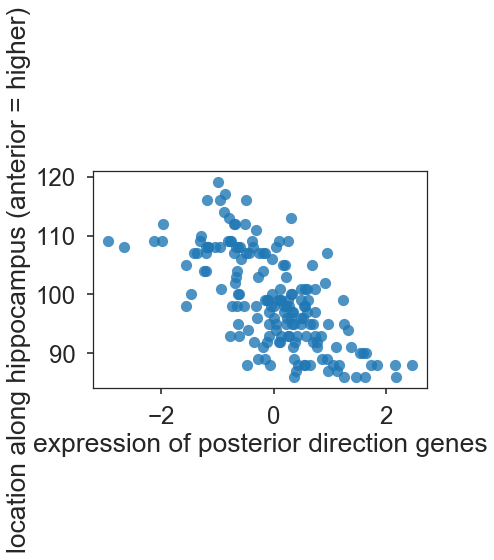

posterior 10 genes vs. y:  r2 = 0.45513306654, p = 6.38206163432e-24 




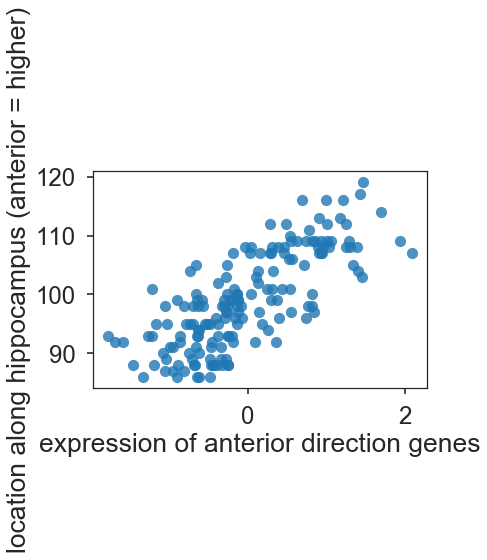

anterior 20 genes vs. y:  r2 = 0.577277974194, p = 3.12395740458e-33 




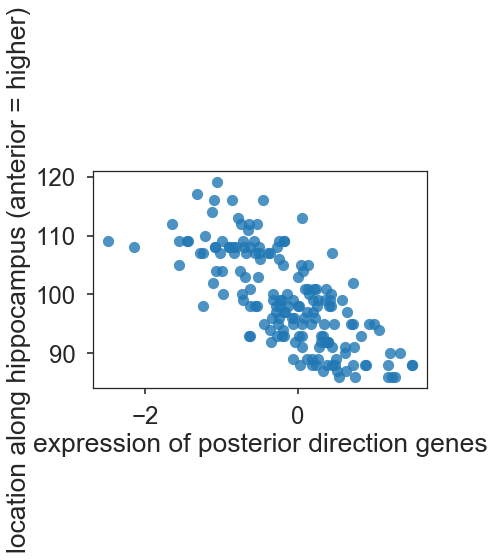

posterior 20 genes vs. y:  r2 = 0.528759540293, p = 3.00011527119e-29 




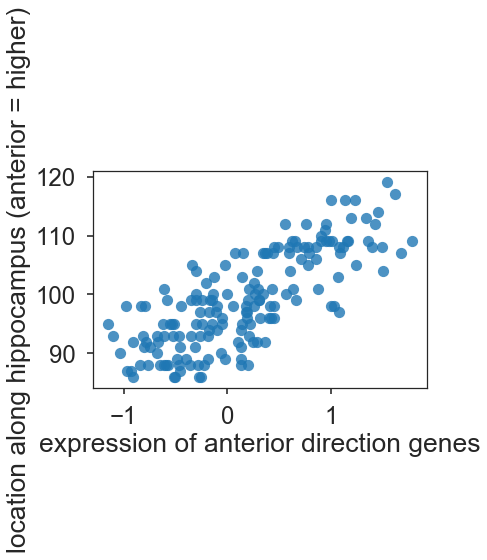

anterior 50 genes vs. y:  r2 = 0.604781566638, p = 1.07277863382e-35 




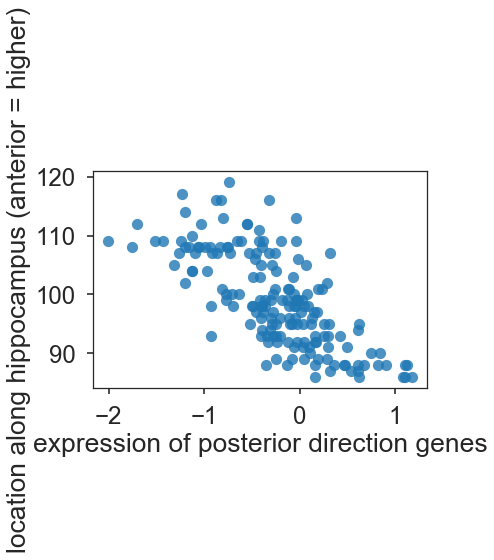

posterior 50 genes vs. y:  r2 = 0.521495808996, p = 1.09169856187e-28 




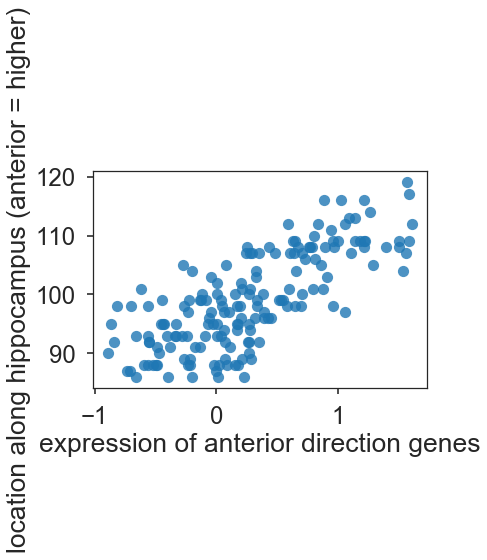

anterior 100 genes vs. y:  r2 = 0.568535370196, p = 1.75686862748e-32 




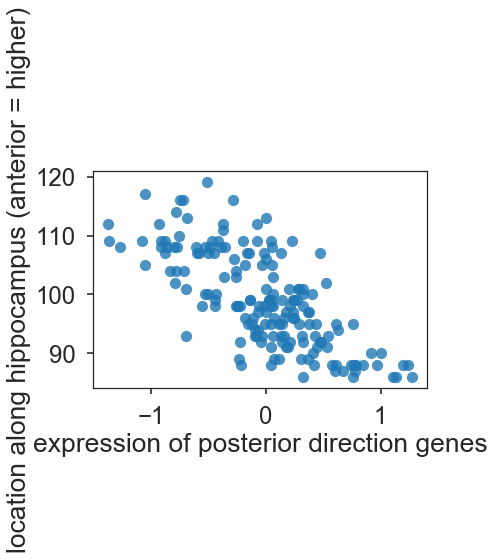

posterior 100 genes vs. y:  r2 = 0.530569444547, p = 2.16785299609e-29 




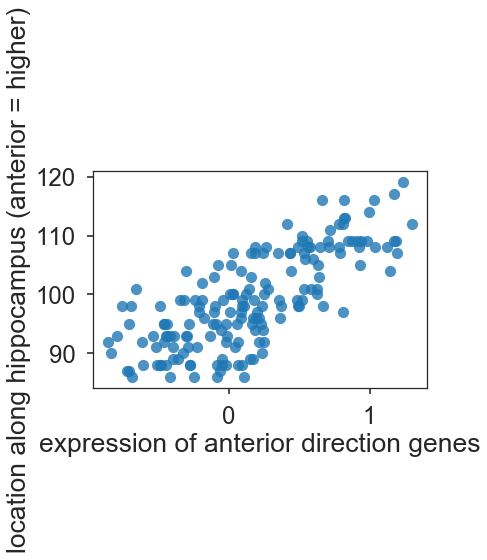

anterior 200 genes vs. y:  r2 = 0.573989954195, p = 6.00589222139e-33 




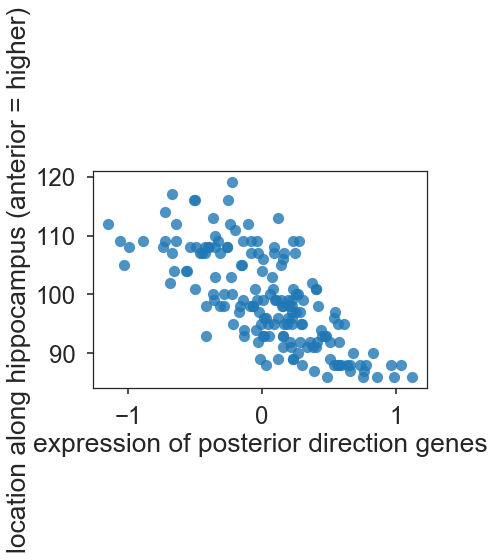

posterior 200 genes vs. y:  r2 = 0.530012749169, p = 2.396015094e-29 




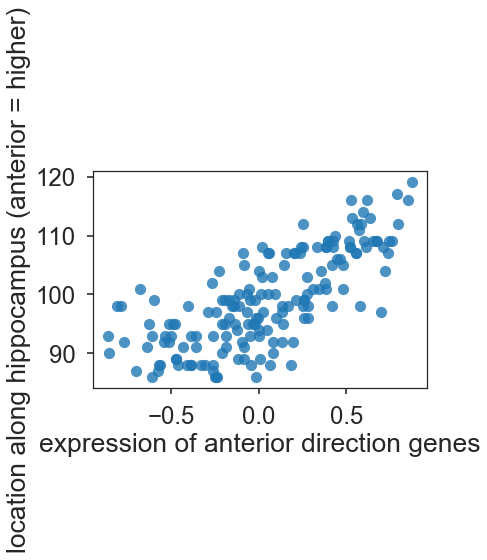

anterior 500 genes vs. y:  r2 = 0.561315373964, p = 7.1262999131e-32 




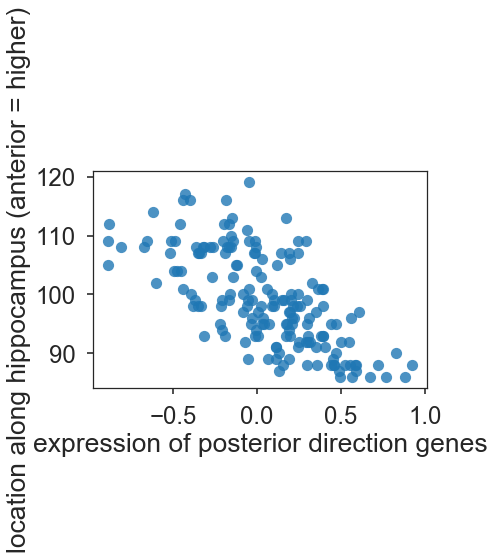

posterior 500 genes vs. y:  r2 = 0.456701046713, p = 5.00149396762e-24 




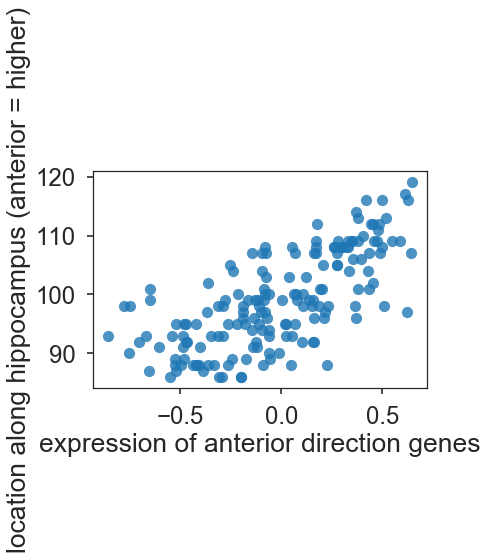

anterior 1000 genes vs. y:  r2 = 0.506219222541, p = 1.5519698984e-27 




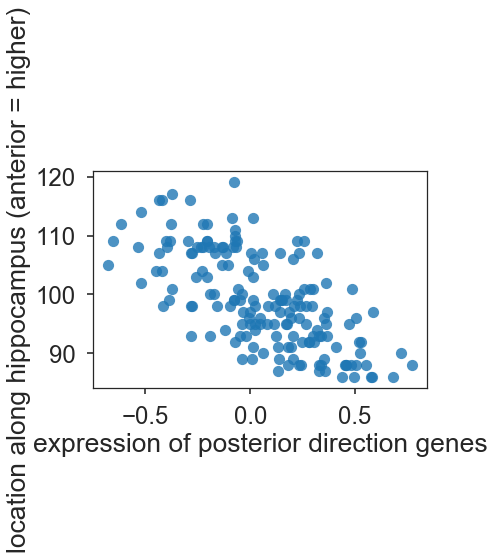

posterior 1000 genes vs. y:  r2 = 0.454418293527, p = 7.13048262374e-24 




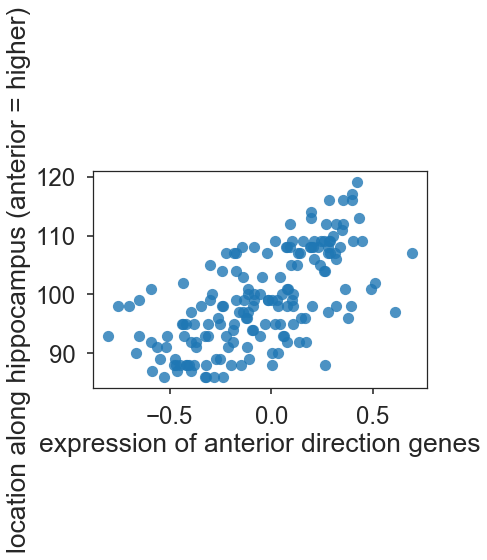

anterior 2000 genes vs. y:  r2 = 0.413582900724, p = 3.20747873988e-21 




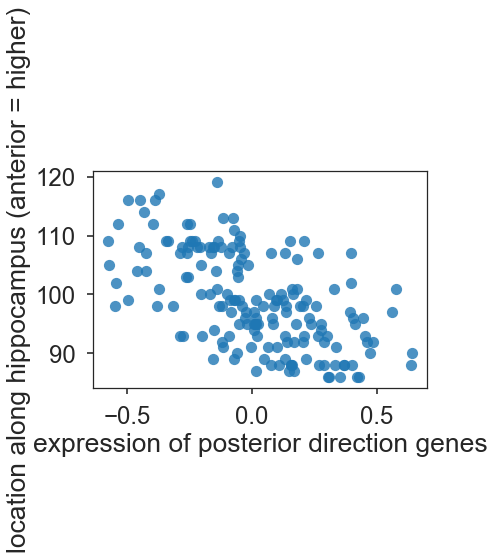

posterior 2000 genes vs. y:  r2 = 0.348659261806, p = 2.35874690133e-17 




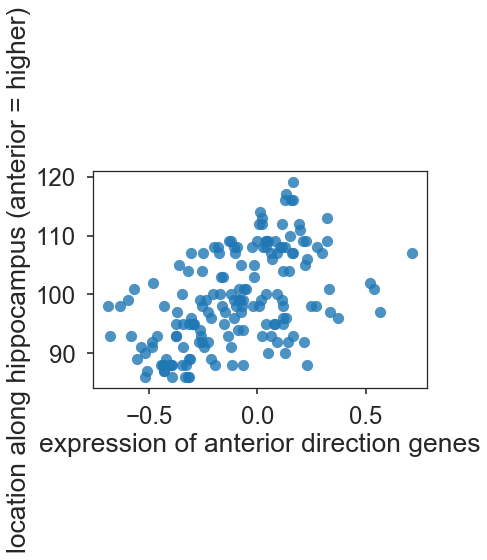

anterior 5000 genes vs. y:  r2 = 0.260250683548, p = 1.19416253845e-12 




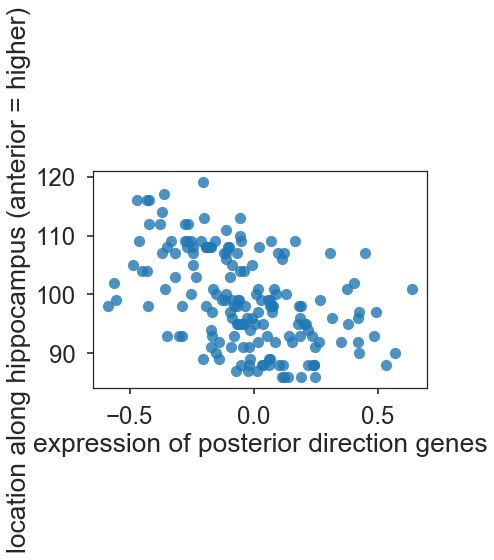

posterior 5000 genes vs. y:  r2 = 0.227039856261, p = 5.09894187119e-11 




//anaconda/envs/py3/lib/python3.5/site-packages/seaborn/categorical.py:1460: FutureWarning: remove_na is deprecated and is a private function. Do not use.
  stat_data = remove_na(group_data)


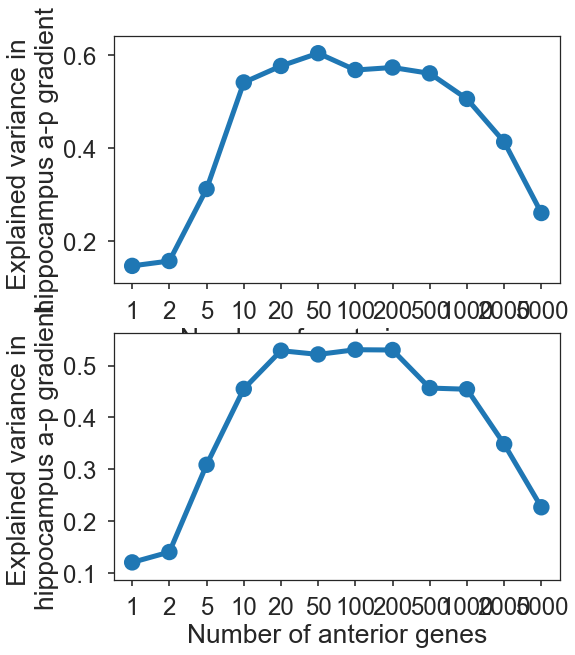

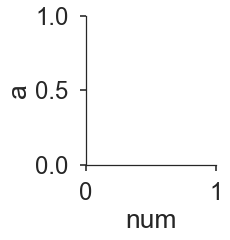

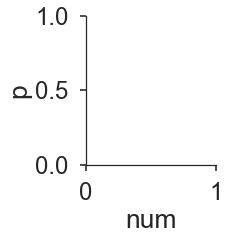

In [184]:
test = PCA_LR_pipeline(xp.values.T, 
                            df.position_along_hipp_AP_axis, 
                            cv_strategy=10, illustrative=True,
                           test_gene_num = [1, 2, 5, 10, 20, 50, 100, 
                                            200, 500, 1000, 2000, 5000],
                               sanity_check_style = 'separate')

# Figures for manuscript...

In [111]:
clf = linear_model.LassoCV(random_state = 123)
pca_tfm = pcalr_out_NEW['pca_object'].transform(xp.values.T)
cv=10
cv_strategy=10
y = df.position_along_hipp_AP_axis
score = []
preds = np.zeros((cv_strategy,len(y)))
for i in range(cv_strategy):
    sel = model_selection.KFold(n_splits=cv, shuffle=True)
    predicted = model_selection.cross_val_predict(clf, pca_tfm, y=y, cv=sel)
    preds[i,:] = predicted
    score.append(stats.pearsonr(predicted, y)[0]**2)
    print('completed iteration',i+1)
score

completed iteration 1
completed iteration 2
completed iteration 3
completed iteration 4
completed iteration 5
completed iteration 6


//anaconda/envs/py3/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


completed iteration 7
completed iteration 8
completed iteration 9
completed iteration 10


[]

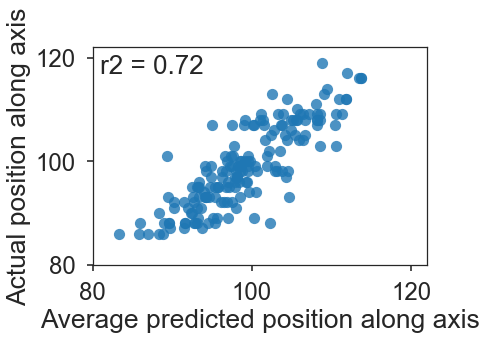

//anaconda/envs/py3/lib/python3.5/site-packages/seaborn/categorical.py:1460: FutureWarning: remove_na is deprecated and is a private function. Do not use.
  stat_data = remove_na(group_data)


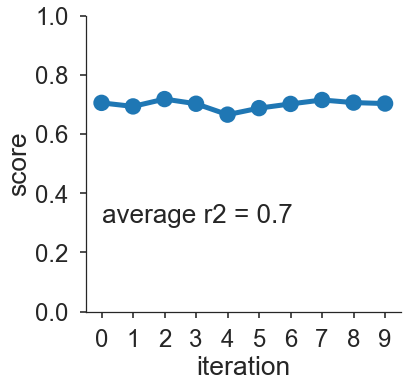

average r2: 0.700647853798
std r2: 0.0150234152126


In [152]:

plt.close()
sns.set_context('poster', font_scale=1.5)
sns.set_style('ticks')
sns.regplot(preds.mean(0), y, fit_reg=False)
plt.xlim(80,122)
plt.ylim(80,122)
plt.xticks(range(80,121,20))
plt.yticks(range(80,121,20))
plt.xlabel('Average predicted position along axis')
plt.ylabel('Actual position along axis')
r2 = np.float16(stats.pearsonr(preds.mean(0), y)[0]**2)
plt.text(81, 117,'r2 = %s'%(float('%.2g' % r2)), fontsize=26)
plt.savefig('/Users/jakevogel/Dropbox/Work/Projects/AHBA_Hippocampus_AP/model_cross_val.pdf', 
            bbox_inches='tight')
plt.show()

jnk = pandas.DataFrame(index = range(cv_strategy), 
                       columns = ['score','iteration'])
jnk.loc[:,'iteration'] = list(range(cv_strategy))
jnk.loc[:,'score'] = score
plt.close()
sns.factorplot(x='iteration',y='score',data=jnk, size=6, aspect=1.1)
plt.yticks([0,0.2,0.4,0.6,0.8,1])
plt.text(0, 0.3,'average r2 = %s'%(float('%.2g' % np.mean(score))), fontsize=26)
plt.show()
print('average r2:',np.mean(score))
print('std r2:', np.std(score,ddof=1))
plt.savefig('/Users/jakevogel/Dropbox/Work/Projects/AHBA_Hippocampus_AP/avg_cross_val.pdf', 
            bbox_inches='tight')

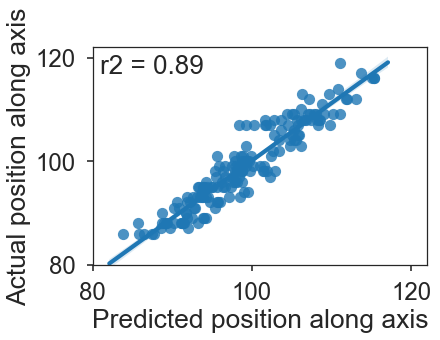

In [155]:
plt.close()
sns.regplot(pcalr_out_NEW['final_model'].predict(pca_tfm),y)
plt.xlim(80,122)
plt.ylim(80,122)
plt.xticks(range(80,121,20))
plt.yticks(range(80,121,20))
plt.xlabel('Predicted position along axis')
plt.ylabel('Actual position along axis')
r2 = np.float16(stats.pearsonr(pcalr_out_NEW['final_model'].predict(pca_tfm), y)[0]**2)
plt.text(81, 117,'r2 = %s'%(float('%.2g' % r2)), fontsize=26)
plt.savefig('/Users/jakevogel/Dropbox/Work/Projects/AHBA_Hippocampus_AP/full_model_fit.pdf', 
          bbox_inches='tight')
plt.show()

In [213]:
in_mtx.loc[sample,gene]

-2.2841113491608147

In [208]:
in_mtx.shape

(170, 58692)

In [240]:
in_mtx = xp.T.values
y = df.position_along_hipp_AP_axis
betas = pcalr_out_NEW['betas']
test_gene_num = [1, 2, 5, 10, 20, 50, 100, 
                200, 500, 1000, 2000, 5000,
                int(1e4), int(2e4), int(3e4), int(4e4), int(5e4)]
illustrative=False
#sanity_check_style = 'models'
sanity_check_style = 'separate'
reverse_axes=True
sns.set_context('poster')

if sanity_check_style == 'separate':
    ascores = []
    pscores = []
else:
    scores = []
print('running sanity_check')
betas = pandas.Series(betas)
outputs = {}
for num in test_gene_num:

    p_chk = betas.sort_values(ascending=False)[:num].index
    a_chk = betas.sort_values(ascending=False)[-num:].index

    pchk_vals = []
    achk_vals = []

    for sample in range(in_mtx.shape[0]):
        to_avg = []
        for gene in p_chk:
            to_avg.append(in_mtx[sample,gene])
        if sanity_check_style == 'model':
            pchk_vals.append(np.mean(np.array(to_avg) * betas.loc[p_chk].values))
        else:
            pchk_vals.append(np.mean(to_avg))

    for sample in range(in_mtx.shape[0]):
        to_avg = []
        for gene in a_chk:
            to_avg.append(in_mtx[sample,gene])
        if sanity_check_style == 'separate':
            achk_vals.append(np.mean(to_avg))
        elif sanity_check_style == 'model':
            achk_vals.append(np.mean(np.array(to_avg) * betas.loc[a_chk].values))
        else:
            achk_vals.append(np.mean(to_avg) * -1)

    if sanity_check_style != 'separate':
        chk_vals = np.array(pchk_vals) + np.array(achk_vals)

    if sanity_check_style == 'separate':
        pr,pp = stats.pearsonr(pchk_vals, y)
        if illustrative:
            plt.close()
            sns.regplot(x=np.array(pchk_vals), y=y, fit_reg=None)
            if reverse_axes:
                plt.xlabel('expression of anterior direction genes')
                plt.ylabel('location along hippocampus (anterior = higher)')
                plt.show()
                print('anterior %s genes vs. y:  r2 = %s, p = %s \n\n'%(num, pr**2, pp))
            else:
                plt.xlabel('expression of posterior direction genes')
                plt.ylabel('location along hippocampus (posterior = higher)')
                plt.show()
                print('posterior %s genes vs. y:  r2 = %s, p = %s \n\n'%(num, pr**2, pp))

        ar,ap = stats.pearsonr(achk_vals, y)
        if illustrative:
            plt.close()
            sns.regplot(x=np.array(achk_vals), y=y, fit_reg=None)
            if reverse_axes:
                plt.xlabel('expression of posterior direction genes')
                plt.ylabel('location along hippocampus (anterior = higher)')
                plt.show()
                print('posterior %s genes vs. y:  r2 = %s, p = %s \n\n'%(num, ar**2, ap))
            else:
                plt.xlabel('expression of anterior direction genes')
                plt.ylabel('location along hippocampus (posterior = higher)')
                plt.show()
                print('anterior %s genes vs. y:  r2 = %s, p = %s \n\n'%(num, ar**2, ap))

    else:
        r,p = stats.pearsonr(chk_vals, y)
        if illustrative:
            plt.close()
            sns.regplot(x=np.array(chk_vals), y=y, fit_reg=None)
            plt.xlabel('expression of A-P axis genes')
            if reverse_axes:
                plt.ylabel('location along hippocampus (anterior = higher)')
            else:
                plt.ylabel('location along hippocampus (posterior = higher)')
            plt.show()
            print('posterior and anterior %s genes vs. y:  r2 = %s, p = %s \n\n'%(
                                                                            num, r**2, p))

    if sanity_check_style == 'separate':
        if reverse_axes:
            ascores.append(pr**2)
            pscores.append(ar**2)
        else:
            ascores.append(ar**2)
            pscores.append(pr**2)
    else:
        scores.append(r**2)
    if reverse_axes:
        outputs.update({'posterior_genes_%s'%num: a_chk}) 
        outputs.update({'anterior_genes_%s'%num: p_chk})
    else:
        outputs.update({'posterior_genes_%s'%num: p_chk}) 
        outputs.update({'anterior_genes_%s'%num: a_chk})


running sanity_check


//anaconda/envs/py3/lib/python3.5/site-packages/seaborn/categorical.py:1460: FutureWarning: remove_na is deprecated and is a private function. Do not use.
  stat_data = remove_na(group_data)


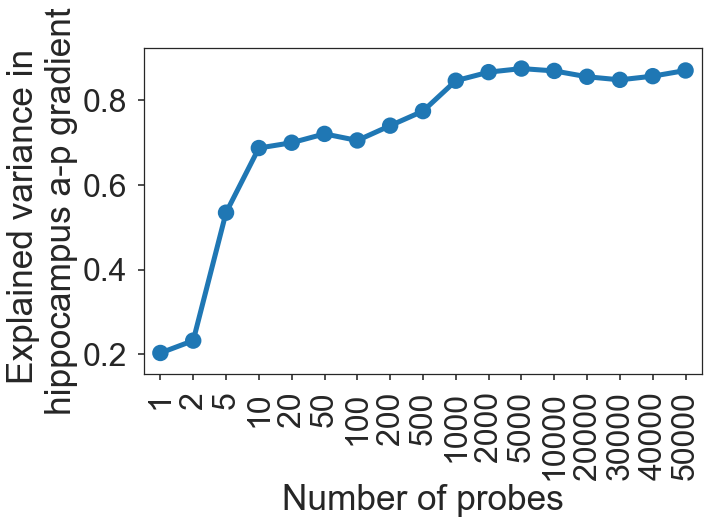

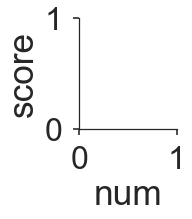

In [238]:

jnk = pandas.concat([pandas.Series(test_gene_num), 
                     pandas.Series(scores)
                    ],axis=1)
jnk.columns = ['num','score']

plt.close()
sns.set_context('poster',font_scale=2)
fig,ax1 = plt.subplots(figsize=(10,6))
sns.factorplot(x='num', y='score', data=jnk, ax=ax1)
ax1.set(xlabel = 'Number of probes', 
        ylabel ='Explained variance in \nhippocampus a-p gradient')
ax1.set_xticklabels(ax1.get_xticklabels(),rotation=90)
jnk=ax1.get_figure()
jnk.savefig(
        '/Users/jakevogel/Dropbox/Work/Projects/AHBA_Hippocampus_AP/gene-variance_chart.pdf',
            bbox_inches='tight')
plt.show()



//anaconda/envs/py3/lib/python3.5/site-packages/seaborn/categorical.py:1460: FutureWarning: remove_na is deprecated and is a private function. Do not use.
  stat_data = remove_na(group_data)


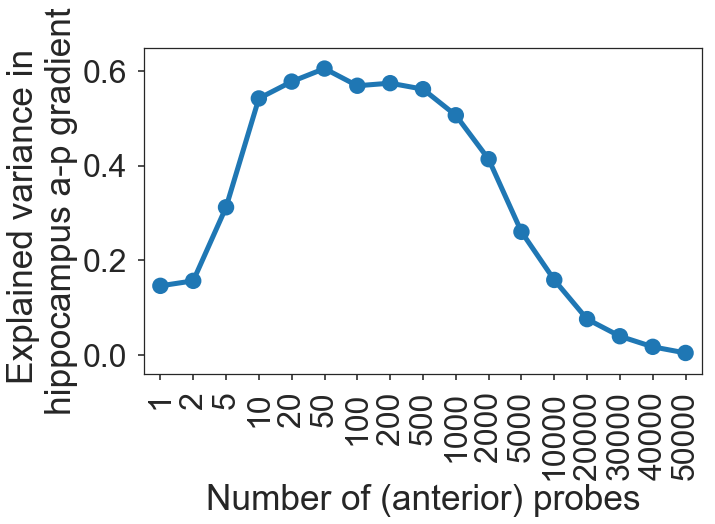

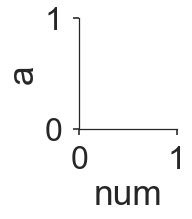

In [263]:
jnk = pandas.concat([pandas.Series(test_gene_num), 
                     pandas.Series(ascores),
                    pandas.Series(pscores)],axis=1)
jnk.columns = ['num','a','p']

plt.close()
sns.set_context('poster',font_scale=2)
#fig,(ax1,ax2) = plt.subplots(2, figsize=(10,6))
fig,ax1 = plt.subplots(1, figsize=(10,6))
sns.factorplot(x='num', y='a', data=jnk, ax=ax1)
ax1.set(xlabel = 'Number of (anterior) probes', 
        ylabel ='Explained variance in \nhippocampus a-p gradient')
ax1.set_xticklabels(ax1.get_xticklabels(),rotation=90)
f=ax1.get_figure()
f.savefig(
        '/Users/jakevogel/Dropbox/Work/Projects/AHBA_Hippocampus_AP/gene-variance_ANT.pdf',
            bbox_inches='tight')
plt.show()

//anaconda/envs/py3/lib/python3.5/site-packages/seaborn/categorical.py:1460: FutureWarning: remove_na is deprecated and is a private function. Do not use.
  stat_data = remove_na(group_data)


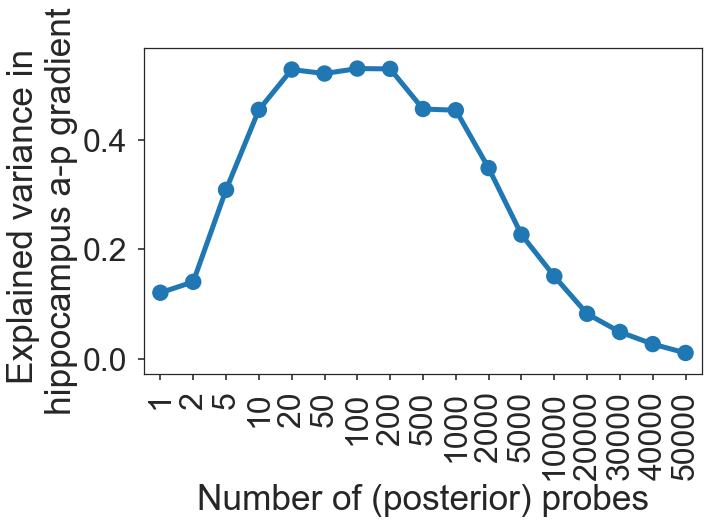

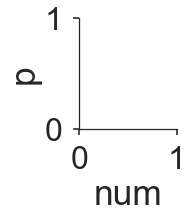

In [265]:
plt.close()
fig,ax2 = plt.subplots(1, figsize=(10,6))
sns.factorplot(x='num', y='p', data=jnk, ax=ax2)
ax2.set(xlabel = 'Number of (posterior) probes', 
        ylabel ='Explained variance in \nhippocampus a-p gradient')

ax2.set_xticklabels(ax1.get_xticklabels(),rotation=90)
f=ax2.get_figure()
f.savefig(
        '/Users/jakevogel/Dropbox/Work/Projects/AHBA_Hippocampus_AP/gene-variance_POST.pdf',
            bbox_inches='tight')
plt.show()

Making ready for figures...

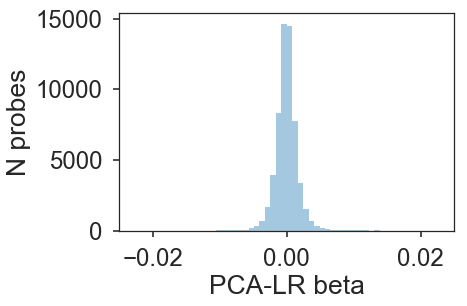

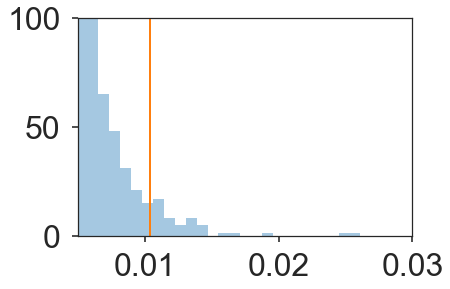

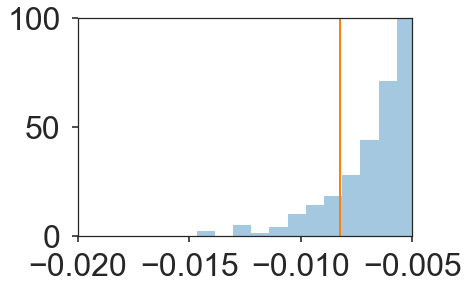

In [239]:

plt.close()
sns.set_context('poster',font_scale=1.5)
sns.distplot(pcalr_out_NEW['betas'],kde=False)
plt.xlim(-0.025,0.025)
plt.xlabel('PCA-LR beta')
plt.ylabel('N probes')
plt.savefig('/Users/jakevogel/Dropbox/Work/Projects/AHBA_Hippocampus_AP/BetaDist.pdf',
           bbox_inches = 'tight')
plt.show()

plt.close()
sns.set_context('poster',font_scale=2)
sns.distplot(pcalr_out_NEW['betas'],kde=False)
plt.xlim(0.005,0.030)
plt.ylim(0,100)
xval = sorted(pcalr_out_NEW['betas'])[-50]
plt.plot([xval, xval], [0, 100], linewidth=2)
plt.savefig('/Users/jakevogel/Dropbox/Work/Projects/AHBA_Hippocampus_AP/BetaDistL.pdf',
           bbox_inches='tight')
plt.show()

plt.close()
sns.set_context('poster',font_scale=2)
sns.distplot(pcalr_out_NEW['betas'],kde=False)
plt.xlim(-0.02,-0.005)
plt.xticks([-0.02, -0.015, -0.01, -0.005])
plt.ylim(0,100)
xval = sorted(pcalr_out_NEW['betas'])[50]
plt.plot([xval, xval], [0, 100], linewidth=2)
plt.savefig('/Users/jakevogel/Dropbox/Work/Projects/AHBA_Hippocampus_AP/BetaDistR.pdf',
           bbox_inches='tight')
plt.show()

In [188]:
sorted(pcalr_out_NEW['betas'])[50]

-0.0082333457509253822

In [276]:
df.loc[:,'bilateral_structure_name'] = [x.split(',')[0] for x in df.structure_name.values]
df.bilateral_structure_name.head()

0        CA1 field
1        CA2 field
2        CA3 field
3        CA4 field
4    dentate gyrus
Name: bilateral_structure_name, dtype: object

In [277]:
df.loc[:,'bigdf_index'] = df.index
df.index = df.basic_idx

AttributeError: 'DataFrame' object has no attribute 'basic_idx'

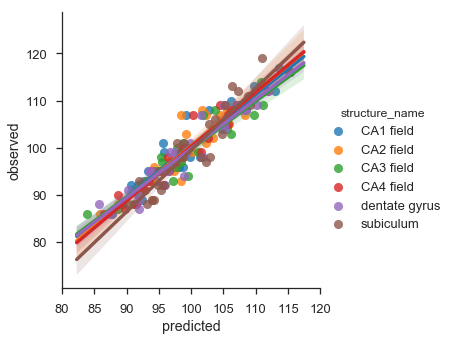

In [278]:
sns.set_context('talk')
sns.set_style('ticks')
pca_tfm = pcalr_out_NEW['pca_object'].transform(xp.values.T)
predicted = pcalr_out_NEW['final_model'].predict(pca_tfm)
jnk = pandas.concat([pandas.Series(predicted),
                     df.position_along_hipp_AP_axis,
                    df.bilateral_structure_name], axis=1)
jnk.columns = ['predicted','observed','structure_name']
plt.close()
sns.lmplot(x='predicted', y='observed', hue='structure_name', data=jnk)
plt.xticks(range(80,125,5))
plt.show()

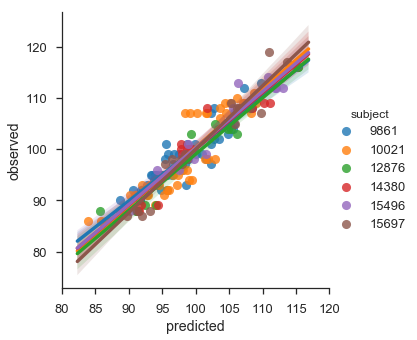

In [279]:
sns.set_context('talk')
sns.set_style('ticks')
pca_tfm = pcalr_out_NEW['pca_object'].transform(xp.values.T)
predicted = pcalr_out_NEW['final_model'].predict(pca_tfm)
jnk = pandas.concat([pandas.Series(predicted),
                     df.position_along_hipp_AP_axis,
                    df['donor']], axis=1)
jnk.columns = ['predicted','observed','subject']
plt.close()
sns.lmplot(x='predicted', y='observed', hue='subject', data=jnk)
plt.xticks(range(80,125,5))
plt.show()

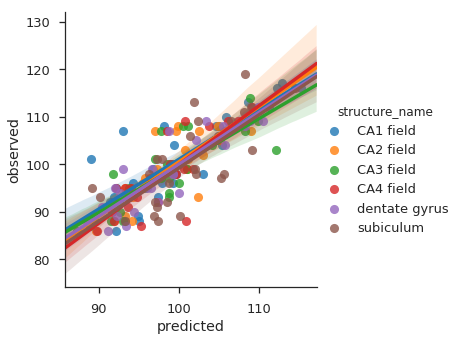

0.675885977482


In [142]:
predicted = model_selection.cross_val_predict(linear_model.LassoCV(random_state = 123), 
                                              pca_tfm, df.position_along_hipp_AP_axis, 
                                              cv=10)
jnk = pandas.concat([pandas.Series(predicted),
                     df.position_along_hipp_AP_axis,
                    df.bilateral_structure_name], axis=1)
jnk.columns = ['predicted','observed','structure_name']
plt.close()
sns.lmplot(x='predicted', y='observed', hue='structure_name', data=jnk)
plt.show()
print(stats.pearsonr(jnk.observed, jnk.predicted)[0]**2)

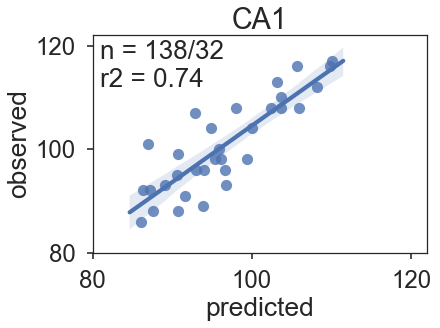

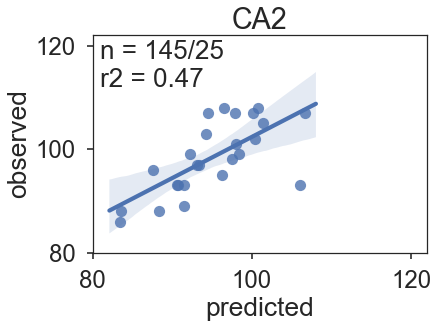

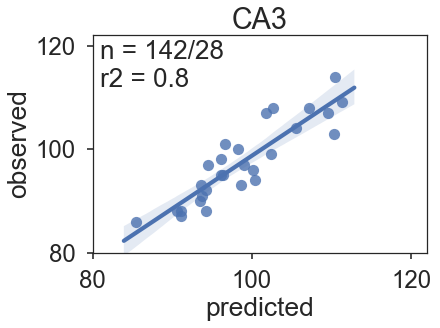

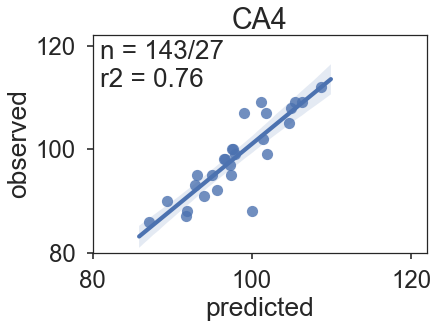

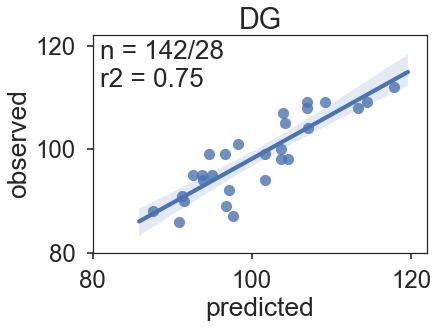

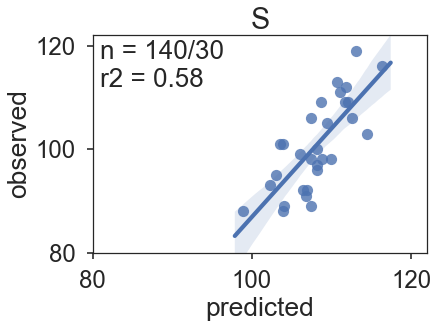

In [333]:
# LEAVE-ONE-SUBFIELD-OUT
# LEAVE ONE SUBFIELD OUT


te_ids = []
predz = []
clf = linear_model.LassoCV(random_state = 123)
for i,subfield in enumerate(df.structure_acronym.unique()):
    Tr_samps = df[df.structure_acronym!=subfield].index
    Te_samps = df[df.structure_acronym==subfield].index
    nX = len(Te_samps)
    nT = len(Tr_samps)
    X = pca_tfm[Tr_samps,:]
    y = df.loc[Tr_samps,'position_along_hipp_AP_axis']
    mod = clf.fit(X,y)
    pred = mod.predict(pca_tfm[Te_samps,:])
    
    plt.close()
    #sns.set(font_scale = 2)
    sns.set_context('poster', font_scale=1.5)
    sns.set_style('ticks')
    sns.regplot(pred, df.loc[Te_samps,'position_along_hipp_AP_axis'].values)
    plt.title(subfield)
    plt.xlim(80,122)
    plt.ylim(80,122)
    plt.xticks(range(80,121,20))
    plt.yticks(range(80,121,20))
    plt.xlabel('predicted')
    plt.ylabel('observed')
    r2 = np.float16(stats.pearsonr(pred, df.loc[Te_samps,'position_along_hipp_AP_axis'].values
                                  )[0]**2)
    plt.text(81, 112,'n = %s/%s\nr2 = %s'%(nT,nX,float('%.2g' % r2)), fontsize=26)
    plt.savefig('/Users/jakevogel/Dropbox/Work/Projects/AHBA_Hippocampus_AP/LOSO_%s.pdf'%subfield, 
                bbox_inches='tight')
    plt.show()

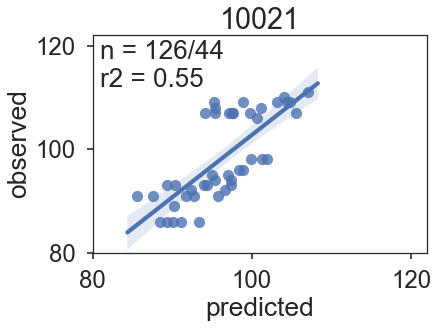

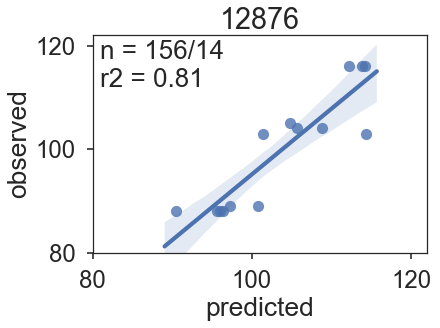

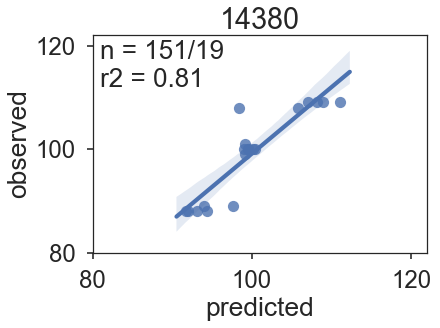

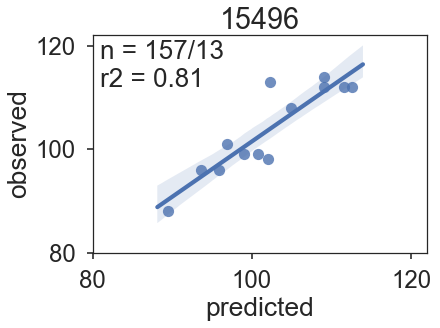

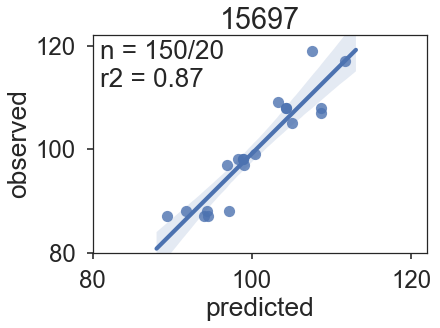

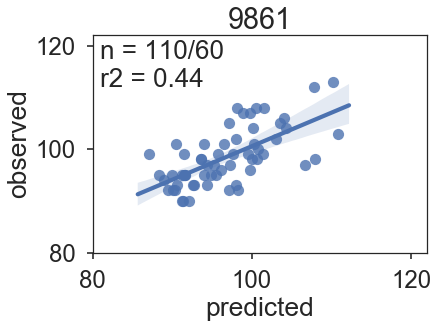

In [334]:
# LEAVE ONE SUBJECT OUT

te_ids = []
predz = []
clf = linear_model.LassoCV(random_state = 123)
for i,subject in enumerate(df['donor'].unique()):
    Tr_samps =  df[df['donor']!=subject].index
    Te_samps = df[df['donor']==subject].index
    X = pca_tfm[Tr_samps,:]
    nX = len(Te_samps)
    nT = len(Tr_samps)
    y = df.loc[Tr_samps,'position_along_hipp_AP_axis']
    mod = clf.fit(X,y)
    pred = mod.predict(pca_tfm[Te_samps,:])
    
    plt.close()
    #sns.set(font_scale = 2)
    sns.set_context('poster', font_scale=1.5)
    sns.set_style('ticks')
    sns.regplot(pred, df.loc[Te_samps,'position_along_hipp_AP_axis'].values)
    plt.title(subject)
    plt.xlim(80,122)
    plt.ylim(80,122)
    plt.xticks(range(80,121,20))
    plt.yticks(range(80,121,20))
    plt.xlabel('predicted')
    plt.ylabel('observed')
    r2 = np.float16(stats.pearsonr(pred, df.loc[Te_samps,'position_along_hipp_AP_axis'].values
                                  )[0]**2)
    plt.text(81, 112,'n = %s/%s\nr2 = %s'%(nT,nX,float('%.2g' % r2)), fontsize=26)
    plt.savefig('/Users/jakevogel/Dropbox/Work/Projects/AHBA_Hippocampus_AP/LOSubO_%s.pdf'%subject, 
                bbox_inches='tight')
    plt.show()

In [ ]:
# LEAVE ONE SUBJECT OUT

te_ids = []
predz = []
clf = linear_model.LassoCV(random_state = 123)
for i,subject in enumerate(df['donor'].unique()):
    Tr_samps =  df[df['donor']!=subject].index
    Te_samps = df[df['donor']==subject].index
    X = pca_tfm[Tr_samps,:]
    nX = len(Te_samps)
    nT = len(Tr_samps)
    y = df.loc[Tr_samps,'position_along_hipp_AP_axis']
    mod = clf.fit(X,y)
    pred = mod.predict(pca_tfm[Te_samps,:])
    
    plt.close()
    #sns.set(font_scale = 2)
    sns.set_context('poster', font_scale=1.5)
    sns.set_style('ticks')
    sns.regplot(pred, df.loc[Te_samps,'position_along_hipp_AP_axis'].values)
    plt.title(subject)
    plt.xlim(80,122)
    plt.ylim(80,122)
    plt.xticks(range(80,121,20))
    plt.yticks(range(80,121,20))
    plt.xlabel('predicted')
    plt.ylabel('observed')
    r2 = np.float16(stats.pearsonr(pred, df.loc[Te_samps,'position_along_hipp_AP_axis'].values
                                  )[0]**2)
    plt.text(81, 112,'n = %s/%s\nr2 = %s'%(nT,nX,float('%.2g' % r2)), fontsize=26)
    plt.savefig('/Users/jakevogel/Dropbox/Work/Projects/AHBA_Hippocampus_AP/LOSubO_%s.pdf'%subject, 
                bbox_inches='tight')
    plt.show()

performing model cross-validation
model cv score: r2 =  0.683122988007
running final model
final model fit r2 =  0.753654391585
running sanity_check
posterior 1 genes vs. y:  r2 = 0.446002455241, p = 2.6032211812e-23 


anterior 1 genes vs. y:  r2 = 0.24035463409, p = 1.15290738796e-11 


posterior 2 genes vs. y:  r2 = 0.515931868699, p = 2.89816535039e-28 


anterior 2 genes vs. y:  r2 = 0.239490920682, p = 1.27056182384e-11 


posterior 5 genes vs. y:  r2 = 0.605248194838, p = 9.71064668955e-36 


anterior 5 genes vs. y:  r2 = 0.321748266788, p = 7.35339558721e-16 


posterior 10 genes vs. y:  r2 = 0.604763385956, p = 1.07694779731e-35 


anterior 10 genes vs. y:  r2 = 0.396868361378, p = 3.46842986903e-20 


posterior 20 genes vs. y:  r2 = 0.378216940098, p = 4.58491169552e-19 


anterior 20 genes vs. y:  r2 = 0.308636594726, p = 3.74717949023e-15 


posterior 50 genes vs. y:  r2 = 0.0874754350363, p = 9.01085676934e-05 


anterior 50 genes vs. y:  r2 = 0.125292691065, p = 2.1869402

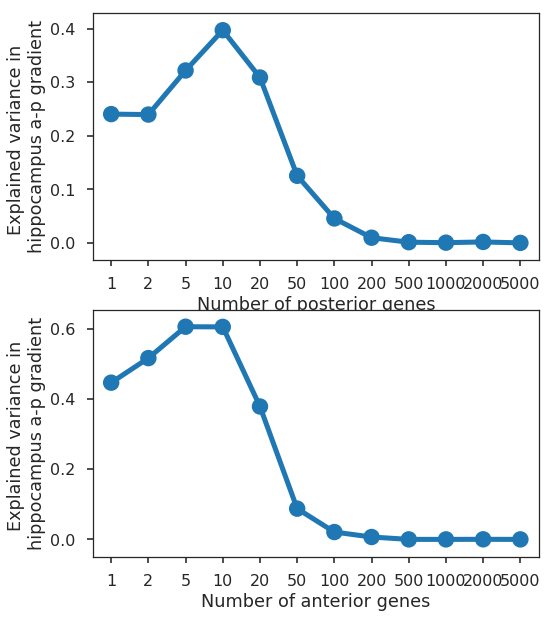

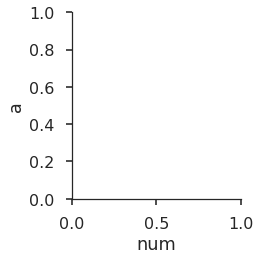

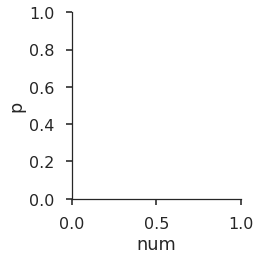

In [149]:
# JUST FOR THE FUCK OF IT, LETS TRY IT WITH LARS
pcalr_out_NEW_LARS = PCA_LR_pipeline(xp.values.T, 
                            (df.position_along_hipp_AP_axis),
                              pca=None, clf = linear_model.LassoLarsCV(),
                            cv_strategy='score', illustrative=False,
                           test_gene_num = [1, 2, 5, 10, 20, 50, 100, 
                                            200, 500, 1000, 2000, 5000] )

In [194]:
probes.loc[pcalr_out_NEW['gene_selections']['anterior_genes_50']]['gene_symbol'].tolist()

['SERPINF1',
 'SERPINF1',
 'KLK7',
 'RSPH9',
 'KLK7',
 'LYPD1',
 'GABRQ',
 'PYDC1',
 'SYTL2',
 'RP13-102H20.1',
 'SYTL2',
 'SSTR1',
 'LXN',
 'TMEM215',
 'SYTL2',
 'C1QL1',
 'PIRT',
 'KCNG1',
 'AQP3',
 'A_23_P213527',
 'RP11-45B20.3',
 'C1orf187',
 'GPR39',
 'OPRK1',
 'CD36',
 'AQP3',
 'KLK7',
 'MYB',
 'GPR26',
 'LMO1',
 'GPR88',
 'VGLL3',
 'NR2F2',
 'NR2F2',
 'NR2F2',
 'GPR83',
 'GDA',
 'NRG1',
 'RSPO2',
 'A_32_P136776',
 'C20orf103',
 'SYTL1',
 'LGALS2',
 'LXN',
 'GPR26',
 'KIAA1772',
 'A_32_P115840',
 'GDA',
 'SEMA3D',
 'NRG1']

In [16]:
probes.loc[pcalr_out_NEW['gene_selections']['posterior_genes_50']]['gene_symbol'].tolist()[::-1]

['NPNT',
 'NPNT',
 'TTR',
 'A_32_P11262',
 'BDKRB1',
 'SERTAD4',
 'NTN1',
 'HHIP',
 'HHIP',
 'RP11-561O23.6',
 'GRHL2',
 'RGMA',
 'BDKRB1',
 'BNC2',
 'TPBG',
 'OSBPL3',
 'NTN1',
 'ONECUT2',
 'COL5A2',
 'RP11-291L15.2',
 'FSTL4',
 'C1orf133',
 'DGKI',
 'DDC',
 'A_24_P401842',
 'A_32_P121537',
 'TNNT2',
 'FSTL4',
 'TTR',
 'HPSE2',
 'DDC',
 'DDC',
 'COL5A2',
 'WNT10A',
 'CASR',
 'DDC',
 'PVALB',
 'A_24_P62668',
 'FAM43B',
 'CTXN3',
 'DDC',
 'HPSE2',
 'GAL',
 'GREM2',
 'KDELR3',
 'COL5A2',
 'PDLIM5',
 'ONECUT2',
 'A_24_P102119',
 'GAL']

In [40]:
#g = pandas.ExcelFile('/Users/jakevogel/Science/AHBA/Top100_GeneHits.xlsx').parse('Sheet1')
g = pandas.ExcelFile('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/other_studies/Top100_GeneHits.xlsx'
                    ).parse('Sheet1')
g.head()

,Post,Orig_P,Ant,Orig_A
0,NPNT,NaN,SERPINF1,NaN
1,NPNT,NaN,SERPINF1,NaN
2,TTR,NaN,KLK7,NaN
3,HHIP,A_32_P11262,RSPH9,NaN
4,BDKRB1,NaN,KLK7,NaN


In [41]:
len(g.Post.tolist()) - len(g.Post.unique())

20

In [42]:
len(g.Ant.tolist()) - len(g.Ant.unique())

14

In [43]:
# MAKE TABLE FOR OVERLEAF
p50 = probes.loc[pcalr_out_NEW['gene_selections']['posterior_genes_50']][['probe_id',
                                                                    'gene_symbol',
                                                                   'gene_name']]
p50.loc[:,'beta'] = sorted(pcalr_out_NEW['betas'])[:50][::-1]
a50 = probes.loc[pcalr_out_NEW['gene_selections']['anterior_genes_50']][['probe_id',
                                                                    'gene_symbol',
                                                                   'gene_name']]
a50.loc[:,'beta'] = sorted(pcalr_out_NEW['betas'])[-50:][::-1]
gene_table = pandas.concat([a50,p50])
gene_table

,probe_id,gene_symbol,gene_name,beta
4418,1053204,SERPINF1,"serpin peptidase inhibitor, clade F (alpha-2 a...",0.026119
4417,1053205,SERPINF1,"serpin peptidase inhibitor, clade F (alpha-2 a...",0.025298
25772,1030761,KLK7,kallikrein-related peptidase 7,0.019348
23274,1033144,RSPH9,radial spoke head 9 homolog (Chlamydomonas),0.016976
25771,1030762,KLK7,kallikrein-related peptidase 7,0.016178
20529,1036045,LYPD1,LY6/PLAUR domain containing 1,0.014526
15471,1041466,GABRQ,"gamma-aminobutyric acid (GABA) A receptor, theta",0.014374
24685,1032692,PYDC1,PYD (pyrin domain) containing 1,0.014255
14245,1042620,SYTL2,synaptotagmin-like 2,0.013917
22478,1034086,RP13-102H20.1,Rho GTPase activating protein 36,0.013885


In [44]:
for i,ind in enumerate(gene_table.index[:50]):
    if pandas.notnull(g.loc[g.index[i],'Orig_A']):
        nname = probes[probes.gene_symbol==g.loc[i,'Ant']]['gene_name'].values
        if len(nname)>0:
            gene_table.loc[ind,'gene_symbol'] = g.loc[i,'Ant']
            gene_table.loc[ind,'gene_name'] = nname[0]
for i,ind in enumerate(gene_table.sort_values('beta',ascending=True).index[:50]):
    if pandas.notnull(g.loc[g.index[i],'Orig_P']):
        nname = probes[probes.gene_symbol==g.loc[i,'Post']]['gene_name'].values
        if len(nname)>0:
            gene_table.loc[ind,'gene_symbol'] = g.loc[i,'Post']
            gene_table.loc[ind,'gene_name'] = nname[0]

In [45]:
gene_table.head(10)

,probe_id,gene_symbol,gene_name,beta
4418,1053204,SERPINF1,"serpin peptidase inhibitor, clade F (alpha-2 a...",0.026119
4417,1053205,SERPINF1,"serpin peptidase inhibitor, clade F (alpha-2 a...",0.025298
25772,1030761,KLK7,kallikrein-related peptidase 7,0.019348
23274,1033144,RSPH9,radial spoke head 9 homolog (Chlamydomonas),0.016976
25771,1030762,KLK7,kallikrein-related peptidase 7,0.016178
20529,1036045,LYPD1,LY6/PLAUR domain containing 1,0.014526
15471,1041466,GABRQ,"gamma-aminobutyric acid (GABA) A receptor, theta",0.014374
24685,1032692,PYDC1,PYD (pyrin domain) containing 1,0.014255
14245,1042620,SYTL2,synaptotagmin-like 2,0.013917
22478,1034086,RP13-102H20.1,Rho GTPase activating protein 36,0.013885


In [51]:
gene_table.sort_values('beta').head()

,probe_id,gene_symbol,gene_name,beta,short_beta
32889,1023030,NPNT,nephronectin,-0.014675,-0.0147
32888,1023031,NPNT,nephronectin,-0.014107,-0.0141
6582,1050553,TTR,transthyretin,-0.012919,-0.0129
51664,1064147,HHIP,hedgehog interacting protein,-0.012902,-0.0129
44200,1058844,BDKRB1,bradykinin receptor B1,-0.012402,-0.0124


In [50]:
gene_table.loc[:,'short_beta'] = ['%.4f'%x for x in gene_table.beta.values]

In [55]:
len('hedgehog interacting protein')

28

In [ ]:
        cnt = 0
        while cnt < (len(func) / 2):
            for i,part in enumerate(parts):
                cnt += (len(part) + 1) # +1 for underscore
        p1,p2 = '',''
        for x in range(i-1):
            p1 += '%s '%parts[x]
        for x in range(i-1,len(parts)):
            p2 += '%s '%parts[x]
        newstr = '%s\n%s'%(p1,p2)
        newstr = newstr[3:]
    else:
        newstr = func.replace('_',' ')[3:]
    print(newstr)

In [70]:
string = gene_table.gene_name.values[0]
parts = string.split(' ')
parts
cnt = 0
print(len(string) / 2)
i=0
while cnt < (len(string) / 2):
    part = parts[i]
#    for i,part in enumerate(parts):
    cnt += (len(part) + 1)
    i+=1
    print(part,cnt, cnt<(len(string)/2))
p1,p2 = '',''
for x in range(i-1):
    p1 += '%s '%parts[x]
print(p1)
for x in range(i-1,len(parts)):
    p2 += '%s '%parts[x]
print(p2)

51.0
serpin 7 True
peptidase 17 True
inhibitor, 28 True
clade 34 True
F 36 True
(alpha-2 45 True
antiplasmin, 58 False
serpin peptidase inhibitor, clade F (alpha-2 
antiplasmin, pigment epithelium derived factor), member 1 


In [76]:
len('Rho GTPase \\activating protein 36 ' )

34

In [84]:
n_names = []
for string in gene_table.gene_name.values:
    if len(string) > 35:
        parts = string.split(' ')
        cnt = 0
        i = 0
        while cnt < (len(string) / 2):
            part = parts[i]
            cnt += (len(part) + 1)
            i += 1
        p1,p2 = '',''
        for x in range(i-1):
            p1 += '%s '%parts[x]
        for x in range(i-1,len(parts)):
            p2 += '%s '%parts[x]
        newstr = '%s\\\\%s'%(p1,p2)
    else:
        newstr = string
    n_names.append(newstr)
gene_table.loc[:,'n_name'] = n_names          

In [90]:
cols = ['probe_id','gene_symbol','n_name','short_beta']
for i,row in gene_table.loc[gene_table.index[-50:]].sort_values('beta')[cols].iterrows():
    line = '\\makecell{%s} '%row[0]
    for item in row[1:]:
        line += '& \makecell{%s} '%item
    line += "\\\\"
    print(line)

\makecell{1023030} & \makecell{NPNT} & \makecell{nephronectin} & \makecell{-0.0147} \\
\makecell{1023031} & \makecell{NPNT} & \makecell{nephronectin} & \makecell{-0.0141} \\
\makecell{1050553} & \makecell{TTR} & \makecell{transthyretin} & \makecell{-0.0129} \\
\makecell{1064147} & \makecell{HHIP} & \makecell{hedgehog interacting protein} & \makecell{-0.0129} \\
\makecell{1058844} & \makecell{BDKRB1} & \makecell{bradykinin receptor B1} & \makecell{-0.0124} \\
\makecell{1041274} & \makecell{SERTAD4} & \makecell{SERTA domain containing 4} & \makecell{-0.0123} \\
\makecell{1048608} & \makecell{NTN1} & \makecell{netrin 1} & \makecell{-0.0122} \\
\makecell{1039873} & \makecell{HHIP} & \makecell{hedgehog interacting protein} & \makecell{-0.0119} \\
\makecell{1039872} & \makecell{HHIP} & \makecell{hedgehog interacting protein} & \makecell{-0.0111} \\
\makecell{1017013} & \makecell{PGM5} & \makecell{phosphoglucomutase 5} & \makecell{-0.0110} \\
\makecell{1038748} & \makecell{GRHL2} & \makecell{

In [100]:
for i,row in gene_table.sort_values('beta', ascending=False)[cols].iterrows():
    line = '\\makecell{%s} '%row[0]
    for item in row[1:]:
        line += '& \makecell{%s} '%item
    line += "\\\\"
    print(line)

\makecell{1053204} & \makecell{SERPINF1} & \makecell{serpin peptidase inhibitor, clade F (alpha-2 \\antiplasmin, pigment epithelium derived factor), member 1 } & \makecell{0.0261} \\
\makecell{1053205} & \makecell{SERPINF1} & \makecell{serpin peptidase inhibitor, clade F (alpha-2 \\antiplasmin, pigment epithelium derived factor), member 1 } & \makecell{0.0253} \\
\makecell{1030761} & \makecell{KLK7} & \makecell{kallikrein-related peptidase 7} & \makecell{0.0193} \\
\makecell{1033144} & \makecell{RSPH9} & \makecell{radial spoke head 9 \\homolog (Chlamydomonas) } & \makecell{0.0170} \\
\makecell{1030762} & \makecell{KLK7} & \makecell{kallikrein-related peptidase 7} & \makecell{0.0162} \\
\makecell{1036045} & \makecell{LYPD1} & \makecell{LY6/PLAUR domain containing 1} & \makecell{0.0145} \\
\makecell{1041466} & \makecell{GABRQ} & \makecell{gamma-aminobutyric \\acid (GABA) A receptor, theta } & \makecell{0.0144} \\
\makecell{1032692} & \makecell{PYDC1} & \makecell{PYD (pyrin domain) contai

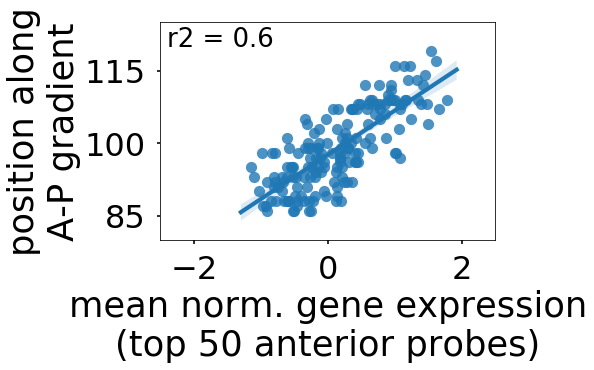

In [59]:
plt.close()
sns.set_context('poster',font_scale=2)
r2 = stats.pearsonr(xp.loc[pcalr_out_NEW['gene_selections']['anterior_genes_50']].mean(),
                    df.position_along_hipp_AP_axis)[0]**2
sns.regplot(xp.loc[pcalr_out_NEW['gene_selections']['anterior_genes_50']].mean(),
            df.position_along_hipp_AP_axis)
plt.xlabel('mean norm. gene expression\n(top 50 anterior probes)')
plt.ylabel('position along\nA-P gradient')
plt.xlim(-2.5,2.5)
plt.xticks([-2,0,2])
plt.ylim(80,125)
plt.yticks([85,100,115])
plt.text(-2.4, 120,'r2 = %s'%float('%.2g'%r2), fontsize=26)
plt.savefig('/Users/jakevogel/Dropbox/Work/Projects/AHBA_Hippocampus_AP/ant50_position.pdf',
           bbox_inches='tight')
plt.show()

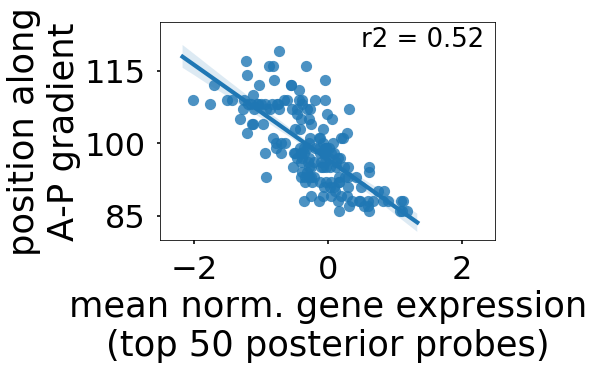

In [64]:
plt.close()
r2 = stats.pearsonr(xp.loc[pcalr_out_NEW['gene_selections']['posterior_genes_50']].mean(),
                    df.position_along_hipp_AP_axis)[0]**2
sns.regplot(xp.loc[pcalr_out_NEW['gene_selections']['posterior_genes_50']].mean(),
            df.position_along_hipp_AP_axis)
plt.xlabel('mean norm. gene expression\n(top 50 posterior probes)')
plt.ylabel('position along\nA-P gradient')
plt.xlim(-2.5,2.5)
plt.xticks([-2,0,2])
plt.ylim(80,125)
plt.yticks([85,100,115])
plt.text(0.5, 120,'r2 = %s'%float('%.2g'%r2), fontsize=26)
plt.savefig('/Users/jakevogel/Dropbox/Work/Projects/AHBA_Hippocampus_AP/post50_position.pdf',
           bbox_inches='tight')
plt.show()

### Other studies

In [190]:
sheet = '/Users/jakevogel/Dropbox/Work/Projects/AHBA_Hippocampus_AP/Lee_2017_TableS2.xlsx'
jnk = pandas.ExcelFile(sheet)
Lee_dors = pandas.ExcelFile(sheet).parse(jnk.sheet_names[0])
Lee_dors.columns = Lee_dors.loc[1]
Lee_dors.drop(Lee_dors.index[:2],inplace=True)
Lee_vent = pandas.ExcelFile(sheet).parse(jnk.sheet_names[1])
Lee_vent.columns = Lee_vent.loc[1]
Lee_vent.drop(Lee_vent.index[:2],inplace=True)

In [204]:
all_overlap = [x for x in Lee_dors.gene_symbol.values if x.upper() in gene_table.gene_symbol.values
              ] + [x for x in Lee_vent.gene_symbol.values if x.upper() in gene_table.gene_symbol.values]

In [74]:
OS_summary = pandas.DataFrame(index=['Lee'],
                              columns=['N','N_in_AHBA','overlap','probability',
                                       'perc','v_avg','d_avg','v_null','d_null'])

In [205]:
OS_summary.loc['Lee','overlap'] = len(all_overlap)
OS_summary.loc['Lee','N'] = len(Lee_vent) + len(Lee_dors)
jnk = probes.gene_symbol.unique()
OS_summary.loc['Lee','N_in_AHBA'] = len([x for x in Lee_dors.gene_symbol if x.upper() in jnk]
                                       ) + len([x for x in Lee_vent.gene_symbol if x.upper() in jnk])
OS_summary.loc['Lee','perc'] = len(all_overlap) / len(gene_table.gene_symbol.unique())

In [82]:
Cembr = pandas.ExcelFile('/Users/jakevogel/Dropbox/Work/Projects/AHBA_Hippocampus_AP/Cembrowski_2013_Table.xls'
                        ).parse('tableS2R1.txt')
Cembr.head()

,enrichedRegion,depletedRegion,geneShortName,geneId,enrichedFpkm,depletedFpkm,enrichmentFold
0,dorsal,ventral,Scn4b,ENSMUSG00000046480,10.5906,0.000000,inf
1,dorsal,ventral,Lct,ENSMUSG00000026354,21.5010,0.046872,458.714422
2,dorsal,ventral,Olfm3,ENSMUSG00000027965,20.3472,0.305437,66.616684
3,dorsal,ventral,Gm10800,ENSMUSG00000075014,30.6210,0.557849,54.891198
4,dorsal,ventral,Gm16869,ENSMUSG00000087580,11.3983,0.222871,51.143038


In [206]:
for i,row in Cembr.iterrows():
    if str(row['geneShortName']).upper() in [x.upper() for x in gene_table.loc[gene_table.index[-50:]
                                                                        ].gene_symbol]:
        print(row)
        all_overlap.append(row['geneShortName'])

enrichedRegion                dorsal
depletedRegion               ventral
geneShortName                Sertad4
geneId            ENSMUSG00000016262
enrichedFpkm                 23.8722
depletedFpkm                 6.39223
enrichmentFold               3.73457
Name: 62, dtype: object


In [97]:
238/len(jnk)

0.00816999073152312

In [90]:
C_dors = [str(x).upper() for x in Cembr[Cembr.enrichedRegion=='dorsal'].geneShortName.values]
pcalr_out_NEW['betas'][probes[probes.gene_symbol.isin(C_dors)].index].mean()

-0.00077764921313931289

In [92]:
C_vent = [str(x).upper() for x in Cembr[Cembr.enrichedRegion=='ventral'].geneShortName.values]
pcalr_out_NEW['betas'][probes[probes.gene_symbol.isin(C_vent)].index].mean()

0.00065406307687099522

In [152]:
OS_summary.loc['Cembr2013','overlap'] = 1
OS_summary.loc['Cembr2013','N'] = len(Cembr)
jnk = probes.gene_symbol.unique()
OS_summary.loc['Cembr2013','N_in_AHBA'] = len([x for x in Cembr.geneShortName if str(x).upper() in jnk
                                              ])
OS_summary.loc['Cembr2013','perc'] = 1 / len(gene_table.gene_symbol.unique())
OS_summary.loc['Cembr2013','v_avg'] = pcalr_out_NEW['betas'
                                                   ][probes[probes.gene_symbol.isin(C_vent)].index].mean()
OS_summary.loc['Cembr2013','d_avg'] = pcalr_out_NEW['betas'
                                                   ][probes[probes.gene_symbol.isin(C_dors)].index].mean()

In [94]:
OS_summary.head()

,N,N_in_AHBA,overlap,probability,v_avg,d_avg,v_null,d_null,perc
Lee,264.0,247.0,21.0,NaN,NaN,NaN,NaN,NaN,0.318182
Cembr2013,279.0,238.0,1.0,NaN,0.000654063,-0.000777649,NaN,NaN,0.015152


In [16]:
Leo = pandas.ExcelFile('/Users/jakevogel/Dropbox/Work/Projects/AHBA_Hippocampus_AP/Leonardo_2006_Table.xls'
                     ).parse('Sheet1')
Leo.drop(Leo.index[0],inplace=True)

In [129]:
jnk = [x.lower() for x in probes.gene_name.unique()]
dir_match = [x for x in Leo.Name.unique() if str(x).lower() in jnk]


In [131]:
matchdf = Leo[Leo.Name.isin(dir_match)]
medf = probes[probes.gene_name.isin(dir_match)]

In [135]:
pcalr_out_NEW['betas'][medf[medf.gene_name==dir_match[0]].index].mean()

-0.011166134321553075

In [137]:
Leo.columns

Index(['Probe Set Name', 'Name', 'Identifier', 'Description', 'Cortex - 13',
       'Cortex - 1', 'Cortex - 7', 'Dorsal CA1 - 14', 'Dorsal CA1 - 2',
       'Dorsal CA1 - 8', 'Ventral CA1 - 11', 'Ventral CA1 - 17',
       'Ventral CA1 - 5', 'Cortex avg', 'Dorsal CA1 avg', 'Ventral CA1 avg',
       'Cortex #Present', 'Dorsal #Present', 'Ventral #Present ',
       'V/D Fold change', 'V/C Fold change', 'D/C Fold change'],
      dtype='object')

In [145]:
medf.loc[:,'nname'] = [x.lower() for x in medf.gene_name.values]
compdf = pandas.DataFrame(index=dir_match,columns=['Vogel','Leonardo'])
for gene in dir_match:
    compdf.loc[gene,'Vogel'] = pcalr_out_NEW['betas'][medf[medf.nname==gene.lower()].index
                                                     ].mean()
    compdf.loc[gene,'Leonardo'] = matchdf[matchdf.Name==gene]['V/D Fold change'].mean()

//anaconda/envs/py3/lib/python3.5/site-packages/pandas/core/indexing.py:537: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s
//anaconda/envs/py3/lib/python3.5/site-packages/ipykernel/__main__.py:4: RuntimeWarning: Mean of empty slice.
//anaconda/envs/py3/lib/python3.5/site-packages/numpy/core/_methods.py:80: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


In [18]:
import difflib

In [160]:
difflib.get_close_matches?

In [38]:
jnk = probes.gene_name.unique()
Leo.loc[:,'match'] = [np.nan for x in range(len(Leo))]
for i,row in Leo[Leo['V/D Fold change']<-2].iterrows():
    x = row['Name']
    if x in jnk:
        Leo.loc[Leo.index[i],'match'] = x
    else:
        lst = difflib.get_close_matches(x,jnk)
        print(x,lst)
        answer = input('Which one?')
        if answer.isnumeric():
            Leo.loc[Leo.index[i],'match'] = lst[int(answer)]

ESTs, Weakly similar to  klotho [Mus musculus] [M.musculus] []
Which one?n
aldehyde dehydrogenase family 1, subfamily A1 ['aldehyde dehydrogenase 9 family, member A1', 'aldehyde dehydrogenase 8 family, member A1', 'aldehyde dehydrogenase 7 family, member A1']
Which one?n
Wolfram syndrome 1 homolog (human) ['Wolfram syndrome 1 (wolframin)', 'limb region 1 homolog (mouse)']
Which one?0
Eph receptor A7 ['EPH receptor A7', 'EPH receptor A8', 'EPH receptor A6']
Which one?0
Eph receptor A7 ['EPH receptor A7', 'EPH receptor A8', 'EPH receptor A6']
Which one?0
Eph receptor A3 ['EPH receptor A3', 'EPH receptor B3', 'EPH receptor A8']
Which one?0
Eph receptor A7 ['EPH receptor A7', 'EPH receptor A8', 'EPH receptor A6']
Which one?0
hypothetical protein MGC19163 ['hypothetical protein MGC9913', 'hypothetical protein MGC16384', 'hypothetical protein LOC100291630']
Which one?n
prostaglandin D2 synthase (21 kDa, brain) ['prostaglandin D2 synthase 21kDa (brain)', 'prostaglandin E synthase 2', 'prostag

In [39]:
Leo.loc[22,'match'] = 'carbonic anhydrase VII'

In [68]:
L_dors = Leo[pandas.notnull(Leo.match)]['match'].unique()
pcalr_out_NEW['betas'][probes[probes.gene_name.isin(L_dors)].index].mean()

-0.00035763999886458711

In [57]:
jnk = probes.gene_name.unique()
Leo.loc[:,'ant_match'] = [np.nan for x in range(len(Leo))]
for i,row in Leo[Leo['V/D Fold change']>2].iterrows():
    x = row['Name']
    if not pandas.notnull(x):
        continue
    if x in jnk:
        Leo.loc[Leo.index[i],'ant_match'] = x
    else:
        lst = difflib.get_close_matches(x,jnk,n=5)
        print(x,lst)
        answer = input('Which one?')
        if answer.isnumeric():
            try:
                Leo.loc[Leo.index[i],'ant_match'] = lst[int(answer)]
            except:
                continue

hypothetical protein, clone 2-65 ['hypothetical protein LOC729569', 'hypothetical protein LOC651721', 'hypothetical protein LOC286434', 'hypothetical protein LOC286126', 'hypothetical protein LOC285216']
Which one?n
Ras association (RalGDS/AF-6) domain family 5 ['Ras association (RalGDS/AF-6) domain family member 5', 'Ras association (RalGDS/AF-6) domain family member 6', 'Ras association (RalGDS/AF-6) domain family member 4', 'Ras association (RalGDS/AF-6) domain family member 3', 'Ras association (RalGDS/AF-6) domain family member 2']
Which one?0
neuronal calcium binding 2 ['neuronal calcium sensor 1', 'calcium binding protein 2', 'N-terminal EF-hand calcium binding protein 2', 'EF-hand calcium binding domain 2', 'S100 calcium binding protein A2']
Which one?1
RIKEN cDNA A330103B05 gene []
Which one?n
nephroblastoma overexpressed gene ['nephroblastoma overexpressed', 'myeloma overexpressed 2', 'prostate tumor overexpressed 1', 'neuroblastoma amplified sequence', 'prostate and breast c

IndexError: index 22626 is out of bounds for axis 0 with size 22626

In [65]:
Leo.loc[Leo[Leo['V/D Fold change']>2].index,'ant_match'
       ] = Leo[Leo['V/D Fold change']>2]['ant_match'].values[1:].tolist() + [np.nan]

In [99]:
Leo.loc[Leo[Leo['V/D Fold change']<-2].index,'match'
       ] = Leo[Leo['V/D Fold change']<-2]['match'].values[1:].tolist() + [np.nan]

In [ ]:
Leo_hits.loc[[x for x in Leo_hits.index if 'serotonin' in str(Leo_hits.loc[x,'Name'])],
            'ant_match'] = probes[probes.gene_symbol=='HTR2C']['gene_name'].values[0]

In [124]:
L_vent = Leo[pandas.notnull(Leo.ant_match)]['ant_match'].unique()
pcalr_out_NEW['betas'][probes[probes.gene_name.isin(L_vent)].index].mean()

0.0021424604345567518

In [126]:
L_dors = Leo[pandas.notnull(Leo.match)]['match'].unique()
pcalr_out_NEW['betas'][probes[probes.gene_name.isin(L_dors)].index].mean()

-0.00035763999886458711

In [208]:
Leo_hits = pandas.concat([Leo[Leo['V/D Fold change']>2],
              Leo[Leo['V/D Fold change']<-2]])
print([x for x in Leo_hits.ant_match if x in gene_table.gene_name.values])
print([x for x in Leo_hits.match if x in gene_table.gene_name.values])
all_overlap.append('Ttr')
all_overlap.append('Nr2f2')

['nuclear receptor subfamily 2, group F, member 2', 'nuclear receptor subfamily 2, group F, member 2']
['transthyretin', 'transthyretin']


In [151]:
OS_summary.loc['Leo','overlap'] = 2
OS_summary.loc['Leo','N'] = len(Leo_hits)
OS_summary.loc['Leo','N_in_AHBA'] = len(L_vent) + len(L_dors)
OS_summary.loc['Leo','perc'] = 2 / len(gene_table.gene_symbol.unique())
OS_summary.loc['Leo','v_avg'] = pcalr_out_NEW['betas'
                                             ][probes[probes.gene_name.isin(L_vent)].index].mean()
OS_summary.loc['Leo','d_avg'] = pcalr_out_NEW['betas'
                                                   ][probes[probes.gene_name.isin(L_dors)].index].mean()

In [129]:
osdf = pandas.ExcelFile('/Users/jakevogel/Dropbox/Work/Projects/AHBA_Hippocampus_AP/Other_papers.xlsx'
                       ).parse('Sheet1')
osdf.head()

,Oreilly_D,Oreilly_D_entrez,Oreilly_V,Oreilly_V_entrez,Cembrowski2017_V,Cembrowski2017_D,Thompson,Christensen_v,Christensen_d,Dong
0,Cyp1b1,25426.0,Caln1,363909.0,Cntnap5c,Cdh7,Sema5b,Sstr1,Asam,Col5a1
1,Cyp26b1,312495.0,Crtac1,171438.0,Ntng2,Emb,Sema5a,Rab3b,Loc498835,Dcn
2,Ntf3,81737.0,Dcn,29139.0,Pcdh20,Fn1,Robo1,Odz4,Nt5,Matn2
3,NTS,299757.0,Gda,83585.0,Robo1,Nts,Ephb1,Stk23,Plscr1,Fbln2
4,Olfml2b,304960.0,Cadm1,363058.0,Sema3a,Rxfp1,Epha7,Fxyd6,Ppl,Lct


In [209]:
for x in osdf.Oreilly_V.dropna():
    if x.upper() in gene_table.gene_symbol.values:
        print(x,gene_table[gene_table.gene_symbol==x.upper()]['beta'].values)
        all_overlap.append(x)

Gda [ 0.0110366   0.01062011]
Nr2f2 [ 0.01128212  0.01119203  0.01118243  0.01084855]
sstr1 [ 0.01347652]


In [145]:
for x in osdf.Oreilly_D.dropna():
    if x.upper() in gene_table.gene_symbol.values:
        print(x,gene_table[gene_table.gene_symbol==x.upper()]['beta'].values)

In [149]:
pcalr_out_NEW['betas'][probes[probes.gene_symbol.isin([str(x).upper() for x in osdf.Oreilly_D.dropna()])
                             ].index].mean()

-0.0014292479931060282

In [150]:
pcalr_out_NEW['betas'][probes[probes.gene_symbol.isin([str(x).upper() for x in osdf.Oreilly_V.dropna()])
                             ].index].mean()

0.0032026638236849515

In [155]:
OS_summary.loc['ORly','overlap'] = 3
OS_summary.loc['ORly','N'] = len(osdf.Oreilly_D.dropna()) + len(osdf.Oreilly_V.dropna())
jnk = probes.gene_symbol.unique()
OS_summary.loc['ORly','N_in_AHBA'] = len([x for x in osdf.Oreilly_D.dropna() if x.upper() in jnk]
                                       ) + len([x for x in osdf.Oreilly_V.dropna() if x.upper() in jnk])
OS_summary.loc['ORly','perc'] = 3 / len(gene_table.gene_symbol.unique())
OS_summary.loc['ORly','v_avg'] = pcalr_out_NEW['betas'][probes[probes.gene_symbol.isin([str(x).upper() for x in osdf.Oreilly_V.dropna()])
                             ].index].mean()
OS_summary.loc['ORly','d_avg'] = pcalr_out_NEW['betas'][probes[probes.gene_symbol.isin([str(x).upper() for x in osdf.Oreilly_D.dropna()])
                             ].index].mean()

In [157]:
for x in osdf.Cembrowski2017_D.dropna():
    if x.upper() in gene_table.gene_symbol.values:
        print(x,gene_table[gene_table.gene_symbol==x.upper()]['beta'].values)

In [158]:
for x in osdf.Cembrowski2017_V.dropna():
    if x.upper() in gene_table.gene_symbol.values:
        print(x,gene_table[gene_table.gene_symbol==x.upper()]['beta'].values)

In [159]:
pcalr_out_NEW['betas'][probes[probes.gene_symbol.isin([str(x).upper() for x in osdf.Cembrowski2017_D.dropna()])
                             ].index].mean()

-0.0011340035404696794

In [160]:
pcalr_out_NEW['betas'][probes[probes.gene_symbol.isin([str(x).upper() for x in osdf.Cembrowski2017_V.dropna()])
                             ].index].mean()

0.00139935224912189

In [161]:
OS_summary.loc['Cemb2017','overlap'] = 0
OS_summary.loc['Cemb2017','N'] = len(osdf.Cembrowski2017_D.dropna()
                                    ) + len(osdf.Cembrowski2017_V.dropna())
jnk = probes.gene_symbol.unique()
OS_summary.loc['Cemb2017','N_in_AHBA'] = len([x for x in osdf.Cembrowski2017_D.dropna() if x.upper() in jnk]
                                       ) + len([x for x in osdf.Cembrowski2017_V.dropna() if x.upper() in jnk])
OS_summary.loc['Cemb2017','perc'] = 0
OS_summary.loc['Cemb2017','v_avg'] = pcalr_out_NEW['betas'][probes[probes.gene_symbol.isin([str(x).upper() for x in osdf.Cembrowski2017_D.dropna()])
                             ].index].mean()
OS_summary.loc['Cemb2017','d_avg'] = pcalr_out_NEW['betas'][probes[probes.gene_symbol.isin([str(x).upper() for x in osdf.Cembrowski2017_V.dropna()])
                             ].index].mean()

In [210]:
for x in osdf.Christensen_v.dropna():
    if x.upper() in gene_table.gene_symbol.values:
        print(x,gene_table[gene_table.gene_symbol==x.upper()]['beta'].values)
        all_overlap.append(x)

Sstr1 [ 0.01347652]
Tpbg [-0.01037619]


In [169]:
pcalr_out_NEW['betas'][probes[probes.gene_symbol.isin([str(x).upper() for x in osdf.Christensen_d.dropna()])
                             ].index].mean()

-6.5366866955730456e-05

In [170]:
pcalr_out_NEW['betas'][probes[probes.gene_symbol.isin([str(x).upper() for x in osdf.Christensen_v.dropna()])
                             ].index].mean()

0.0014725221406131775

In [173]:
OS_summary.loc['Chris','overlap'] = 2
OS_summary.loc['Chris','N'] = len(osdf.Christensen_d.dropna()
                                    ) + len(osdf.Christensen_v.dropna())
jnk = probes.gene_symbol.unique()
OS_summary.loc['Chris','N_in_AHBA'] = len([x for x in osdf.Christensen_d.dropna() if x.upper() in jnk]
                                       ) + len([x for x in osdf.Christensen_v.dropna() if x.upper() in jnk])
OS_summary.loc['Chris','perc'] = 2 / len(gene_table.gene_symbol.unique())
OS_summary.loc['Chris','v_avg'] = pcalr_out_NEW['betas'][probes[probes.gene_symbol.isin([str(x).upper() for x in osdf.Christensen_d.dropna()])
                             ].index].mean()
OS_summary.loc['Chris','d_avg'] = pcalr_out_NEW['betas'][probes[probes.gene_symbol.isin([str(x).upper() for x in osdf.Christensen_v.dropna()])
                             ].index].mean()

In [213]:
all_overlap.remove('sstr1')
all_overlap.append('Sstr1')

In [214]:
pandas.Series(all_overlap).value_counts()

Nr2f2      3
Sstr1      3
Sertad4    2
Gda        2
Gpr39      1
Ttr        1
Fstl4      1
Lypd1      1
Tpbg       1
Dgki       1
Rsph9      1
dtype: int64

In [172]:
OS_summary

,N,N_in_AHBA,overlap,probability,v_avg,d_avg,v_null,d_null,perc
Lee,264.0,247.0,21.0,NaN,NaN,NaN,NaN,NaN,0.318182
Cembr2013,279.0,238.0,1.0,NaN,0.000654063,-0.000777649,NaN,NaN,0.015152
Leo,110.0,56.0,2.0,NaN,0.00214246,-0.00035764,NaN,NaN,0.030303
ORly,27.0,23.0,3.0,NaN,0.00320266,-0.00142925,NaN,NaN,0.045455
Cemb2017,27.0,24.0,0.0,NaN,-0.001134,0.00139935,NaN,NaN,0.000000
Chris,45.0,30.0,2.0,NaN,-6.53669e-05,0.00147252,NaN,NaN,0.000000


# Whole brain stuff

In [188]:
gcx_SPCR = get_gene_vector(bigdf, gene_vec=pcalr_out_NEW['betas'])

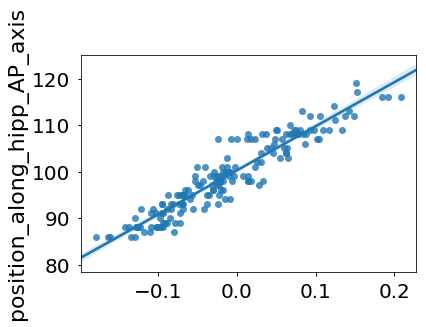

(0.94247801328481062, 7.277902789041337e-82)


In [211]:
rs = []
for i,samp in enumerate(xp.columns):
    svec = xp[samp]
    refvec = pcalr_out_NEW['betas']
    r,p = stats.pearsonr(svec,refvec)
    rs.append(r)
plt.close()
sns.regplot(np.array(rs),df.position_along_hipp_AP_axis)
plt.show()
print(stats.pearsonr(np.array(rs),df.position_along_hipp_AP_axis))

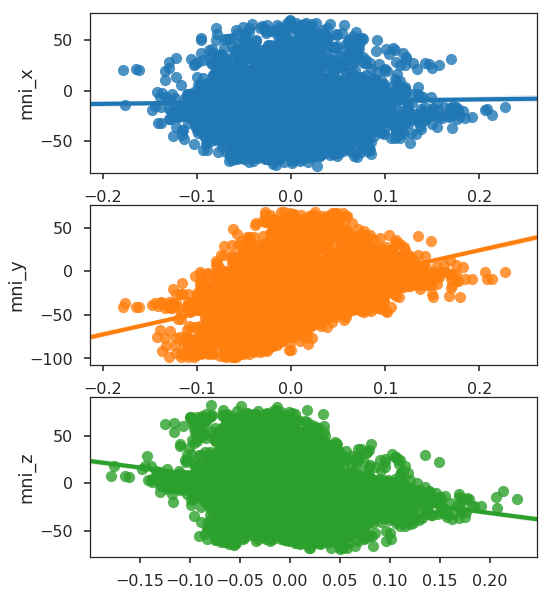

0.000534885864914
0.168072211755
0.0608717979577


In [193]:
# OLD COORDINATES
plt.close()
fig,(ax1, ax2, ax3) = plt.subplots(3, figsize=(8,10))
sns.regplot(np.array(gcx_SPCR), gdf.mni_x, ax=ax1)
sns.regplot(np.array(gcx_SPCR), gdf.mni_y, ax=ax2)
sns.regplot(np.array(gcx_SPCR), gdf.mni_z, ax=ax3)
plt.show()
print(stats.pearsonr(np.array(gcx_SPCR), gdf.mni_x)[0]**2)
print(stats.pearsonr(np.array(gcx_SPCR), gdf.mni_y)[0]**2)
print(stats.pearsonr(np.array(gcx_SPCR), gdf.mni_z)[0]**2)

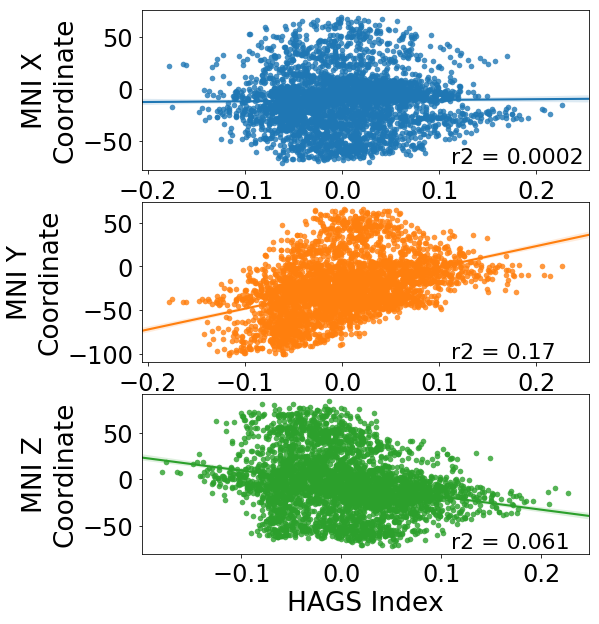

In [161]:
# NEW COORDINATES
sns.set_context('paper',font_scale=3)
gcx_SPCR = gdf.AP_axis_gxp_signature_similarity_SPCR.values
plt.close()
fig,(ax1, ax2, ax3) = plt.subplots(3, figsize=(8,10))
sns.regplot(np.array(gcx_SPCR), gdf.mni_nlin_x, ax=ax1)
sns.regplot(np.array(gcx_SPCR), gdf.mni_nlin_y, ax=ax2)
sns.regplot(np.array(gcx_SPCR), gdf.mni_nlin_z, ax=ax3)
plt.xlabel('HAGS Index')
ax1.set(ylabel='MNI X\nCoordinate')
ax2.set(ylabel='MNI Y\nCoordinate')
ax2.set(yticks=[-100,-50,0,50])
ax3.set(ylabel='MNI Z\nCoordinate')

xr = stats.pearsonr(np.array(gcx_SPCR), gdf.mni_nlin_x)[0]**2
yr = stats.pearsonr(np.array(gcx_SPCR), gdf.mni_nlin_y)[0]**2
zr = stats.pearsonr(np.array(gcx_SPCR), gdf.mni_nlin_z)[0]**2
plt.text(0.11, 340,'r2 = %s'%float('%.2g'%xr), fontsize=22)
plt.text(0.11, 130,'r2 = %s'%float('%.2g'%yr), fontsize=22)
plt.text(0.11, -75,'r2 = %s'%float('%.2g'%zr), fontsize=22)
plt.savefig('/Users/jakevogel/Dropbox/Work/Projects/AHBA_Hippocampus_AP/XYZ_plots.pdf',
           bbox_inches='tight')
plt.show()


In [196]:
gdf.loc[:,'AP_axis_gxp_signature_similarity_SPCR'] = gcx_SPCR

In [207]:
#gdf.drop(gdf.columns[16:27],axis=1,inplace=True)

In [38]:
gdf.to_csv(os.path.join(wdir,'MAIN_gcx_wholebrain_info.csv'),index=False)

In [160]:
vec = gdf.AP_axis_gxp_signature_similarity_SPCR.values
input_coords = []
for i,row in gdf.iterrows():
    input_coords.append(convert_coords([round(int(row['mni_nlin_x'])), 
                                        round(int(row['mni_nlin_y'])), 
                                        round(int(row['mni_nlin_z']))], 'xyz'))
nm = 'MAIN_SPCR_nlin_rev'
gcx_img = make_expression_image(vec, input_coords, mni, wdir, nm, 3, return_img=True)

In [222]:
jnk = gcx_img.get_data()
len(jnk[jnk!=0])

299344

In [137]:
trivec = [-1 if x < -0.05 else 1 if x > 0.05 else 0 \
       for x in gdf.AP_axis_gxp_signature_similarity_SPCR]
gdf.loc[:,'AP_division'] = trivec
for div in gdf.AP_division.unique():
    print(div, len(gdf[gdf.AP_division==div]))
input_coords = []
for i,row in gdf.iterrows():
    input_coords.append(convert_coords([round(int(row['mni_nlin_x'])), 
                                        round(int(row['mni_nlin_y'])), 
                                        round(int(row['mni_nlin_z']))], 'xyz'))
nm = 'AP_division'
gcx_img = make_expression_image(trivec, input_coords, mni, wdir, nm, 3, return_img=True)

0 2262
1 699
-1 741


In [138]:
univec = [1 if x==0 else 0 for x in gdf.AP_division]
gdf.loc[:,'no_assoc'] = univec
nm = 'unassociated'
gcx_img = make_expression_image(univec, input_coords, mni, wdir, nm, 3, return_img=True)

In [154]:
regs = pandas.DataFrame(index=gdf.structure_acronym.unique(),
                       columns = ['N_samples','N_Ant','N_Post'])
for structure in regs.index.tolist():
    regs.loc[structure,'N_samples'] = len(gdf[gdf.structure_acronym==structure])
    regs.loc[structure,'N_Ant'] = len(gdf[(gdf.structure_acronym==structure
                                   ) & (gdf.AP_division==1)])
    regs.loc[structure,'N_Post'] = len(gdf[(gdf.structure_acronym==structure
                                   ) & (gdf.AP_division==-1)])
    regs.loc[structure,'Name'] = gdf[gdf.structure_acronym==structure]['structure_name'].values[0]

In [155]:
regs.loc[:,'perc_Ant'] = regs.N_Ant/regs.N_samples
regs.loc[:,'perc_Post'] = regs.N_Post/regs.N_samples

In [157]:
regs.sort_values('perc_Post',ascending=False)

,N_samples,N_Ant,N_Post,Name,perc_Ant,perc_Post
He-VIIIB,7,0,7,"VIIIB, left, lateral hemisphere",0,1
Cun-str,19,0,19,"cuneus, right, striate",0,1
OPl,1,0,1,"occipital pole, left, lateral aspect",0,1
OPs,1,0,1,"occipital pole, left, superior aspect",0,1
OPi,1,0,1,"occipital pole, left, inferior aspect",0,1
Ve-VIIAf,5,0,5,VIIAf,0,1
LiG-str,33,0,31,"lingual gyrus, left, striate",0,0.939394
He-V,10,0,9,"V, left, lateral hemisphere",0,0.9
PV-III,8,0,7,"III, left, paravermis",0,0.875
He-VIIIA,15,0,13,"VIIIA, right, lateral hemisphere",0,0.866667


# Classification

In [229]:
# brainstem cerebellum
for i,row in gdf.iterrows():
    if row['slab_type'] == 'CB':
        gdf.loc[i,'cereb0_bstem1'] = 0
    elif row['slab_type'] == 'BS':
        gdf.loc[i,'cereb0_bstem1'] = 1
c_b_classifier = gdf[pandas.notnull(gdf.cereb0_bstem1)
                    ][['AP_axis_gxp_signature_similarity_SPCR','cereb0_bstem1']]
c_b_classifier.shape

(954, 2)

In [231]:
len(c_b_classifier[c_b_classifier.cereb0_bstem1==1])

586

In [247]:
cb_mod = linear_model.LogisticRegressionCV().fit(
        c_b_classifier['AP_axis_gxp_signature_similarity_SPCR'].values.reshape(-1,1),
                                       c_b_classifier.cereb0_bstem1.values)
cb_mod.score(c_b_classifier['AP_axis_gxp_signature_similarity_SPCR'].values.reshape(-1,1),
             c_b_classifier.cereb0_bstem1)

0.92557651991614254

In [248]:
pred_val = cb_mod.predict(c_b_classifier['AP_axis_gxp_signature_similarity_SPCR'
                                          ].values.reshape(-1,1))
c_b_classifier.loc[:,'Predicted_label'] = pred_val

In [165]:
jnk = gdf.loc[c_b_classifier[(c_b_classifier.cereb0_bstem1==1
                         ) & (c_b_classifier.Predicted_label==0)
                        ].index]['structure_name'].value_counts()
jnk2 = gdf.loc[c_b_classifier[c_b_classifier.cereb0_bstem1==1].index]['structure_name'].value_counts()
for i in jnk.index:
    val = jnk.loc[i]
    tot = jnk2.loc[i]
    print(i,val/tot,'     total = ',tot)

pontine nuclei, left 0.228571428571      total =  35
cuneate nucleus, left 0.1875      total =  16
pontine nuclei, right 0.153846153846      total =  13
vestibular nuclei, left 0.111111111111      total =  18
vestibular nuclei, right 0.142857142857      total =  7
trochlear nucleus, left 0.333333333333      total =  3
arcuate nucleus of medulla, right 0.166666666667      total =  6
inferior colliculus, left 0.142857142857      total =  7
principal sensory nucleus of trigeminal nerve, left 0.166666666667      total =  6


In [166]:
jnk = gdf.loc[c_b_classifier[(c_b_classifier.cereb0_bstem1==0
                         ) & (c_b_classifier.Predicted_label==1)
                        ].index]['structure_name'].value_counts()
jnk2 = gdf.loc[c_b_classifier[c_b_classifier.cereb0_bstem1==0].index]['structure_name'].value_counts()
for i in jnk.index:
    val = jnk.loc[i]
    tot = jnk2.loc[i]
    print(i,val/tot,'     total = ',tot)

dentate nucleus, left 0.923076923077      total =  13
dentate nucleus, right 1.0      total =  4
globose nucleus, left 1.0      total =  3
fastigial nucleus, left 1.0      total =  3
IX, left, paravermis 0.222222222222      total =  9
fastigial nucleus, right 1.0      total =  2
emboliform nucleus, right 1.0      total =  2
emboliform nucleus, left 1.0      total =  2
globose nucleus, right 1.0      total =  2
Crus I, left, lateral hemisphere 0.105263157895      total =  19
VIIIB, left, paravermis 0.25      total =  8
III, left, lateral hemisphere 0.25      total =  4
I-II 0.2      total =  5
VIIB, left, paravermis 0.0909090909091      total =  11
III, left, paravermis 0.142857142857      total =  7
IX, right, paravermis 0.333333333333      total =  3
VI 0.142857142857      total =  7
X, left, paravermis 0.5      total =  2
Crus II, right, paravermis 0.333333333333      total =  3
X, left, lateral hemisphere 0.2      total =  5
Crus II, right, lateral hemisphere 0.2      total =  5
V, 

In [249]:
c_b_classifier.loc[:,'struct'] = gdf.loc[c_b_classifier.index,'structure_name'].values
newlabs = []
for i,row in c_b_classifier.iterrows():
    roi = row['struct']
    if 'pontine nuclei,' in roi:
        newlabs.append('pontine nuclei')
    elif 'dentate nucleus' in roi:
        newlabs.append('dentate nucleus')
    elif 'globose nucleus' in roi:
        newlabs.append('globose nucleus')
    elif 'fastigial nucleus' in roi:
        newlabs.append('fastigial nucleus')
    elif 'emboliform nucleus' in roi:
        newlabs.append('emboliform nucleus')
    elif row['cereb0_bstem1']==0:
        newlabs.append('Other Cerebellum')
    else:
        newlabs.append('Other Brainstem')
    

In [251]:
c_b_classifier.loc[:,'struct'] = gdf.loc[c_b_classifier.index,'structure_name'].values
newlabs = []
for i,row in c_b_classifier.iterrows():
    roi = row['struct']
    if 'pontine nuclei,' in roi:
        newlabs.append('pontine nuclei')
    elif 'dentate nucleus' in roi:
        newlabs.append('Deep Cerebellar Nuclei')
    elif 'globose nucleus' in roi:
        newlabs.append('Deep Cerebellar Nuclei')
    elif 'fastigial nucleus' in roi:
        newlabs.append('Deep Cerebellar Nuclei')
    elif 'emboliform nucleus' in roi:
        newlabs.append('Deep Cerebellar Nuclei')
    elif row['cereb0_bstem1']==0:
        newlabs.append('Other Cerebellum')
    else:
        newlabs.append('Other Brainstem')
    

In [253]:
c_b_classifier.loc[:,'s_label'] = newlabs
c_b_classifier[c_b_classifier.Predicted_label==0
                ]['AP_axis_gxp_signature_similarity_SPCR'].max()

-0.034941897851697379

In [256]:
jnk = c_b_classifier[(c_b_classifier.cereb0_bstem1==0
                         ) & (c_b_classifier.Predicted_label==1)
                        ]['s_label'].value_counts()
jnk2 = c_b_classifier[c_b_classifier.cereb0_bstem1==0]['s_label'].value_counts()
for i in jnk.index:
    val = jnk.loc[i]
    tot = jnk2.loc[i]
    print(i,val/tot,'     total = ',tot)

Deep Cerebellar Nuclei 0.967741935484      total =  31
Other Cerebellum 0.0623145400593      total =  337


In [260]:
jnk = c_b_classifier[(c_b_classifier.cereb0_bstem1==1
                         ) & (c_b_classifier.Predicted_label==0)
                        ]['s_label'].value_counts()
jnk2 = c_b_classifier[c_b_classifier.cereb0_bstem1==1]['s_label'].value_counts()
for i in jnk.index:
    val = jnk.loc[i]
    tot = jnk2.loc[i]
    print(i,val/tot,'     total = ',tot)

pontine nuclei 0.208333333333      total =  48
Other Brainstem 0.0185873605948      total =  538


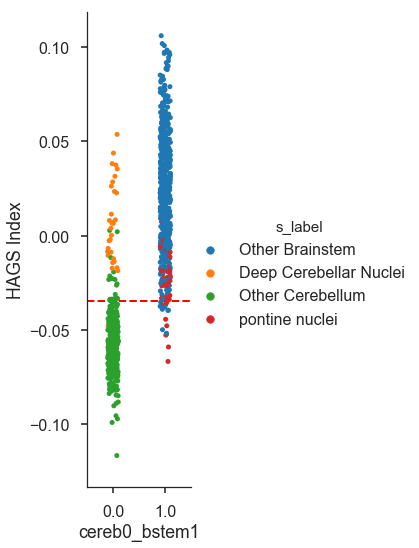

In [221]:

plt.close()
sns.set_context('poster')
sns.set_style('ticks')
sns.factorplot(y = 'AP_axis_gxp_signature_similarity_SPCR',
               x = 'cereb0_bstem1', kind='strip', hue = 's_label',
               size = 8, aspect=0.5, data=c_b_classifier, jitter=True)
plt.ylabel('HAGS Index')
plt.plot([-.5, 1.5], [-0.0349, -0.0349], 'r--', linewidth=2)
plt.savefig('/Users/jakevogel/Dropbox/Work/Projects/AHBA_Hippocampus_AP/ClassBSCB.pdf')
plt.show()

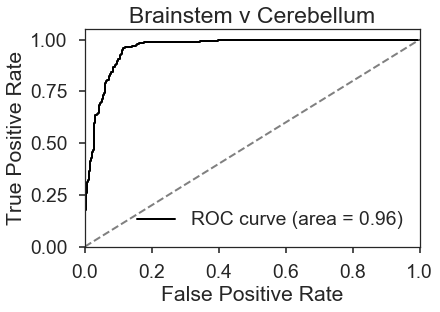

In [195]:
sns.set_context('poster',font_scale=1.2)
n_classes = len(c_b_classifier.cereb0_bstem1.unique())
y_test = c_b_classifier.cereb0_bstem1.values
y_score = cb_mod.decision_function(c_b_classifier['AP_axis_gxp_signature_similarity_SPCR'
                                                 ].values.reshape(-1,1))

fpr,tpr,_ = roc_curve(y_test,y_score)
roc_auc = auc(fpr,tpr)

plt.figure()
lw = 2
plt.plot(fpr, tpr, color='black',
         lw=lw, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='gray', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Brainstem v Cerebellum')
plt.legend(loc="lower right")
plt.savefig('/Users/jakevogel/Dropbox/Work/Projects/AHBA_Hippocampus_AP/ROC_BSCB.pdf',
           bbox_inches = 'tight')
plt.show()

In [91]:
#labs = pandas.read_csv('/home/users/jvogel/git/pycourse/stuff/dst_labels.csv', header=None)
labs = pandas.read_csv('/Users/jakevogel/git/pycourse_vuMC/stuff/dst_labels.csv', header=None)
labs.columns = ['integer_label', 'label']

In [232]:
# FRONTAL-OCCIPITAL
frontal = [1,1,0,0,0,0,0,0,0,1,0,1,0,0,1,1,1,1,0,0,0,1,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0
          ] + [1,1,0,0,0,0,0,0,0,1,0,1,0,0,1,1,1,1,0,0,0,1,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0
          ] + [0,0]
labs.loc[:,'frontal'] = frontal
occipital = [0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
             ] + [0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
             ] + [0,0]
#list(zip(labs.label,occipital))
labs.loc[:,'occipital'] = occipital
labs.head()

,integer_label,label,frontal,occipital,temporal,parietal
0,1,Caudal anterior cingulate,1,0,0,0
1,2,Caudal middle frontal,1,0,0,0
2,3,Cuneus,0,1,0,0
3,4,entorinal,0,0,1,0
4,5,fusiform,0,0,1,0


In [103]:
# also for the f of it, let's do parietal and temporal
temporal = [0,0,0,1,1,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,
           0,0,0,1,1,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,
           0,0]
labs.loc[:,'temporal'] = temporal
parietal = [0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,
           0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,
           0,0]
labs.loc[:,'parietal'] = parietal

In [239]:
dkt = ni.load('/Users/jakevogel/Science/tau/dkt_atlas_1mm.nii.gz').get_data()
#dkt = ni.load('/home/users/jvogel/Science/templates/atlases/dkt_atlas_1mm.nii').get_data()

In [240]:
flobe = np.zeros_like(dkt)
olobe = np.zeros_like(dkt)
for i,row in labs.iterrows():
    if row['frontal'] == 1:
        flobe[dkt==row['integer_label']] = 1
    elif row['occipital'] == 1:
        olobe[dkt==row['integer_label']] = 1
ocoords = np.where(olobe==1)
ohits = [[ocoords[0][x], ocoords[1][x], ocoords[2][x]] for x in range(len(ocoords[0]))]

fcoords = np.where(flobe==1)
fhits = [[fcoords[0][x], fcoords[1][x], fcoords[2][x]] for x in range(len(fcoords[0]))]

In [241]:
for i,row in gdf.iterrows():
    tcoords = [int(x) for x in convert_coords([round(row['mni_nlin_x']),
                                   round(row['mni_nlin_y']),round(row['mni_nlin_z'])
                                  ],'xyz')]
    if tcoords in ohits:
        gdf.loc[i,'frontal1_occipital0'] = 0
        #print('hit occipital')
    elif tcoords in fhits:
        #print('hit frontal')
        gdf.loc[i,'frontal1_occipital0'] = 1

In [258]:
len(gdf[gdf.frontal1_occipital0==1])

760

In [259]:
760+135

895

In [204]:
f_o_classifier = gdf[pandas.notnull(gdf.frontal1_occipital0)
                    ][['AP_axis_gxp_signature_similarity_SPCR','frontal1_occipital0']]

fo_mod = linear_model.LogisticRegressionCV().fit(
        f_o_classifier['AP_axis_gxp_signature_similarity_SPCR'].values.reshape(-1,1),
                                       f_o_classifier.frontal1_occipital0.values)
fo_mod.score(f_o_classifier['AP_axis_gxp_signature_similarity_SPCR'].values.reshape(-1,1),
             f_o_classifier.frontal1_occipital0)

0.8929133858267716

In [205]:
frnt_labels = gdf.loc[f_o_classifier[f_o_classifier.frontal1_occipital0==1].index]['structure_name'].unique()
occ_labels = gdf.loc[f_o_classifier[f_o_classifier.frontal1_occipital0==0].index]['structure_name'].unique()

In [168]:
# gdf.drop('frontal1_occipital0_take2',axis=1,inplace=True)

In [206]:
f_misses = ['supraoptic nucleus, left','dorsomedial hypothalamic nucleus, left',
           'short insular gyri, left','anterior hypothalamic area, left',
           'globus pallidus, external segment, left','precuneus, left, inferior lateral bank of gyrus',
           'piriform cortex, left', 'nucleus accumbens, left','cortico-medial group, left',
           'long insular gyri, left']
frnt_labels = [x for x in frnt_labels if x not in f_misses]
o_misses = ['CA1 field, right','Crus I, left, paravermis','cingulate gyrus', 
            'cingulate gyrus, retrosplenial part, left, inferior bank of gyrus',
           'precuneus, left, inferior lateral bank of gyrus',
           'inferior temporal gyrus, left, bank of the its',
           'inferior temporal gyrus, left, lateral bank of gyrus',
           'cingulate gyrus, retrosplenial part, left, superior bank of gyrus',
           'precuneus, left, superior lateral bank of gyrus',
           'precuneus, right, inferior lateral bank of gyrus',
           'middle temporal gyrus, right, superior bank of gyrus']
occ_labels = [x for x in occ_labels if x not in o_misses]
occ_labels = [x for x in occ_labels if 'retrosplen' not in x]

In [207]:
for i,row in gdf.iterrows():
    if row['structure_name'] in frnt_labels:
        gdf.loc[i,'frontal1_occipital0_take2'] = 1
    elif row['structure_name'] in occ_labels:
        gdf.loc[i,'frontal1_occipital0_take2'] = 0

In [208]:
f_o_classifier = gdf[pandas.notnull(gdf.frontal1_occipital0_take2)
                    ][['AP_axis_gxp_signature_similarity_SPCR','frontal1_occipital0_take2']]
fo_mod = linear_model.LogisticRegressionCV().fit(
        f_o_classifier['AP_axis_gxp_signature_similarity_SPCR'].values.reshape(-1,1),
                                       f_o_classifier.frontal1_occipital0_take2.values)
fo_mod.score(f_o_classifier['AP_axis_gxp_signature_similarity_SPCR'].values.reshape(-1,1),
             f_o_classifier.frontal1_occipital0_take2)

0.8426339285714286

In [209]:
pred_val = fo_mod.predict(f_o_classifier['AP_axis_gxp_signature_similarity_SPCR'
                                          ].values.reshape(-1,1))
f_o_classifier.loc[:,'Predicted_label'] = pred_val

In [210]:
jnk = gdf.loc[f_o_classifier[(f_o_classifier.frontal1_occipital0_take2==1
                         ) & (f_o_classifier.Predicted_label==0)
                        ].index]['structure_name'].value_counts()
jnk2 = gdf.loc[f_o_classifier[f_o_classifier.frontal1_occipital0_take2==1].index]['structure_name'].value_counts()
for i in jnk.index:
    val = jnk.loc[i]
    tot = jnk2.loc[i]
    print(i,val/tot,'     total = ',tot)

postcentral gyrus, left, bank of the central sulcus 0.333333333333      total =  18
postcentral gyrus, right, bank of the central sulcus 0.375      total =  8
middle frontal gyrus, left, inferior bank of gyrus 0.0666666666667      total =  30
precentral gyrus, left, bank of the precentral sulcus 0.181818181818      total =  11
precentral gyrus, left, inferior lateral aspect of gyrus 0.111111111111      total =  18
precentral gyrus, left, superior lateral aspect of gyrus 0.105263157895      total =  19
paracentral lobule, anterior part, left, inferior bank of gyrus 0.0833333333333      total =  12
middle frontal gyrus, right, inferior bank of gyrus 0.0666666666667      total =  15
precentral gyrus, right, inferior lateral aspect of gyrus 0.2      total =  5
cingulate gyrus, frontal part, right, inferior bank of gyrus 0.166666666667      total =  6
precentral gyrus, left, bank of the central sulcus 0.0714285714286      total =  14
paracentral lobule, anterior part, left, superior bank of

In [211]:
jnk = gdf.loc[f_o_classifier[(f_o_classifier.frontal1_occipital0_take2==0
                         ) & (f_o_classifier.Predicted_label==1)
                        ].index]['structure_name'].value_counts()
jnk2 = gdf.loc[f_o_classifier[f_o_classifier.frontal1_occipital0_take2==0].index
              ]['structure_name'].value_counts()
for i in jnk.index:
    val = jnk.loc[i]
    tot = jnk2.loc[i]
    print(i,val/tot,'     total = ',tot)

occipito-temporal gyrus, left, superior bank of gyrus 1.0      total =  17
cuneus, left, peristriate 0.789473684211      total =  19
lingual gyrus, left, peristriate 0.51724137931      total =  29
occipito-temporal gyrus, left, inferior bank of gyrus 0.928571428571      total =  14
inferior occipital gyrus, left, inferior bank of gyrus 0.733333333333      total =  15
superior occipital gyrus, left, superior bank of gyrus 0.769230769231      total =  13
inferior occipital gyrus, left, superior bank of gyrus 0.615384615385      total =  13
superior occipital gyrus, left, inferior bank of gyrus 0.636363636364      total =  11
lingual gyrus, right, peristriate 0.857142857143      total =  7
lingual gyrus, left, striate 0.16      total =  25
lingual gyrus, right, striate 0.5      total =  8
inferior occipital gyrus, right, inferior bank of gyrus 1.0      total =  3
cuneus, right, peristriate 0.5      total =  2
cuneus, right, striate 0.333333333333      total =  3
superior occipital gyrus, 

In [217]:
f_o_classifier.loc[:,'struct'] = gdf.loc[f_o_classifier.index,'structure_name'].values
newlabs = []
for i,row in f_o_classifier.iterrows():
    roi = row['struct']
    if 'central gyrus' in roi:
        newlabs.append('Pre/Postcentral Gyrus')
#    elif 'lingual' in roi:
#        newlabs.append('Lingual Gyrus')
#    elif 'temporal' in roi:
#        newlabs.append('Occipito-temporal gyrus')
#    elif 'cuneus' in roi:
#        newlabs.append('Cuneus')
#    elif 'occipital gyrus' in roi:
#        newlabs.append('Inf/Sup Occipital')
    elif row['frontal1_occipital0_take2']==0:
#        newlabs.append('Other Occipital')
        newlabs.append('Occipital')
    else:
        newlabs.append('Other Frontal')
    

In [218]:
f_o_classifier.loc[:,'s_label'] = newlabs
f_o_classifier[f_o_classifier.Predicted_label==0
                ]['AP_axis_gxp_signature_similarity_SPCR'].max()

-0.069882485491463864

In [219]:

sns.set_style('ticks')
sns.factorplot(y = 'AP_axis_gxp_signature_similarity_SPCR',
               x = 'cereb0_bstem1', kind='strip', hue = 's_label',
               size = 8, aspect=0.5, data=c_b_classifier, jitter=True)

plt.plot([-.5, 1.5], [-0.0349, -0.0349], 'r--', linewidth=2)
plt.savefig('/Users/jakevogel/Dropbox/Work/Projects/AHBA_Hippocampus_AP/ClassBSCB.pdf')

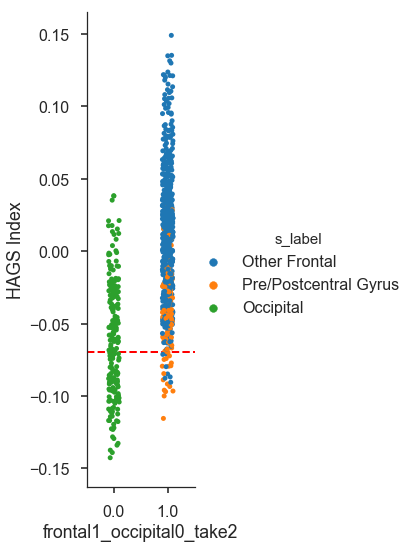

In [241]:
plt.close()
sns.set_context('poster')
sns.set_style('ticks')
sns.factorplot(y = 'AP_axis_gxp_signature_similarity_SPCR',
               x = 'frontal1_occipital0_take2', kind='strip', hue = 's_label',
               size = 8, aspect=0.5, data=f_o_classifier, jitter = True)
plt.ylabel('HAGS Index')
plt.plot([-.5, 1.5], [-0.0698, -0.0698], 'r--', linewidth=2)
plt.savefig('/Users/jakevogel/Dropbox/Work/Projects/AHBA_Hippocampus_AP/ClassFrOc.pdf',
           bbox_inches = 'tight')
plt.show()

In [224]:
f_o_classifier.loc[:,'class0'] = [
        1 if x > 0 else 0 for x in  f_o_classifier.AP_axis_gxp_signature_similarity_SPCR.values]

In [235]:
accuracy_score(f_o_classifier[f_o_classifier.s_label!='Pre/Postcentral Gyrus'
                             ]['frontal1_occipital0_take2'], 
               f_o_classifier[f_o_classifier.s_label!='Pre/Postcentral Gyrus']['class0'])

0.69796954314720816

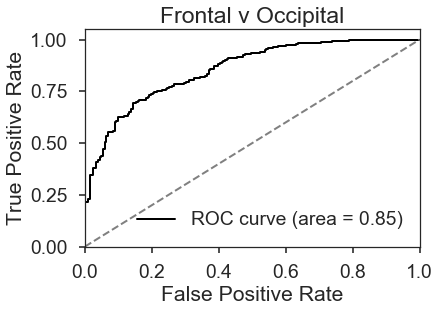

In [239]:
n_classes = len(f_o_classifier.frontal1_occipital0_take2.unique())
y_test = f_o_classifier.frontal1_occipital0_take2.values
y_score = fo_mod.decision_function(f_o_classifier['AP_axis_gxp_signature_similarity_SPCR'
                                                 ].values.reshape(-1,1))

fpr,tpr,_ = roc_curve(y_test,y_score)
roc_auc = auc(fpr,tpr)

sns.set_context('poster',font_scale=1.2)
plt.figure()
lw = 2
plt.plot(fpr, tpr, color='black',
         lw=lw, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='gray', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Frontal v Occipital')
plt.legend(loc="lower right")
plt.savefig('/Users/jakevogel/Dropbox/Work/Projects/AHBA_Hippocampus_AP/ROC_FrOc.pdf',
           bbox_inches = 'tight')
plt.show()

In [ ]:
n_classes = len(f_o_classifier.frontal1_occipital0_take2.unique())
y_test = f_o_classifier[f_o_classifier.s_label!='Pre/Postcentral Gyrus'
                             ]['frontal1_occipital0_take2'].values
y_score = fo_mod.decision_function(f_o_classifier['AP_axis_gxp_signature_similarity_SPCR'
                                                 ].values.reshape(-1,1))

fpr,tpr,_ = roc_curve(y_test,y_score)
roc_auc = auc(fpr,tpr)

sns.set_context('poster',font_scale=1.2)
plt.figure()
lw = 2
plt.plot(fpr, tpr, color='black',
         lw=lw, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='gray', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Frontal v Occipital')
plt.legend(loc="lower right")
plt.savefig('/Users/jakevogel/Dropbox/Work/Projects/AHBA_Hippocampus_AP/ROC_FrOc.pdf',
           bbox_inches = 'tight')
plt.show()

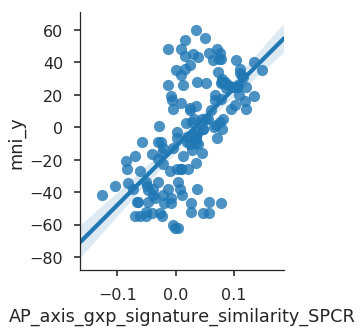

0.392010821703


In [243]:
cings = [x for x in gdf.structure_name.unique() if 'cingulate gyrus' in x]
cingsamps = [i for i in gdf.index if gdf.loc[i,'structure_name'] in cings]
plt.close()
sns.lmplot(x = 'AP_axis_gxp_signature_similarity_SPCR', 
           y = 'mni_y',
           data = gdf.loc[cingsamps] )
plt.show()
print(stats.pearsonr(gdf.loc[cingsamps,'AP_axis_gxp_signature_similarity_SPCR'],
                    gdf.loc[cingsamps,'mni_y'])[0]**2)

In [244]:
amygs = ['basolateral nucleus, left',
'basolateral nucleus, right',
'lateral nucleus, left',
'lateral nucleus, right',
'central nucleus, left',
'central nucleus, right',
'basomedial nucleus, left',
'basomedial nucleus, right',
'amygdalohippocampal transition zone, left',
'amygdalohippocampal transition zone, right']
print('amygdala',len([i for i in gdf.index if gdf.loc[i,'structure_name'] in amygs]))
tpoles = [x for x in gdf.structure_name.unique() if 'temporal pole' in x and 'inferior' in x]
print('tpole',len([i for i in gdf.index if gdf.loc[i,'structure_name'] in tpoles]))
ofronts = [x for x in gdf.structure_name.unique() if 'lateral orbital gyrus' in x]
print('ofront',len([i for i in gdf.index if gdf.loc[i,'structure_name'] in ofronts]))
AT_system = amygs + tpoles + ofronts
AT_samps = [i for i in gdf.index if gdf.loc[i,'structure_name'] in AT_system]
print('whole AT system',len(AT_samps))

amygdala 56
tpole 11
ofront 20
whole AT system 87


In [245]:
mbs = [x for x in gdf.structure_name.unique() if 'mammillary' in x and 'hypothal' not in x]
print('mam bod',len([i for i in gdf.index if gdf.loc[i,'structure_name'] in mbs]))
athal = ['anterior group of nuclei, left','anterior group of nuclei, right']
print('a thalamus',len([i for i in gdf.index if gdf.loc[i,'structure_name'] in athal]))
prec = [x for x in gdf.structure_name.unique() if 'precuneus' in x]
print('precun',len([i for i in gdf.index if gdf.loc[i,'structure_name'] in prec]))
angg = [x for x in gdf.structure_name.unique() if 'angular gyrus' in x]
print('ang gyr',len([i for i in gdf.index if gdf.loc[i,'structure_name'] in angg]))
pccs = [x for x in gdf.structure_name.unique() if 'cingulate' in x and 'parietal' in x]
print('pcc',len([i for i in gdf.index if gdf.loc[i,'structure_name'] in pccs]))
rscs = [x for x in gdf.structure_name.unique() if 'cingulate' in x and 'retrosplenial' in x]
print('rsc',len([i for i in gdf.index if gdf.loc[i,'structure_name'] in rscs]))
PM_system = mbs + athal + prec + angg + pccs + rscs
PM_samps = [i for i in gdf.index if gdf.loc[i,'structure_name'] in PM_system]
print('whole PM system',len(PM_samps))

mam bod 20
a thalamus 28
precun 52
ang gyr 47
pcc 42
rsc 15
whole PM system 204


In [247]:
gdf.loc[AT_samps,'AT0_PM1'] = 0
gdf.loc[PM_samps,'AT0_PM1'] = 1

AT_PM_classifier = gdf[pandas.notnull(gdf.AT0_PM1)
                    ][['AP_axis_gxp_signature_similarity_SPCR','AT0_PM1']]
print('number of samples:', AT_PM_classifier.shape[0])
fo_mod = linear_model.LogisticRegressionCV().fit(
        AT_PM_classifier['AP_axis_gxp_signature_similarity_SPCR'].values.reshape(-1,1),
                                       AT_PM_classifier.AT0_PM1.values)
fo_mod.score(AT_PM_classifier['AP_axis_gxp_signature_similarity_SPCR'].values.reshape(-1,1),
             AT_PM_classifier.AT0_PM1)

number of samples: 291


0.85910652920962194

In [248]:
pred_val = fo_mod.predict(AT_PM_classifier['AP_axis_gxp_signature_similarity_SPCR'
                                          ].values.reshape(-1,1))
AT_PM_classifier.loc[:,'Predicted_label'] = pred_val

In [249]:
gdf.loc[AT_PM_classifier[(AT_PM_classifier.AT0_PM1==0) & (AT_PM_classifier.Predicted_label==1)
                        ].index]['structure_name'].value_counts()

lateral orbital gyrus, left              15
lateral orbital gyrus, right              5
central nucleus, left                     1
temporal pole, right, inferior aspect     1
lateral nucleus, right                    1
temporal pole, left, inferior aspect      1
lateral nucleus, left                     1
basomedial nucleus, left                  1
Name: structure_name, dtype: int64

In [250]:
gdf.loc[AT_PM_classifier[(AT_PM_classifier.AT0_PM1==1) & (AT_PM_classifier.Predicted_label==0)
                        ].index]['structure_name'].value_counts()

lateral mammillary nucleus, left                                      4
tuberomammillary nucleus, left                                        4
supramammillary nucleus, left                                         3
cingulate gyrus, retrosplenial part, left, inferior bank of gyrus     2
cingulate gyrus, retrosplenial part, right, inferior bank of gyrus    1
cingulate gyrus, parietal part, left, superior bank of gyrus          1
Name: structure_name, dtype: int64

In [251]:
# ADD PHG and PRC
phg = ni.load('/home/users/jvogel/ace_mount/ace_home/transfer/FINAL_PHC_mask.nii.gz').get_data()
prc = ni.load('/home/users/jvogel/ace_mount/ace_home/transfer/FINAL_PRC_mask.nii.gz').get_data()
phg_samps = []
prc_samps = []
for i in gdf.index:
    coords = convert_coords(gdf.loc[i,['mni_nlin_x','mni_nlin_y','mni_nlin_z']].tolist(),'xyz')
    xs,ys,zs = make_sphere(coords,3)
    for x in range(len(xs)):
        ph_hits = []
        pr_hits = []
        if phg[xs[x],ys[x],zs[x]] == 1:
            ph_hits.append(x)
        elif prc[xs[x],ys[x],zs[x]] == 1:
            pr_hits.append(x)
    if len(ph_hits) > len(pr_hits):
        print('parahipp')
        phg_samps.append(i)
    elif len(ph_hits) < len(pr_hits):
        print('PERIRHINAL')
        prc_samps.append(i)

PERIRHINAL
parahipp
PERIRHINAL
PERIRHINAL
PERIRHINAL
PERIRHINAL
PERIRHINAL
PERIRHINAL
PERIRHINAL
parahipp
parahipp
parahipp
PERIRHINAL
PERIRHINAL
parahipp
PERIRHINAL
PERIRHINAL
PERIRHINAL


In [252]:
gdf.loc[prc_samps,'structure_name']

376                fusiform gyrus, left, bank of cos
1401               fusiform gyrus, left, bank of cos
1537               fusiform gyrus, left, bank of cos
1538               fusiform gyrus, left, bank of cos
1608     fusiform gyrus, left, lateral bank of gyrus
1615    parahippocampal gyrus, left, bank of the cos
2405    parahippocampal gyrus, left, bank of the cos
2407               fusiform gyrus, left, bank of cos
3203               fusiform gyrus, left, bank of cos
3222              fusiform gyrus, right, bank of cos
3376               fusiform gyrus, left, bank of cos
3402    fusiform gyrus, right, lateral bank of gyrus
3403              fusiform gyrus, right, bank of cos
Name: structure_name, dtype: object

In [253]:
gdf.loc[:,'AT0_PM1_take2'] = gdf.AT0_PM1.values
gdf.loc[prc_samps,'AT0_PM1_take2'] = 0
gdf.loc[phg_samps,'AT0_PM1_take2'] = 1

In [255]:
AT_PM_classifier = gdf[pandas.notnull(gdf.AT0_PM1_take2)
                    ][['AP_axis_gxp_signature_similarity_SPCR','AT0_PM1_take2']]
print('number of samples:', AT_PM_classifier.shape[0])
fo_mod = linear_model.LogisticRegressionCV().fit(
        AT_PM_classifier['AP_axis_gxp_signature_similarity_SPCR'].values.reshape(-1,1),
                                       AT_PM_classifier.AT0_PM1_take2.values)
fo_mod.score(AT_PM_classifier['AP_axis_gxp_signature_similarity_SPCR'].values.reshape(-1,1),
             AT_PM_classifier.AT0_PM1_take2)

number of samples: 309


0.86084142394822005

In [257]:
pred_val = fo_mod.predict(AT_PM_classifier['AP_axis_gxp_signature_similarity_SPCR'
                                          ].values.reshape(-1,1))
AT_PM_classifier.loc[:,'Predicted_label_take2'] = pred_val

In [23]:
1 -26/102

0.7450980392156863

In [24]:
1 - 18/210

0.9142857142857143

In [258]:
gdf.loc[AT_PM_classifier[(AT_PM_classifier.AT0_PM1_take2==1
                         ) & (AT_PM_classifier.Predicted_label_take2==0)
                        ].index]['structure_name'].value_counts()

tuberomammillary nucleus, left                                        4
lateral mammillary nucleus, left                                      4
supramammillary nucleus, left                                         3
cingulate gyrus, retrosplenial part, left, inferior bank of gyrus     2
cingulate gyrus, retrosplenial part, right, inferior bank of gyrus    1
fusiform gyrus, right, bank of cos                                    1
cingulate gyrus, parietal part, left, superior bank of gyrus          1
fusiform gyrus, left, bank of cos                                     1
Name: structure_name, dtype: int64

In [260]:
gdf.loc[AT_PM_classifier[(AT_PM_classifier.AT0_PM1_take2==0
                         ) & (AT_PM_classifier.Predicted_label_take2==1)
                        ].index]['structure_name'].value_counts()

lateral orbital gyrus, left              15
lateral orbital gyrus, right              5
central nucleus, left                     1
temporal pole, right, inferior aspect     1
lateral nucleus, right                    1
temporal pole, left, inferior aspect      1
lateral nucleus, left                     1
basomedial nucleus, left                  1
Name: structure_name, dtype: int64

In [261]:
AT_PM_classifier.loc[:,'struct'] = gdf.loc[AT_PM_classifier.index,'structure_name'].values
newlabs = []
for i,row in AT_PM_classifier.iterrows():
    roi = row['struct']
    if i in phg_samps:
        newlabs.append('parahippocampal')
    elif i in prc_samps:
        newlabs.append('perirhinal')
    elif roi in amygs:
        newlabs.append('amygdala')
    elif roi in tpoles:
        newlabs.append('temporal pole')
    elif roi in ofronts:
        newlabs.append('orbitofrontal')
    elif roi in mbs:
        newlabs.append('mammillary body')
    elif roi in athal:
        newlabs.append('thalamus')
    elif roi in prec:
        newlabs.append('precuneus')
    elif roi in angg:
        newlabs.append('angular gyrus')
    elif roi in pccs:
        newlabs.append('posterior cingulate')
    elif roi in rscs:
        newlabs.append('retrosplenial')
    else:
        print(i,roi)

In [266]:
AT_PM_classifier.loc[:,'s_label'] = newlabs
AT_PM_classifier[AT_PM_classifier.Predicted_label_take2==0
                ]['AP_axis_gxp_signature_similarity_SPCR'].min()

0.051453790719737713

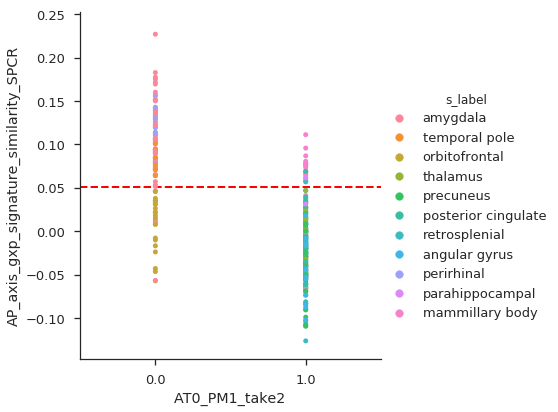

In [267]:
plt.close()
sns.set_context('talk')
sns.set_style('ticks')
sns.factorplot(y = 'AP_axis_gxp_signature_similarity_SPCR',
               x = 'AT0_PM1_take2', kind='strip', hue = 's_label',
               size = 6, aspect=1, data=AT_PM_classifier)
plt.plot([-.5, 1.5], [0.0514, 0.0514], 'r--', linewidth=2)
plt.show()

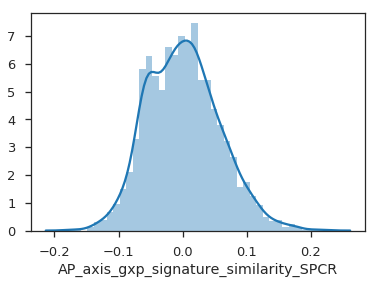

In [268]:
plt.close()
sns.distplot(gdf['AP_axis_gxp_signature_similarity_SPCR'])
plt.show()

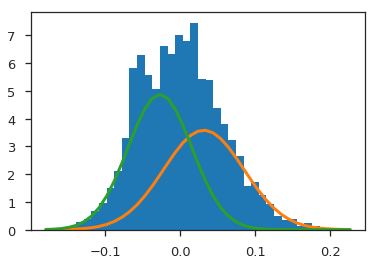

In [275]:
from matplotlib import mlab
GMM2 = mixture.GaussianMixture(n_components=2,random_state=123, tol = 0.00001)
mmod = GMM2.fit(gdf['AP_axis_gxp_signature_similarity_SPCR'].values.reshape(-1,1))
m1, m2 = mmod.means_
w1, w2 = mmod.weights_
c1, c2 = mmod.covariances_
plt.close()
histdist = plt.hist(gdf['AP_axis_gxp_signature_similarity_SPCR'], 40, normed=True)
plotgauss1 = lambda x: plt.plot(x,w1*mlab.normpdf(x,m1,np.sqrt(c1))[0], linewidth=3)
plotgauss2 = lambda x: plt.plot(x,w2*mlab.normpdf(x,m2,np.sqrt(c2))[0], linewidth=3)
plotgauss1(histdist[1])
plotgauss2(histdist[1])
plt.show()



# Resting-state analysis

In [208]:
plt.close()
sns.regplot(np.array(rs),df.position_along_hipp_AP_axis)
plt.show()
print(min(df.position_along_hipp_AP_axis))
print(max(df.position_along_hipp_AP_axis))

NameError: name 'rs' is not defined

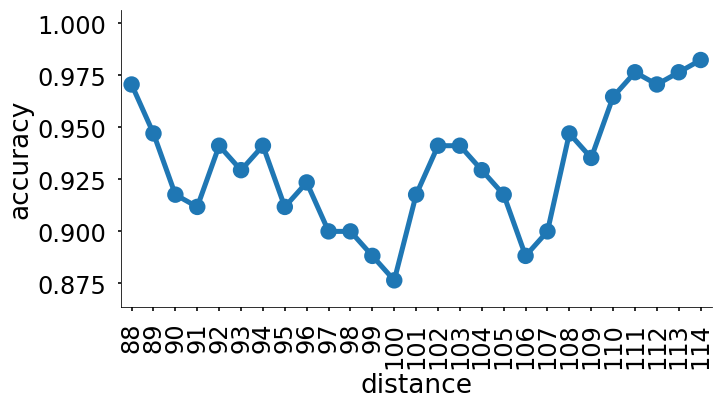

In [232]:
d_classifiers = pandas.DataFrame(index = range(88,115), columns = ['accuracy'])
for i in range(88,115):
    classes = [0 if x < i else 1 for x in df.position_along_hipp_AP_axis]
    tmod = linear_model.LogisticRegressionCV().fit(np.array(rs).reshape(-1,1),classes)
    scr = tmod.score(np.array(rs).reshape(-1,1),classes)
    d_classifiers.loc[i,'accuracy'] = scr
d_classifiers.loc[:,'distance'] = d_classifiers.index

plt.close()
sns.set_context('poster', font_scale=1.5)
g = sns.factorplot(x='distance', y='accuracy', data=d_classifiers, size=6, aspect=1.8)
g.set_xticklabels(rotation=90)
plt.plot([94, 94], [0.87, 1], 'r--', linewidth=2)
plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/figs/fmri_cutpoints.pdf',
           bbox_inches='tight')
plt.show()

In [290]:
cx_scans

[]

In [14]:
cx_scans = sorted(glob('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/rsfmri_neurosynth/*.nii.gz'))
scoords = [[int(x[-3]),int(x[-2]),int(x[-1].split('.')[0])
           ] for x in [y.split('_') for y in cx_scans]]
for i,row in df.iterrows():
    c = [row['mni_nlin_x'],row['mni_nlin_y'],row['mni_nlin_z']]
    dists = [(abs(c[0] - sc[0]) + abs(c[1] - sc[1]) + abs(c[2] - sc[2])) for sc in scoords]
    gcx = np.argmin(dists)
    df.loc[i,'closest_cx_map'] = cx_scans[gcx]


ValueError: attempt to get argmin of an empty sequence

In [7]:
df.head()

,Unnamed: 0,donor,sample,structure_id,slab_num,well_id,slab_type,structure_acronym,structure_name,polygon_id,...,mri_voxel_z,mni_x,mni_y,mni_z,gabe_label,mni_nlin_x,mni_nlin_y,mni_nlin_z,position_along_hipp_AP_axis,closest_cx_map
0,19,10021,20,4263,17,5707,CX,CA1,"CA1 field, right",1001646,...,116,19.5,-42.4,4.3,H0351.2002,21.876385,-42.363260,4.710402,86,/home/users/jvogel/Science/Allen_Human_Brain_A...
1,20,10021,21,4264,17,5715,CX,CA2,"CA2 field, right",1001641,...,115,21.7,-41.2,7.7,H0351.2002,23.899152,-40.879051,8.176524,86,/home/users/jvogel/Science/Allen_Human_Brain_A...
2,21,10021,22,4265,17,5723,CX,CA3,"CA3 field, right",1001496,...,115,20.6,-41.2,7.7,H0351.2002,22.703225,-40.994060,8.301460,86,/home/users/jvogel/Science/Allen_Human_Brain_A...
3,22,10021,23,4266,17,5731,CX,CA4,"CA4 field, right",1001475,...,115,20.6,-41.2,6.6,H0351.2002,22.928779,-41.054804,7.141831,86,/home/users/jvogel/Science/Allen_Human_Brain_A...
4,23,10021,24,4267,17,5739,CX,DG,"dentate gyrus, right",998739,...,115,21.8,-41.2,6.6,H0351.2002,24.115367,-40.962119,7.018704,86,/home/users/jvogel/Science/Allen_Human_Brain_A...


In [107]:
#dkt = ni.load('/Users/jakevogel/Science/tau/dkt_atlas_1mm.nii.gz').get_data()
dkt = ni.load('/home/users/jvogel/Science/templates/atlases/dkt_atlas_1mm.nii').get_data()
HO = ni.load(
        '/usr/share/fsl/data/atlases/HarvardOxford/HarvardOxford-sub-maxprob-thr0-1mm.nii.gz'
            ).get_data()
#HO = ni.load(
#        '/usr/local/fsl/data/atlases/HarvardOxford/HarvardOxford-sub-maxprob-thr0-1mm.nii.gz'
#            ).get_data()
#whole brain
msk1 = np.array(HO,copy=True)
msk1[HO<1] = 0

#no cereb or brainstem
msk2 = np.array(dkt, copy=True)
msk2[msk2>78] = 0
msk2 = np.array(dkt, copy=True)
msk2[msk2>78] = 0

# no cereb, brainstem or hippocampus
msk3 = np.array(msk2, copy=True)
msk3[dkt==36] = 0
msk3[dkt==75] = 0

# cortex only (no subcortex)
msk4 = np.array(msk3, copy=True)
msk4[dkt>31] = 0
msk4[dkt>41] = dkt[dkt>41]
msk4[dkt>70] = 0

In [67]:
labs.loc[labs.index[69]]

integer_label         70
label             Insula
Name: 69, dtype: object

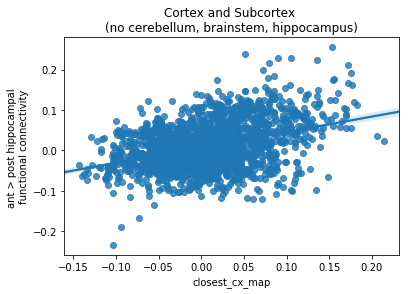

standard statistics: r2 = 0.148600688358, p = 2.01486804344e-70


,r2,p
3,0.148601,2.01487e-70


In [41]:
ant_cut = 94
post_cut = 108
ycol = 'position_along_hipp_AP_axis'
ccol = 'closest_cx_map'
msk = msk3
gcx_col = 'AP_axis_gxp_signature_similarity_SPCR'
plabs = ['Cortex and Subcortex \n(no cerebellum, brainstem, hippocampus)',
         ccol,'ant > post hippocampal \nfunctional connectivity']
in_imgs = ['/Users/jakevogel/Science/AHBA/ant_img.nii.gz',
          '/Users/jakevogel/Science/AHBA/post_img.nii.gz']
run_hipp_connectivity_analysis(ant_cut, post_cut, df, ycol, 
                                   ccol, wdir, gdf, msk, gcx_col, plabs,
                                   del_img = True, diff_img = True,  vrad = 3,
                                  in_imgs = in_imgs, bootstrap = False, hue_vals=[],
                                  return_results=True)

In [69]:
in_imgs = ['/Users/jakevogel/Science/AHBA/ant_img.nii.gz',
          '/Users/jakevogel/Science/AHBA/post_img.nii.gz']
diff_img = ni.load(in_imgs[1]).get_data() - ni.load(in_imgs[0]).get_data()
img = diff_img
vrad = 3
bootstrap = 'bootstrap'
hue_vals = []
return_results = True
illustrative = True
msk = msk3
if type(vrad) != list:
    vrad = [vrad]
res = pandas.DataFrame(index=vrad,columns=['r2','p'])
for vs in vrad:
    g_cx = []
    f_cx = []
    if len(hue_vals) > 0:
        hvs = []

    for i,row in gdf.iterrows():
        #coord = convert_coords([row['mni_x'], row['mni_y'], row['mni_z']], 'xyz')
        coord = convert_coords([row['mni_nlin_x'], row['mni_nlin_y'], row['mni_nlin_z']], 'xyz')
        coord = [round(x) for x in coord]
        if msk[coord[0],coord[1],coord[2]] != 0:
            xs,ys,zs = make_sphere(coord, vs)
            val = img[xs,ys,zs]
            f_cx.append(val.mean())
            g_cx.append(row[gcx_col])
            if len(hue_vals) > 0:
                hvs.append(hue_vals[i])


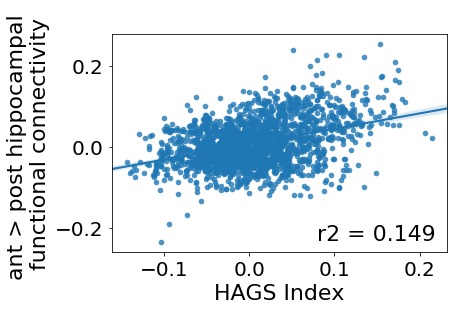

standard statistics: r2 = 0.0906078645198, p = 1.86039576534e-32


In [73]:
plt.close()
sns.set_context('paper', font_scale=2.5)
sns.regplot(np.array(g_cx), np.array(f_cx))
#plt.title(plabs[0])
plt.xlabel('HAGS Index')
plt.ylabel(plabs[2])
r2 = stats.pearsonr(np.array(g_cx), np.array(f_cx))[0]**2
plt.text(0.08, -0.23,'r2 = %s'%float('%.3g'%r2), fontsize=22)
plt.savefig('/Users/jakevogel/Dropbox/Work/Projects/AHBA_Hippocampus_AP/rsfmri_HAGS.pdf',
           bbox_inches = 'tight')
plt.show()


print('standard statistics: r2 = %s, p = %s'%(r**2,p))

In [13]:
ant_cut = 94
post_cut = 108
ycol = 'position_along_hipp_AP_axis'
ccol = 'closest_cx_map'
msk = msk2
gcx_col = 'AP_axis_gxp_signature_similarity_SPCR'
plabs = ['Cortex and Subcortex \n(no cerebellum, brainstem, hippocampus)',
         ccol,'ant > post hippocampal \nfunctional connectivity']
run_hipp_connectivity_analysis(ant_cut, post_cut, df, ycol, 
                                   ccol, wdir, gdf, msk, gcx_col, plabs,
                                   del_img = True, diff_img = True,  vrad = 3,
                                  in_imgs = [], bootstrap = False, hue_vals=[],
                                  return_results=True)

24 maps used for posterior, 50 used for anterior


processing anterior image


KeyError: 'the label [closest_cx_map] is not in the [columns]'

In [114]:
dmin = min(df.position_along_hipp_AP_axis)+1
dmax = max(df.position_along_hipp_AP_axis)-4
drange = int((dmax-dmin)/2)
vrad = [1,2,3,4,5,6]
msks = [msk1,msk2,msk3,msk4]
resdf = pandas.DataFrame(index=range(drange*len(msks)*len(vrad)),
                                      columns = ['ant_cut','post_cut','n_ant','n_post',
                                                 'mask','vs','r2','p', 'manual_FDR',
                                                 'chance_r2', 'ci_l', 'ci_u'])
cnt = 0
for i in range(drange+1):
    ant_cut = dmin+i
    post_cut = dmax-i
    n_ant = len(df[df.position_along_hipp_AP_axis<dmin+i])
    n_post = len(df[df.position_along_hipp_AP_axis>dmax-i])
    resdf.loc[resdf.index[cnt:cnt+(len(msks)*len(vrad))],'ant_cut'] = [ant_cut] * len(msks)*len(vrad)
    resdf.loc[resdf.index[cnt:cnt+(len(msks)*len(vrad))],'post_cut'] = [post_cut] * len(msks)*len(vrad)
    resdf.loc[resdf.index[cnt:cnt+(len(msks)*len(vrad))],'n_ant'] = [n_ant] * len(msks)*len(vrad)
    resdf.loc[resdf.index[cnt:cnt+(len(msks)*len(vrad))],'n_post'] = [n_post] * len(msks)*len(vrad)
    ycol = 'position_along_hipp_AP_axis'
    ccol = 'closest_cx_map'
    gcx_col = 'AP_axis_gxp_signature_similarity_SPCR'
    plabs = ['Cortex and Subcortex \n(no cerebellum, brainstem, hippocampus)',
             ccol,'ant > post hippocampal \nfunctional connectivity']
    for m,msk in enumerate(msks):
        lab = 'msk%s'%(m+1)
        resdf.loc[resdf.index[cnt:(cnt+len(vrad))],'mask'] = [lab]*len(vrad)
        res = run_hipp_connectivity_analysis(ant_cut, post_cut, df, ycol, 
                                       ccol, wdir, gdf, msk, gcx_col, plabs,
                                       del_img = True, diff_img = True,  vrad = vrad,
                                      in_imgs = [], bootstrap = 'bootstrap', hue_vals=[],
                                      return_results=True, illustrative=False, n_iter = 100)
        resdf.loc[resdf.index[cnt:(cnt+len(vrad))],'vs'] = res.index
        resdf.loc[resdf.index[cnt:(cnt+len(vrad))],
                  ['r2','p','manual_FDR','chance_r2', 'ci_l', 'ci_u']] = res.values
        cnt+=len(vrad)
        resdf.to_csv('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/hipp_cx_analysis_bootstrap.csv')

5 maps used for posterior, 5 used for anterior


processing anterior image
making mean image
moving to template space
processing posterior image
making mean image
moving to template space
running analysis
standard statistics: r2 = 0.196764023042, p = 6.54484914341e-167
standard statistics: r2 = 0.199855857948, p = 8.20485534461e-170
standard statistics: r2 = 0.203942771361, p = 1.15122447462e-173
standard statistics: r2 = 0.209159073071, p = 1.30270863478e-178
standard statistics: r2 = 0.215213702009, p = 2.15146870212e-184
standard statistics: r2 = 0.221820931565, p = 9.37605733622e-191
5 maps used for posterior, 5 used for anterior


processing anterior image
making mean image
moving to template space
processing posterior image
making mean image
moving to template space
running analysis
standard statistics: r2 = 0.280890341107, p = 8.32369944576e-157
standard statistics: r2 = 0.284299290661, p = 4.89743679213e-159
standard statistics: r2 = 0.288415028321, p = 9.61735202791e-162
stand

ValueError: shape mismatch: value array of shape (6,2) could not be broadcast to indexing result of shape (0,2)

In [261]:
resdf = pandas.read_csv('/Users/jakevogel/Science/AHBA/hipp_cx_analysis_permute.csv',
                       index_col=0)

In [274]:
resdf.head()

,ant_cut,post_cut,n_ant,n_post,mask,Voxel Radius,r2,p,manual_FDR,chance_r2,ci_l,ci_u,Split,Split ID
0,87,115,5,5,Whole Brain,1,0.186267,3.153058e-154,0.0,0.000283,1.014456e-06,0.001045,87\n115,0
1,87,115,5,5,Whole Brain,2,0.189239,6.267558e-157,0.0,0.000290,1.489335e-06,0.001190,87\n115,0
2,87,115,5,5,Whole Brain,3,0.193634,6.088995e-161,0.0,0.000302,1.191315e-06,0.001166,87\n115,0
3,87,115,5,5,Whole Brain,4,0.199146,5.244619e-166,0.0,0.000286,1.435880e-06,0.001059,87\n115,0
4,87,115,5,5,Whole Brain,5,0.205578,5.838083e-172,0.0,0.000311,8.281229e-07,0.001221,87\n115,0


//anaconda/envs/py3/lib/python3.5/site-packages/seaborn/categorical.py:1508: FutureWarning: remove_na is deprecated and is a private function. Do not use.
  stat_data = remove_na(group_data[hue_mask])


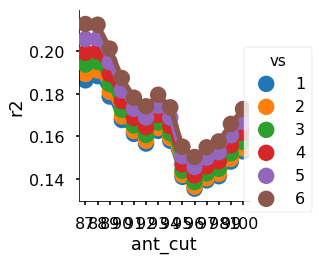

In [263]:
plt.close()
sns.factorplot(x='ant_cut', y='r2', hue='vs', data=resdf[resdf['mask']=='msk1'])
plt.show()

In [264]:
msk_dict = {'msk1': 'Whole Brain', 'msk2': 'No Cerebellum\nor Brainstem',
           'msk3': 'No Cerebellum\nBrainstem or\nHippocampus','msk4': 'Cortex Only'}
resdf['mask'] = [msk_dict[x] for x in resdf['mask']]

In [265]:
resdf.loc[:,'Split'] = [
        '%s\n%s'%(resdf.loc[x,'ant_cut'],resdf.loc[x,'post_cut']) for x in range(len(resdf))]

In [266]:
resdf.columns = resdf.columns[:5].tolist() + ['Voxel Radius'] + resdf.columns[6:].tolist()

In [267]:
split_tix = [resdf.Split.unique()[x] for x in range(0,len(resdf.Split.unique()),3)]

In [268]:
split_dict = dict(zip(resdf.Split.unique(),range(len(resdf.Split.unique()))))
resdf.loc[:,'Split ID'] = [split_dict[x] for x in resdf.Split] 

//anaconda/envs/py3/lib/python3.5/site-packages/seaborn/categorical.py:1508: FutureWarning: remove_na is deprecated and is a private function. Do not use.
  stat_data = remove_na(group_data[hue_mask])


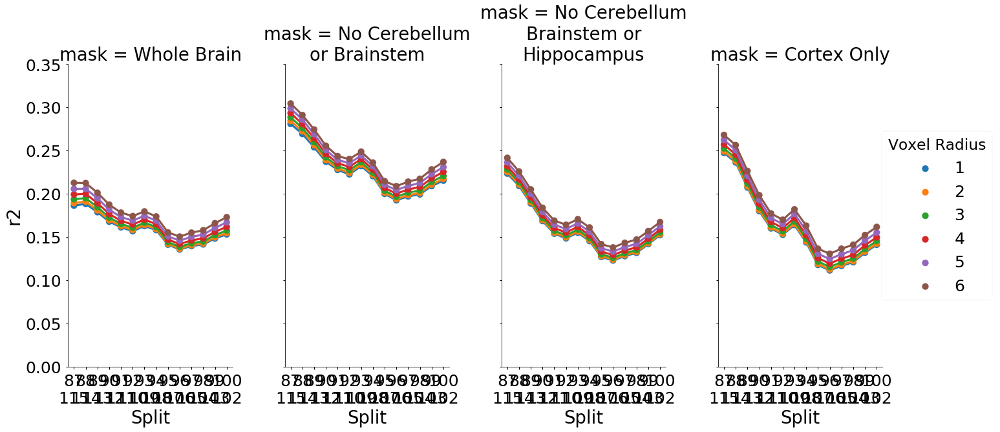

In [284]:
sns.set_context('notebook',font_scale=2.5)
plt.close()
sns.factorplot(x='Split', y='r2', hue='Voxel Radius', col='mask', 
               data=resdf, size=10, aspect=.5)
#plt.xticks(split_tix)
#plt.yticks([0.1, 0.15, 0.2, 0.25, 0.3])
#plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/figs/Hipp_Control_analysis.pdf',
#           bbox_inches = 'tight')
#plt.savefig('/Users/jakevogel/Dropbox/Work/Projects/AHBA_Hippocampus_AP/Hipp_Control_analysis.pdf',
#           bbox_inches = 'tight')
plt.ylim(0,0.35)
plt.show()

//anaconda/envs/py3/lib/python3.5/site-packages/seaborn/categorical.py:1508: FutureWarning: remove_na is deprecated and is a private function. Do not use.
  stat_data = remove_na(group_data[hue_mask])


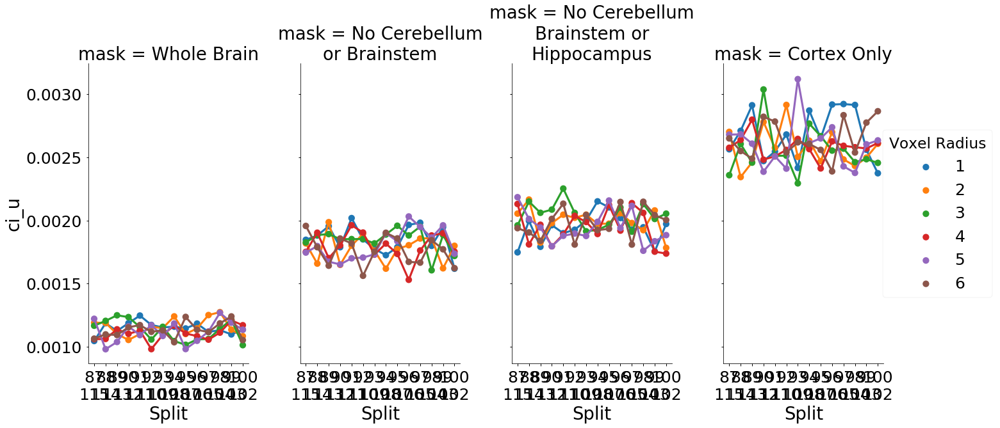

In [288]:
sns.set_context('notebook',font_scale=2.5)
plt.close()
sns.factorplot(x='Split', y='ci_u', hue='Voxel Radius', col='mask', data=resdf, size=10, aspect=.5)
#plt.fill(resdf.ci_l, resdf.ci_u)
#plt.ylim(0,0.3)
#plt.xticks(split_tix)
#plt.yticks([0.1, 0.15, 0.2, 0.25, 0.3])
#plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/figs/Hipp_Control_analysis.pdf',
#           bbox_inches = 'tight')
#plt.savefig('/Users/jakevogel/Dropbox/Work/Projects/AHBA_Hippocampus_AP/Hipp_Control_analysis.pdf',
#           bbox_inches = 'tight')
plt.show()

In [ ]:
jnk = pandas.concat([resdf,resdf])
jnk.index = range(len(jnk))
jnk.loc[]

In [196]:
jnk = pandas.concat([resdf[['Split','n_ant']],
                    resdf[['Split','n_post']]])
jnk.index = range(len(jnk.index))
jnk.columns = ['Split', 'n', 'Structure']
jnk.loc[jnk.index[len(resdf):],'n'] = resdf.n_post.values
jnk.loc[:,'Structure'] = (['Posterior'] * len(resdf)) + (['Anterior'] * len(resdf)) 

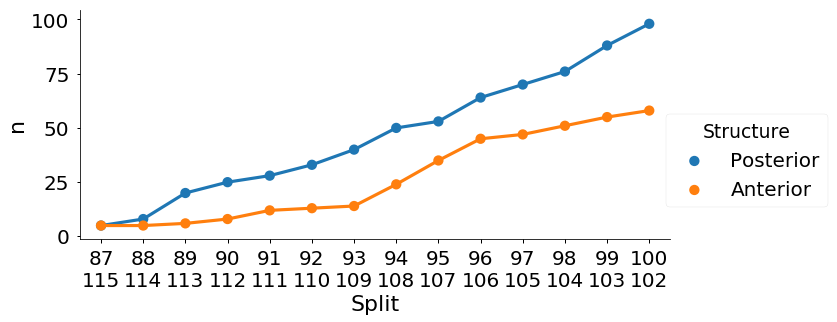

In [203]:
sns.set_context('notebook',font_scale=2)
plt.close()
sns.factorplot(x='Split', y='n', hue= 'Structure', data=jnk, size=5, aspect=2)
plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/figs/Hipp_Control_n.pdf',
           bbox_inches = 'tight')
plt.show()

In [100]:
dmin = min(df.position_along_hipp_AP_axis)+1
dmax = max(df.position_along_hipp_AP_axis)-4
drange = int((dmax-dmin)/2)
for i in range(drange+1):
    n_ant = len(df[df.position_along_hipp_AP_axis<dmin+i])
    n_post = len(df[df.position_along_hipp_AP_axis>dmax-i])
    print(dmin+i,dmax-i,'      ',n_ant,n_post)

87 115        5 5
88 114        8 5
89 113        20 6
90 112        25 8
91 111        28 12
92 110        33 13
93 109        40 14
94 108        50 24
95 107        53 35
96 106        64 45
97 105        70 47
98 104        76 51
99 103        88 55
100 102        98 58
101 101        104 60


In [105]:
labs.head()

,integer_label,label,frontal,occipital,temporal,parietal
0,1,Caudal anterior cingulate,1,0,0,0
1,2,Caudal middle frontal,1,0,0,0
2,3,Cuneus,0,1,0,0
3,4,entorinal,0,0,1,0
4,5,fusiform,0,0,1,0


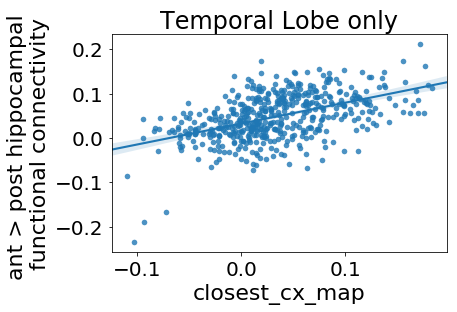

standard statistics: r2 = 0.240382322789, p = 4.4369944352e-32


,r2,p
3,0.240382,4.43699e-32


In [112]:
# Within lobar masks
fmsk = np.zeros_like(dkt)
for i,row in labs[labs.temporal==1].iterrows():
    fmsk[dkt==row['integer_label']] = 1
ant_cut = 94
post_cut = 108
ycol = 'position_along_hipp_AP_axis'
ccol = 'closest_cx_map'
msk = fmsk
gcx_col = 'AP_axis_gxp_signature_similarity_SPCR'
plabs = ['Temporal Lobe only',
         ccol,'ant > post hippocampal \nfunctional connectivity']
in_imgs = ['/Users/jakevogel/Science/AHBA/ant_img.nii.gz',
          '/Users/jakevogel/Science/AHBA/post_img.nii.gz']
run_hipp_connectivity_analysis(ant_cut, post_cut, df, ycol, 
                                   ccol, wdir, gdf, msk, gcx_col, plabs,
                                   del_img = True, diff_img = True,  vrad = 3,
                                  in_imgs = in_imgs, bootstrap = False, hue_vals=[],
                                  return_results=True)

In [295]:
# control analysis
ant_cut = 94
post_cut = 108
ant_xp = xp[xp.columns[df[df.position_along_hipp_AP_axis < ant_cut].index]].mean(1)
post_xp = xp[xp.columns[df[df.position_along_hipp_AP_axis > post_cut].index]].mean(1)
control_vec = post_xp - ant_xp
nvec = get_gene_vector(bigdf, control_vec)
gdf.loc[:,'control_vector'] = nvec

ycol = 'position_along_hipp_AP_axis'
ccol = 'closest_cx_map'
msk = msk3
gcx_col = 'control_vector'
plabs = ['Cortex and Subcortex \n(no cerebellum, brainstem, hippocampus)',
         'ant > post gene expression','ant > post hippocampal \nfunctional connectivity']
in_imgs = []
run_hipp_connectivity_analysis(ant_cut, post_cut, df, ycol, 
                                   ccol, wdir, gdf, msk, gcx_col, plabs,
                                   del_img = True, diff_img = True,  vrad = 3,
                                  in_imgs = in_imgs, bootstrap = False, hue_vals=[],
                                  return_results=True)

0        0.001254
1       -0.071644
2        0.004821
3       -0.192550
4       -0.112686
5       -0.145249
6       -0.310876
7        0.051659
8       -0.568451
9        0.075269
10      -0.174006
11       0.309473
12       0.260167
13      -0.073793
14      -0.972404
15       0.032574
16       0.191798
17      -0.261108
18      -0.207114
19       0.174921
20       0.206280
21      -0.016856
22      -0.575937
23       0.024427
24       0.037170
25       0.002330
26      -0.312504
27      -0.227675
28       0.257096
29       0.133332
           ...   
58662    0.011075
58663   -0.096166
58664   -0.077226
58665    0.337615
58666   -0.022080
58667   -0.177474
58668    0.398560
58669   -0.300068
58670    0.428101
58671    0.841888
58672    0.361013
58673   -0.260915
58674    0.008820
58675    0.177135
58676   -0.191577
58677   -0.223381
58678   -0.357802
58679   -0.053108
58680    1.151650
58681   -0.235163
58682   -0.338572
58683   -0.018652
58684   -0.019217
58685    0.089712
58686    0

# Cognitive fmri meta-analysis

In [11]:
#OKAY, NOW REPEAT WITH ALL 100 MAPS
metascans = sorted(glob('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/cognition_mri_analysis/all_maps_RI/r*.nii.gz'))
print(len(metascans))
metascans[0]

100


'/home/users/jvogel/Science/Allen_Human_Brain_Atlas/cognition_mri_analysis/all_maps_RI/rv4-topics-100_0_stimulation_somatosensory_tms_pFgA_z_FDR_0_img.nii.gz'

In [12]:
metalabs = ['T%s_%s_%s'%(os.path.split(x)[-1].split('_')[1],
                         os.path.split(x)[-1].split('_')[3],
                         os.path.split(x)[-1].split('_')[-5]) for x in metascans]
metares_a = pandas.DataFrame(index=gdf.index,columns = metalabs)
metares_a.shape

(3702, 100)

In [14]:
allmetas = image.load_img(metascans).get_data()

In [35]:
#col = 'AP_axis_gxp_signature_similarity_SPCR'
col = 'vec2700'
for i,row in gdf.iterrows():
    xs,ys,zs = make_sphere(convert_coords([row['mni_nlin_x'],row['mni_nlin_y'],row['mni_nlin_z']],'xyz'), 3)
    for img in range(allmetas.shape[-1]):
        if allmetas[xs,ys,zs,img].mean() > 0:
            metares_a.loc[i,metalabs[img]] = row[col]
    if i%100 == 0:
        print('finished %s of 3702'%i)

finished 0 of 3702
finished 100 of 3702
finished 200 of 3702
finished 300 of 3702
finished 400 of 3702
finished 500 of 3702
finished 600 of 3702
finished 700 of 3702
finished 800 of 3702
finished 900 of 3702
finished 1000 of 3702
finished 1100 of 3702
finished 1200 of 3702
finished 1300 of 3702
finished 1400 of 3702
finished 1500 of 3702
finished 1600 of 3702
finished 1700 of 3702
finished 1800 of 3702
finished 1900 of 3702
finished 2000 of 3702
finished 2100 of 3702
finished 2200 of 3702
finished 2300 of 3702
finished 2400 of 3702
finished 2500 of 3702
finished 2600 of 3702
finished 2700 of 3702
finished 2800 of 3702
finished 2900 of 3702
finished 3000 of 3702
finished 3100 of 3702
finished 3200 of 3702
finished 3300 of 3702
finished 3400 of 3702
finished 3500 of 3702
finished 3600 of 3702
finished 3700 of 3702


In [36]:
map_sizes = []
for i in range(allmetas.shape[-1]):
    jnk = allmetas[:,:,:,i]
    map_sizes.append(len(jnk[jnk>0]))

In [62]:
del(allmetas)

In [37]:
map_hits = []
for col in metares_a.columns:
    jnk = metares_a[col]
    map_hits.append(len([x for x in jnk.values if pandas.notnull(x)]))

In [38]:
res_sum = pandas.DataFrame(index = metares_a.columns)
res_sum.loc[:,'mean'] = metares_a.mean().values
res_sum.loc[:,'sem'] = metares_a.sem().values
res_sum.loc[:,'map_size'] = map_sizes
res_sum.loc[:,'map_hits'] = map_hits

In [39]:
res_sum.sort_values('mean').head()

,mean,sem,map_size,map_hits
T29_delayed_pFgA,-5.489931,1.155251,1848,20
T50_training_pFgA,-2.396132,0.410920,6272,56
T93_eyes_pFgA,-2.249750,0.097130,146429,398
T75_space_pFgA,-2.231072,0.181516,135638,445
T68_working_pFgA,-1.915114,0.139555,158737,429


In [40]:
cols = ['mean','sem']
for col in cols:
    wtd = (res_sum[col].values * res_sum.map_hits.values
          ) / (res_sum[col].values + res_sum.map_hits.values)
    res_sum.loc[:,'wtd_%s'%col] = wtd

In [41]:
res_sum.sort_values('mean').head()

,mean,sem,map_size,map_hits,wtd_mean,wtd_sem
T29_delayed_pFgA,-5.489931,1.155251,1848,20,-7.567064,1.092165
T50_training_pFgA,-2.396132,0.410920,6272,56,-2.503241,0.407926
T93_eyes_pFgA,-2.249750,0.097130,146429,398,-2.262539,0.097106
T75_space_pFgA,-2.231072,0.181516,135638,445,-2.242314,0.181442
T68_working_pFgA,-1.915114,0.139555,158737,429,-1.923702,0.139509


In [42]:
goodlabs = metares_a.mean().dropna().index
len(goodlabs)
metaresb = metares_a[goodlabs]
metaresb = metaresb[metaresb.mean().sort_values().index]

In [43]:
ATLabs = ['T65','T60','T17','T20','T90']
PMLabs = ['T56','T24','T40','T14','T75']
for top in res_sum.index:
    tnum = top.split('_')[0]
    if tnum in ATLabs:
        res_sum.loc[top,'system'] = 'AT'
    elif tnum in PMLabs:
        res_sum.loc[top,'system'] = 'PM'
res_sum2 = res_sum.loc[metaresb.columns]

In [44]:
goodlabs = res_sum[res_sum.map_hits>100].index
len(goodlabs)
metares100 = metares_a[goodlabs]
metares100 = metares100[metares100.mean().sort_values().index]

In [45]:
res_sum3 = res_sum.loc[metares100.columns]

In [46]:
len(res_sum3)

54

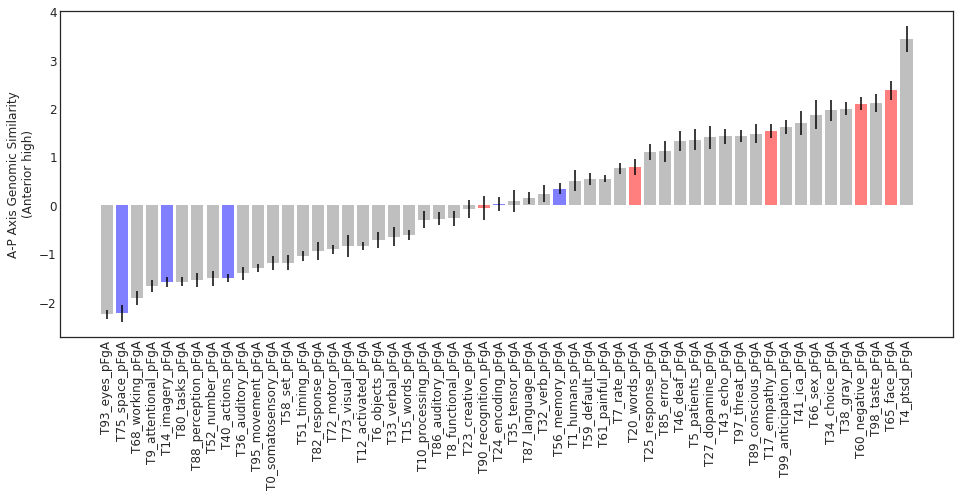

In [47]:
means = metares100.mean().tolist()
stds = metares100.sem().tolist()
cis = [((means[x]-stds[x]),(means[x]+stds[x])) for x in range(len(means))]

# get the range of the confidence interval
#y_r = [means[i] - cis[i][1] for i in range(len(cis))]
#y_r = [cis[i][0] - means[i] for i in range(len(cis))]
y_r = [((cis[i][0] - means[i]) + (means[i] - cis[i][1]))/2 for i in range(len(cis))]

colors = ['red' if res_sum3.loc[x,'system'] == 'AT' else 'blue' if res_sum3.loc[x,'system'] == 'PM' else 'gray' for x in metares100.columns]
plt.close()
sns.set_style('white')
fig, ax = plt.subplots(figsize=(16,6))
fig = plt.bar(range(len(means)), means, yerr=y_r, alpha=0.5, align='center', color = colors,
             )
plt.xticks(range(len(means)), metares100.mean().dropna().index.tolist())
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
ax.set_ylabel('A-P Axis Genomic Similarity\n(Anterior high)')
for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
             ax.get_xticklabels() + ax.get_yticklabels()):
    item.set_fontsize(12)
plt.show()

In [48]:
goodlabs = res_sum[res_sum.map_hits>300].index
len(goodlabs)
metares300 = metares_a[goodlabs]
metares300 = metares300[metares300.mean().sort_values().index]

In [49]:
res_sum4 = res_sum.loc[metares300.columns]
res_sum4.shape

(34, 7)

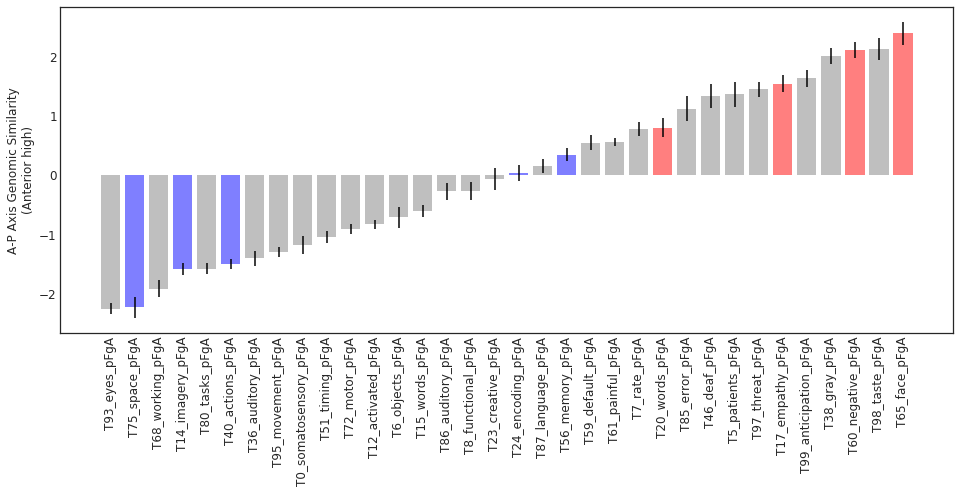

In [50]:
means = (metares300.mean()).tolist()
stds = metares300.sem().tolist()
cis = [((means[x]-stds[x]),(means[x]+stds[x])) for x in range(len(means))]

# get the range of the confidence interval
#y_r = [means[i] - cis[i][1] for i in range(len(cis))]
#y_r = [cis[i][0] - means[i] for i in range(len(cis))]
y_r = [((cis[i][0] - means[i]) + (means[i] - cis[i][1]))/2 for i in range(len(cis))]

colors = ['red' if res_sum4.loc[x,'system'] == 'AT' else 'blue' if res_sum4.loc[x,'system'] == 'PM' else 'gray' for x in metares300.columns]
plt.close()
sns.set_style('white')
fig, ax = plt.subplots(figsize=(16,6))
fig = plt.bar(range(len(means)), means, yerr=y_r, alpha=0.5, align='center', color = colors,
             )
plt.xticks(range(len(means)), metares300.mean().dropna().index.tolist())
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
ax.set_ylabel('A-P Axis Genomic Similarity\n(Anterior high)')
for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
             ax.get_xticklabels() + ax.get_yticklabels()):
    item.set_fontsize(12)
plt.show()

# Relative and absolute expression

In [101]:
shtz = sorted(glob(os.path.join(wdir,'normalized_microarray_donor*/PACall.csv')))
holder = []
for sht in shtz:
    jnk = pandas.read_csv(sht,header=None)
    jnk.drop(jnk.columns[0],axis=1,inplace=True)
    holder.append(jnk)
bigdf_b = pandas.concat(holder,axis=1)
del(holder)

In [92]:
hipp_samps = []
for col in xp.columns:
    jnk = col.split('_')
    sub = jnk[0]
    samp = jnk[-1]
    idx = gdf[(gdf.donor==int(sub)) & (gdf['sample']==int(samp))].index
    hipp_samps.append(idx[0])
#hipp_samps = list(np.array(hipp_samps) + 1)

In [102]:
bin_hipp = bigdf_b.iloc[:,hipp_samps]
bin_hipp.shape

(58692, 170)

In [103]:
del(bigdf_b)

In [104]:
bin_hipp_a = bin_hipp.loc[pcalr_out_NEW['gene_selections']['anterior_genes_50']]
bin_hipp_p = bin_hipp.loc[pcalr_out_NEW['gene_selections']['posterior_genes_50']]

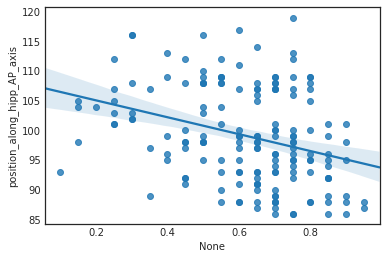

In [105]:
plt.close()
sns.regplot(bin_hipp_a.mean(),df.position_along_hipp_AP_axis)
plt.show()

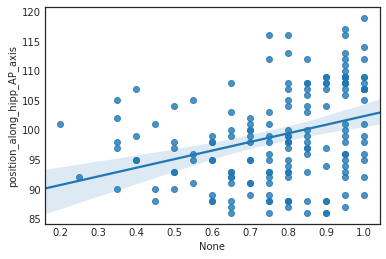

In [106]:
plt.close()
sns.regplot(bin_hipp_p.mean(),df.position_along_hipp_AP_axis)
plt.show()

In [107]:
wdir = '/data1/users/jvogel/Allen_Human_Brain_Atlas/'
shtz = sorted(glob(os.path.join(wdir,'normalized_microarray_donor*/MExp_all_genes_ctr_for_donor')))
holder = []
for sht in shtz:
    holder.append(pandas.read_csv(sht,index_col=0))
bigdf = pandas.concat(holder,axis=1)
del(holder)
ncols = ['%s_%s'%(gdf.loc[x,'donor'],bigdf.columns[x]) for x in range(gdf.shape[0])]
bigdf.columns = ncols

In [108]:
gx_hipp = bigdf.iloc[:,hipp_samps]
gx_hipp_a = gx_hipp.loc[pcalr_out_NEW['gene_selections']['anterior_genes_50']]
gx_hipp_p = gx_hipp.loc[pcalr_out_NEW['gene_selections']['posterior_genes_50']]

In [109]:
del(bigdf)

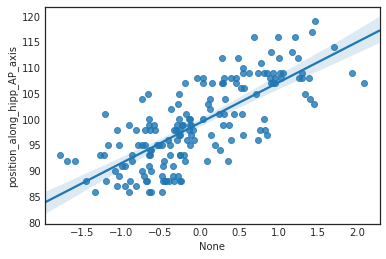

In [112]:
plt.close()
sns.regplot(gx_hipp_p.mean(),df.position_along_hipp_AP_axis)
plt.show()

-5.09279587183


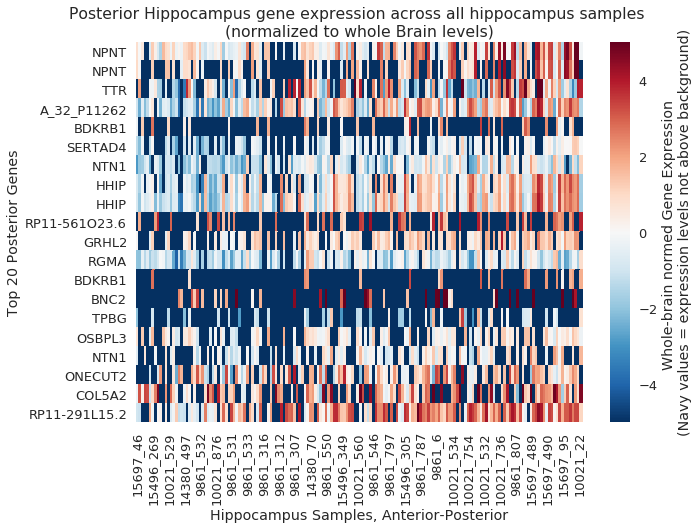

In [145]:
cutdf = pandas.DataFrame(gx_hipp_a,copy=True)
for i in range(cutdf.shape[0]):
    cutdf.loc[cutdf.index[i]] = [cutdf.values[i,x] if bin_hipp_a.values[i,x] == 1 else np.nan for x in range(cutdf.shape[-1])]
minval = min(cutdf.values.flat)
print(minval)
    
cutdf1 = pandas.DataFrame(gx_hipp_a,copy=True)
for i in range(cutdf1.shape[0]):
    cutdf1.loc[cutdf1.index[i]] = [cutdf1.values[i,x] if bin_hipp_a.values[i,x] == 1 else -10 for x in range(cutdf1.shape[-1])]

sortr = pandas.DataFrame(cutdf,copy=True)
sortr.loc['position'] = df.position_along_hipp_AP_axis.values
sortr = sortr.sort_values('position',axis=1,ascending=False)
plotr = cutdf1.loc[cutdf.index.tolist()[::-1],sortr.columns]
plotr.index = probes.loc[plotr.index]['gene_symbol']
plotr

plt.close()
sns.set_context('talk')
fig,ax = plt.subplots(figsize=(10,7))
sns.heatmap(plotr,cmap='RdBu_r',vmin = -5, vmax=5,
            cbar_kws={'label': 'Whole-brain normed Gene Expression \n(Navy values = expression levels not above background)'})
plt.title('Posterior Hippocampus gene expression across all hippocampus samples \n(normalized to whole Brain levels)')
plt.ylabel('Top 20 Posterior Genes')
plt.xlabel('Hippocampus Samples, Anterior-Posterior')
plt.show()

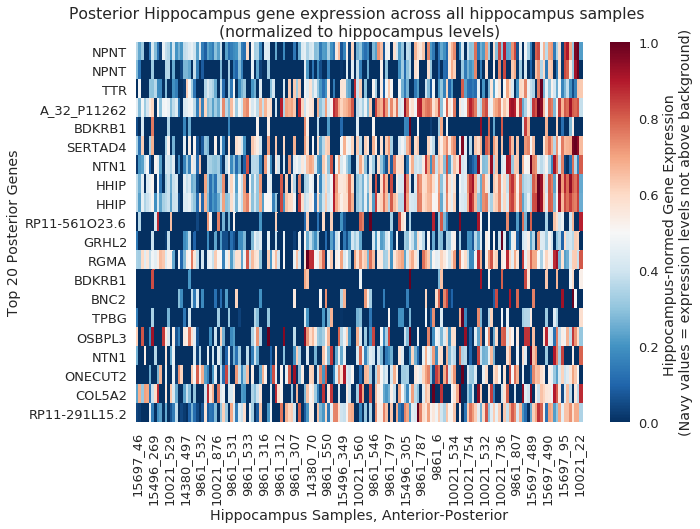

In [126]:
cutdf = pandas.DataFrame(gx_hipp_a,copy=True)
for i in range(cutdf.shape[0]):
    cutdf.loc[cutdf.index[i]] = [cutdf.values[i,x] if bin_hipp_a.values[i,x] == 1 else np.nan for x in range(cutdf.shape[-1])]

mat = np.zeros_like(cutdf.values)
for i in range(cutdf.shape[0]):
    jnk = MinMaxScaler().fit(cutdf.loc[cutdf.index[i]].dropna().values.reshape(-1,1))
    for j,x in enumerate(cutdf.loc[cutdf.index[i]].values):
        if pandas.notnull(x):
            mat[i,j] = jnk.transform(x)
cutdf = pandas.DataFrame(mat, index = cutdf.index, columns = cutdf.columns)

sortr = pandas.DataFrame(cutdf,copy=True)
sortr.loc['position'] = df.position_along_hipp_AP_axis.values
sortr = sortr.sort_values('position',axis=1,ascending=False)
plotr = cutdf.loc[cutdf.index.tolist()[::-1],sortr.columns]
plotr.index = probes.loc[plotr.index]['gene_symbol']

plt.close()
fig,ax = plt.subplots(figsize=(10,7))
sns.heatmap(plotr,cmap='RdBu_r',
            cbar_kws={'label': 'Hippocampus-normed Gene Expression \n(Navy values = expression levels not above background)'})
plt.title('Posterior Hippocampus gene expression across all hippocampus samples \n(normalized to hippocampus levels)')
plt.ylabel('Top 20 Posterior Genes')
plt.xlabel('Hippocampus Samples, Anterior-Posterior')
plt.show()

-5.27886886052


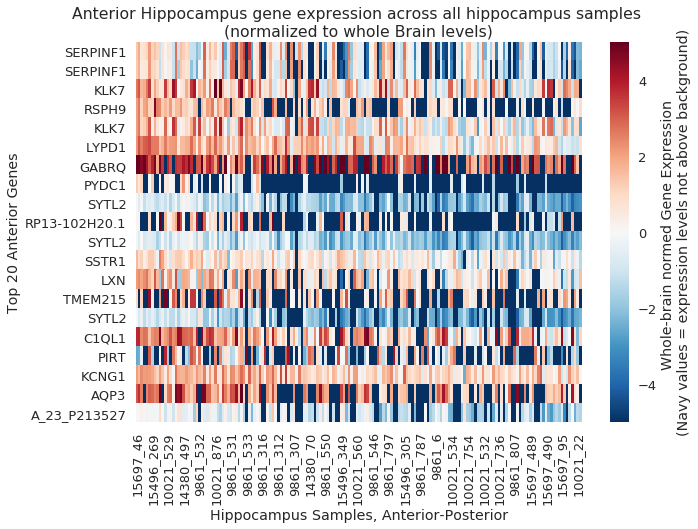

In [147]:
cutdf = pandas.DataFrame(gx_hipp_p,copy=True)
for i in range(cutdf.shape[0]):
    cutdf.loc[cutdf.index[i]] = [cutdf.values[i,x] if bin_hipp_p.values[i,x] == 1 else np.nan for x in range(cutdf.shape[-1])]
minval = min(cutdf.values.flat)
print(minval)
    
cutdf1 = pandas.DataFrame(gx_hipp_p,copy=True)
for i in range(cutdf1.shape[0]):
    cutdf1.loc[cutdf1.index[i]] = [cutdf1.values[i,x] if bin_hipp_p.values[i,x] == 1 else -10 for x in range(cutdf1.shape[-1])]

sortr = pandas.DataFrame(cutdf,copy=True)
sortr.loc['position'] = df.position_along_hipp_AP_axis.values
sortr = sortr.sort_values('position',axis=1,ascending=False)
plotr = cutdf1[sortr.columns]
plotr.index = probes.loc[plotr.index]['gene_symbol']

plt.close()
sns.set_context('talk')
fig,ax = plt.subplots(figsize=(10,7))
sns.heatmap(plotr,cmap='RdBu_r',vmin = -5, vmax = 5, 
            cbar_kws={'label': 'Whole-brain normed Gene Expression \n(Navy values = expression levels not above background)'})
plt.title('Anterior Hippocampus gene expression across all hippocampus samples \n(normalized to whole Brain levels)')
plt.ylabel('Top 20 Anterior Genes')
plt.xlabel('Hippocampus Samples, Anterior-Posterior')
plt.show()

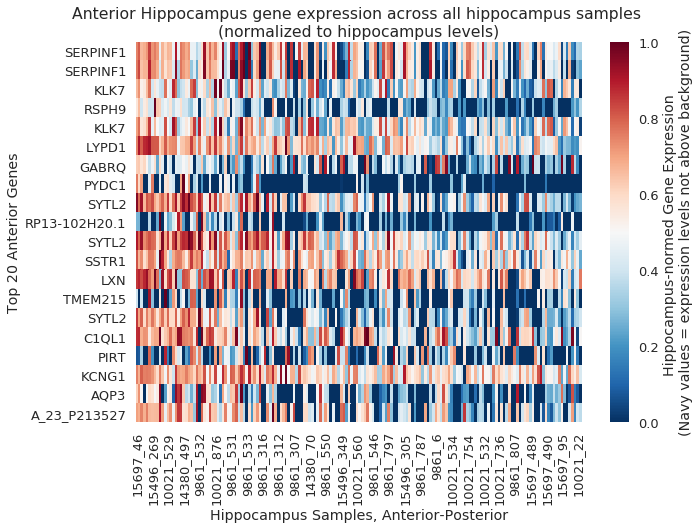

In [128]:
cutdf = pandas.DataFrame(gx_hipp_p,copy=True)
for i in range(cutdf.shape[0]):
    cutdf.loc[cutdf.index[i]] = [cutdf.values[i,x] if bin_hipp_p.values[i,x] == 1 else np.nan for x in range(cutdf.shape[-1])]

mat = np.zeros_like(cutdf.values)
for i in range(cutdf.shape[0]):
    jnk = MinMaxScaler().fit(cutdf.loc[cutdf.index[i]].dropna().values.reshape(-1,1))
    for j,x in enumerate(cutdf.loc[cutdf.index[i]].values):
        if pandas.notnull(x):
            mat[i,j] = jnk.transform(x)
cutdf = pandas.DataFrame(mat, index = cutdf.index, columns = cutdf.columns)

sortr = pandas.DataFrame(cutdf,copy=True)
sortr.loc['position'] = df.position_along_hipp_AP_axis.values
sortr = sortr.sort_values('position',axis=1,ascending=False)
plotr = cutdf[sortr.columns]
plotr.index = probes.loc[plotr.index]['gene_symbol']

plt.close()
fig,ax = plt.subplots(figsize=(10,7))
sns.heatmap(plotr,cmap='RdBu_r',
            cbar_kws={'label': 'Hippocampus-normed Gene Expression \n(Navy values = expression levels not above background)'})
plt.title('Anterior Hippocampus gene expression across all hippocampus samples \n(normalized to hippocampus levels)')
plt.ylabel('Top 20 Anterior Genes')
plt.xlabel('Hippocampus Samples, Anterior-Posterior')
plt.show()

In [129]:
df.loc[:,'a20_SPCR_NEW_expression'] = gx_hipp_a.mean().values
df.loc[:,'a20_SPCR_NEW_bin_xp'] = bin_hipp_a.mean().values
df.loc[:,'p20_SPCR_NEW_expression'] = gx_hipp_p.mean().values
df.loc[:,'p20_SPCR_NEW_bin_xp'] = bin_hipp_p.mean().values

In [16]:
xp.shape

(58692, 170)

In [21]:
gx_hipp_a = xp.loc[pcalr_out_NEW['gene_selections']['anterior_genes_20']]
gx_hipp_p = xp.loc[pcalr_out_NEW['gene_selections']['posterior_genes_20']]

In [32]:
wtd_gxha = (pcalr_out_NEW['betas'][pcalr_out_NEW['gene_selections']['anterior_genes_20']
                                 ] * gx_hipp_a.T).T
wtd_gxhp = (pcalr_out_NEW['betas'][pcalr_out_NEW['gene_selections']['posterior_genes_20']
                                 ] * gx_hipp_p.T).T

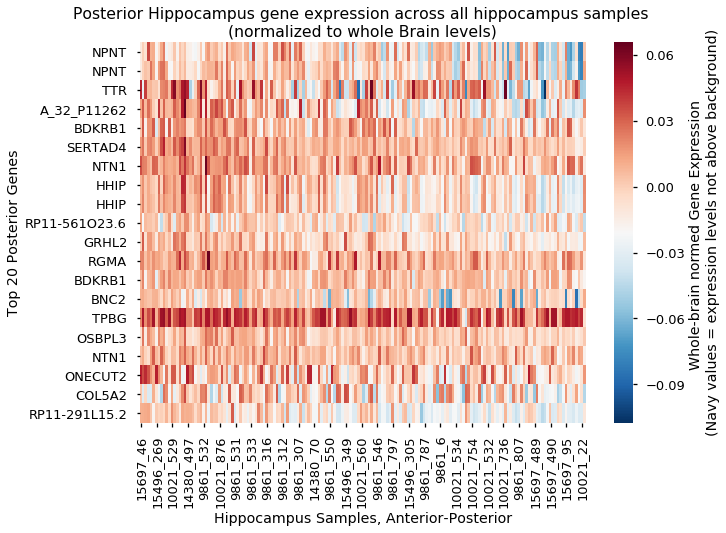

In [37]:
cutdf = pandas.DataFrame(wtd_gxha,copy=True)

sortr = pandas.DataFrame(cutdf,copy=True)
sortr.loc['position'] = df.position_along_hipp_AP_axis.values
sortr = sortr.sort_values('position',axis=1,ascending=False)
plotr = cutdf.loc[cutdf.index.tolist()[::-1],sortr.columns]
plotr.index = probes.loc[plotr.index]['gene_symbol']
plotr

plt.close()
sns.set_context('talk')
fig,ax = plt.subplots(figsize=(10,7))
sns.heatmap(plotr,cmap='RdBu_r',
            cbar_kws={'label': 'Whole-brain normed Gene Expression \n(Navy values = expression levels not above background)'})
plt.title('Posterior Hippocampus gene expression across all hippocampus samples \n(normalized to whole Brain levels)')
plt.ylabel('Top 20 Posterior Genes')
plt.xlabel('Hippocampus Samples, Anterior-Posterior')
plt.show()

In [51]:
jnk.transform(x.reshape(-1,1))[0][0]

0.50640794555939095

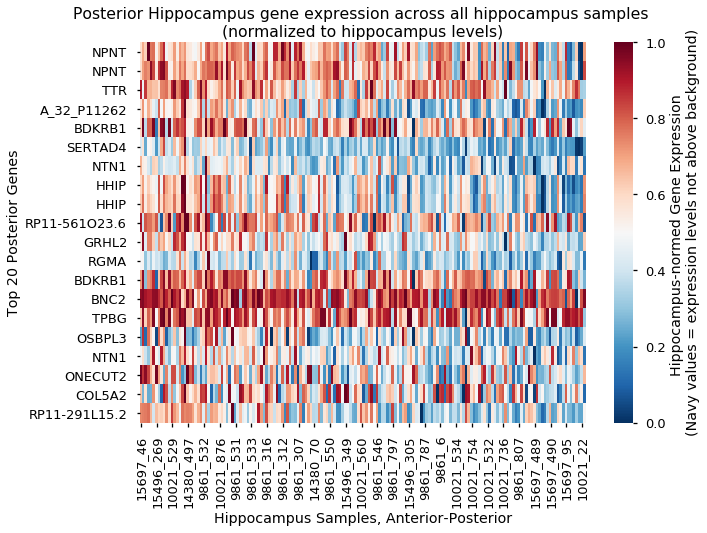

In [52]:
cutdf = pandas.DataFrame(wtd_gxha,copy=True)

mat = np.zeros_like(cutdf.values)
for i in range(cutdf.shape[0]):
    jnk = MinMaxScaler().fit(cutdf.loc[cutdf.index[i]].dropna().values.reshape(-1,1))
    for j,x in enumerate(cutdf.loc[cutdf.index[i]].values):
        if pandas.notnull(x):
            mat[i,j] = jnk.transform(x.reshape(-1,1))[0][0]
cutdf = pandas.DataFrame(mat, index = cutdf.index, columns = cutdf.columns)

sortr = pandas.DataFrame(cutdf,copy=True)
sortr.loc['position'] = df.position_along_hipp_AP_axis.values
sortr = sortr.sort_values('position',axis=1,ascending=False)
plotr = cutdf.loc[cutdf.index.tolist()[::-1],sortr.columns]
plotr.index = probes.loc[plotr.index]['gene_symbol']

plt.close()
fig,ax = plt.subplots(figsize=(10,7))
sns.heatmap(plotr,cmap='RdBu_r',
            cbar_kws={'label': 'Hippocampus-normed Gene Expression \n(Navy values = expression levels not above background)'})
plt.title('Posterior Hippocampus gene expression across all hippocampus samples \n(normalized to hippocampus levels)')
plt.ylabel('Top 20 Posterior Genes')
plt.xlabel('Hippocampus Samples, Anterior-Posterior')
plt.show()

In [ ]:
print(gene)
plt.close()
sns.regplot(list(range(len(row.values[i,:]))),
            row.values[i,:])
plt.show()

In [187]:
row.shape

(2, 170)

In [192]:
post50 = pandas.read_csv('/Users/jakevogel/Science/AHBA/Post50Gxp_norm.csv',
                        index_col=0)
#for gene in post50.index.unique():
    row = post50.loc[gene]
    if len(row.shape) == 1:
        print(gene)
        plt.close()
        sns.regplot(df.sort_values('position_along_hipp_AP_axis'
                                      )['position_along_hipp_AP_axis'].values,
                    row.values)
        plt.show()
    else:
        for i in range(len(row)):
            print(gene)
            plt.close()
            sns.regplot(df.sort_values('position_along_hipp_AP_axis'
                                      )['position_along_hipp_AP_axis'].values,
                        row.values[i,:])
            plt.show()

IndentationError: unexpected indent (<ipython-input-192-5e8daad76fd4>, line 4)

In [193]:
post50 = pandas.read_csv('/Users/jakevogel/Science/AHBA/Ant50Gxp_norm.csv',
                        index_col=0)
#for gene in post50.index.unique():
    row = post50.loc[gene]
    if len(row.shape) == 1:
        print(gene)
        plt.close()
        sns.regplot(df.sort_values('position_along_hipp_AP_axis'
                                      )['position_along_hipp_AP_axis'].values,
                    row.values)
        plt.show()
    else:
        for i in range(len(row)):
            print(gene)
            plt.close()
            sns.regplot(df.sort_values('position_along_hipp_AP_axis'
                                      )['position_along_hipp_AP_axis'].values,
                        row.values[i,:])
            plt.show()

IndentationError: unexpected indent (<ipython-input-193-65132da09e8a>, line 4)

# RENDER RESULTS

In [132]:
input_coords = []
for i,row in df.iterrows():
    input_coords.append(convert_coords([row['mni_nlin_x'], row['mni_nlin_y'], row['mni_nlin_z']],'xyz'))
for col in df.columns[-4:]:
    lab = 'hipp_only_%s'%col
    make_expression_image(df[col], input_coords, projection_space = mni, 
                          wdir = wdir, nm = lab, vrad=3)
    print('finished',lab)

finished hipp_only_a20_SPCR_NEW_expression
finished hipp_only_a20_SPCR_NEW_bin_xp
finished hipp_only_p20_SPCR_NEW_expression
finished hipp_only_p20_SPCR_NEW_bin_xp


In [133]:
a20_hipp_xp = ni.load(
        '/home/users/jvogel/Science/Allen_Human_Brain_Atlas/hipp_only_a20_SPCR_NEW_expression_xp_image.nii.gz'
                    ).get_data()

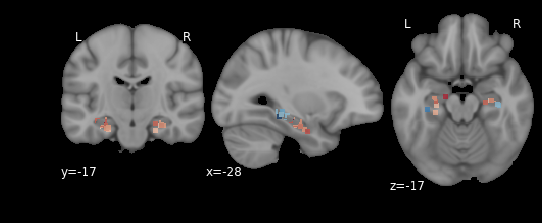

In [136]:
a20_hipp_xp = ni.load(
        '/home/users/jvogel/Science/Allen_Human_Brain_Atlas/hipp_only_a20_SPCR_NEW_expression_xp_image.nii.gz'
                    )
p20_hipp_xp = ni.load(
        '/home/users/jvogel/Science/Allen_Human_Brain_Atlas/hipp_only_p20_SPCR_NEW_expression_xp_image.nii.gz'
                    )
plt.close()
plotting.plot_roi(p20_hipp_xp, mni, draw_cross=False, cmap='RdBu_r')
plt.show()

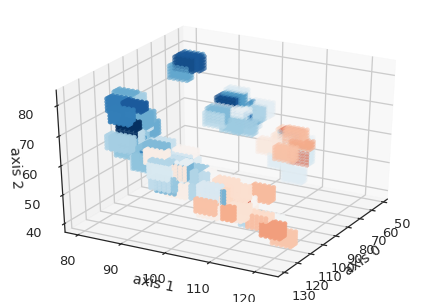

In [137]:
label_locations = np.where(a20_hipp_xp.get_data() != 0)
#label_locations1 = np.where(ap_axis.get_data() > 0)
fig = plt.figure()
ax = Axes3D(fig)
ax.scatter(label_locations[0], label_locations[1], label_locations[2], c = a20_hipp_xp.get_data()[label_locations],
          cmap='RdBu')
# To split into LR, we need to visualize where the LR split is, where front is
for angle in range(0, 30):
    ax.view_init(30, angle)
    plt.draw()
    plt.pause(.001)

ax.set_xlabel('axis 0')
ax.set_ylabel('axis 1')
ax.set_zlabel('axis 2')
plt.show()



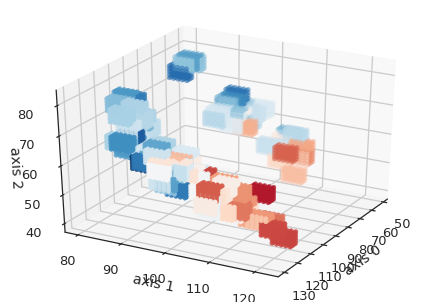

In [139]:
label_locations = np.where(p20_hipp_xp.get_data() != 0)
#label_locations1 = np.where(ap_axis.get_data() > 0)
fig = plt.figure()
ax = Axes3D(fig)
ax.scatter(label_locations[0], label_locations[1], label_locations[2], c = p20_hipp_xp.get_data()[label_locations],
          cmap='RdBu_r')
# To split into LR, we need to visualize where the LR split is, where front is
for angle in range(0, 30):
    ax.view_init(30, angle)
    plt.draw()
    plt.pause(.001)

ax.set_xlabel('axis 0')
ax.set_ylabel('axis 1')
ax.set_zlabel('axis 2')
plt.show()



# GSEA Analysis

In [209]:
#gsea = pandas.read_table('/Users/jakevogel/Downloads/overlap')
gsea = pandas.read_table('/Users/jakevogel/Downloads/overlap-2')
print(gsea.shape)
gsea.head()

(60, 13)


,Entrez Gene Id,Gene Symbol,Gene Description,GO_INTRINSIC_COMPONENT_OF_PLASMA_MEMBRANE,GO_SIGNALING_RECEPTOR_ACTIVITY,GO_SIGNAL_TRANSDUCER_ACTIVITY,GO_NEGATIVE_REGULATION_OF_MULTICELLULAR_ORGANISMAL_PROCESS,GO_TISSUE_DEVELOPMENT,GO_ORGAN_MORPHOGENESIS,GO_RECEPTOR_ACTIVITY,GO_BEHAVIOR,GO_REGULATION_OF_MULTICELLULAR_ORGANISMAL_DEVELOPMENT,GO_REGULATION_OF_CELL_DIFFERENTIATION
0,4986,OPRK1,"opioid receptor, kappa 1",GO_INTRINSIC_COMPONENT_OF_PLASMA_MEMBRANE,GO_SIGNALING_RECEPTOR_ACTIVITY,GO_SIGNAL_TRANSDUCER_ACTIVITY,GO_NEGATIVE_REGULATION_OF_MULTICELLULAR_ORGANI...,NaN,NaN,GO_RECEPTOR_ACTIVITY,GO_BEHAVIOR,NaN,NaN
1,54112,GPR88,G protein-coupled receptor 88,GO_INTRINSIC_COMPONENT_OF_PLASMA_MEMBRANE,GO_SIGNALING_RECEPTOR_ACTIVITY,GO_SIGNAL_TRANSDUCER_ACTIVITY,NaN,NaN,NaN,GO_RECEPTOR_ACTIVITY,GO_BEHAVIOR,NaN,NaN
2,846,CASR,calcium-sensing receptor,GO_INTRINSIC_COMPONENT_OF_PLASMA_MEMBRANE,GO_SIGNALING_RECEPTOR_ACTIVITY,GO_SIGNAL_TRANSDUCER_ACTIVITY,NaN,NaN,NaN,GO_RECEPTOR_ACTIVITY,GO_BEHAVIOR,NaN,NaN
3,948,CD36,CD36 molecule (thrombospondin receptor),GO_INTRINSIC_COMPONENT_OF_PLASMA_MEMBRANE,GO_SIGNALING_RECEPTOR_ACTIVITY,GO_SIGNAL_TRANSDUCER_ACTIVITY,NaN,NaN,NaN,GO_RECEPTOR_ACTIVITY,NaN,NaN,GO_REGULATION_OF_CELL_DIFFERENTIATION
4,6751,SSTR1,somatostatin receptor 1,GO_INTRINSIC_COMPONENT_OF_PLASMA_MEMBRANE,GO_SIGNALING_RECEPTOR_ACTIVITY,GO_SIGNAL_TRANSDUCER_ACTIVITY,NaN,NaN,NaN,GO_RECEPTOR_ACTIVITY,NaN,NaN,NaN


In [210]:
gsea.columns

Index(['Entrez Gene Id', 'Gene Symbol', 'Gene Description',
       'GO_INTRINSIC_COMPONENT_OF_PLASMA_MEMBRANE',
       'GO_SIGNALING_RECEPTOR_ACTIVITY', 'GO_SIGNAL_TRANSDUCER_ACTIVITY',
       'GO_NEGATIVE_REGULATION_OF_MULTICELLULAR_ORGANISMAL_PROCESS',
       'GO_TISSUE_DEVELOPMENT', 'GO_ORGAN_MORPHOGENESIS',
       'GO_RECEPTOR_ACTIVITY', 'GO_BEHAVIOR',
       'GO_REGULATION_OF_MULTICELLULAR_ORGANISMAL_DEVELOPMENT',
       'GO_REGULATION_OF_CELL_DIFFERENTIATION'],
      dtype='object')

In [211]:
ngsea = pandas.DataFrame(np.zeros_like(gsea.values),copy=True)
ngsea.columns = gsea.columns
for col in gsea.columns[:3]:
    ngsea.loc[:,col] = gsea[col].values

In [212]:
for i in gsea.index:
    for col in gsea.columns[3:]:
        val = gsea.loc[i,col]
        if pandas.notnull(val):
            ngsea.loc[i,val] = 1

In [213]:
ngsea.head()

,Entrez Gene Id,Gene Symbol,Gene Description,GO_INTRINSIC_COMPONENT_OF_PLASMA_MEMBRANE,GO_SIGNALING_RECEPTOR_ACTIVITY,GO_SIGNAL_TRANSDUCER_ACTIVITY,GO_NEGATIVE_REGULATION_OF_MULTICELLULAR_ORGANISMAL_PROCESS,GO_TISSUE_DEVELOPMENT,GO_ORGAN_MORPHOGENESIS,GO_RECEPTOR_ACTIVITY,GO_BEHAVIOR,GO_REGULATION_OF_MULTICELLULAR_ORGANISMAL_DEVELOPMENT,GO_REGULATION_OF_CELL_DIFFERENTIATION
0,4986,OPRK1,"opioid receptor, kappa 1",1,1,1,1,0,0,1,1,0,0
1,54112,GPR88,G protein-coupled receptor 88,1,1,1,0,0,0,1,1,0,0
2,846,CASR,calcium-sensing receptor,1,1,1,0,0,0,1,1,0,0
3,948,CD36,CD36 molecule (thrombospondin receptor),1,1,1,0,0,0,1,0,0,1
4,6751,SSTR1,somatostatin receptor 1,1,1,1,0,0,0,1,0,0,0


In [214]:
gsea = ngsea

In [215]:
for i,row in gsea.iterrows():
    if row['Gene Symbol'] in probes.loc[pcalr_out_NEW['gene_selections']['anterior_genes_50']
                                       ]['gene_symbol'].tolist():
        gsea.loc[i,'Location'] = 'ANT'
    elif row['Gene Symbol'] in probes.loc[pcalr_out_NEW['gene_selections']['posterior_genes_50']
                                        ]['gene_symbol'].tolist():
        gsea.loc[i,'Location'] = 'POST'
    else:
        gsea.loc[i,'Location'] = 'POST'

In [216]:
for col in gsea.columns[3:-1]:
    print(col)
    asum = gsea[gsea.Location=='ANT'][col].sum()
    psum = gsea[gsea.Location=='POST'][col].sum()
    print('Anterior: %s,  Posterior: %s \n'%(asum,psum))

GO_INTRINSIC_COMPONENT_OF_PLASMA_MEMBRANE
Anterior: 10,  Posterior: 5 

GO_SIGNALING_RECEPTOR_ACTIVITY
Anterior: 9,  Posterior: 5 

GO_SIGNAL_TRANSDUCER_ACTIVITY
Anterior: 10,  Posterior: 5 

GO_NEGATIVE_REGULATION_OF_MULTICELLULAR_ORGANISMAL_PROCESS
Anterior: 7,  Posterior: 5 

GO_TISSUE_DEVELOPMENT
Anterior: 5,  Posterior: 9 

GO_ORGAN_MORPHOGENESIS
Anterior: 3,  Posterior: 8 

GO_RECEPTOR_ACTIVITY
Anterior: 9,  Posterior: 5 

GO_BEHAVIOR
Anterior: 6,  Posterior: 3 

GO_REGULATION_OF_MULTICELLULAR_ORGANISMAL_DEVELOPMENT
Anterior: 6,  Posterior: 8 

GO_REGULATION_OF_CELL_DIFFERENTIATION
Anterior: 6,  Posterior: 7 



In [217]:
gsea.columns

Index(['Entrez Gene Id', 'Gene Symbol', 'Gene Description',
       'GO_INTRINSIC_COMPONENT_OF_PLASMA_MEMBRANE',
       'GO_SIGNALING_RECEPTOR_ACTIVITY', 'GO_SIGNAL_TRANSDUCER_ACTIVITY',
       'GO_NEGATIVE_REGULATION_OF_MULTICELLULAR_ORGANISMAL_PROCESS',
       'GO_TISSUE_DEVELOPMENT', 'GO_ORGAN_MORPHOGENESIS',
       'GO_RECEPTOR_ACTIVITY', 'GO_BEHAVIOR',
       'GO_REGULATION_OF_MULTICELLULAR_ORGANISMAL_DEVELOPMENT',
       'GO_REGULATION_OF_CELL_DIFFERENTIATION', 'Location'],
      dtype='object')

In [218]:
org_proc = [0,0,0,0,0,0,1,1,1,0,1,1,1,0]
org_proc = [gsea.columns[x] for x in range(len(org_proc)) if org_proc[x]==1]
plas_mem = [0,0,0,1,1,1,0,0,0,1,0,0,0,0]
plas_mem = [gsea.columns[x] for x in range(len(plas_mem)) if plas_mem[x]==1]
ant_op = gsea[gsea.Location=='ANT'][org_proc].sum().sum()
post_op = gsea[gsea.Location=='POST'][org_proc].sum().sum()
ant_pm = gsea[gsea.Location=='ANT'][plas_mem].sum().sum()
post_pm = gsea[gsea.Location=='POST'][plas_mem].sum().sum()
print('Organismal Process ---> ANTERIOR: %s, POSTERIOR: %s \n'%(ant_op,post_op))
print('Plasma membrane ---> ANTERIOR: %s, POSTERIOR: %s '%(ant_pm,post_pm))

Organismal Process ---> ANTERIOR: 33, POSTERIOR: 40 

Plasma membrane ---> ANTERIOR: 38, POSTERIOR: 20 


In [219]:
p_gsea = pandas.DataFrame(gsea,copy=True)
new_order = gsea.columns[:3].tolist() + org_proc + plas_mem + ['Location']
p_gsea.reindex(columns = new_order)
p_gsea.head()

,Entrez Gene Id,Gene Symbol,Gene Description,GO_INTRINSIC_COMPONENT_OF_PLASMA_MEMBRANE,GO_SIGNALING_RECEPTOR_ACTIVITY,GO_SIGNAL_TRANSDUCER_ACTIVITY,GO_NEGATIVE_REGULATION_OF_MULTICELLULAR_ORGANISMAL_PROCESS,GO_TISSUE_DEVELOPMENT,GO_ORGAN_MORPHOGENESIS,GO_RECEPTOR_ACTIVITY,GO_BEHAVIOR,GO_REGULATION_OF_MULTICELLULAR_ORGANISMAL_DEVELOPMENT,GO_REGULATION_OF_CELL_DIFFERENTIATION,Location
0,4986,OPRK1,"opioid receptor, kappa 1",1,1,1,1,0,0,1,1,0,0,ANT
1,54112,GPR88,G protein-coupled receptor 88,1,1,1,0,0,0,1,1,0,0,ANT
2,846,CASR,calcium-sensing receptor,1,1,1,0,0,0,1,1,0,0,POST
3,948,CD36,CD36 molecule (thrombospondin receptor),1,1,1,0,0,0,1,0,0,1,ANT
4,6751,SSTR1,somatostatin receptor 1,1,1,1,0,0,0,1,0,0,0,ANT


In [220]:
for i,row in p_gsea.iterrows():
    for col in p_gsea.columns[3:]:
        if row[col] == 1 and row['Location'] == 'POST':
            p_gsea.loc[i,col] = -1
p_gsea.head()

,Entrez Gene Id,Gene Symbol,Gene Description,GO_INTRINSIC_COMPONENT_OF_PLASMA_MEMBRANE,GO_SIGNALING_RECEPTOR_ACTIVITY,GO_SIGNAL_TRANSDUCER_ACTIVITY,GO_NEGATIVE_REGULATION_OF_MULTICELLULAR_ORGANISMAL_PROCESS,GO_TISSUE_DEVELOPMENT,GO_ORGAN_MORPHOGENESIS,GO_RECEPTOR_ACTIVITY,GO_BEHAVIOR,GO_REGULATION_OF_MULTICELLULAR_ORGANISMAL_DEVELOPMENT,GO_REGULATION_OF_CELL_DIFFERENTIATION,Location
0,4986,OPRK1,"opioid receptor, kappa 1",1,1,1,1,0,0,1,1,0,0,ANT
1,54112,GPR88,G protein-coupled receptor 88,1,1,1,0,0,0,1,1,0,0,ANT
2,846,CASR,calcium-sensing receptor,-1,-1,-1,0,0,0,-1,-1,0,0,POST
3,948,CD36,CD36 molecule (thrombospondin receptor),1,1,1,0,0,0,1,0,0,1,ANT
4,6751,SSTR1,somatostatin receptor 1,1,1,1,0,0,0,1,0,0,0,ANT


In [221]:
for i in p_gsea.index:
    if all(p_gsea.loc[i,org_proc+plas_mem]==0):
        p_gsea.drop(i,inplace=True)

In [222]:
p_gsea = p_gsea.sort_values('Location')

In [225]:
len(pmap.columns[2])

22

In [226]:
ncols = []
for func in pmap.columns:
    if len(func) > 36:
        parts = func.split('_')
        cnt = 0
        while cnt < (len(func) / 2):
            for i,part in enumerate(parts):
                cnt += (len(part) + 1) # +1 for underscore
        p1,p2 = '',''
        for x in range(i-1):
            p1 += '%s '%parts[x]
        for x in range(i-1,len(parts)):
            p2 += '%s '%parts[x]
        newstr = '%s\n%s'%(p1,p2)
        newstr = newstr[3:]
    else:
        newstr = func.replace('_',' ')[3:]
    print(newstr)
    ncols.append(newstr)


NEGATIVE REGULATION OF MULTICELLULAR 
ORGANISMAL PROCESS 
TISSUE DEVELOPMENT
ORGAN MORPHOGENESIS
BEHAVIOR
REGULATION OF MULTICELLULAR 
ORGANISMAL DEVELOPMENT 
REGULATION OF 
CELL DIFFERENTIATION 
INTRINSIC COMPONENT OF 
PLASMA MEMBRANE 
SIGNALING RECEPTOR ACTIVITY
SIGNAL TRANSDUCER ACTIVITY
RECEPTOR ACTIVITY


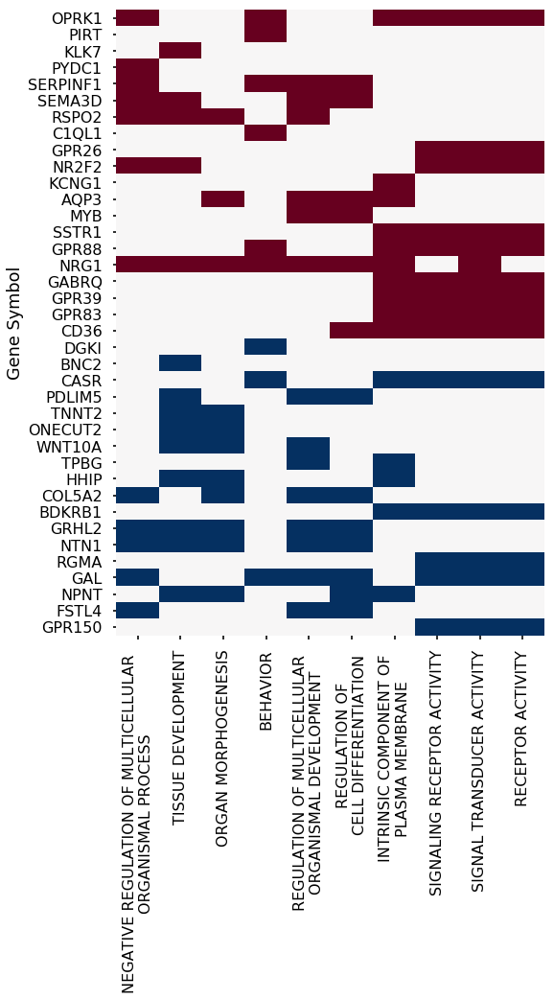

In [227]:
p_gsea.index = p_gsea['Gene Symbol']
pmap = p_gsea[org_proc+plas_mem]
plt.close()
sns.set_context('poster',font_scale=1)
#fig,ax = plt.subplots(figsize=(12,8))
fig,ax = plt.subplots(figsize=(8,12))
#sns.heatmap(pmap.astype(int).T, cmap='RdBu_r', cbar=False, 
#            xticklabels=pmap.index, yticklabels=ncols)
sns.heatmap(pmap.astype(int), cmap='RdBu_r', cbar=False, 
            yticklabels=pmap.index, xticklabels=ncols)
plt.savefig('/Users/jakevogel/Dropbox/Work/Projects/AHBA_Hippocampus_AP/GSEA_functions.pdf',
           bbox_inches = 'tight')
plt.show()

In [111]:
sns.clustermap?

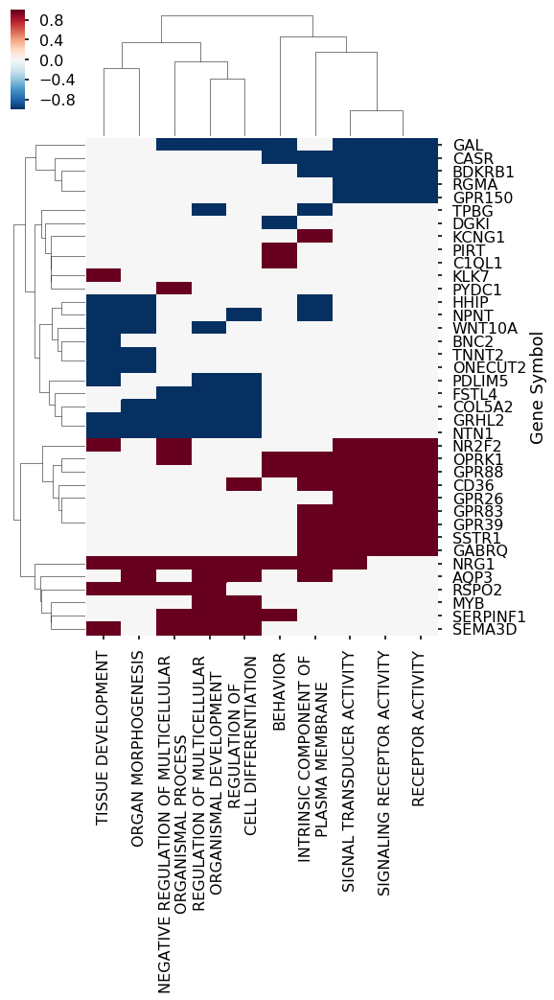

In [228]:
plt.close()
sns.clustermap(pmap.astype(int), cmap='RdBu_r',figsize=(8,12),
               xticklabels=ncols, yticklabels=pmap.index)
plt.show()

In [74]:
pmap.dropna().shape

(61, 10)

In [115]:
probes.loc[pcalr_out_NEW['gene_selections']['anterior_genes_20']
          ]['gene_symbol'].tolist()

['RP11-291L15.2',
 'COL5A2',
 'ONECUT2',
 'NTN1',
 'OSBPL3',
 'TPBG',
 'BNC2',
 'BDKRB1',
 'RGMA',
 'GRHL2',
 'RP11-561O23.6',
 'HHIP',
 'HHIP',
 'NTN1',
 'SERTAD4',
 'BDKRB1',
 'A_32_P11262',
 'TTR',
 'NPNT',
 'NPNT']

In [117]:
pgenes = pandas.ExcelFile('/Users/jakevogel/Science/AHBA/genes.xlsx').parse('Sheet4')
pgenes.head()

,COL5A2_term,COL5A2_r,ONECUT2_term,ONECUT2_r,NTN1_term,NTN1_r,OSBPL3_term,OSBPL3_r,TPBG_term,TPBG_r,...,GRHL2_term,GRHL2_r,HHIP_term,HHIP_r,SERTAD4_term,SERTAD4_r,TTR_term,TTR_r,NPNT_term,NPNT_r
0,parietal,0.191,caudate,0.323,brainstem,0.412,parietal,0.148,caudate,0.166,...,visual,0.173,ganglia,0.232,visual,0.158,parahippocampal,0.169,substantia,0.213
1,semantic,0.147,striatal,0.304,midbrain,0.350,somatosensory,0.127,caudate nucleus,0.149,...,intraparietal,0.137,basal ganglia,0.231,occipital,0.135,lobe mtl,0.147,midbrain,0.212
2,words,0.145,caudate nucleus,0.277,nuclei,0.274,premotor,0.126,parietal,0.149,...,occipital,0.136,basal,0.230,parietal,0.132,parahippocampal gyrus,0.140,reward,0.200
3,intraparietal,0.144,striatum,0.227,periaqueductal,0.260,m1,0.125,striatal,0.137,...,parietal,0.131,thalamus,0.196,striatal,0.124,parahippocampal cortex,0.137,striatum,0.175
4,intraparietal sulcus,0.136,basal ganglia,0.225,thalamus,0.260,premotor cortex,0.125,premotor,0.122,...,intraparietal sulcus,0.127,subcortical,0.177,m1,0.118,mtl,0.136,ventral striatum,0.170


In [118]:
u_terms = []
for col in pgenes.columns:
    if 'term' in col:
        for term in pgenes[col].unique():
            if term not in u_terms:
                u_terms.append(term)

In [119]:
len(u_terms)

513

In [127]:
pg_res = pandas.DataFrame(np.zeros((len(u_terms),2)),index = u_terms, columns = ['hit','r_sum'])
for i in pgenes.index:
    for col in [x for x in pgenes.columns if 'term' in x]:
        gene = col.split('_')[0]
        val = pgenes.loc[i,col]
        pg_res.loc[val,'hit'] = pg_res.loc[val,'hit'] + 1
        pg_res.loc[val,'r_sum'] = pg_res.loc[val,'r_sum'] + pgenes.loc[i,'%s_r'%gene]
        

In [131]:
pg_res.sort_values('hit',ascending=False).head()

,hit,r_sum
motor cortex,9.0,0.772
motor,8.0,0.757
striatum,8.0,0.837
primary motor,8.0,0.751
primary,8.0,0.688


In [132]:
pg_res.sort_values('r_sum',ascending=False).head()

,hit,r_sum
midbrain,5.0,1.069
parietal,7.0,0.987
brainstem,5.0,0.967
striatal,7.0,0.960
thalamus,6.0,0.947


In [133]:
probes.loc[pcalr_out_NEW['gene_selections']['posterior_genes_20']
          ]['gene_symbol'].tolist()

['SERPINF1',
 'SERPINF1',
 'KLK7',
 'RSPH9',
 'KLK7',
 'LYPD1',
 'GABRQ',
 'PYDC1',
 'SYTL2',
 'RP13-102H20.1',
 'SYTL2',
 'SSTR1',
 'LXN',
 'TMEM215',
 'SYTL2',
 'C1QL1',
 'PIRT',
 'KCNG1',
 'AQP3',
 'A_23_P213527']

## Fill in the hippocampus

In [15]:
jnk = ni.load('/usr/local/fsl/data/atlases/HarvardOxford/HarvardOxford-sub-maxprob-thr25-1mm.nii.gz')
#jnk = ni.load('/usr/share/fsl/5.0/data/atlases/HarvardOxford/HarvardOxford-sub-maxprob-thr25-1mm.nii.gz')
atlas = jnk.get_data()
aff = jnk.affine

In [16]:
hipp = np.zeros_like(atlas)
hipp[(atlas==9) | (atlas==19)] = 1
nhipp = ni.Nifti1Image(hipp, aff)

//anaconda/envs/py3/lib/python3.5/site-packages/matplotlib/cbook.py:136: MatplotlibDeprecationWarning: The axisbg attribute was deprecated in version 2.0. Use facecolor instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


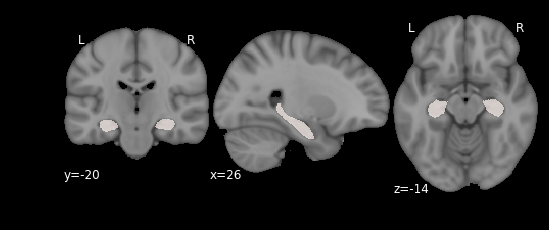

In [63]:
mni = ni.load('/Users/jakevogel/Science/tau/MNI152_T1_1mm_brain.nii')
#mni = ni.load('/home/users/jvogel/Science/templates/templates/MNI152_T1_1mm_brain.nii')
plt.close()
plotting.plot_roi(nhipp, mni, draw_cross=False, cmap='Reds')
plt.show()

In [64]:
hipp = nhipp.get_data()
hcoods = np.where(hipp==1)

In [21]:
s_coords = [convert_coords([round(df.mni_nlin_x[x]),
                 round(df.mni_nlin_y[x]), 
                round(df.mni_nlin_z[x])],'xyz') for x in range(df.shape[0])]

In [22]:
vox = pandas.DataFrame(index=range(len(hcoods[0])),columns=['x','y','z','ind'])
for c in range(len(hcoods[0])):
    cord = [hcoods[0][c], hcoods[1][c], hcoods[2][c]]
    dists = [abs(cord[0] - s_coords[x][0]) + \
             abs(cord[1] - s_coords[x][1]) + \
             abs(cord[2] - s_coords[x][2]) for x in range(len(s_coords))]
    vox.loc[c, ['x','y','z']] = cord
    vox.loc[c,'ind'] = np.argmin(dists)
    if c%1000 == 0:
        print('finished',c)

finished 0
finished 1000
finished 2000
finished 3000
finished 4000
finished 5000
finished 6000
finished 7000
finished 8000
finished 9000
finished 10000
finished 11000


In [85]:
vox.to_csv(os.path.join(wdir,'MAIN_vox_mapping.csv'),index=False)

In [18]:
vox = pandas.read_csv(os.path.join(wdir,'MAIN_vox_mapping.csv')).astype(int)

In [62]:
df.columns[-1]

'position_along_hipp_AP_axis'

In [12]:
p_vec = [xp.loc[pcalr_out_NEW['gene_selections']['posterior_genes_20'],xp.columns[x]
              ].mean() for x in range(xp.shape[1])]
a_vec = [xp.loc[pcalr_out_NEW['gene_selections']['anterior_genes_20'],xp.columns[x]
              ].mean() for x in range(xp.shape[1])]

In [19]:
rend_hipp_p = np.zeros_like(hipp)
for i,row in vox.iterrows():
    rend_hipp_p[row['x'],row['y'],row['z']] = p_vec[row['ind']]

In [20]:
rend_hipp_a = np.zeros_like(hipp)
for i,row in vox.iterrows():
    rend_hipp_a[row['x'],row['y'],row['z']] = a_vec[row['ind']]

In [21]:
mod = pcalr_out_NEW['final_model']
X = pcalr_out_NEW['pca_object'].transform(xp.T)
y = mod.predict(X)


In [22]:
rend_hipp_T = np.zeros_like(hipp)
for i,row in vox.iterrows():
    rend_hipp_T[row['x'],row['y'],row['z']] = y[row['ind']]

In [29]:
max(rend_hipp_a.flat)

1.4992946

In [50]:
fig.colorbar?

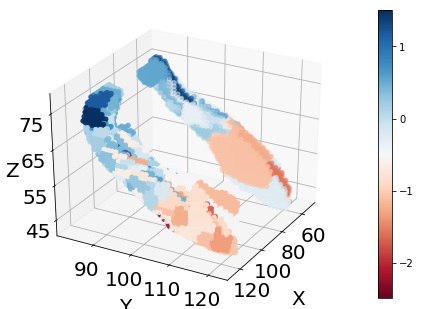

In [49]:
label_locations = np.where(hipp == 1)
#label_locations1 = np.where(ap_axis.get_data() > 0)
fig = plt.figure()
ax = Axes3D(fig)
f = ax.scatter(label_locations[0], label_locations[1], label_locations[2], c = rend_hipp_p[label_locations],
          cmap='RdBu')
# To split into LR, we need to visualize where the LR split is, where front is
for angle in range(0, 30):
    ax.view_init(30, angle)
    plt.draw()
    plt.pause(.001)

ax.set_xlabel('\nX',fontsize=20,linespacing=4)
ax.set_xticks(range(120,50,-20))
plt.setp(ax.get_xticklabels(), fontsize=20)
ax.set_ylabel('\nY',fontsize=20, linespacing=2)
ax.set_yticks(range(90,121,10))
plt.setp(ax.get_yticklabels(), fontsize=20)
ax.set_zlabel('Z',fontsize=20, linespacing=6)
ax.set_zticks(range(45,76,10))
ax.tick_params(labelsize=20)
fig.colorbar(f,ticks=[-2,-1,0,1,2])
#plt.savefig('/Users/jakevogel/Dropbox/Work/Projects/AHBA_Hippocampus_AP/POST_HippRender.pdf',
#           bbox_inches='tight')

plt.show()


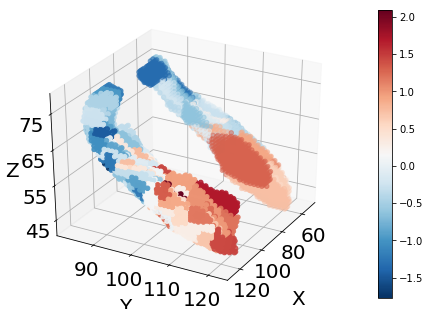

In [44]:
label_locations = np.where(hipp == 1)
#label_locations1 = np.where(ap_axis.get_data() > 0)
fig = plt.figure()
ax = Axes3D(fig)
f = ax.scatter(label_locations[0], label_locations[1], label_locations[2], c = rend_hipp_a[label_locations],
          cmap='RdBu_r')
# To split into LR, we need to visualize where the LR split is, where front is
for angle in range(0, 30):
    ax.view_init(30, angle)
    plt.draw()
    plt.pause(.001)

ax.set_xlabel('\nX',fontsize=20,linespacing=4)
ax.set_xticks(range(120,50,-20))
plt.setp(ax.get_xticklabels(), fontsize=20)
ax.set_ylabel('\nY',fontsize=20, linespacing=2)
ax.set_yticks(range(90,121,10))
plt.setp(ax.get_yticklabels(), fontsize=20)
ax.set_zlabel('Z',fontsize=20, linespacing=6)
ax.set_zticks(range(45,76,10))
ax.tick_params(labelsize=20)
#plt.savefig('/Users/jakevogel/Dropbox/Work/Projects/AHBA_Hippocampus_AP/ANT_HippRender.pdf',
#           bbox_inches='tight')
fig.colorbar(f)
plt.show()



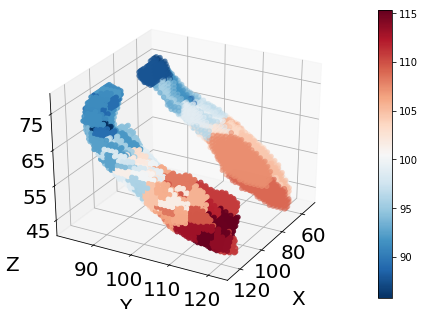

In [46]:
label_locations = np.where(hipp == 1)
#label_locations1 = np.where(ap_axis.get_data() > 0)
#fig = plt.figure(figsize=(8,6))
fig = plt.figure()
ax = Axes3D(fig)
f = ax.scatter(label_locations[0], label_locations[1], label_locations[2], c = rend_hipp_T[label_locations],
          cmap='RdBu_r')
# To split into LR, we need to visualize where the LR split is, where front is
for angle in range(0, 30):
    ax.view_init(30, angle)
    plt.draw()
    plt.pause(.001)

ax.set_xlabel('\nX',fontsize=20,linespacing=4)
ax.set_xticks(range(120,50,-20))
plt.setp(ax.get_xticklabels(), fontsize=20)
ax.set_ylabel('\nY',fontsize=20, linespacing=2)
ax.set_yticks(range(90,121,10))
plt.setp(ax.get_yticklabels(), fontsize=20)
ax.set_zlabel('\n\nZ',fontsize=20, linespacing=6)
ax.set_zticks(range(45,76,10))
ax.tick_params(labelsize=20)
#ax.dist=11
fig.colorbar(f)
plt.savefig('/Users/jakevogel/Dropbox/Work/Projects/AHBA_Hippocampus_AP/cbar.pdf',
           bbox_inches='tight')
plt.show()




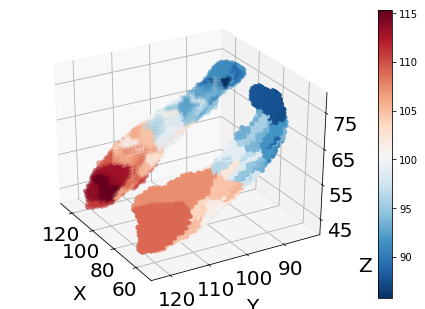

In [42]:
label_locations = np.where(hipp == 1)
#label_locations1 = np.where(ap_axis.get_data() > 0)
fig = plt.figure()
ax = Axes3D(fig)
p = ax.scatter(label_locations[0], label_locations[1], label_locations[2], c = rend_hipp_T[label_locations],
          cmap='RdBu_r')
# To split into LR, we need to visualize where the LR split is, where front is
for angle in range(0, 180, 30):
    ax.view_init(30, angle)
    plt.draw()
    plt.pause(.001)

ax.set_xlabel('\nX',fontsize=20,linespacing=3.2)
ax.set_xticks(range(120,50,-20))
plt.setp(ax.get_xticklabels(), fontsize=20)
ax.set_ylabel('\nY',fontsize=20, linespacing=2)
ax.set_yticks(range(90,121,10))
plt.setp(ax.get_yticklabels(), fontsize=20)
ax.set_zlabel('\n\n\nZ',fontsize=20, linespacing=4)
ax.set_zticks(range(45,76,10))
plt.setp(ax.get_zticklabels(), fontsize=20)
ax.tick_params(labelsize=20)
#plt.savefig('/Users/jakevogel/Dropbox/Work/Projects/AHBA_Hippocampus_AP/HippRenderL.pdf',
#           bbox_inches='tight')
#ax.dist=11
fig.colorbar(p)
plt.show()





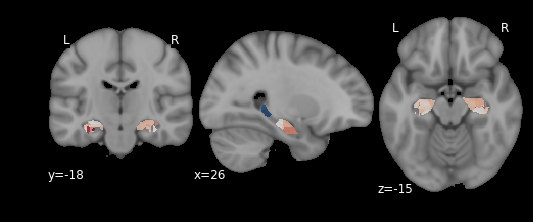

In [32]:
#mni = ni.load('/Users/jakevogel/Science/tau/MNI152_T1_1mm_brain.nii')
plt.close()
plotting.plot_roi(ni.Nifti1Image(rend_hipp_a, aff), mni, draw_cross=False, cmap='RdBu')
plt.show()

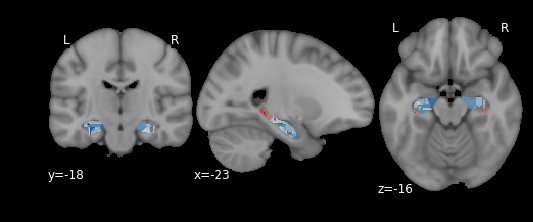

In [33]:
#mni = ni.load('/Users/jakevogel/Science/tau/MNI152_T1_1mm_brain.nii')
plt.close()
plotting.plot_roi(ni.Nifti1Image(rend_hipp_p, aff), mni, draw_cross=False, cmap='RdBu')
plt.show()

In [115]:
for y in coord:
    print([y + x for x in range(-1,2)])

[51, 52, 53]
[100, 101, 102]
[59, 60, 61]


In [107]:
len(make_cube(cord,radius=2)[0])

27

In [81]:
for c in range(len(hcoods[0])):
    cord = [hcoods[0][c], hcoods[1][c], hcoods[2][c]]
    if any(hipp[make_cube(cord,2)]==0):
        vox.loc[c,'surface'] = 1
    else:
        vox.loc[c,'surface'] = 0
    if c%1000 == 0:
        print('finished',c)

finished 0
finished 1000
finished 2000
finished 3000
finished 4000
finished 5000
finished 6000
finished 7000
finished 8000
finished 9000
finished 10000
finished 11000


In [204]:
surf_vox = pandas.DataFrame(vox[vox.surface==1],copy=True)

In [40]:
len(sample_surf_ind)

3702

In [42]:
df.columns

Index(['Unnamed: 0', 'donor', 'sample', 'structure_id', 'slab_num', 'well_id',
       'slab_type', 'structure_acronym', 'structure_name', 'polygon_id',
       'mri_voxel_x', 'mri_voxel_y', 'mri_voxel_z', 'mni_x', 'mni_y', 'mni_z',
       'gabe_label', 'mni_nlin_x', 'mni_nlin_y', 'mni_nlin_z',
       'position_along_hipp_AP_axis'],
      dtype='object')

In [43]:
sample_surf_ind = []
arr = surf_vox[['x','y','z']].values
for i,row in df.iterrows():
    cord = convert_coords([row['mni_nlin_x'],row['mni_nlin_y'],row['mni_nlin_z']],'xyz')
    dists = [abs(cord[0] - arr[x,0]) + \
             abs(cord[1] -  arr[x,1]) + \
             abs(cord[2] -  arr[x,2]) for x in range(surf_vox.shape[0])]
    sample_surf_ind.append(np.argmin(dists))
    if i%50 == 0:
        print('finished',i)

finished 0


In [44]:
len(sample_surf_ind)

170

In [45]:
df.loc[:,'surface_coordinate_index'] = sample_surf_ind

In [208]:
sample_surf_ind = []
arr = surf_vox[['x','y','z']].values
for i,row in gdf.iterrows():
    cord = convert_coords([row['mni_nlin_x'],row['mni_nlin_y'],row['mni_nlin_z']],'xyz')
    dists = [abs(cord[0] - arr[x,0]) + \
             abs(cord[1] -  arr[x,1]) + \
             abs(cord[2] -  arr[x,2]) for x in range(surf_vox.shape[0])]
    sample_surf_ind.append(np.argmin(dists))
    if i%100 == 0:
        print('finished',i)
gdf.loc[:,'surface_coordinate_index'] = sample_surf_ind

finished 0
finished 100
finished 200
finished 300
finished 400
finished 500
finished 600
finished 700
finished 800
finished 900
finished 1000
finished 1100
finished 1200
finished 1300
finished 1400
finished 1500
finished 1600
finished 1700
finished 1800
finished 1900
finished 2000
finished 2100
finished 2200
finished 2300
finished 2400
finished 2500
finished 2600
finished 2700
finished 2800
finished 2900
finished 3000
finished 3100
finished 3200
finished 3300
finished 3400
finished 3500
finished 3600
finished 3700


In [224]:
for i,col in enumerate(xp.columns):
    df.loc[i,'HAGS_Index_r'] = stats.pearsonr(xp[col].values,np.array(pcalr_out_NEW['betas']))[0]
    df.loc[i,'HAGS_Index_dot'] = np.dot(xp[col].values,np.array(pcalr_out_NEW['betas']))

In [239]:
surf_vox.shape

(6250, 5)

In [237]:
for i,row in gdf.iterrows():
    idx = row['surface_coordinate_index']
    gdf.loc[i,'HAGS_of_closest_Hipp_coordinate'] = df.loc[vox.loc[idx]['ind']]['HAGS_Index_r']

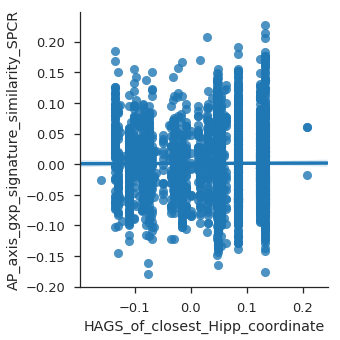

In [230]:
plt.close()
sns.lmplot(x = 'HAGS_of_closest_Hipp_coordinate',
           y = 'AP_axis_gxp_signature_similarity_SPCR',
           data = gdf)
plt.show()

In [48]:
surf_vox = surf_vox.astype(int)

In [49]:
rend_hipp_p2 = np.zeros_like(hipp)
for i,row in surf_vox.iloc[sample_surf_ind].iterrows():
    rend_hipp_p2[row['x'],row['y'],row['z']] = p_vec[row['ind']]

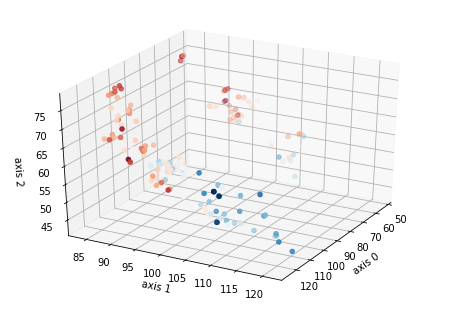

In [50]:
plt.close()
label_locations = [surf_vox.iloc[sample_surf_ind]['x'].tolist(),
                   surf_vox.iloc[sample_surf_ind]['y'].tolist(),
                   surf_vox.iloc[sample_surf_ind]['z'].tolist()]
#label_locations1 = np.where(ap_axis.get_data() > 0)
fig = plt.figure()
ax = Axes3D(fig)
ax.scatter(label_locations[0], label_locations[1], label_locations[2], c = rend_hipp_p2[label_locations],
          cmap='RdBu')
# To split into LR, we need to visualize where the LR split is, where front is
for angle in range(0, 30):
    ax.view_init(30, angle)
    plt.draw()
    plt.pause(.001)

ax.set_xlabel('axis 0')
ax.set_ylabel('axis 1')
ax.set_zlabel('axis 2')
plt.show()



In [51]:
rend_hipp_a2 = np.zeros_like(hipp)
for i,row in surf_vox.iloc[sample_surf_ind].iterrows():
    rend_hipp_a2[row['x'],row['y'],row['z']] = a_vec[row['ind']]

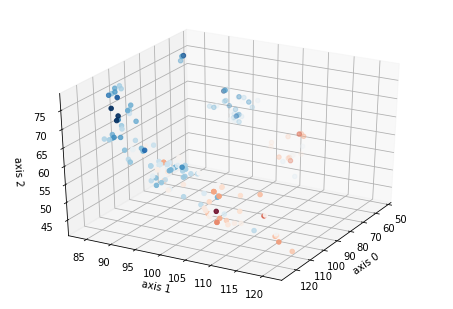

In [52]:
plt.close()
label_locations = [surf_vox.iloc[sample_surf_ind]['x'].tolist(),
                   surf_vox.iloc[sample_surf_ind]['y'].tolist(),
                   surf_vox.iloc[sample_surf_ind]['z'].tolist()]
#label_locations1 = np.where(ap_axis.get_data() > 0)
fig = plt.figure()
ax = Axes3D(fig)
ax.scatter(label_locations[0], label_locations[1], label_locations[2], c = rend_hipp_a2[label_locations],
          cmap='RdBu')
# To split into LR, we need to visualize where the LR split is, where front is
for angle in range(0, 30):
    ax.view_init(30, angle)
    plt.draw()
    plt.pause(.001)

ax.set_xlabel('axis 0')
ax.set_ylabel('axis 1')
ax.set_zlabel('axis 2')
plt.show()



In [56]:
rend_hipp_p2[rend_hipp_p2>0].shape

(63,)

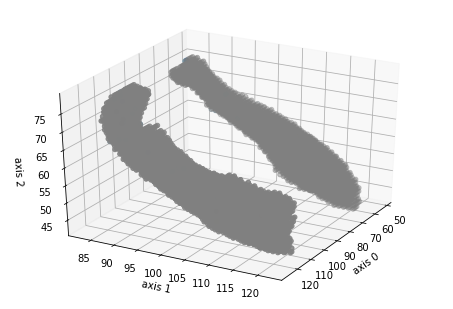

In [59]:
plt.close()
label_locations = [surf_vox.iloc[sample_surf_ind]['x'].tolist(),
                   surf_vox.iloc[sample_surf_ind]['y'].tolist(),
                   surf_vox.iloc[sample_surf_ind]['z'].tolist()]
hipp_labels = np.where(hipp == 1)
#label_locations1 = np.where(ap_axis.get_data() > 0)
fig = plt.figure()
ax = Axes3D(fig)
ax.scatter(hipp_labels[0], hipp_labels[1], hipp_labels[2], c = 'gray')
#ax2 = Axes3D(fig)
ax.scatter(label_locations[0], label_locations[1], label_locations[2], c = rend_hipp_a2[label_locations],
          cmap='RdBu')
#To split into LR, we need to visualize where the LR split is, where front is
for angle in range(0, 30):
    ax.view_init(30, angle)
    plt.draw()
    plt.pause(.001)

ax.set_xlabel('axis 0')
ax.set_ylabel('axis 1')
ax.set_zlabel('axis 2')
plt.show()



In [60]:
surf_vox.shape

(6250, 6)

In [69]:
s_coords = label_locations
for i,row in surf_vox.iterrows():
    cord = [row['x'],row['y'],row['z']]
    dists = [abs(cord[0] - s_coords[0][x]) + \
             abs(cord[1] - s_coords[1][x]) + \
             abs(cord[2] - s_coords[2][x]) for x in range(len(s_coords[0]))]
    surf_vox.loc[i,'closest_surface_ind'] = np.argmin(dists)
    if i%1000 == 0:
        print('finished',i)

finished 0
finished 2000
finished 3000
finished 4000
finished 6000
finished 7000
finished 8000
finished 9000
finished 11000


In [72]:
surf_vox.columns

Index(['x', 'y', 'z', 'ind', 'surface', 'closest_surface_ind'], dtype='object')

In [90]:
rend_hipp_p3 = np.zeros_like(hipp)
for i,row in surf_vox.iterrows():
    rend_hipp_p3[row['x'],row['y'],row['z']] = p_vec[row['ind']]

In [91]:
rend_hipp_a3 = np.zeros_like(hipp)
for i,row in surf_vox.iterrows():
    rend_hipp_a3[row['x'],row['y'],row['z']] = a_vec[row['ind']]

In [83]:
len(label_locations[0])

170

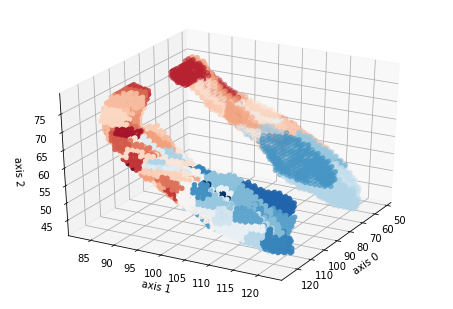

In [87]:
plt.close()
label_locations = [surf_vox['x'].tolist(),
                   surf_vox['y'].tolist(),
                   surf_vox['z'].tolist()]
fig = plt.figure()
ax = Axes3D(fig)
ax.scatter(label_locations[0], label_locations[1], label_locations[2], c = rend_hipp_p3[label_locations],
          cmap='RdBu')
# To split into LR, we need to visualize where the LR split is, where front is
for angle in range(0, 30):
    ax.view_init(30, angle)
    plt.draw()
    plt.pause(.001)

ax.set_xlabel('axis 0')
ax.set_ylabel('axis 1')
ax.set_zlabel('axis 2')
plt.show()


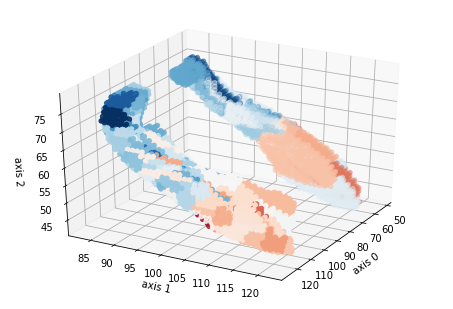

In [92]:
plt.close()
label_locations = [surf_vox['x'].tolist(),
                   surf_vox['y'].tolist(),
                   surf_vox['z'].tolist()]
fig = plt.figure()
ax = Axes3D(fig)
ax.scatter(label_locations[0], label_locations[1], label_locations[2], c = rend_hipp_a3[label_locations],
          cmap='RdBu')
# To split into LR, we need to visualize where the LR split is, where front is
for angle in range(0, 30):
    ax.view_init(30, angle)
    plt.draw()
    plt.pause(.001)

ax.set_xlabel('axis 0')
ax.set_ylabel('axis 1')
ax.set_zlabel('axis 2')
plt.show()


In [76]:
import plotly

In [77]:
temp_trace = plotly.graph_objs.Scatter3d(x = surf_vox['x'].tolist(),
                                        y = surf_vox['y'].tolist(),
                                        z = surf_vox['z'].tolist(),
                                        name = 'hipp',
                                        mode = 'markers',
                                        marker = {'size': 2, 
                                                  'color': rend_hipp_a3[label_locations].tolist(), 
                                                  'colorscale':'RdBu'}
                                        )


layout = plotly.graph_objs.Layout(margin = dict(l=0,r=0,b=0,t=0))

fig = plotly.graph_objs.Figure(data=[temp_trace], layout=layout)
plotly.offline.plot(fig, filename='test.html')


NameError: name 'surf_vox' is not defined

In [103]:
rend_hipp_p[rend_hipp_p!=0].shape

(11263,)

In [101]:
label_locations = np.where(hipp == 1)
#label_locations1 = np.where(ap_axis.get_data() > 0)
fig = plt.figure()
# ax = Axes3D(fig)
# ax.scatter(label_locations[0], label_locations[1], label_locations[2], c = rend_hipp_p[label_locations],
#           cmap='RdBu')
# # To split into LR, we need to visualize where the LR split is, where front is
# for angle in range(0, 30):
#     ax.view_init(30, angle)
#     plt.draw()
#     plt.pause(.001)

# ax.set_xlabel('axis 0')
# ax.set_ylabel('axis 1')
# ax.set_zlabel('axis 2')
# plt.show()


In [104]:
temp_trace = plotly.graph_objs.Scatter3d(x = label_locations[0],
                                        y =  label_locations[1],
                                        z =  label_locations[2],
                                        name = 'hipp',
                                        mode = 'markers',
                                        marker = {'size': 2, 
                                                  'color': rend_hipp_a[label_locations].tolist(), 
                                                  'colorscale':'RdBu'}
                                        )


layout = plotly.graph_objs.Layout(margin = dict(l=0,r=0,b=0,t=0))

fig = plotly.graph_objs.Figure(data=[temp_trace], layout=layout)
plotly.offline.plot(fig, filename='test.html')


'file:///home/users/jvogel/git/hack_projects/test.html'

In [80]:
temp_trace = plotly.graph_objs.Scatter3d(x = label_locations[0],
                                        y =  label_locations[1],
                                        z =  label_locations[2],
                                        name = 'hipp',
                                        mode = 'markers',
                                        marker = {'size': 5, 
                                                  'color': rend_hipp_T[label_locations].tolist(), 
                                                  'colorscale':'RdBu'}
                                        )


layout = plotly.graph_objs.Layout(margin = dict(l=0,r=0,b=0,t=0))

fig = plotly.graph_objs.Figure(data=[temp_trace], layout=layout)
plotly.offline.plot(fig, filename='HIPP_model_results.html')



'file:///Users/jakevogel/git/hack_projects/HIPP_model_results.html'

In [110]:
xp.shape

(58692, 170)

In [111]:
gdf.structure_name.unique()

array(['claustrum, left', 'nucleus accumbens, left',
       'nucleus accumbens, right', 'substantia innominata, right',
       'claustrum, right', 'globus pallidus, external segment, right',
       'lateral nucleus, right',
       'amygdalohippocampal transition zone, right',
       'basolateral nucleus, right', 'basomedial nucleus, right',
       'substantia innominata, left', 'septal nuclei, left',
       'septal nuclei, right', 'globus pallidus, external segment, left',
       'CA1 field, right', 'CA2 field, right', 'CA3 field, right',
       'CA4 field, right', 'dentate gyrus, right',
       'body of caudate nucleus, right', 'subiculum, left',
       'CA1 field, left', 'CA2 field, left', 'CA3 field, left',
       'CA4 field, left', 'dentate gyrus, left',
       'body of caudate nucleus, left', 'putamen, right',
       'inferior frontal gyrus, opercular part, right',
       'posterior orbital gyrus, right',
       'temporal pole, right, superior aspect',
       'precentral gyrus, le

In [250]:
df.gabe_label.value_counts()

H0351.2001    60
H0351.2002    44
H0351.1016    20
H0351.1012    19
H0351.1009    14
H0351.1015    13
Name: gabe_label, dtype: int64

In [251]:
104/170

0.611764705882353

# FINALLY! TMAPS from RON!

In [25]:
tmap_GN.shape

(121, 145, 121)

In [248]:
gcx = ni.load('r1p5mm_MAIN_SPCR_nlin_xp_image.nii.gz').get_data()
tmap_GN = ni.load('maps/AD-FTD_globalnorm2.nii.gz').get_data()

In [249]:
dkt = ni.load('from_ron/dkt_atlas_1p5mm.nii').get_data()
#dkt = ni.load('/home/users/jvogel/Science/templates/atlases/dkt_atlas_1mm.nii').get_data()
#HO = ni.load(
#        '/usr/share/fsl/data/atlases/HarvardOxford/HarvardOxford-sub-maxprob-thr0-1mm.nii.gz'
#            ).get_data()
HO = ni.load(
        'from_ron/whole_brain_mask.nii.gz'
            ).get_data()
#whole brain
msk1 = np.array(HO,copy=True)
msk1[HO<1] = 0

#no cereb or brainstem
msk2 = np.array(dkt, copy=True)
msk2[msk2>78] = 0
msk2 = np.array(dkt, copy=True)
msk2[msk2>78] = 0

# no cereb, brainstem or hippocampus
msk3 = np.array(msk2, copy=True)
msk3[dkt==36] = 0
msk3[dkt==75] = 0

# cortex only (no subcortex)
msk4 = np.array(msk3, copy=True)
msk4[dkt>31] = 0
msk4[dkt>41] = dkt[dkt>41]
msk4[dkt>70] = 0

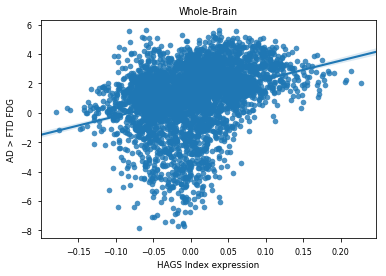

standard statistics: r2 = 0.103019698847, p = 3.48910427809e-89


KeyboardInterrupt: 

In [305]:
msks = [msk1,msk2,msk3,msk4,dkt]
sns.set_context('paper')

img = tmap_GN
vrad=3
vdim = 1.5
gcx_col='AP_axis_gxp_signature_similarity_SPCR'
bootstrap = False
plabs = ['Whole-Brain',
         'HAGS Index expression','AD > FTD FDG']
for mask in msks:
    msk = np.array(mask,copy=True) 
    msk[img==0] = 0
    run_gvfcx_analysis(img, gdf, msk, vrad, vdim, gcx_col, plabs, 
                           bootstrap, n_iter=10, hue_vals=[], illustrative=True)

In [ ]:
#msks = [msk1,msk2,msk3,msk4,dkt]
sns.set_context('paper')

img = tmap_GN
vrad=3
vdim = 1.5
jnk = pandas.DataFrame(gxp,copy=True)
for i in 
gcx_col='AP_axis_gxp_signature_similarity_SPCR'
bootstrap = False
plabs = ['Whole-Brain',
         'HAGS Index expression','AD > FTD FDG']
msk = np.array(mask,copy=True) 
msk[img==0] = 0
run_gvfcx_analysis(img, gdf, msk, vrad, vdim, gcx_col, plabs, 
                       bootstrap, n_iter=10, hue_vals=[], illustrative=True)

In [36]:
vrad = [1,2,3,4,5,6]
msks = [msk1,msk2,msk3,msk4]
resdf = pandas.DataFrame(index=range(len(msks)*len(vrad)),
                                      columns = ['mask','vs','r2','p'])
cnt = 0
ycol = 'position_along_hipp_AP_axis'
ccol = 'closest_cx_map'
gcx_col = 'AP_axis_gxp_signature_similarity_SPCR'
plabs = ['Cortex and Subcortex \n(no cerebellum, brainstem, hippocampus)',
         ccol,'ant > post hippocampal \nfunctional connectivity']
for m,mask in enumerate(msks):
    msk = np.array(mask,copy=True) 
    msk[img==0] = 0
    lab = 'msk%s'%(m+1)
    resdf.loc[resdf.index[cnt:(cnt+len(vrad))],'mask'] = [lab]*len(vrad)
    res = run_gvfcx_analysis(img, gdf, msk, vrad, vdim, gcx_col, plabs, 
                               bootstrap=False, n_iter=10, hue_vals=[], illustrative=False)
    resdf.loc[resdf.index[cnt:(cnt+len(vrad))],'vs'] = res.index
    resdf.loc[resdf.index[cnt:(cnt+len(vrad))],['r2','p',]] = res.values
    cnt+=len(vrad)
    resdf.to_csv('/Users/jakevogel/Science/AHBA/AD_FTD_HAGS_analysis')

standard statistics: r2 = 0.0953458118362, p = 2.40805102453e-82
standard statistics: r2 = 0.0987310577193, p = 2.35366292708e-85
standard statistics: r2 = 0.103019698847, p = 3.48910427809e-89
standard statistics: r2 = 0.107440966081, p = 3.77132286294e-93
standard statistics: r2 = 0.111510464226, p = 8.10583202345e-97
standard statistics: r2 = 0.115522956538, p = 1.88934368964e-100
standard statistics: r2 = 0.107289522824, p = 7.60550124135e-55
standard statistics: r2 = 0.110074531871, p = 2.63578543817e-56
standard statistics: r2 = 0.114258310502, p = 1.65567337855e-58
standard statistics: r2 = 0.119180530404, p = 4.12528786146e-61
standard statistics: r2 = 0.124208161569, p = 8.74066636048e-64
standard statistics: r2 = 0.129603678308, p = 1.13577976502e-66
standard statistics: r2 = 0.107114960594, p = 6.53415997944e-50
standard statistics: r2 = 0.11002259916, p = 2.68962016552e-51
standard statistics: r2 = 0.114553175964, p = 1.82869567753e-53
standard statistics: r2 = 0.1200387753

In [306]:
vrad = [1,2,3,4,5,6]
msks = [msk1,msk2,msk3,msk4]
resdf = pandas.DataFrame(index=range(len(msks)*len(vrad)),
                                      columns = ['ant_cut','post_cut','n_ant','n_post',
                                                 'mask','vs','r2','p', 'manual_FDR',
                                                 'chance_r2', 'ci_l', 'ci_u'])
cnt = 0
ycol = 'position_along_hipp_AP_axis'
ccol = 'closest_cx_map'
gcx_col = 'AP_axis_gxp_signature_similarity_SPCR'
plabs = ['Cortex and Subcortex \n(no cerebellum, brainstem, hippocampus)',
         ccol,'ant > post hippocampal \nfunctional connectivity']
for m,mask in enumerate(msks):
    msk = np.array(mask,copy=True) 
    msk[img==0] = 0
    lab = 'msk%s'%(m+1)
    resdf.loc[resdf.index[cnt:(cnt+len(vrad))],'mask'] = [lab]*len(vrad)
    res = run_gvfcx_analysis(img, gdf, msk, vrad, vdim, gcx_col, plabs, 
                               bootstrap='permute', n_iter=100, hue_vals=[], 
                             illustrative=False)
    resdf.loc[resdf.index[cnt:(cnt+len(vrad))],'vs'] = res.index
    resdf.loc[resdf.index[cnt:(cnt+len(vrad))],['r2','p','manual_FDR','chance_r2', 'ci_l', 'ci_u'
                                               ]] = res.values
    cnt+=len(vrad)
    resdf.to_csv('/Users/jakevogel/Science/AHBA/AD_FTD_HAGS_analysis_permute.csv')

standard statistics: r2 = 0.0953458118362, p = 2.40805102453e-82
permuted p-value =  0.0
standard statistics: r2 = 0.0987310577193, p = 2.35366292708e-85
permuted p-value =  0.0


KeyboardInterrupt: 

In [ ]:
resdf = pandas.DataFrame(index=range(drange*len(msks)*len(vrad)),
                                      columns = ['ant_cut','post_cut','n_ant','n_post',
                                                 'mask','vs','r2','p', 'manual_FDR',
                                                 'chance_r2', 'ci_l', 'ci_u'])
cnt = 0
for i in range(drange+1):
    ant_cut = dmin+i
    post_cut = dmax-i
    n_ant = len(df[df.position_along_hipp_AP_axis<dmin+i])
    n_post = len(df[df.position_along_hipp_AP_axis>dmax-i])
    resdf.loc[resdf.index[cnt:cnt+(len(msks)*len(vrad))],'ant_cut'] = [ant_cut] * len(msks)*len(vrad)
    resdf.loc[resdf.index[cnt:cnt+(len(msks)*len(vrad))],'post_cut'] = [post_cut] * len(msks)*len(vrad)
    resdf.loc[resdf.index[cnt:cnt+(len(msks)*len(vrad))],'n_ant'] = [n_ant] * len(msks)*len(vrad)
    resdf.loc[resdf.index[cnt:cnt+(len(msks)*len(vrad))],'n_post'] = [n_post] * len(msks)*len(vrad)
    ycol = 'position_along_hipp_AP_axis'
    ccol = 'closest_cx_map'
    gcx_col = 'AP_axis_gxp_signature_similarity_SPCR'
    plabs = ['Cortex and Subcortex \n(no cerebellum, brainstem, hippocampus)',
             ccol,'ant > post hippocampal \nfunctional connectivity']
    for m,msk in enumerate(msks):
        lab = 'msk%s'%(m+1)
        resdf.loc[resdf.index[cnt:(cnt+len(vrad))],'mask'] = [lab]*len(vrad)
        res = run_hipp_connectivity_analysis(ant_cut, post_cut, df, ycol, 
                                       ccol, wdir, gdf, msk, gcx_col, plabs,
                                       del_img = True, diff_img = True,  vrad = vrad,
                                      in_imgs = [], bootstrap = 'bootstrap', hue_vals=[],
                                      return_results=True, illustrative=False, n_iter = 100)
        resdf.loc[resdf.index[cnt:(cnt+len(vrad))],'vs'] = res.index
        resdf.loc[resdf.index[cnt:(cnt+len(vrad))],
                  ['r2','p','manual_FDR','chance_r2', 'ci_l', 'ci_u']] = res.values
        cnt+=len(vrad)

In [37]:
resdf.columns

Index(['mask', 'vs', 'r2', 'p'], dtype='object')

In [38]:
msk_dict = {'msk1': 'Whole Brain', 'msk2': 'No Cerebellum\nor Brainstem',
           'msk3': 'No Cerebellum\nBrainstem or\nHippocampus','msk4': 'Cortex Only'}
resdf['mask'] = [msk_dict[x] for x in resdf['mask']]
resdf.columns = ['Mask','Voxel Radius'] + resdf.columns[2:].tolist()

//anaconda/envs/py3/lib/python3.5/site-packages/seaborn/categorical.py:1508: FutureWarning: remove_na is deprecated and is a private function. Do not use.
  stat_data = remove_na(group_data[hue_mask])


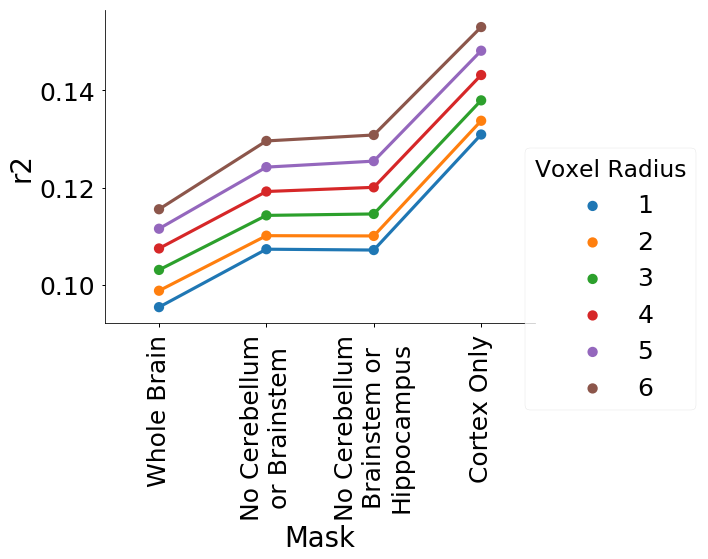

In [51]:
sns.set_context('notebook',font_scale=2.5)
plt.close()
f = sns.factorplot(x='Mask', y='r2', hue='Voxel Radius', data=resdf, size=7, aspect=1.2)
f.set_xticklabels(rotation=90)
#plt.xticks(split_tix)
#plt.yticks([0.1, 0.15, 0.2, 0.25, 0.3])
plt.savefig('/Users/jakevogel/Dropbox/Work/Projects/AHBA_Hippocampus_AP/AD_FTD_control_analysis.pdf',
           bbox_inches = 'tight')
plt.show()

In [89]:
resdf.sort_values('r2').tail()

,Mask,Voxel Radius,r2,p
19,Cortex Only,2,0.133762,4.31124e-48
20,Cortex Only,3,0.137963,1.16528e-49
21,Cortex Only,4,0.143188,1.27699e-51
22,Cortex Only,5,0.148198,1.64148e-53
23,Cortex Only,6,0.153075,2.31372e-55


In [78]:
msk = msk3
vrad = 3
bootstrap = 'False'
hue_vals = []
return_results = True
illustrative = True
if type(vrad) != list:
    vrad = [vrad]
res = pandas.DataFrame(index=vrad,columns=['r2','p'])
for vs in vrad:
    g_cx = []
    f_cx = []
    if len(hue_vals) > 0:
        hvs = []

    for i,row in gdf.iterrows():
        #coord = convert_coords([row['mni_x'], row['mni_y'], row['mni_z']], 'xyz')
        coord = convert_coords([row['mni_nlin_x'], row['mni_nlin_y'], row['mni_nlin_z']], 
                               'xyz', 1.5)
        coord = [round(x) for x in coord]
        if msk[coord[0],coord[1],coord[2]] != 0:
            xs,ys,zs = make_sphere(coord, vs)
            val = img[xs,ys,zs]
            f_cx.append(val.mean())
            g_cx.append(row[gcx_col])
            if len(hue_vals) > 0:
                hvs.append(hue_vals[i])


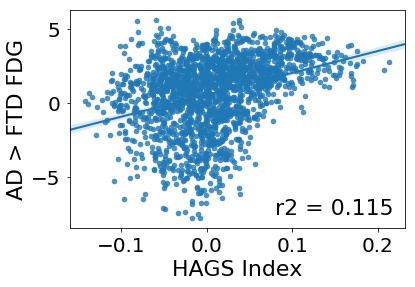

In [84]:

plt.close()
sns.set_context('paper', font_scale=2.5)
sns.regplot(np.array(g_cx), np.array(f_cx))
#plt.title(plabs[0])
plt.xlabel('HAGS Index')
plt.ylabel(plabs[2])
r2 = stats.pearsonr(np.array(g_cx), np.array(f_cx))[0]**2
plt.text(0.08, -7.5,'r2 = %s'%float('%.3g'%r2), fontsize=22)
plt.savefig('/Users/jakevogel/Dropbox/Work/Projects/AHBA_Hippocampus_AP/FDG_HAGS.pdf',
            bbox_inches = 'tight')
plt.show()


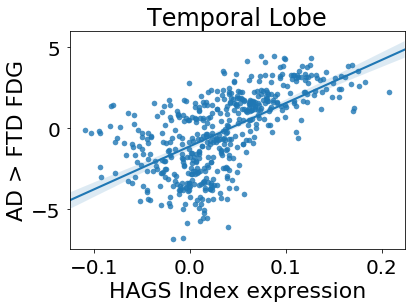

standard statistics: r2 = 0.370213505113, p = 5.8419584112e-52


,r2,p
3,0.370214,5.84196e-52


In [119]:
fmsk = np.zeros_like(dkt)
for i,row in labs[labs.temporal==1].iterrows():
    fmsk[dkt==row['integer_label']] = 1
img = tmap_GN
vrad=3
vdim = 1.5
gcx_col='AP_axis_gxp_signature_similarity_SPCR'
bootstrap = False
plabs = ['Temporal Lobe',
         'HAGS Index expression','AD > FTD FDG']
msk = fmsk
run_gvfcx_analysis(img, gdf, msk, vrad, vdim, gcx_col, plabs, 
                       bootstrap, n_iter=10, hue_vals=[], illustrative=True)

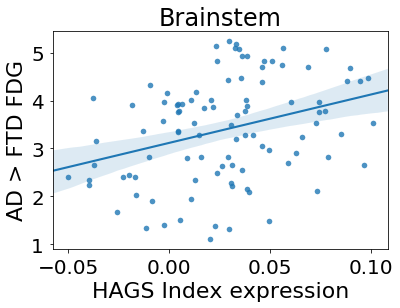

standard statistics: r2 = 0.106722374995, p = 0.00102680117303


,r2,p
3,0.106722,0.0010268


In [126]:
img = tmap_GN
vrad=3
vdim = 1.5
gcx_col='AP_axis_gxp_signature_similarity_SPCR'
bootstrap = False
plabs = ['Brainstem',
         'HAGS Index expression','AD > FTD FDG']
msk = dkt
run_gvfcx_analysis(img, gdf[gdf.slab_type=='BS'], msk, vrad, vdim, gcx_col, plabs, 
                       bootstrap, n_iter=10, hue_vals=[], illustrative=True)

# Median analysis

In [69]:
import sys
sys.path.insert(0,'../data_driven_pathology/esm/')
import ESM_utils as esm

In [71]:
esm.Evaluate_Model?

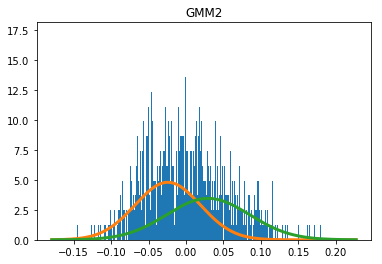

In [77]:
models = {'GMM2': mixture.BayesianGaussianMixture(n_components=2,weight_concentration_prior=1e3)}
esm.Evaluate_Model(gdf.AP_axis_gxp_signature_similarity_SPCR, models)

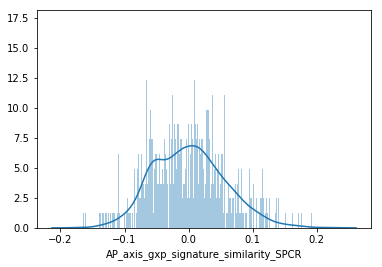

In [66]:
plt.close()
sns.distplot(gdf.AP_axis_gxp_signature_similarity_SPCR, bins = int((gdf.shape[0]/2)))
plt.show()

In [44]:
gdf.columns

Index(['Unnamed: 0', 'donor', 'sample', 'structure_id', 'slab_num', 'well_id',
       'slab_type', 'structure_acronym', 'structure_name', 'polygon_id',
       'mri_voxel_x', 'mri_voxel_y', 'mri_voxel_z', 'mni_x', 'mni_y', 'mni_z',
       'gabe_label', 'mni_nlin_x', 'mni_nlin_y', 'mni_nlin_z',
       'AP_axis_gxp_signature_similarity_SPCR'],
      dtype='object')

In [58]:
nvec = gdf[(gdf.AP_axis_gxp_signature_similarity_SPCR > -0.025
    ) & (gdf.AP_axis_gxp_signature_similarity_SPCR < 0.025
        )]['AP_axis_gxp_signature_similarity_SPCR'].values
ncoords = gdf[(gdf.AP_axis_gxp_signature_similarity_SPCR > -0.025
    ) & (gdf.AP_axis_gxp_signature_similarity_SPCR < 0.025
        )][['mni_nlin_x', 'mni_nlin_y', 'mni_nlin_z']].values
ncoords = [convert_coords(ncoords[x],'xyz') for x in range(len(ncoords))]

In [48]:
mni = '/Users/jakevogel/Science/tau/MNI152_T1_1mm_brain.nii'

In [59]:
make_expression_image(nvec, ncoords, mni, 
                          wdir = './', nm = 'near0_0.01', vrad=3,
                         return_img = False)

In [60]:
nvec = gdf[(gdf.AP_axis_gxp_signature_similarity_SPCR > -0.01
    ) & (gdf.AP_axis_gxp_signature_similarity_SPCR < 0.01
        )]['AP_axis_gxp_signature_similarity_SPCR'].values
ncoords = gdf[(gdf.AP_axis_gxp_signature_similarity_SPCR > -0.01
    ) & (gdf.AP_axis_gxp_signature_similarity_SPCR < 0.01
        )][['mni_nlin_x', 'mni_nlin_y', 'mni_nlin_z']].values
ncoords = [convert_coords(ncoords[x],'xyz') for x in range(len(ncoords))]

In [61]:
make_expression_image(nvec, ncoords, mni, 
                          wdir = './', nm = 'near0_0.01', vrad=3,
                         return_img = False)

# ADNI PLASMA GXP

In [12]:
axp = pandas.read_csv(
    '/Users/jakevogel/Downloads/ADNI_Gene_Expression_Profile/ADNI_Gene_Expression_Profile.csv')
adict = pandas.read_csv(
    '/Users/jakevogel/Downloads/ADNI_Gene_Expression_Profile/ADNI_Gene_Expression_Profile_DICT.csv')


//anaconda/envs/py3/lib/python3.5/site-packages/IPython/core/interactiveshell.py:2717: DtypeWarning: Columns (3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,25

In [13]:
axp.shape

(49394, 748)

In [14]:
adict.shape

(8, 3)

In [53]:
print(len(axp.loc[1,axp.columns[3:]].unique()))
len(axp.loc[1,axp.columns[3:]])

745


746

In [23]:
axp.loc[19,axp.columns[2]].split(' || ')

['CGB', 'CGB1', 'CGB2', 'CGB5', 'CGB7', 'CGB8']

In [28]:
print(axp.shape)
len(axp[axp.columns[2]].unique())

(49394, 749)


20094

In [37]:
jnk = [x for x in axp[axp.columns[2]
                     ].dropna().index if ' || ' in axp.loc[x,axp.columns[2]]]
multi = axp.loc[jnk]

In [41]:
gene

'C8G'

In [45]:
axp[axp[axp.columns[2]] == gene]

,Phase,Unnamed: 1,Unnamed: 2,ADNIGO,ADNI2,ADNI2.1,ADNIGO.1,ADNI2.2,ADNI2.3,ADNI2.4,...,ADNI2.443,ADNIGO.293,ADNI2.444,ADNIGO.294,ADNI2.445,ADNI2.446,ADNI2.447,ADNI2.448,Unnamed: 747,symlist
16762,11731854_at,LOC733,C8G,3.261,3.475,3.414,3.376,3.466,3.374,3.583,...,3.372,3.275,3.541,3.523,3.445,3.154,3.479,3.594,[C8G] Complement component 8 gamma polypeptide,NaN


In [47]:
gene_map = {}
for i,gene in enumerate(probes.gene_symbol.unique()):
    hit = axp[axp[axp.columns[2]] == gene]
    if len(hit) > 0:
        gene_map.update({gene: hit.index.tolist()})
    else:
        hit = [x for x in jnk if gene in multi.loc[x,axp.columns[2]].split(' || ')]
        if len(hit) > 0:
            gene_map.update({gene: hit})
    if i%1000 == 0:
        print(i)

0
1000
2000
3000
4000
5000
6000
7000
8000
9000
10000
11000
12000
13000
14000
15000
16000
17000
18000
19000
20000
21000
22000
23000
24000
25000
26000
27000
28000
29000


In [50]:
len(gene_map.values())

16853

In [57]:
pcalr_out_NEW['betas'][probes[probes.gene_symbol==gene].index]

array([ 0.00249709,  0.00184639,  0.00360222])

In [59]:
gene

'APOE'

In [61]:
axp.loc[1,axp.columns[3:]].dropna()

ADNIGO        116_S_1249
ADNI2         037_S_4410
ADNI2.1       006_S_4153
ADNIGO.1      116_S_1232
ADNI2.2       099_S_4205
ADNI2.3       007_S_4467
ADNI2.4       128_S_0205
ADNIGO.2      003_S_2374
ADNI2.5       036_S_4491
ADNI2.6       098_S_4059
ADNIGO.3      031_S_2018
ADNI2.7       002_S_4654
ADNI2.8       019_S_4285
ADNI2.9       141_S_4426
ADNI2.10      067_S_4072
ADNI2.11      037_S_4308
ADNI2.12      041_S_4200
ADNIGO.4      128_S_0200
ADNI2.13      129_S_4220
ADNI2.14      018_S_4313
ADNI2.15      067_S_0257
ADNIGO.5      029_S_1218
ADNI2.16      141_S_4053
ADNI2.17      136_S_4408
ADNIGO.6      021_S_2142
ADNI2.18      114_S_4404
ADNI2.19      116_S_4167
ADNI2.20      116_S_4209
ADNI2.21      073_S_4360
ADNI2.22      072_S_4539
                 ...    
ADNI2.431     019_S_4367
ADNIGO.283    131_S_0384
ADNI2.432     135_S_4309
ADNI2.433     129_S_4369
ADNI2.434     137_S_0686
ADNI2.435     128_S_4571
ADNIGO.284    099_S_2063
ADNI2.436     011_S_4120
ADNI2.437     041_S_0125


In [51]:
subs

In [69]:
good_cols = [x for x in range(3,len(axp.loc[1,axp.columns[3:]])
                 ) if pandas.notnull(axp.loc[1,axp.columns[x]])]

In [73]:
len(db.mean().values)

743

In [74]:
len(subs)

744

In [75]:
len(good_cols)

743

In [106]:
jnka = np.array([np.nan for x in range(100)])
jnkb = pandas.Series(jnka)
y = np.random.random(100)

array([ 0.91827045,  0.74154761,  0.22093676,  0.31961651,  0.1909398 ,
        0.95081072,  0.14598908,  0.8250563 ,  0.99562252,  0.46933804,
        0.96980615,  0.44860682,  0.85453763,  0.15827398,  0.89863244,
        0.00175156,  0.44695773,  0.42967424,  0.46803401,  0.68062344,
        0.52771921,  0.76370914,  0.84162192,  0.72474993,  0.32510941,
        0.10141325,  0.53389985,  0.24989578,  0.83922127,  0.86001121,
        0.03340031,  0.1667382 ,  0.07920816,  0.6118464 ,  0.23581626,
        0.36157613,  0.49860267,  0.95901248,  0.53864772,  0.99004918,
        0.66626942,  0.08394993,  0.65018422,  0.97617871,  0.29726761,
        0.67065703,  0.42850772,  0.96801544,  0.90349543,  0.1002011 ,
        0.45771433,  0.68511593,  0.89169998,  0.23951496,  0.77742591,
        0.18480314,  0.9470884 ,  0.46467687,  0.44856929,  0.67096734,
        0.76339841,  0.52518577,  0.55565768,  0.92023456,  0.39672806,
        0.83903106,  0.43081177,  0.76305966,  0.30279513,  0.57

In [108]:
%%timeit 
jnka[:] = y

The slowest run took 42.22 times longer than the fastest. This could mean that an intermediate result is being cached.
1000000 loops, best of 3: 570 ns per loop


In [109]:
%%timeit
jnkb.loc[:] = y

The slowest run took 26.49 times longer than the fastest. This could mean that an intermediate result is being cached.
1000 loops, best of 3: 178 µs per loop


In [112]:
i

21

In [120]:
subs = axp.loc[1,axp.columns[good_cols]]
cols = subs.tolist()
adni_xp = []
#xval = pandas.DataFrame(index = , columns = cols)
genes = list(gene_map.keys())
xval = np.zeros((len(genes),len(cols)))
for i,gene in enumerate(genes):
    db = pcalr_out_NEW['betas'][probes[probes.gene_symbol==gene].index]
    if type(db) == float:
        adni_xp.append(db)
    else:
        adni_xp.append(np.mean(db))
    db = axp.loc[gene_map[gene], axp.columns[good_cols]]
    if len(db.shape) == 1:
        xval[i,:] = db.values
    else:
        xval[i,:] = db.astype(float).mean().values
    if i%100==0:
        print(i)

0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
1900
2000
2100
2200
2300
2400
2500
2600
2700
2800
2900
3000
3100
3200
3300
3400
3500
3600
3700
3800
3900
4000
4100
4200
4300
4400
4500
4600
4700
4800
4900
5000
5100
5200
5300
5400
5500
5600
5700
5800
5900
6000
6100
6200
6300
6400
6500
6600
6700
6800
6900
7000
7100
7200
7300
7400
7500
7600
7700
7800
7900
8000
8100
8200
8300
8400
8500
8600
8700
8800
8900
9000
9100
9200
9300
9400
9500
9600
9700
9800
9900
10000
10100
10200
10300
10400
10500
10600
10700
10800
10900
11000
11100
11200
11300
11400
11500
11600
11700
11800
11900
12000
12100
12200
12300
12400
12500
12600
12700
12800
12900
13000
13100
13200
13300
13400
13500
13600
13700
13800
13900
14000
14100
14200
14300
14400
14500
14600
14700
14800
14900
15000
15100
15200
15300
15400
15500
15600
15700
15800
15900
16000
16100
16200
16300
16400
16500
16600
16700
16800


In [123]:
xvaldf = pandas.DataFrame(xval,index = genes, columns = subs)

In [124]:
xvaldf.head()

1,116_S_1249,037_S_4410,006_S_4153,116_S_1232,099_S_4205,007_S_4467,128_S_0205,003_S_2374,036_S_4491,098_S_4059,...,128_S_2130,082_S_4339,022_S_2379,014_S_4668,130_S_0289,141_S_4456,009_S_2381,053_S_4557,073_S_4300,041_S_4014
APOE,2.498,2.7870,2.9660,3.0470,2.9000,2.9810,3.0370,3.1890,3.1550,2.8950,...,3.4730,3.0320,3.2670,3.1580,2.995,2.9170,3.5680,3.0950,3.1430,3.3100
GSTP1,11.118,11.1910,11.2670,11.1720,11.1580,11.1390,11.1580,11.1850,11.4220,11.4040,...,11.3930,11.5670,11.1570,11.1230,11.296,11.1680,11.1880,11.4370,11.3520,11.3350
DNAJB8,2.226,2.0550,1.9880,2.0250,1.9960,2.0110,2.0600,2.0290,2.1170,2.2560,...,2.3000,2.3180,2.2980,1.9900,2.006,2.1480,2.2750,2.1120,2.1520,2.4410
DLG3,5.284,5.8198,5.6658,5.2902,5.7464,5.5966,5.6662,5.2788,5.4800,4.9428,...,5.5484,5.2334,5.8204,5.3268,5.287,5.3714,5.5840,5.7486,5.7174,5.6718
UBE3A,7.967,8.6225,8.0535,7.4040,8.1900,7.9550,8.4635,7.8975,6.8155,7.7610,...,7.9750,7.4205,7.8900,7.4975,7.949,7.9420,7.7385,7.7430,7.9825,7.6580


In [52]:
adni_xp

In [128]:
h_tfm = pandas.DataFrame(index=subs,columns=['h_tfm'])
for sub in subs:
    h_tfm.loc[sub,'h_tfm'] = np.dot(adni_xp, xvaldf[sub])

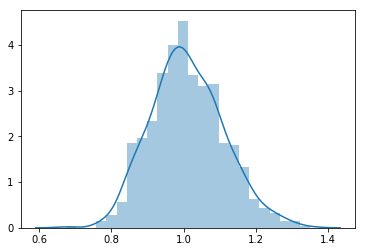

In [130]:
plt.close()
sns.distplot(h_tfm)
plt.show()

In [166]:
adni = pandas.read_csv('/Users/jakevogel/Science/TADPOLE/TADPOLE_D1_D2.csv',usecols=list(range(50)))

In [162]:
h_tfm.loc[:,'visit'] = axp.loc[axp.index[0],axp.columns[good_cols]].values
h_tfm.loc[:,'sub'] = h_tfm.index.values

In [163]:
h_tfm.head()

,h_tfm,visit,sub
1,,,
116_S_1249,1.05555,m48,116_S_1249
037_S_4410,1.12351,v03,037_S_4410
006_S_4153,0.928402,v03,006_S_4153
116_S_1232,0.860929,m48,116_S_1232
099_S_4205,1.04354,v03,099_S_4205


In [144]:
gind = [x for x in adni.index if adni.loc[x,'PTID'] in h_tfm.index.tolist()]

In [167]:
adni=adni.loc[gind]

In [183]:
int(h_tfm.loc['099_S_4205','visit'][1:])

3

In [191]:
db = db.sort_values()
db.index[v]

3413

In [219]:
row = h_tfm.loc['116_S_4167']
v = int(row['visit'][1:]) -1
db = adni[adni.PTID==row['sub']]['VISCODE'].sort_values()
print(v,db.shape)

10 (10,)


In [227]:
gind = []
for i,row in h_tfm.iterrows():
    if row['visit'][0] == 'v':
        v = int(row['visit'][1:]) -1
        db = adni[adni.PTID==row['sub']]['VISCODE'].sort_values()
        try:
            ind = db.index[v]
        except:
            print(row['sub'],v,db.shape[-1],(v-db.shape[-1]))
    else:
        ind = adni[(adni.PTID==row['sub']) & (adni.VISCODE==row['visit'])].index[0]
    gind.append(ind)
        
len(gind)

037_S_4410 2 1 1
006_S_4153 2 1 1
099_S_4205 2 1 1
007_S_4467 2 1 1
128_S_0205 5 1 4
036_S_4491 2 1 1
098_S_4059 2 1 1
002_S_4654 2 1 1
019_S_4285 2 1 1
141_S_4426 2 1 1
067_S_4072 2 1 1
037_S_4308 2 1 1
041_S_4200 2 1 1
129_S_4220 2 1 1
018_S_4313 2 1 1
067_S_0257 5 1 4
141_S_4053 2 1 1
136_S_4408 2 1 1
116_S_4167 10 0 10
116_S_4209 2 0 2
073_S_4360 2 1 1
072_S_4539 2 1 1
014_S_4615 2 1 1
073_S_4259 2 1 1
073_S_4382 2 1 1
067_S_4310 2 1 1
035_S_0156 5 1 4
041_S_4427 2 1 1
129_S_4396 2 1 1
019_S_4477 2 1 1
041_S_4271 2 1 1
012_S_4094 2 1 1
129_S_4287 2 1 1
135_S_4356 2 1 1
136_S_0186 5 1 4
098_S_4050 2 1 1
073_S_4155 2 1 1
013_S_4580 2 1 1
099_S_4463 2 1 1
099_S_4565 2 1 1
129_S_1246 5 1 4
016_S_4097 2 1 1
024_S_4084 2 2 0
031_S_4496 10 0 10
014_S_4079 2 1 1
072_S_4102 3 1 2
032_S_0677 5 1 4
002_S_4270 2 1 1
041_S_4510 2 1 1
037_S_0467 5 1 4
006_S_4192 3 1 2
123_S_4526 2 1 1
003_S_4555 2 1 1
010_S_4442 2 1 1
035_S_4082 2 1 1
037_S_4015 2 1 1
128_S_4636 2 1 1
041_S_4513 2 1 1
098_S_4275

743

In [223]:
adni = adni.loc[gind]
adni.shape

(743, 50)

In [228]:
adni.loc[:,'h_tfm'] = h_tfm['h_tfm'].values

In [263]:
h_tfm.to_csv('/Users/jakevogel/Science/AHBA/ADNI_gxp_tfm.csv')

In [235]:
adni.columns

Index(['RID', 'PTID', 'VISCODE', 'SITE', 'D1', 'D2', 'COLPROT', 'ORIGPROT',
       'EXAMDATE', 'DX_bl', 'DXCHANGE', 'AGE', 'PTGENDER', 'PTEDUCAT',
       'PTETHCAT', 'PTRACCAT', 'PTMARRY', 'APOE4', 'FDG', 'PIB', 'AV45',
       'CDRSB', 'ADAS11', 'ADAS13', 'MMSE', 'RAVLT_immediate',
       'RAVLT_learning', 'RAVLT_forgetting', 'RAVLT_perc_forgetting', 'FAQ',
       'MOCA', 'EcogPtMem', 'EcogPtLang', 'EcogPtVisspat', 'EcogPtPlan',
       'EcogPtOrgan', 'EcogPtDivatt', 'EcogPtTotal', 'EcogSPMem', 'EcogSPLang',
       'EcogSPVisspat', 'EcogSPPlan', 'EcogSPOrgan', 'EcogSPDivatt',
       'EcogSPTotal', 'FLDSTRENG', 'FSVERSION', 'Ventricles', 'Hippocampus',
       'WholeBrain', 'h_tfm'],
      dtype='object')

//anaconda/envs/py3/lib/python3.5/site-packages/seaborn/categorical.py:1508: FutureWarning: remove_na is deprecated and is a private function. Do not use.
  stat_data = remove_na(group_data[hue_mask])


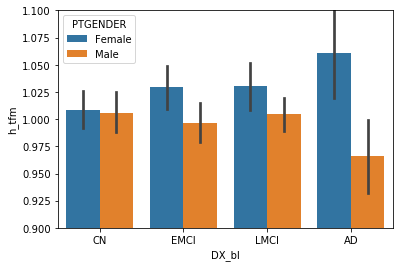

In [259]:
plt.close()
sns.barplot(x='DX_bl',y='h_tfm',hue='PTGENDER',data=adni,
           order = ['CN','EMCI','LMCI','AD'])
plt.ylim(0.9,1.1)
plt.show()
#[adni.DX_bl=='CN']

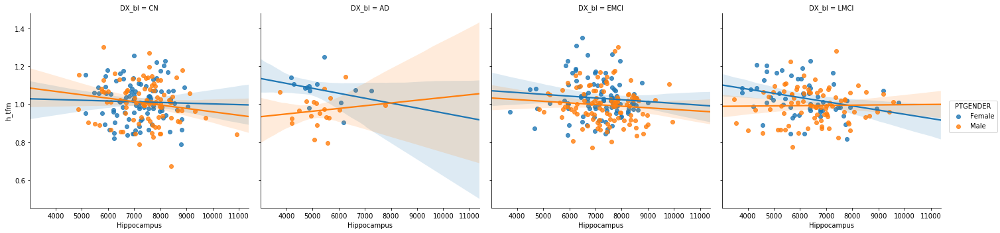

In [261]:
plt.close()
sns.lmplot(x='Hippocampus',y='h_tfm',hue='PTGENDER',col='DX_bl',data=adni)
plt.show()
#[adni.DX_bl=='CN']

# Structural connectivity

In [174]:
from nilearn import datasets, image, plotting, input_data

In [104]:
data = datasets.fetch_oasis_vbm()


Dataset created in /home/users/jvogel/nilearn_data/oasis1



Downloaded 905208634 of 905208634 bytes (100.0%,    0.0s remaining) ...done. (70 seconds, 1 min)
Extracting data from /home/users/jvogel/nilearn_data/oasis1/8696771096fa3875e27a6e1be156138e/archive_dartel.tgz..... done.


In [112]:
data.keys()

dict_keys(['gray_matter_maps', 'white_matter_maps', 'ext_vars', 'data_usage_agreement', 'description'])

In [111]:
demos = pandas.DataFrame(data.ext_vars)
demos.head()

,id,mf,hand,age,educ,ses,mmse,cdr,etiv,nwbv,asf,delay
0,b'OAS1_0001_MR1',b'F',b'R',74,2,3,29,0.0,1344,0.743,1.306,b'N/A'
1,b'OAS1_0002_MR1',b'F',b'R',55,4,1,29,0.0,1147,0.810,1.531,b'N/A'
2,b'OAS1_0003_MR1',b'F',b'R',73,4,3,27,0.5,1454,0.708,1.207,b'N/A'
3,b'OAS1_0004_MR1',b'M',b'R',28,-1,-1,-1,NaN,1588,0.803,1.105,b'N/A'
4,b'OAS1_0005_MR1',b'M',b'R',18,-1,-1,-1,NaN,1737,0.848,1.010,b'N/A'


In [113]:
len(demos[demos.age < 40])

153

In [131]:
[str(x)[2:-5] for x in demos[demos.age < 40]['id'].values][0]

'OAS1_0004'

In [141]:
data['gray_matter_maps']

['/home/users/jvogel/nilearn_data/oasis1/OAS1_0001_MR1/mwrc1OAS1_0001_MR1_mpr_anon_fslswapdim_bet.nii.gz',
 '/home/users/jvogel/nilearn_data/oasis1/OAS1_0002_MR1/mwrc1OAS1_0002_MR1_mpr_anon_fslswapdim_bet.nii.gz',
 '/home/users/jvogel/nilearn_data/oasis1/OAS1_0003_MR1/mwrc1OAS1_0003_MR1_mpr_anon_fslswapdim_bet.nii.gz',
 '/home/users/jvogel/nilearn_data/oasis1/OAS1_0004_MR1/mwrc1OAS1_0004_MR1_mpr_anon_fslswapdim_bet.nii.gz',
 '/home/users/jvogel/nilearn_data/oasis1/OAS1_0005_MR1/mwrc1OAS1_0005_MR1_mpr_anon_fslswapdim_bet.nii.gz',
 '/home/users/jvogel/nilearn_data/oasis1/OAS1_0006_MR1/mwrc1OAS1_0006_MR1_mpr_anon_fslswapdim_bet.nii.gz',
 '/home/users/jvogel/nilearn_data/oasis1/OAS1_0007_MR1/mwrc1OAS1_0007_MR1_mpr_anon_fslswapdim_bet.nii.gz',
 '/home/users/jvogel/nilearn_data/oasis1/OAS1_0009_MR1/mwrc1OAS1_0009_MR1_mpr_anon_fslswapdim_bet.nii.gz',
 '/home/users/jvogel/nilearn_data/oasis1/OAS1_0010_MR1/mwrc1OAS1_0010_MR1_mpr_anon_fslswapdim_bet.nii.gz',
 '/home/users/jvogel/nilearn_data/oas

In [142]:
scans = []
for sub in [str(x)[2:-5] for x in demos[demos.age < 40]['id'].values]:
    for scan in data['gray_matter_maps']:
        if sub in scan:
            scans.append(scan)

In [150]:
plotting.plot_anat?

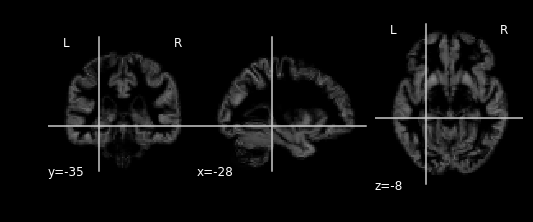

(91, 109, 91)

In [160]:
jnk = ni.load(scans[0])
plt.close()
plotting.plot_anat(jnk, cut_coords=(-28,-35,-8))
plt.show()
jnk.shape

In [144]:
gmvs = image.load_img(scans)
gmvs.shape

In [164]:
i4d = gmvs.get_data()

In [159]:
tst_coord = convert_coords(convert_coords(df.loc[10,['mni_nlin_x','mni_nlin_y','mni_nlin_z']].values, 'xyz',2),
                       'mni',2)

(-28.284227630071697, -34.642096735786509, -7.7934462037831622)

In [161]:
coord = [int(round(x)) for x in convert_coords(df.loc[10,['mni_nlin_x','mni_nlin_y','mni_nlin_z']].values, 
                                               'xyz',2)]
coord

[59, 46, 32]

In [172]:
avg_image = i4d.mean(3)
mask = np.zeros_like(avg_image)
mask[avg_image>0.2] = 1

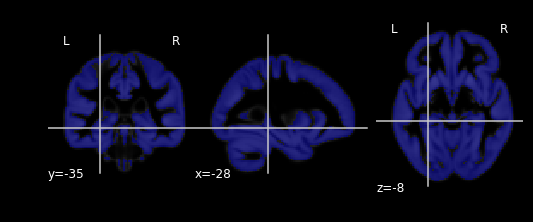

In [173]:
plt.close()
plotting.plot_roi(ni.Nifti1Image(mask,gmvs.affine),
                  bg_img = ni.Nifti1Image(avg_image,gmvs.affine),
                  cut_coords=(-28,-35,-8))
plt.show()

In [181]:
mskr = input_data.NiftiMasker(ni.Nifti1Image(mask,gmvs.affine))
i2d = mskr.fit_transform(gmvs)

In [182]:
i2d.shape

(153, 148661)

In [213]:
rs2 = [stats.pearsonr(cvec,i2d[:,x])[0] for x in range(i2d.shape[-1])]

In [186]:
cvec = i4d[coord[0],coord[1],coord[2],:]
rs = []
for x in range(i2d.shape[-1]):
    rs.append(stats.pearsonr(cvec,i2d[:,x])[0])
    if x%20000==0:
        print(x)

0
20000
40000
60000
80000
100000
120000
140000


In [ ]:
rs2 = [stats.pearsonr(cvec,i2d[:,x])[0] for x in range(i2d.shape[-1])]

In [195]:
r_mtx = np.repeat(np.array(rs)[:, np.newaxis], i2d.shape[0], axis=1).T

In [196]:
r_mtx.shape

(153, 148661)

In [202]:
r_image = mskr.inverse_transform(r_mtx).get_data().mean(3)

(91, 109, 91)

In [ ]:
plt.close()
plotting.plot_stat_map(ni.Nifti1Image(mask,gmvs.affine),
                  bg_img = ni.Nifti1Image(avg_image,gmvs.affine),
                  cut_coords=(-28,-35,-8))
plt.show()

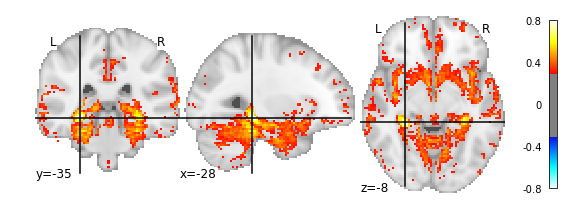

In [209]:
plt.close()
plotting.plot_stat_map(ni.Nifti1Image(r_image, gmvs.affine), cut_coords=(-28,-35,-8), threshold=0.3, vmax=0.8)
plt.show()

In [247]:
len(rs2)

148661

In [207]:
plotting.plot_stat_map?

In [211]:
2 >= 2

True

In [216]:
np.arange(8).reshape(2,4).mean(1)

array([ 1.5,  5.5])

In [266]:
out_imgs = structural_connectivity_analysis(gmvs, df, 'position_along_hipp_AP_axis', 108, 94, 2,
                                           outdir = '/home/users/jvogel/Science/Allen_Human_Brain_Atlas/')

initializing
creating anterior connectivity map
computing 1 of 35 connectivity maps
computing 2 of 35 connectivity maps
computing 3 of 35 connectivity maps
computing 4 of 35 connectivity maps
computing 5 of 35 connectivity maps
computing 6 of 35 connectivity maps
computing 7 of 35 connectivity maps
computing 8 of 35 connectivity maps
computing 9 of 35 connectivity maps
computing 10 of 35 connectivity maps
computing 11 of 35 connectivity maps
computing 12 of 35 connectivity maps
computing 13 of 35 connectivity maps
computing 14 of 35 connectivity maps
computing 15 of 35 connectivity maps
computing 16 of 35 connectivity maps
computing 17 of 35 connectivity maps
computing 18 of 35 connectivity maps
computing 19 of 35 connectivity maps
computing 20 of 35 connectivity maps
computing 21 of 35 connectivity maps
computing 22 of 35 connectivity maps
computing 23 of 35 connectivity maps
computing 24 of 35 connectivity maps
computing 25 of 35 connectivity maps
computing 26 of 35 connectivity maps

TypeError: get_structural_connectivity() missing 1 required positional argument: 'vdim'

In [1]:
def structural_connectivity_analysis(input_img, df, col, ant_cut, post_cut, vdim, 
                                     mask_thr=0.2, outdir = None, outname='strucx'):
    
    print('initializing')
    i4d = input_img.get_data()
    avg_image = i4d.mean(3)
    mask = np.zeros_like(avg_image)
    mask[avg_image>mask_thr] = 1
    mskr = input_data.NiftiMasker(ni.Nifti1Image(mask,input_img.affine))
    i2d = mskr.fit_transform(input_img)
    
    print('creating anterior connectivity map')
    antdf = df[df[col]>=ant_cut][['mni_nlin_x','mni_nlin_y','mni_nlin_z']]
    ant_mtx = get_structural_connectivity(antdf, i4d, i2d, vdim)
    ant_image = mskr.inverse_transform(ant_mtx).get_data().mean(3)
    
    print('creating posterior connectivity map')
    postdf = df[df[col]<=post_cut][['mni_nlin_x','mni_nlin_y','mni_nlin_z']]
    post_mtx = get_structural_connectivity(postdf, i4d, i2d, vdim)
    post_image = mskr.inverse_transform(post_mtx).get_data().mean(3)
    
    diff_image = ni.Nifti1Image((ant_image - post_image), input_img.affine)
    ant_image = ni.Nifti1Image(ant_image,input_img.affine)
    post_image = ni.Nifti1Image(post_image,input_img.affine)
    output = {'anterior': ant_image,
             'posterior': post_image,
             'difference': diff_image}

    if outdir:
        for lab, image in output.items():
            image.to_filename(os.path.join(wdir,'%s_%s'%(outname,lab)))
    
    return output
        
def get_structural_connectivity(cdf, i4d, i2d, vdim):
    
    rmat = np.zeros((len(cdf),i2d.shape[1]))
    for i,c in enumerate(cdf.index):
        coord = [int(round(x)) for x in convert_coords(cdf.loc[c].values, 'xyz', vdim)]
        print('computing %s of %s connectivity maps'%(i+1,len(cdf)))
        cvec = i4d[coord[0],coord[1],coord[2],:]
        rs = [stats.pearsonr(cvec,i2d[:,x])[0] for x in range(i2d.shape[1])]
        rmat[i,:] = rs
    rvec = rmat.mean(0)
    r_mtx = np.repeat(np.array(rvec)[:, np.newaxis], i2d.shape[0], axis=1).T
    
    return r_mtx


In [258]:
ant_image.shape

(91, 109, 91)

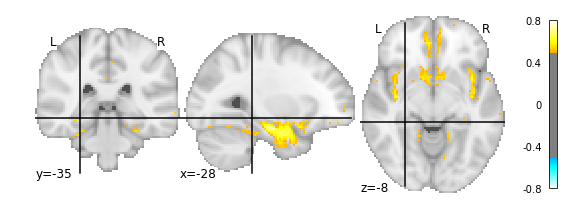

In [260]:
plt.close()
plotting.plot_stat_map(ni.Nifti1Image(ant_image, gmvs.affine), cut_coords=(-28,-35,-8), threshold=0.5, vmax=0.8)
plt.show()

In [256]:
input_img = gmvs
vdim = 2
outdir = None
mask_thr = 0.2
ant_cut = 108
post_cut = 84

print('initializing')
i4d = input_img.get_data()
avg_image = i4d.mean(3)
mask = np.zeros_like(avg_image)
mask[avg_image>mask_thr] = 1
mskr = input_data.NiftiMasker(ni.Nifti1Image(mask,input_img.affine))
i2d = mskr.fit_transform(input_img)

print('creating anterior connectivity map')
antdf = df[df[col]>=ant_cut][['mni_nlin_x','mni_nlin_y','mni_nlin_z']]
cdf = antdf
rmat = np.zeros((len(cdf),i2d.shape[1]))
for i,c in enumerate(cdf.index):
    coord = [int(round(x)) for x in convert_coords(cdf.loc[c].values, 'xyz', vdim)]
    print('computing %s of %s connectivity maps'%(i+1,len(cdf)))
    cvec = i4d[coord[0],coord[1],coord[2],:]
    rs = [stats.pearsonr(cvec,i2d[:,x])[0] for x in range(i2d.shape[1])]
    rmat[i,:] = rs
print(rmat.shape)
rvec = rmat.mean(0)
print(rvec.shape)
r_mtx = np.repeat(np.array(rvec)[:, np.newaxis], i2d.shape[0], axis=1).T
ant_mtx = r_mtx
ant_image = mskr.inverse_transform(ant_mtx).get_data().mean(3)

print('creating posterior connectivity map')
postdf = df[df[col]<=post_cut][['mni_nlin_x','mni_nlin_y','mni_nlin_z']]
post_mtx = get_structural_connectivity(postdf, i2d, vdim)
post_image = mskr.inverse_transform(post_mtx).get_data().mean(3)

diff_image = np.Nifti1Image((ant_image - post_image), input_img.affine)
ant_image = np.Nifti1Image(ant_image,input_img.affine)
print(i2d.shape)
print(r_mtx.shape)
post_image = np.Nifti1Image(post_image,input_img.affine)
output = {'anterior': ant_image,
         'posterior': post_image,
         'difference': diff_image}

if outdir:
    for lab, image in output.items():
        image.to_filename(os.path.join(wdir,'%s_%s'%(outname,lab)))

initializing
creating anterior connectivity map
computing 1 of 35 connectivity maps
computing 2 of 35 connectivity maps
computing 3 of 35 connectivity maps
computing 4 of 35 connectivity maps
computing 5 of 35 connectivity maps
computing 6 of 35 connectivity maps
computing 7 of 35 connectivity maps
computing 8 of 35 connectivity maps
computing 9 of 35 connectivity maps
computing 10 of 35 connectivity maps
computing 11 of 35 connectivity maps
computing 12 of 35 connectivity maps
computing 13 of 35 connectivity maps
computing 14 of 35 connectivity maps
computing 15 of 35 connectivity maps
computing 16 of 35 connectivity maps
computing 17 of 35 connectivity maps
computing 18 of 35 connectivity maps
computing 19 of 35 connectivity maps
computing 20 of 35 connectivity maps
computing 21 of 35 connectivity maps
computing 22 of 35 connectivity maps
computing 23 of 35 connectivity maps
computing 24 of 35 connectivity maps
computing 25 of 35 connectivity maps
computing 26 of 35 connectivity maps

/home/users/jvogel/anaconda2/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:43: RuntimeWarning: Mean of empty slice.
/home/users/jvogel/anaconda2/envs/py3/lib/python3.6/site-packages/numpy/core/_methods.py:73: RuntimeWarning: invalid value encountered in true_divide
  ret, rcount, out=ret, casting='unsafe', subok=False)


MemoryError: 

# Get all cx vectors

In [371]:
mni2mm = ni.load('/usr/share/fsl/data/standard/MNI152_T1_2mm_brain.nii.gz')
dkt = ni.load('/home/users/jvogel/Science/templates/atlases/dkt_atlas_1mm.nii')
f_diff = ni.load('/home/users/jvogel/git/Hippocampus_AP_Axis/maps/p_over_a_rsfmri.nii.gz')
d_diff = ni.load('/home/users/jvogel/git/Hippocampus_AP_Axis/maps/AD-FTD_globalnorm2.nii.gz')
s_diff = ni.load('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/strucx_z_difference.nii')
diffs = {'fmri':f_diff, 'dis': d_diff, 'struc': s_diff, 'dkt': dkt}
diffs_2mm = {}
for lab,diff in diffs.items():
    print(lab,diff.shape)
    nimg = image.resample_to_img(diff, mni2mm)
    print('new shape', nimg.shape)
    diffs_2mm.update({lab: nimg})

fmri (182, 218, 182)


/home/users/jvogel/anaconda2/envs/py3/lib/python3.6/site-packages/scipy/ndimage/interpolation.py:462: UserWarning: The behaviour of affine_transform with a one-dimensional array supplied for the matrix parameter has changed in scipy 0.18.0.
  "The behaviour of affine_transform with a one-dimensional "


new shape (91, 109, 91)
dis (121, 145, 121)
new shape (91, 109, 91)
struc (91, 109, 91, 1)
new shape (91, 109, 91, 1)
dkt (182, 218, 182)
new shape (91, 109, 91)


In [372]:
dkt2 = diffs_2mm['dkt'].get_data()

#no cereb or brainstem
msk2 = np.array(dkt2, copy=True)
msk2[msk2>78] = 0
msk2 = np.array(dkt2, copy=True)
msk2[msk2>78] = 0

# no cereb, brainstem or hippocampus
msk3 = np.array(msk2, copy=True)
msk3[dkt2==36] = 0
msk3[dkt2==75] = 0

# cortex only (no subcortex)
msk4 = np.array(msk3, copy=True)
msk4[dkt2>31] = 0
msk4[dkt2>41] = dkt2[dkt2>41]
msk4[dkt2>70] = 0

In [25]:
vectors = {}

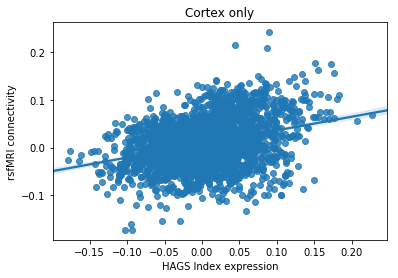

standard statistics: r2 = 0.106126693821, p = 1.10489973714e-66


In [26]:
# functional & genetic

img = diffs_2mm['fmri'].get_data()
vrad=3
vdim = 2
gcx_col='AP_axis_gxp_signature_similarity_SPCR'
bootstrap = False
plabs = ['Cortex only',
         'HAGS Index expression','rsfMRI connectivity']
res, vex = run_gvfcx_analysis(img, gdf, msk4, vrad, vdim, gcx_col, plabs, 
                       bootstrap, n_iter=10, hue_vals=[], illustrative=True)
vectors.update({'gcx': vex['g_vector'], 'fcx': vex['cx_vector']})

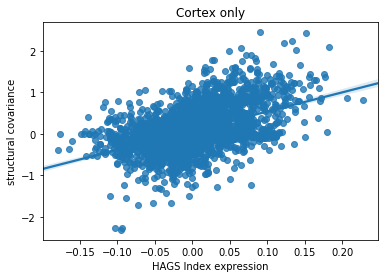

standard statistics: r2 = 0.233168792179, p = 3.6300781241e-155


In [28]:
# structural

img = diffs_2mm['struc'].get_data()
vrad=3
vdim = 2
gcx_col='AP_axis_gxp_signature_similarity_SPCR'
bootstrap = False
plabs = ['Cortex only',
         'HAGS Index expression','structural covariance']
res, vex = run_gvfcx_analysis(img, gdf, msk4, vrad, vdim, gcx_col, plabs, 
                       bootstrap, n_iter=10, hue_vals=[], illustrative=True)
vectors.update({'scx': vex['cx_vector']})

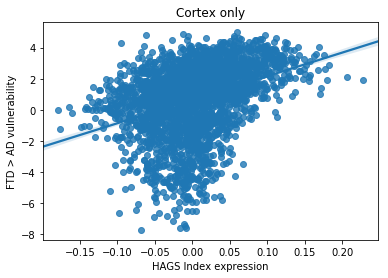

standard statistics: r2 = 0.129100382519, p = 1.00266205152e-81


In [29]:
# disease

img = diffs_2mm['dis'].get_data()
vrad=3
vdim = 2
gcx_col='AP_axis_gxp_signature_similarity_SPCR'
bootstrap = False
plabs = ['Cortex only',
         'HAGS Index expression','FTD > AD vulnerability']
res, vex = run_gvfcx_analysis(img, gdf, msk4, vrad, vdim, gcx_col, plabs, 
                       bootstrap, n_iter=10, hue_vals=[], illustrative=True)
vectors.update({'dcx': vex['cx_vector']})

# Etienne suggests examining the stability of model after removing genes

In [245]:
len(cvec)

153

running PCA
transforming data
performing model cross-validation
using basic 10-fold cross-validation


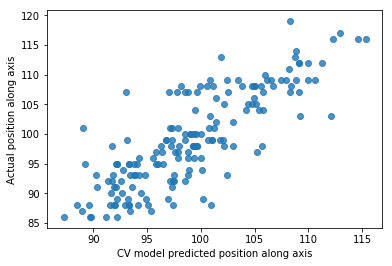

model cv score: r2 =  0.675885977482
running final model
final model fit r2 =  0.876810509326


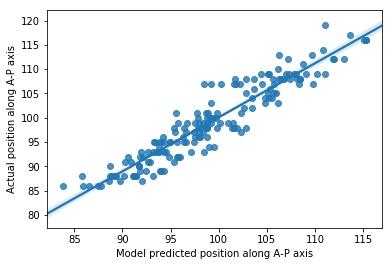

running sanity_check


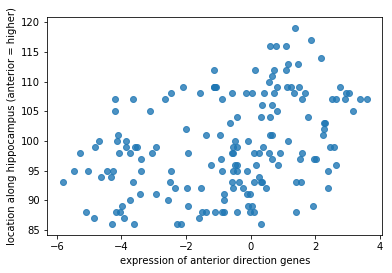

anterior 1 genes vs. y:  r2 = 0.146291960145, p = 2.64362300167e-07 




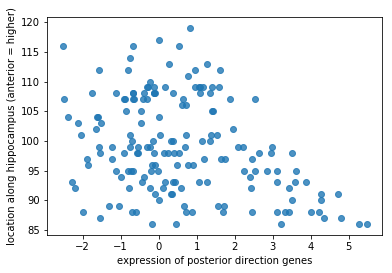

posterior 1 genes vs. y:  r2 = 0.120839023188, p = 3.40674823134e-06 




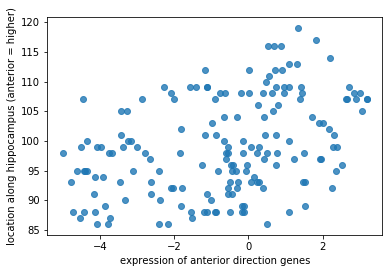

anterior 2 genes vs. y:  r2 = 0.156810463199, p = 9.03376115525e-08 




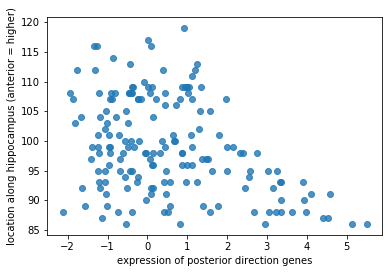

posterior 2 genes vs. y:  r2 = 0.140782455333, p = 4.61980605763e-07 




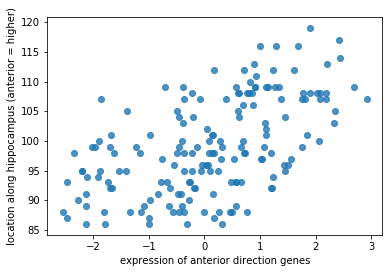

anterior 5 genes vs. y:  r2 = 0.312027641285, p = 2.46628262071e-15 




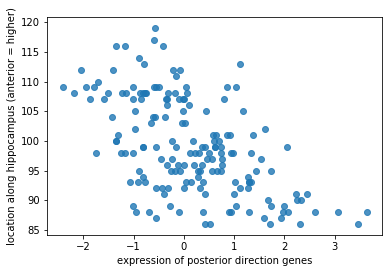

posterior 5 genes vs. y:  r2 = 0.308872084395, p = 3.6401288821e-15 




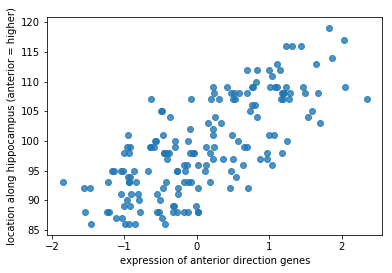

anterior 10 genes vs. y:  r2 = 0.541743338152, p = 2.83625582234e-30 




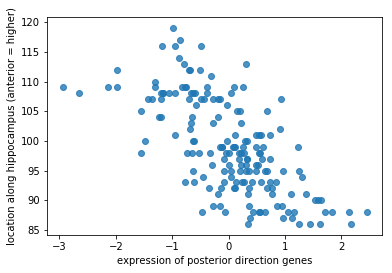

posterior 10 genes vs. y:  r2 = 0.45513306654, p = 6.38206163432e-24 




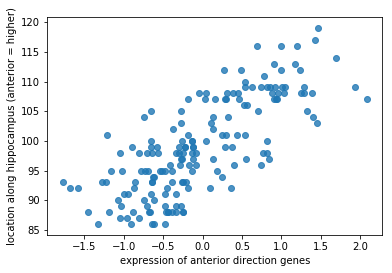

anterior 20 genes vs. y:  r2 = 0.577277974194, p = 3.12395740458e-33 




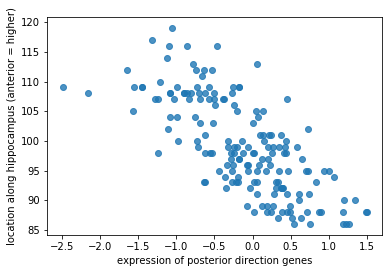

posterior 20 genes vs. y:  r2 = 0.528759540293, p = 3.00011527119e-29 




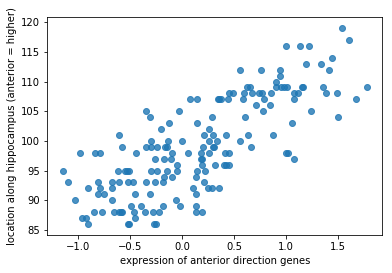

anterior 50 genes vs. y:  r2 = 0.604781566638, p = 1.07277863382e-35 




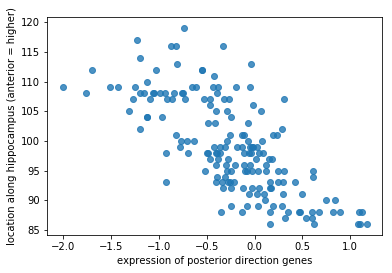

posterior 50 genes vs. y:  r2 = 0.521495808996, p = 1.09169856187e-28 




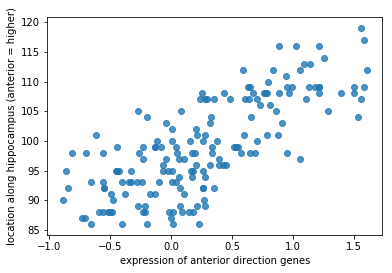

anterior 100 genes vs. y:  r2 = 0.568535370196, p = 1.75686862748e-32 




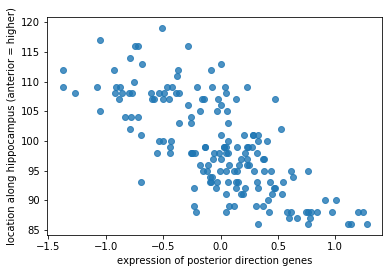

posterior 100 genes vs. y:  r2 = 0.530569444547, p = 2.16785299609e-29 




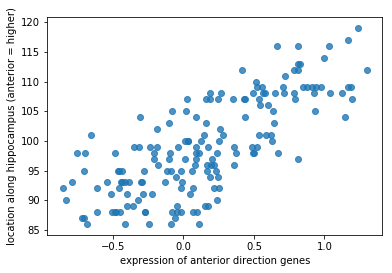

anterior 200 genes vs. y:  r2 = 0.573989954195, p = 6.00589222139e-33 




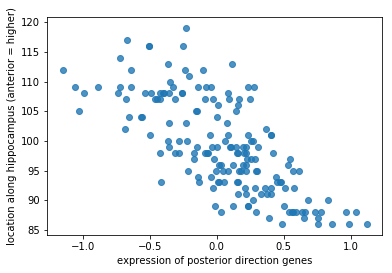

posterior 200 genes vs. y:  r2 = 0.530012749169, p = 2.396015094e-29 




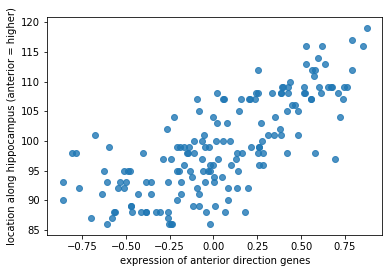

anterior 500 genes vs. y:  r2 = 0.561315373964, p = 7.1262999131e-32 




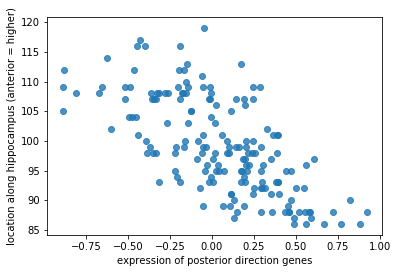

posterior 500 genes vs. y:  r2 = 0.456701046713, p = 5.00149396762e-24 




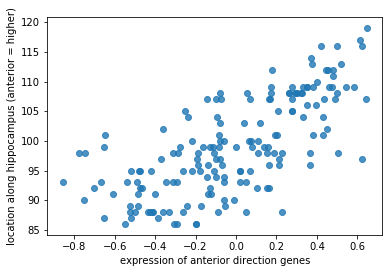

anterior 1000 genes vs. y:  r2 = 0.506219222541, p = 1.5519698984e-27 




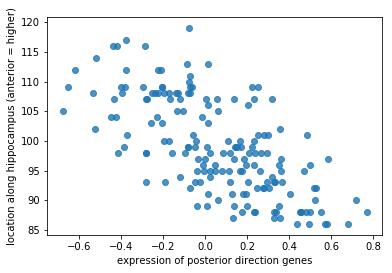

posterior 1000 genes vs. y:  r2 = 0.454418293527, p = 7.13048262374e-24 




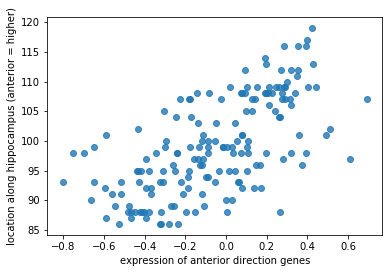

anterior 2000 genes vs. y:  r2 = 0.413582900724, p = 3.20747873988e-21 




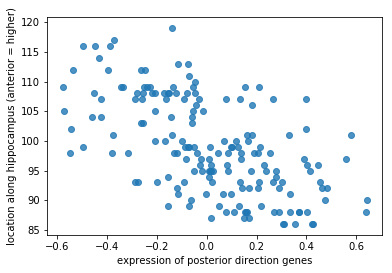

posterior 2000 genes vs. y:  r2 = 0.348659261806, p = 2.35874690133e-17 




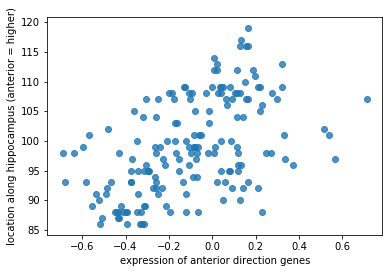

anterior 5000 genes vs. y:  r2 = 0.260250683548, p = 1.19416253845e-12 




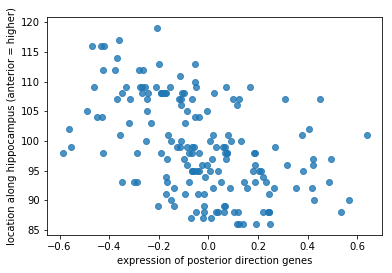

posterior 5000 genes vs. y:  r2 = 0.227039856261, p = 5.09894187119e-11 




//anaconda/envs/py3/lib/python3.5/site-packages/seaborn/categorical.py:1460: FutureWarning: remove_na is deprecated and is a private function. Do not use.
  stat_data = remove_na(group_data)


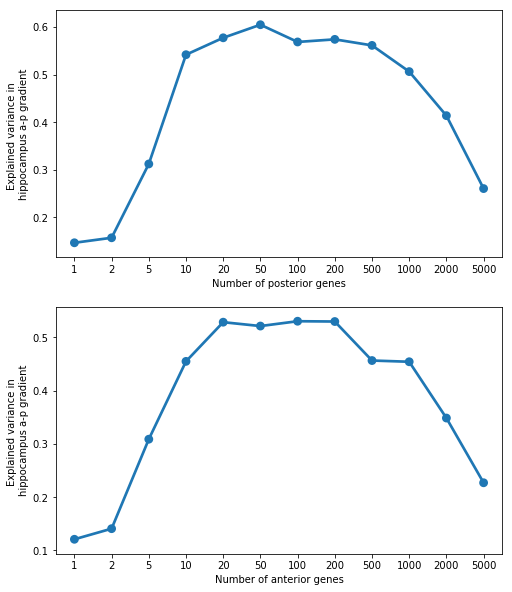

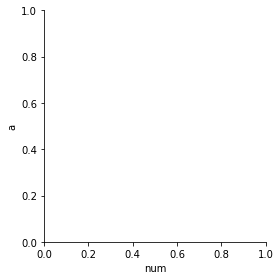

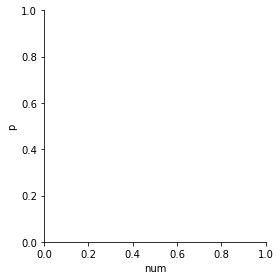

In [11]:
jnk = PCA_LR_pipeline(xp.values.T, 
                            (df.position_along_hipp_AP_axis), 
                            cv_strategy='score', illustrative=True,
                           test_gene_num = [1, 2, 5, 10, 20, 50, 100, 
                                            200, 500, 1000, 2000, 5000],
                               sanity_check_style = 'separate')

In [21]:
to_remove = list(jnk['gene_selections']['posterior_genes_50']) + list(jnk['gene_selections']['anterior_genes_50'])
keep_axis = [x for x in xp.index if x not in to_remove]

In [49]:
jnk.keys()

dict_keys(['betas', 'final_model', 'pca_object', 'CV_scores', 'gene_selections'])

In [132]:
list(zip((dropper,

array([48543, 11683, 32170, 46899, 41005, 50693, 51964,  5747, 12876,
       24877, 35533, 14074,  6787, 53289, 10472, 28422, 29034,  6674,
       24482,  9583, 48239,  2376,  5057, 50937, 11711,  9944, 47005,
       52052,    18, 40335, 16129, 20797, 48111, 30885, 31042, 50378,
       35414, 38084, 45218, 18431, 45291, 36801, 48522, 50009, 15629,
       52262, 49969, 49810,   493, 52732, 35168, 20235, 15389, 31883,
       20723, 31960,  6308, 41228, 18541, 36358, 28375, 28565,  2579,
       35580, 28290, 38607,  5797, 13246, 34314, 21700,  5024, 24659,
       13133, 48329, 28457, 41350, 12484, 46379,  5697, 35410, 39928,
       11197, 25900,  4875, 51986, 25692, 44593, 49496, 45107,  3952,
        3950, 39467, 39853, 24216, 46942, 22827, 17411, 40797, 16369, 26185])

In [57]:
xp.shape

(58692, 170)

In [108]:
cv_acc = []
imp_genes = []
fxp = pandas.DataFrame(xp, copy=True)
ktxp = pandas.DataFrame(xp, copy=True)
for i in range(585):
    print('round',i)
    jnk = PCA_LR_pipeline(fxp.values.T, 
                            (df.position_along_hipp_AP_axis), 
                            cv_strategy='score',
                          test_gene_num = [50],
                               sanity_check_style = 'model')
    cv_acc.append(jnk['CV_scores'])

    dropper = []
    [dropper.append(x) for x in jnk['gene_selections']['posterior_genes_50']] 
    [dropper.append(x) for x in jnk['gene_selections']['anterior_genes_50']]
    if i < 50:
        [imp_genes.append(ktxp.index[x]) for x in dropper]
    fxp.drop(dropper, inplace=True)
    ktxp.drop(ktxp.index[dropper], inplace=True)
    fxp.index = range(len(fxp.index))

In [65]:
len(range(100,58510,100))

585

In [63]:
len(cv_acc)

585

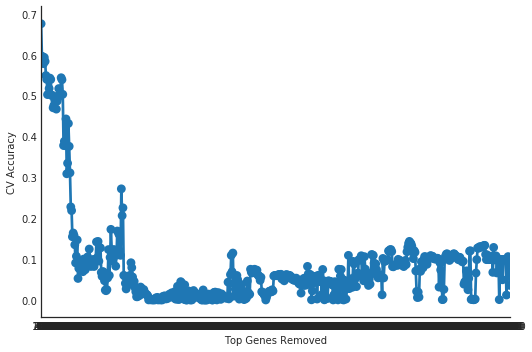

In [66]:
plotr = pandas.DataFrame(index=range(len(cv_acc)), columns = ['Top Genes Removed','CV Accuracy'])
#plotr.loc[:,'Top Genes Removed'] = range(100,5100,100)
plotr.loc[:,'Top Genes Removed'] = range(100,58510,100)
plotr.loc[:,'CV Accuracy'] = cv_acc
plt.close()
sns.factorplot(x='Top Genes Removed', y = 'CV Accuracy', data=plotr, aspect=1.5, size=5)
plt.show()

In [15]:
plotr

,Top Genes Removed,CV Accuracy
0,100,0.675886
1,200,0.596581
2,300,0.594528
3,400,0.578180
4,500,0.593500
5,600,0.583854
6,700,0.549125
7,800,0.539727
8,900,0.502513
9,1000,0.541998


In [109]:
null_cv_acc = []
fxp = pandas.DataFrame(xp, copy=True)
for i in range(585):
    print('round',i)
    jnk = PCA_LR_pipeline(fxp.values.T, 
                            (df.position_along_hipp_AP_axis), 
                            cv_strategy='score', illustrative=False,
                               sanity_check_style = 'model')
    null_cv_acc.append(jnk['CV_scores'])
    
    dropper = np.random.randint(0,len(fxp.index),100)
    fxp.drop(dropper, inplace=True)
    fxp.index = range(len(fxp.index))

In [68]:
585*2

1170

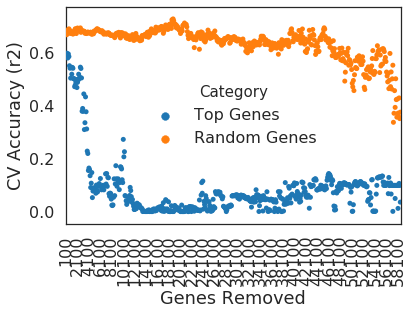

In [69]:

plotr = pandas.DataFrame(index=range(len(cv_acc)*2), 
                         columns = ['Genes Removed','CV Accuracy (r2)', 'Category'])
#plotr.loc[:,'Genes Removed'] = list(range(100,5100,100))*2
plotr.loc[:,'Genes Removed'] = list(range(100,58510,100))*2
plotr.loc[:,'CV Accuracy (r2)'] = cv_acc + null_cv_acc
#plotr.loc[:,'Category'] = ['Top Genes' if x <50 else 'Random Genes' for x in range(100)]
plotr.loc[:,'Category'] = ['Top Genes' if x <585 else 'Random Genes' for x in range(1170)]
sns.set_context('poster')
plt.close()
# g = sns.factorplot(x='Genes Removed', y = 'CV Accuracy', hue = 'Category', 
#              data=plotr, aspect=1.5, size=5)
# g.set_xticklabels(rotation=90)
g = sns.stripplot(x='Genes Removed', y = 'CV Accuracy (r2)', hue = 'Category',
             data=plotr)
for ind, label in enumerate(g.get_xticklabels()):
    #if ind % 10 == 0:  # every 10th label is kept
    if ind % 20 == 0:  # every 100th label is kept
        label.set_visible(True)
        label.set_rotation(90)
    else:
        label.set_visible(False)
#plt.savefig('/Users/jakevogel/Dropbox/Work/Projects/AHBA_Hippocampus_AP/CV_Acc_gene_removal.pdf')
plt.show()

In [74]:
len(null_cv_acc) * 100

58500

In [182]:
sns.clustermap?

In [145]:
df.sort_values('position_along_hipp_AP_axis').index

Int64Index([  0,   1,   2,   3,   4, 105,  99,  98,  45,  50,
            ...
             79,  89, 122,  78,  87,  54,  53,  55, 109,  94],
           dtype='int64', length=170)

In [ ]:
#sns.heatmap()

In [25]:
step1 = 100
step2 = 600
step3 = 2800

In [25]:
np.arange(50,100) + (100 *1)

array([150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162,
       163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175,
       176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188,
       189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199])

In [ ]:
probes.loc[mod_genes.ind]

In [59]:
mod_genes = pandas.DataFrame(index = range(5000),
                            columns = ['probe_ind','ant-post','step'])
mod_genes.loc[:,'probe_ind'] = imp_genes
mod_genes.loc[:,'gene_symbol'] = probes.loc[mod_genes['probe_ind'].values,'gene_symbol'].values
mod_genes.loc[:,'step'] = [1 if x <= step1 else 2 if x <= step2 else 3 if x <= step3 else 4 for x in range(5000)]
ant_ind,post_ind = [],[]
for i in range(50):
    post_ind += (np.arange(50) + (100*i)).tolist()
    ant_ind += (np.arange(50,100) + (100*i)).tolist()
mod_genes.loc[post_ind,'ant-post'] = 'posterior'
mod_genes.loc[ant_ind,'ant-post'] = 'anterior'
mod_genes.head()

,probe_ind,ant-post,step,gene_symbol
0,12941,posterior,1,GAL
1,47792,posterior,1,A_24_P102119
2,8962,posterior,1,ONECUT2
3,26238,posterior,1,PDLIM5
4,343,posterior,1,COL5A2


In [60]:
mod_genes.to_csv('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/MAIN_model_genes_of_importance.csv')

In [55]:
mod_genes = pandas.read_csv(
    '/home/users/jvogel/Science/Allen_Human_Brain_Atlas/clustering_mod_genes/MAIN_model_genes_of_importance.csv')
#    '/Users/jakevogel/Science/AHBA/MAIN_model_genes_of_importance.csv')
mod_genes.index = mod_genes.probe_ind
mod_genes.head()

,probe_ind,probe_ind.1,ant-post,step,gene_symbol
probe_ind,,,,,
4418,4418,4418,anterior,1,SERPINF1
4417,4417,4417,anterior,1,SERPINF1
25772,25772,25772,anterior,1,KLK7
23274,23274,23274,anterior,1,RSPH9
25771,25771,25771,anterior,1,KLK7


In [56]:
mod_genes.shape

(599, 5)

#### Testing gene sets in predicting A-P axis

In [320]:
top_100.shape

(101, 170)

In [61]:
mod_genes.index = mod_genes.probe_ind

performing model cross-validation
using basic 10-fold cross-validation
model cv score: r2 =  0.801987607594
running final model
final model fit r2 =  0.912104588178
running sanity_check


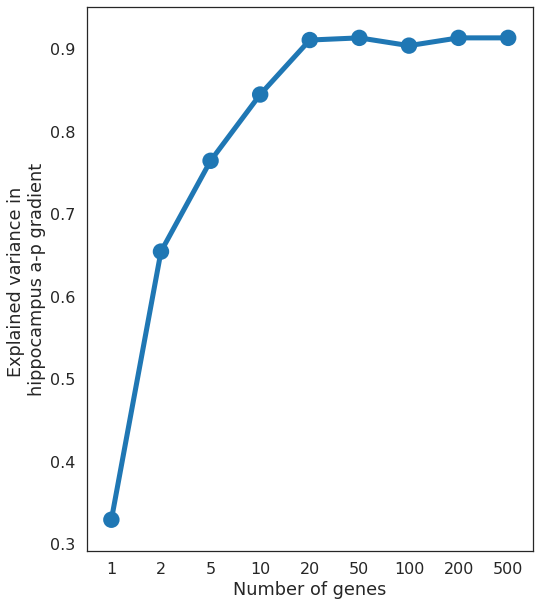

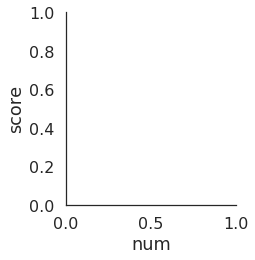

In [77]:
top_100 = xp.loc[mod_genes[mod_genes.step==1].index]
MOD_t100 = PCA_LR_pipeline(top_100.values.T,
                            (df.position_along_hipp_AP_axis), pca=None,
                                clf = linear_model.LassoCV(cv=10,max_iter=5000),
                            cv_strategy='score', illustrative=False,
                           test_gene_num = [1, 2, 5, 10, 20, 50, 100, 200, 500],
                               sanity_check_style = 'model')

In [79]:
from sklearn.ensemble import RandomForestRegressor
rfmod = RandomForestRegressor(random_state=123).fit(top_100.T, df.position_along_hipp_AP_axis.values)

In [80]:
rfmod.score(top_100.T, df.position_along_hipp_AP_axis.values)

0.94813656823040315

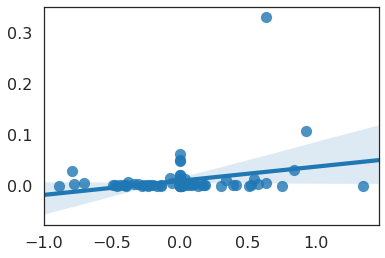

In [82]:
plt.close()
sns.regplot(MOD_t100['betas'],rfmod.feature_importances_)
plt.show()

In [92]:
#list(zip(probes.loc[top_100.index,'gene_symbol'],MOD_t100['betas'],rfmod.feature_importances_))
betadf = pandas.DataFrame(index = top_100.index, columns = ['lasso','rfr','gene_symbol','gene_name'])
betadf.loc[:,'lasso'] = MOD_t100['betas']
betadf.loc[:,'rfr'] = rfmod.feature_importances_
betadf.loc[:,'gene_symbol'] = probes.loc[betadf.index,'gene_symbol']
betadf.loc[:,'gene_name'] = probes.loc[betadf.index,'gene_name']

ValueError: Must have equal len keys and value when setting with an iterable

In [339]:
t100_nulls = pandas.DataFrame(index=range(10), columns = ['score'])
for i in range(10):
    rand_samp = np.random.randint(0,len(xp.index),len(top_100))
    X = xp.loc[xp.index[rand_samp]].values.T
    jnk = PCA_LR_pipeline(X, df.position_along_hipp_AP_axis, pca=None,
                            clf = linear_model.LassoCV(cv=10,max_iter=5000),
                            cv_strategy='score', illustrative=False,
                            sanity_check_style = 'model')
    t100_nulls.loc[i,'score'] = jnk['CV_scores']
    print('finished',i)
print(t100_nulls.score.mean())

performing model cross-validation
using basic 10-fold cross-validation
model cv score: r2 =  0.236830269977
running final model
final model fit r2 =  0.492231861426
running sanity_check
finished 0
performing model cross-validation
using basic 10-fold cross-validation
model cv score: r2 =  0.241430449192
running final model
final model fit r2 =  0.788546194364
running sanity_check
finished 1
performing model cross-validation
using basic 10-fold cross-validation
model cv score: r2 =  0.0560893615029
running final model
final model fit r2 =  0.690633830076
running sanity_check
finished 2
performing model cross-validation
using basic 10-fold cross-validation
model cv score: r2 =  0.142061695309
running final model
final model fit r2 =  0.550792818962
running sanity_check
finished 3
performing model cross-validation
using basic 10-fold cross-validation
model cv score: r2 =  0.134016872364
running final model
final model fit r2 =  0.610016959847
running sanity_check
finished 4
performing mod

running PCA
transforming data
performing model cross-validation
using basic 10-fold cross-validation


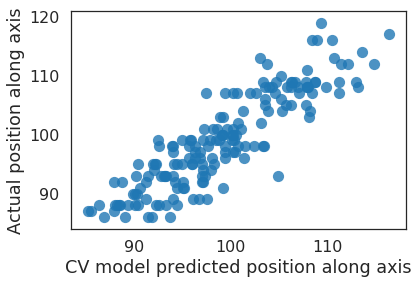

model cv score: r2 =  0.783944911874
running final model
final model fit r2 =  0.849971076553


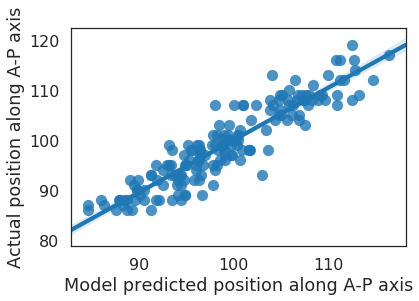

running sanity_check


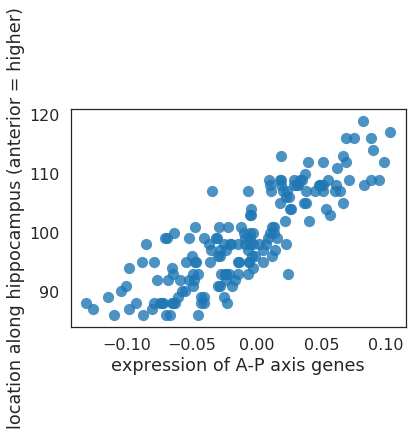

posterior and anterior 100 genes vs. y:  r2 = 0.720371319628, p = 2.35363285891e-48 




In [90]:
top_100_600 = xp.loc[mod_genes[mod_genes.step==2].index]
MOD_t100_600 = PCA_LR_pipeline(top_100_600.values.T, 
                            (df.position_along_hipp_AP_axis), 
                            cv_strategy='score', illustrative=True,
                               sanity_check_style = 'model')

0.928196188594


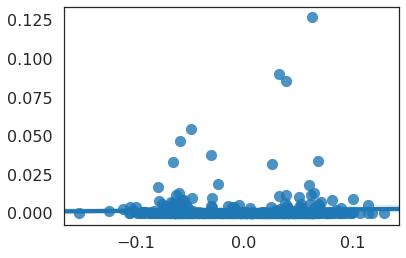

In [91]:
rfmod = RandomForestRegressor(random_state=123).fit(top_100_600.T, df.position_along_hipp_AP_axis.values)
print(rfmod.score(top_100_600.T, df.position_along_hipp_AP_axis.values))
plt.close()
sns.regplot(MOD_t100_600['betas'],rfmod.feature_importances_)
plt.show()

In [93]:
#list(zip(probes.loc[top_100.index,'gene_symbol'],MOD_t100['betas'],rfmod.feature_importances_))
betadf = pandas.DataFrame(index = top_100_600.index, columns = ['lasso','rfr','gene_symbol','gene_name'])
betadf.loc[:,'lasso'] = MOD_t100_600['betas']
betadf.loc[:,'rfr'] = rfmod.feature_importances_
betadf.loc[:,'gene_symbol'] = probes.loc[betadf.index,'gene_symbol']
betadf.loc[:,'gene_name'] = probes.loc[betadf.index,'gene_name']

In [100]:
betadf.sort_values('lasso',ascending=False).head()

,lasso,rfr,gene_symbol,gene_name
probe_ind,,,,
25772,0.109793,0.005242,KLK7,kallikrein-related peptidase 7
24685,0.105310,0.000025,PYDC1,PYD (pyrin domain) containing 1
43970,0.097359,0.000000,PIRT,phosphoinositide-interacting regulator of tran...
25771,0.094423,0.000000,KLK7,kallikrein-related peptidase 7
32688,0.090505,0.001515,APLNR,apelin receptor


running PCA
transforming data
performing model cross-validation
using basic 10-fold cross-validation


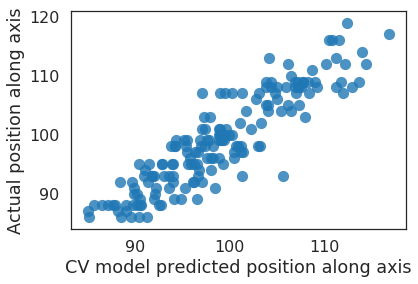

model cv score: r2 =  0.815445497822
running final model
final model fit r2 =  0.862931673596


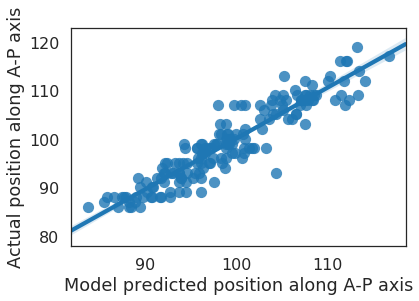

running sanity_check


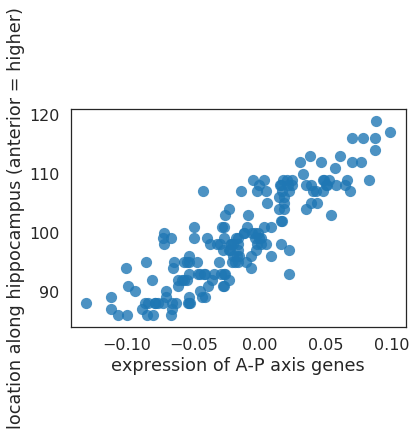

posterior and anterior 100 genes vs. y:  r2 = 0.759310958839, p = 7.76164600483e-54 




In [97]:
top_600 = xp.loc[mod_genes[mod_genes.step<3].index]
MOD_t600 = PCA_LR_pipeline(top_600.values.T, 
                            (df.position_along_hipp_AP_axis), 
                            cv_strategy='score', illustrative=True,
                               sanity_check_style = 'model')

0.937854096617


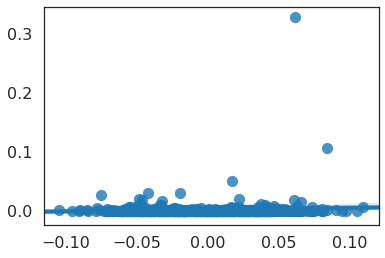

In [98]:
rfmod = RandomForestRegressor(random_state=123).fit(top_600.T, df.position_along_hipp_AP_axis.values)
print(rfmod.score(top_600.T, df.position_along_hipp_AP_axis.values))
plt.close()
sns.regplot(MOD_t600['betas'],rfmod.feature_importances_)
plt.show()

In [99]:
#list(zip(probes.loc[top_100.index,'gene_symbol'],MOD_t100['betas'],rfmod.feature_importances_))
betadf = pandas.DataFrame(index = top_600.index, columns = ['lasso','rfr','gene_symbol','gene_name'])
betadf.loc[:,'lasso'] = MOD_t600['betas']
betadf.loc[:,'rfr'] = rfmod.feature_importances_
betadf.loc[:,'gene_symbol'] = probes.loc[betadf.index,'gene_symbol']
betadf.loc[:,'gene_name'] = probes.loc[betadf.index,'gene_name']
betadf.sort_values('rfr',ascending=False).head(10)

In [341]:
t600_nulls = pandas.DataFrame(index=range(10), columns = ['score'])
for i in range(10):
    rand_samp = np.random.randint(0,len(xp.index),len(top_100_600))
    X = xp.loc[xp.index[rand_samp]].values.T
    jnk = PCA_LR_pipeline(X, df.position_along_hipp_AP_axis,
                            cv_strategy='score', illustrative=False,
                            sanity_check_style = 'model')
    t600_nulls.loc[i,'score'] = jnk['CV_scores']
    print('finished',i)
print(t600_nulls.score.mean())


running PCA
transforming data
performing model cross-validation
using basic 10-fold cross-validation
model cv score: r2 =  0.498163582432
running final model
final model fit r2 =  0.741547669679
running sanity_check
finished 0
running PCA
transforming data
performing model cross-validation
using basic 10-fold cross-validation


/home/users/jvogel/anaconda2/envs/py3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


model cv score: r2 =  0.288148318534
running final model
final model fit r2 =  0.631603886743
running sanity_check
finished 1
running PCA
transforming data
performing model cross-validation
using basic 10-fold cross-validation


/home/users/jvogel/anaconda2/envs/py3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/users/jvogel/anaconda2/envs/py3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/users/jvogel/anaconda2/envs/py3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/users/jvogel/anaconda2/envs/py3/lib/python3.6/site-packages/sklearn/linear_model/coordin

model cv score: r2 =  0.488249112967
running final model
final model fit r2 =  0.728124926615
running sanity_check
finished 2
running PCA
transforming data
performing model cross-validation
using basic 10-fold cross-validation
model cv score: r2 =  0.551693986018
running final model
final model fit r2 =  0.64748645234
running sanity_check
finished 3
running PCA
transforming data
performing model cross-validation
using basic 10-fold cross-validation
model cv score: r2 =  0.144692743247
running final model
final model fit r2 =  0.697074822688
running sanity_check
finished 4
running PCA
transforming data
performing model cross-validation
using basic 10-fold cross-validation
model cv score: r2 =  0.141245848109
running final model
final model fit r2 =  0.490957365457
running sanity_check
finished 5
running PCA
transforming data
performing model cross-validation
using basic 10-fold cross-validation
model cv score: r2 =  0.592697175788
running final model
final model fit r2 =  0.921444904288

/home/users/jvogel/anaconda2/envs/py3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


model cv score: r2 =  0.466735237933
running final model
final model fit r2 =  0.610879515037
running sanity_check
finished 7
running PCA
transforming data
performing model cross-validation
using basic 10-fold cross-validation
model cv score: r2 =  0.271453591084
running final model
final model fit r2 =  0.652456438582
running sanity_check
finished 8
running PCA
transforming data
performing model cross-validation
using basic 10-fold cross-validation


/home/users/jvogel/anaconda2/envs/py3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/users/jvogel/anaconda2/envs/py3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


model cv score: r2 =  0.259908590905
running final model
final model fit r2 =  0.549397846143
running sanity_check
finished 9
0.370298818702


/home/users/jvogel/anaconda2/envs/py3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


running PCA
transforming data
performing model cross-validation
using basic 10-fold cross-validation


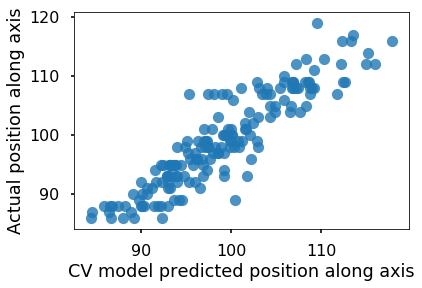

model cv score: r2 =  0.829561726397
running final model
final model fit r2 =  0.882667822928


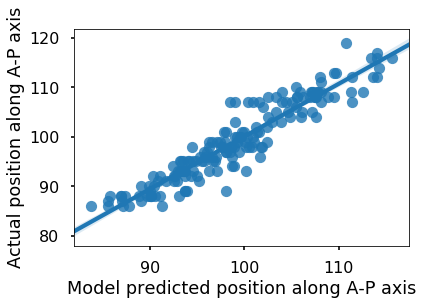

running sanity_check


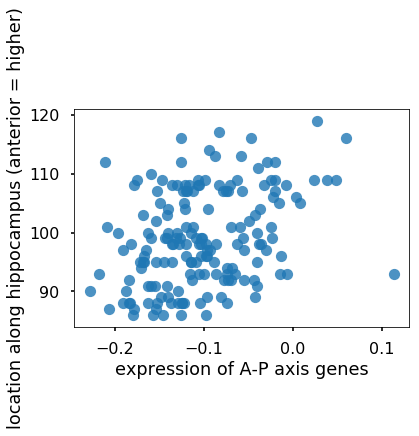

posterior and anterior 1 genes vs. y:  r2 = 0.11552115419, p = 5.77167792152e-06 




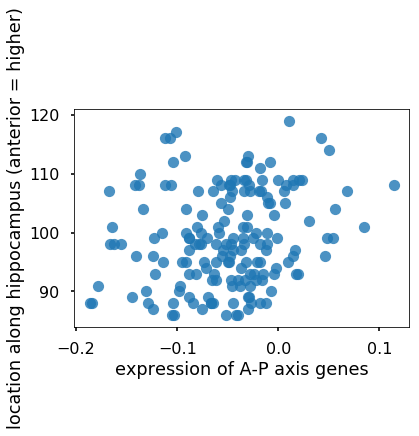

posterior and anterior 2 genes vs. y:  r2 = 0.0404822289585, p = 0.00851442662617 




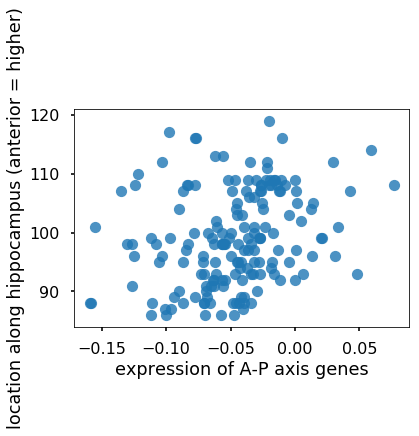

posterior and anterior 5 genes vs. y:  r2 = 0.0720632370378, p = 0.000400920742544 




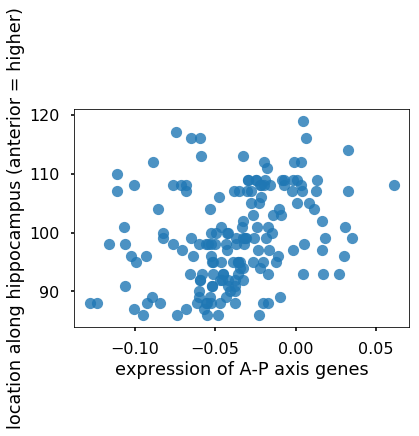

posterior and anterior 10 genes vs. y:  r2 = 0.0909535000581, p = 6.42493709481e-05 




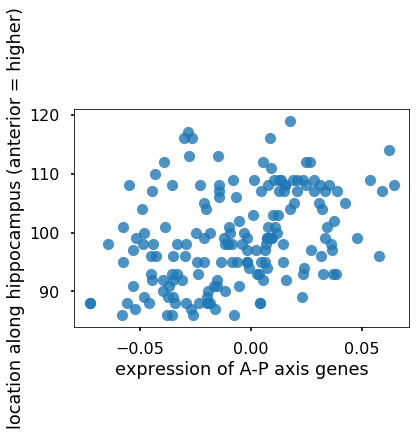

posterior and anterior 20 genes vs. y:  r2 = 0.137912626723, p = 6.17187324079e-07 




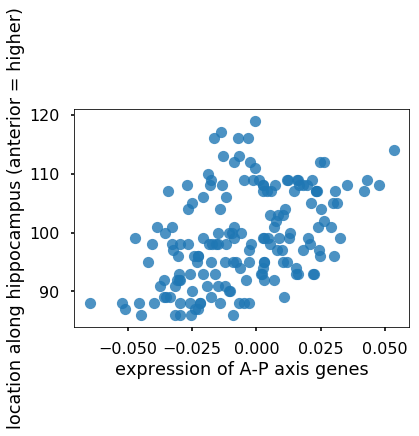

posterior and anterior 50 genes vs. y:  r2 = 0.205320050704, p = 5.48513575984e-10 




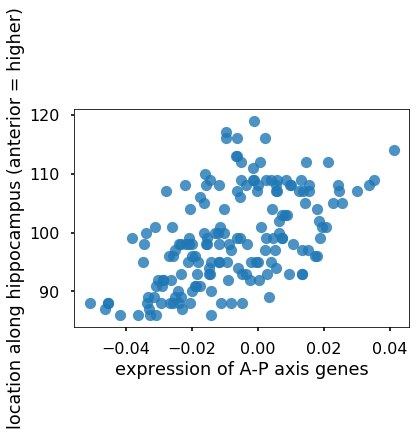

posterior and anterior 100 genes vs. y:  r2 = 0.295379161622, p = 1.88718062594e-14 




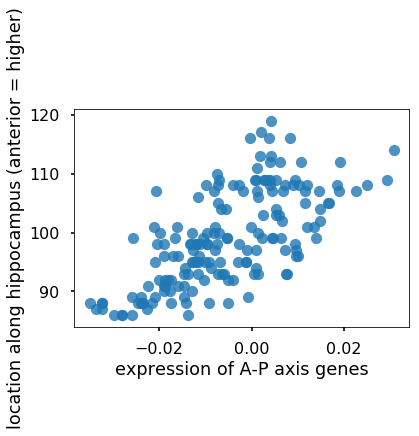

posterior and anterior 200 genes vs. y:  r2 = 0.464379203824, p = 1.50081826118e-24 




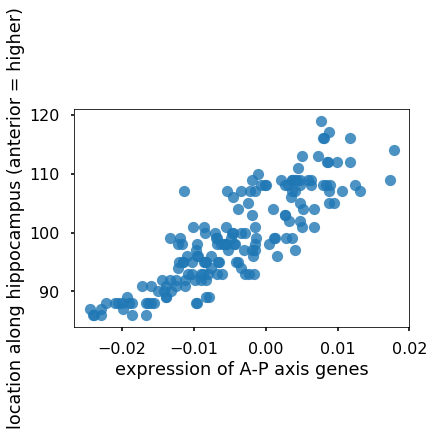

posterior and anterior 500 genes vs. y:  r2 = 0.741034969869, p = 3.67354851725e-51 




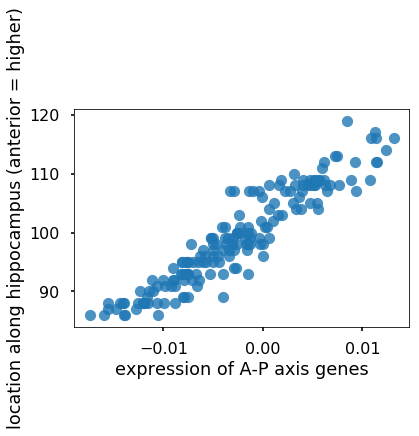

posterior and anterior 1000 genes vs. y:  r2 = 0.882422525099, p = 5.28065699532e-80 




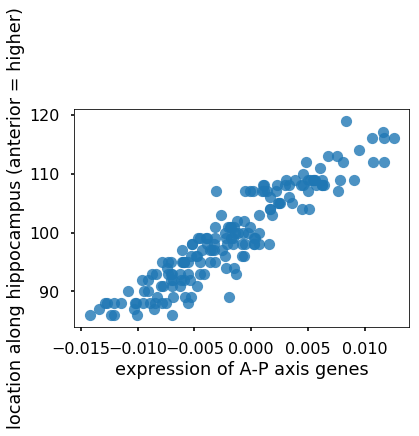

posterior and anterior 1500 genes vs. y:  r2 = 0.867581414205, p = 1.15559694821e-75 




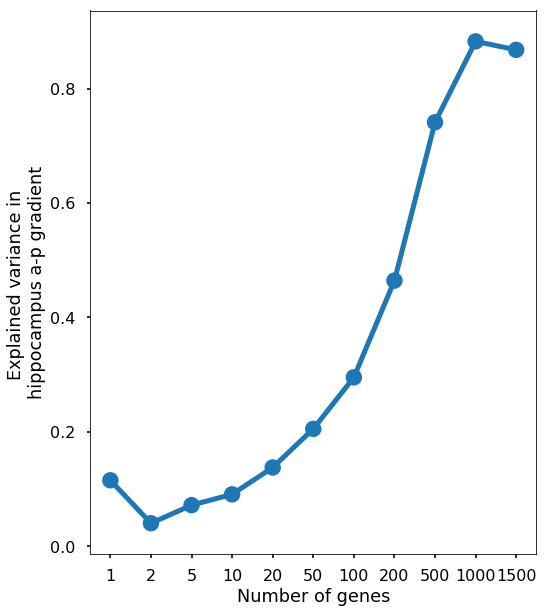

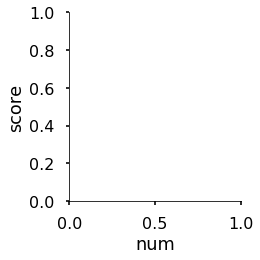

In [71]:
top_600_2700 = xp.loc[mod_genes[mod_genes.step==3].index]
pcalr_out_NEW = PCA_LR_pipeline(top_600_2700.values.T, 
                            (df.position_along_hipp_AP_axis), 
                            cv_strategy='score', illustrative=True,
                           test_gene_num = [1, 2, 5, 10, 20, 50, 100, 200, 500, 
                                            1000, 1500],
                               sanity_check_style = 'model')

In [342]:
t2700_nulls = pandas.DataFrame(index=range(10), columns = ['score'])
for i in range(10):
    rand_samp = np.random.randint(0,len(xp.index),len(top_600_2700))
    X = xp.loc[xp.index[rand_samp]].values.T
    jnk = PCA_LR_pipeline(X, df.position_along_hipp_AP_axis,
                            cv_strategy='score', illustrative=False,
                            sanity_check_style = 'model')
    t2700_nulls.loc[i,'score'] = jnk['CV_scores']
    print('finished',i)
print(t2700_nulls.score.mean())


running PCA
transforming data
performing model cross-validation
using basic 10-fold cross-validation
model cv score: r2 =  0.446303581658
running final model
final model fit r2 =  0.721829601322
running sanity_check
finished 0
running PCA
transforming data
performing model cross-validation
using basic 10-fold cross-validation


/home/users/jvogel/anaconda2/envs/py3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


model cv score: r2 =  0.603840028337
running final model
final model fit r2 =  0.690770408105
running sanity_check
finished 1
running PCA
transforming data
performing model cross-validation
using basic 10-fold cross-validation
model cv score: r2 =  0.619945454002
running final model
final model fit r2 =  0.750133458834
running sanity_check
finished 2
running PCA
transforming data
performing model cross-validation
using basic 10-fold cross-validation
model cv score: r2 =  0.443336242282
running final model
final model fit r2 =  0.716341958699
running sanity_check
finished 3
running PCA
transforming data
performing model cross-validation
using basic 10-fold cross-validation
model cv score: r2 =  0.603329424877
running final model
final model fit r2 =  0.824227806175
running sanity_check
finished 4
running PCA
transforming data
performing model cross-validation
using basic 10-fold cross-validation


/home/users/jvogel/anaconda2/envs/py3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


model cv score: r2 =  0.54493700232
running final model
final model fit r2 =  0.793216130367
running sanity_check
finished 5
running PCA
transforming data
performing model cross-validation
using basic 10-fold cross-validation
model cv score: r2 =  0.551191857802
running final model
final model fit r2 =  0.772266364749
running sanity_check
finished 6
running PCA
transforming data
performing model cross-validation
using basic 10-fold cross-validation


/home/users/jvogel/anaconda2/envs/py3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


model cv score: r2 =  0.531447441816
running final model
final model fit r2 =  0.747083083371
running sanity_check
finished 7
running PCA
transforming data
performing model cross-validation
using basic 10-fold cross-validation
model cv score: r2 =  0.543928071253
running final model
final model fit r2 =  0.673264424944
running sanity_check
finished 8
running PCA
transforming data
performing model cross-validation
using basic 10-fold cross-validation
model cv score: r2 =  0.632469598932
running final model
final model fit r2 =  0.741653124913
running sanity_check
finished 9
0.552072870328


running PCA
transforming data
performing model cross-validation
using basic 10-fold cross-validation


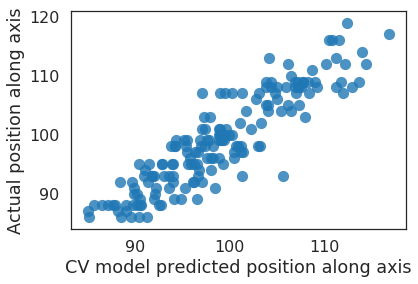

model cv score: r2 =  0.815445497822
running final model
final model fit r2 =  0.862931673596


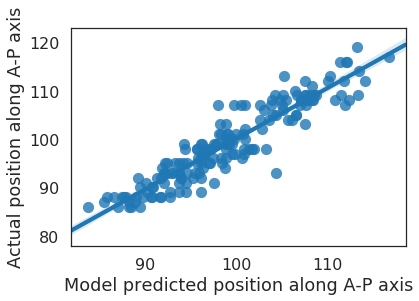

running sanity_check


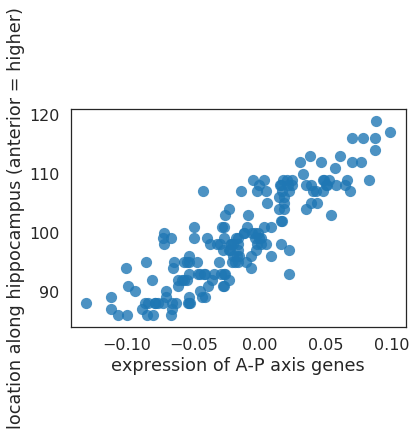

posterior and anterior 100 genes vs. y:  r2 = 0.759310958839, p = 7.76164600483e-54 




In [105]:
top_2700 = xp.loc[mod_genes[mod_genes.step<4].index]
MOD_t2700 = PCA_LR_pipeline(top_2700.values.T, 
                            (df.position_along_hipp_AP_axis), 
                            cv_strategy='score', illustrative=True,
                               sanity_check_style = 'model')

0.937854096617


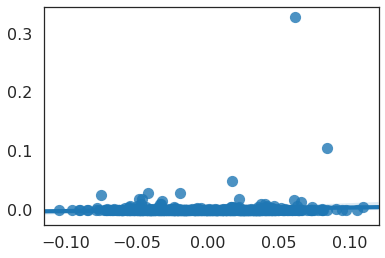

In [106]:
rfmod = RandomForestRegressor(random_state=123).fit(top_2700.T, df.position_along_hipp_AP_axis.values)
print(rfmod.score(top_2700.T, df.position_along_hipp_AP_axis.values))
plt.close()
sns.regplot(MOD_t2700['betas'],rfmod.feature_importances_)
plt.show()

In [107]:
#list(zip(probes.loc[top_100.index,'gene_symbol'],MOD_t100['betas'],rfmod.feature_importances_))
betadf = pandas.DataFrame(index = top_600.index, columns = ['lasso','rfr','gene_symbol','gene_name'])
betadf.loc[:,'lasso'] = MOD_t600['betas']
betadf.loc[:,'rfr'] = rfmod.feature_importances_
betadf.loc[:,'gene_symbol'] = probes.loc[betadf.index,'gene_symbol']
betadf.loc[:,'gene_name'] = probes.loc[betadf.index,'gene_name']
betadf.sort_values('rfr',ascending=False).head(10)

,lasso,rfr,gene_symbol,gene_name
probe_ind,,,,
40112,0.061282,0.327981,NR2F2,"nuclear receptor subfamily 2, group F, member 2"
23274,0.083916,0.105395,RSPH9,radial spoke head 9 homolog (Chlamydomonas)
41473,0.017015,0.050338,CADM1,cell adhesion molecule 1
34523,-0.019388,0.029988,GNG4,guanine nucleotide binding protein (G protein)...
22547,-0.042267,0.029115,FAM43B,"family with sequence similarity 43, member B"
29383,-0.075581,0.026142,FSTL4,follistatin-like 4
19574,0.022234,0.019357,MEGF11,multiple EGF-like-domains 11
17591,-0.048511,0.019279,CNTNAP3,contactin associated protein-like 3
15982,-0.046377,0.018447,SERTAD4,SERTA domain containing 4


running PCA
transforming data
performing model cross-validation
using basic 10-fold cross-validation


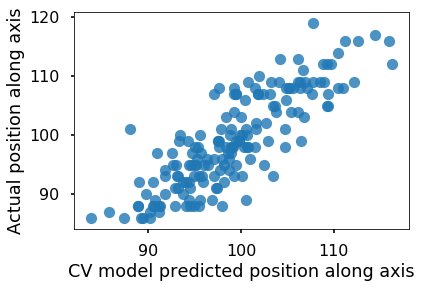

model cv score: r2 =  0.706909514663
running final model
final model fit r2 =  0.830164996537


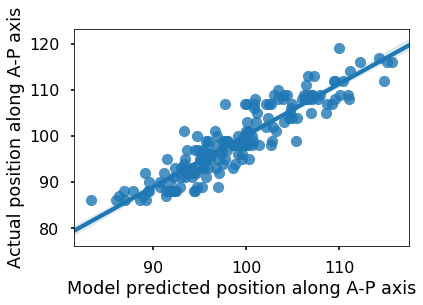

running sanity_check


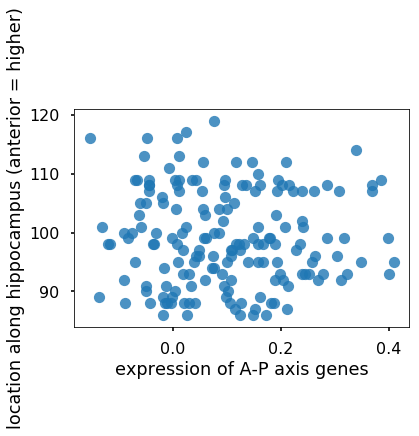

posterior and anterior 1 genes vs. y:  r2 = 0.00112652197057, p = 0.663917510603 




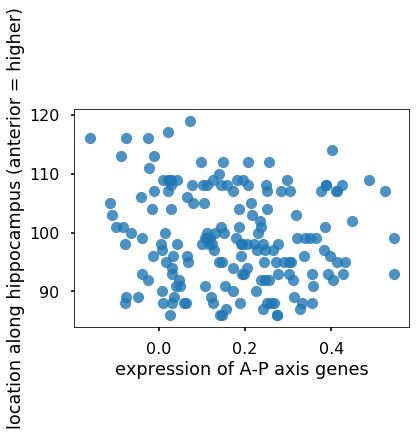

posterior and anterior 2 genes vs. y:  r2 = 0.0130114111312, p = 0.13857328241 




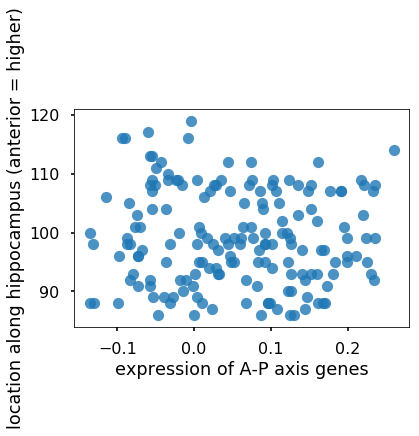

posterior and anterior 5 genes vs. y:  r2 = 0.00239585529688, p = 0.526166633506 




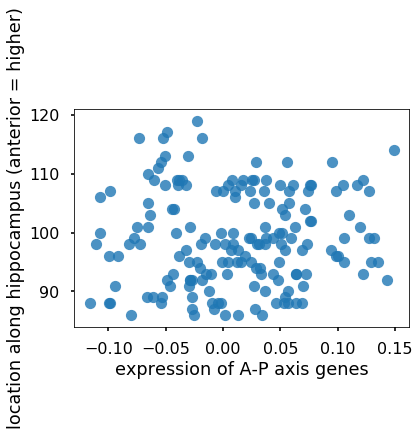

posterior and anterior 10 genes vs. y:  r2 = 0.00181896044072, p = 0.580792748547 




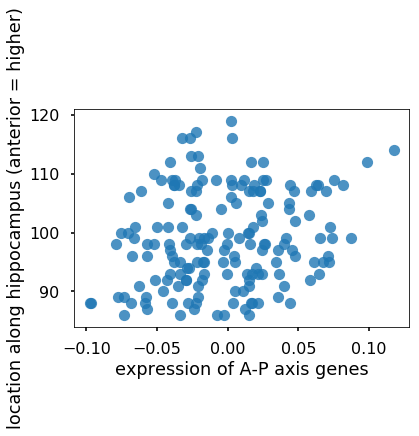

posterior and anterior 20 genes vs. y:  r2 = 0.036264017612, p = 0.0128678897781 




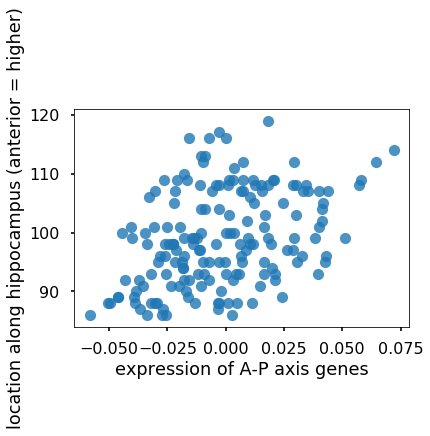

posterior and anterior 50 genes vs. y:  r2 = 0.15300852755, p = 1.33342207276e-07 




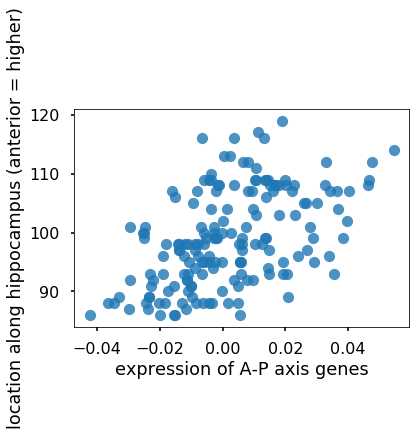

posterior and anterior 100 genes vs. y:  r2 = 0.255417928055, p = 2.08215969779e-12 




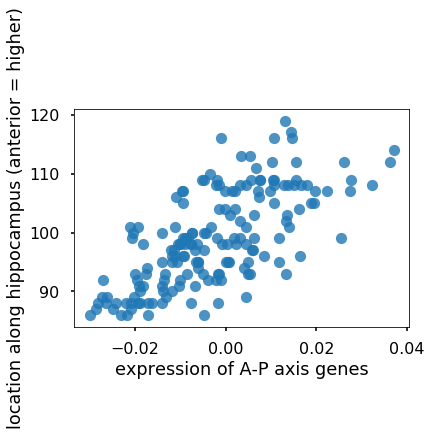

posterior and anterior 200 genes vs. y:  r2 = 0.477666085512, p = 1.7946396619e-25 




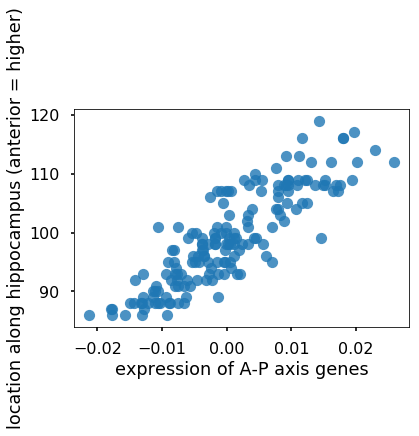

posterior and anterior 500 genes vs. y:  r2 = 0.748451630891, p = 3.1835327715e-52 




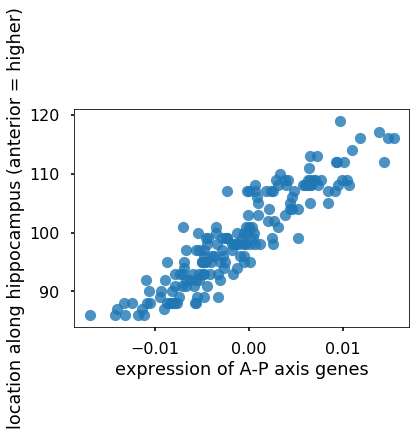

posterior and anterior 1000 genes vs. y:  r2 = 0.839136127389, p = 1.47485800794e-68 




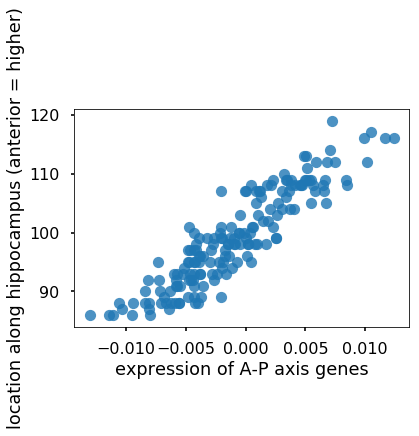

posterior and anterior 1500 genes vs. y:  r2 = 0.833981878833, p = 2.09225832011e-67 




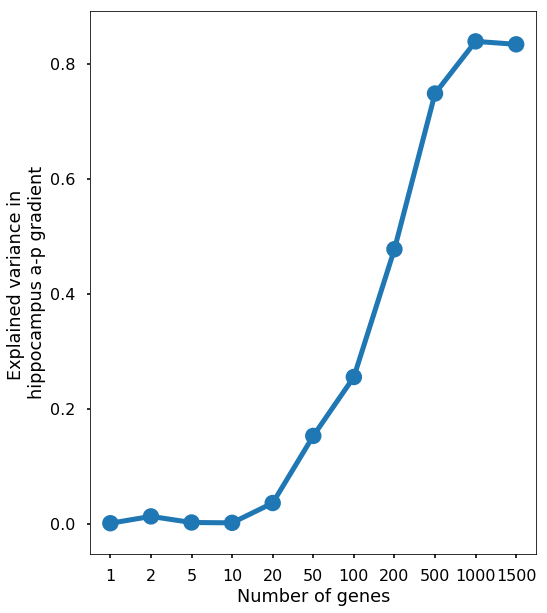

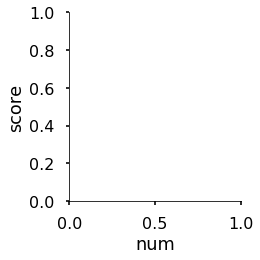

In [74]:
top_2700_end = xp.loc[mod_genes[mod_genes.step==4].index]
pcalr_out_NEW = PCA_LR_pipeline(top_2700_end.values.T, 
                            (df.position_along_hipp_AP_axis), 
                            cv_strategy='score', illustrative=True,
                           test_gene_num = [1, 2, 5, 10, 20, 50, 100, 200, 500, 
                                            1000, 1500],
                               sanity_check_style = 'model')

In [343]:
t5000_nulls = pandas.DataFrame(index=range(10), columns = ['score'])
for i in range(10):
    rand_samp = np.random.randint(0,len(xp.index),len(top_2700_end))
    X = xp.loc[xp.index[rand_samp]].values.T
    jnk = PCA_LR_pipeline(X, df.position_along_hipp_AP_axis,
                            cv_strategy='score', illustrative=False,
                            sanity_check_style = 'model')
    t5000_nulls.loc[i,'score'] = jnk['CV_scores']
    print('finished',i)
print(t5000_nulls.score.mean())


running PCA
transforming data
performing model cross-validation
using basic 10-fold cross-validation
model cv score: r2 =  0.503084442009
running final model
final model fit r2 =  0.702648509681
running sanity_check
finished 0
running PCA
transforming data
performing model cross-validation
using basic 10-fold cross-validation
model cv score: r2 =  0.676757575471
running final model
final model fit r2 =  0.774819886418
running sanity_check
finished 1
running PCA
transforming data
performing model cross-validation
using basic 10-fold cross-validation
model cv score: r2 =  0.52610620185
running final model
final model fit r2 =  0.701850676793
running sanity_check
finished 2
running PCA
transforming data
performing model cross-validation
using basic 10-fold cross-validation
model cv score: r2 =  0.55071029853
running final model
final model fit r2 =  0.766351923154
running sanity_check
finished 3
running PCA
transforming data
performing model cross-validation
using basic 10-fold cross-vali

/home/users/jvogel/anaconda2/envs/py3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/users/jvogel/anaconda2/envs/py3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/users/jvogel/anaconda2/envs/py3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


model cv score: r2 =  0.444513097206
running final model
final model fit r2 =  0.802315492496
running sanity_check
finished 6
running PCA
transforming data
performing model cross-validation
using basic 10-fold cross-validation
model cv score: r2 =  0.601822277488
running final model
final model fit r2 =  0.710495107641
running sanity_check
finished 7
running PCA
transforming data
performing model cross-validation
using basic 10-fold cross-validation
model cv score: r2 =  0.579602306423
running final model
final model fit r2 =  0.722412187905
running sanity_check
finished 8
running PCA
transforming data
performing model cross-validation
using basic 10-fold cross-validation
model cv score: r2 =  0.489206054357
running final model
final model fit r2 =  0.686491542955
running sanity_check
finished 9
0.53692601135


running PCA
transforming data
performing model cross-validation
using basic 10-fold cross-validation


/home/users/jvogel/anaconda2/envs/py3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


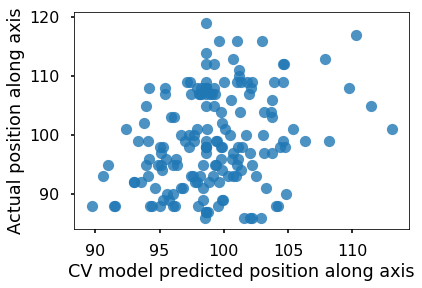

model cv score: r2 =  0.086373985509
running final model
final model fit r2 =  0.0


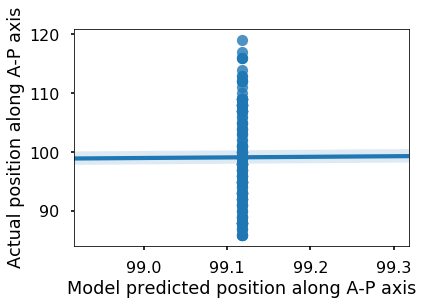

running sanity_check


/home/users/jvogel/anaconda2/envs/py3/lib/python3.6/site-packages/scipy/stats/stats.py:3021: RuntimeWarning: invalid value encountered in double_scalars
  r = r_num / r_den


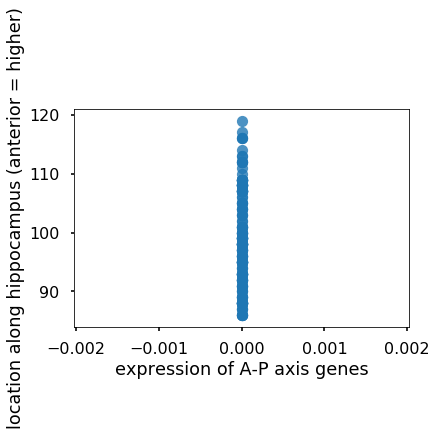

posterior and anterior 100 genes vs. y:  r2 = nan, p = 1.0 




In [336]:
t5k_ind = [x for x in xp.index if x not in mod_genes.probe_ind.values]
top_5k_end = xp.loc[t5k_ind]
pcalr_out_NEW = PCA_LR_pipeline(top_5k_end.values.T, 
                            (df.position_along_hipp_AP_axis), 
                            cv_strategy='score', illustrative=True,
                               sanity_check_style = 'model')

In [344]:
t5ke_nulls = pandas.DataFrame(index=range(10), columns = ['score'])
for i in range(10):
    rand_samp = np.random.randint(0,len(xp.index),len(top_5k_end))
    X = xp.loc[xp.index[rand_samp]].values.T
    jnk = PCA_LR_pipeline(X, df.position_along_hipp_AP_axis,
                            cv_strategy='score', illustrative=False,
                            sanity_check_style = 'model')
    t5ke_nulls.loc[i,'score'] = jnk['CV_scores']
    print('finished',i)
print(t5ke_nulls.score.mean())


running PCA
transforming data
performing model cross-validation
using basic 10-fold cross-validation
model cv score: r2 =  0.670786502587
running final model
final model fit r2 =  0.841716124907
running sanity_check
finished 0
running PCA
transforming data
performing model cross-validation
using basic 10-fold cross-validation
model cv score: r2 =  0.660846917044
running final model
final model fit r2 =  0.722639526765
running sanity_check
finished 1
running PCA
transforming data
performing model cross-validation
using basic 10-fold cross-validation
model cv score: r2 =  0.682542779722
running final model
final model fit r2 =  0.777769454874
running sanity_check
finished 2
running PCA
transforming data
performing model cross-validation
using basic 10-fold cross-validation
model cv score: r2 =  0.659399151742
running final model
final model fit r2 =  0.839669696214
running sanity_check
finished 3
running PCA
transforming data
performing model cross-validation
using basic 10-fold cross-va

/home/users/jvogel/anaconda2/envs/py3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


final model fit r2 =  0.802494003401
running sanity_check
finished 4
running PCA
transforming data
performing model cross-validation
using basic 10-fold cross-validation
model cv score: r2 =  0.68344237429
running final model
final model fit r2 =  0.751751063244
running sanity_check
finished 5
running PCA
transforming data
performing model cross-validation
using basic 10-fold cross-validation
model cv score: r2 =  0.682789321604
running final model
final model fit r2 =  0.834541546994
running sanity_check
finished 6
running PCA
transforming data
performing model cross-validation
using basic 10-fold cross-validation
model cv score: r2 =  0.619123463908
running final model
final model fit r2 =  0.860635706823
running sanity_check
finished 7
running PCA
transforming data
performing model cross-validation
using basic 10-fold cross-validation
model cv score: r2 =  0.626589955244
running final model
final model fit r2 =  0.821094029091
running sanity_check
finished 8
running PCA
transforming

running PCA
transforming data
performing model cross-validation
using basic 10-fold cross-validation


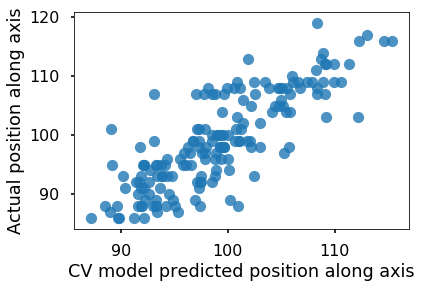

model cv score: r2 =  0.675885977482
running final model
final model fit r2 =  0.876810509326


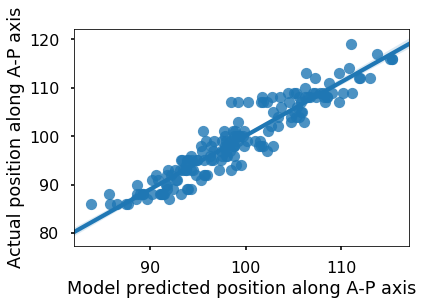

running sanity_check


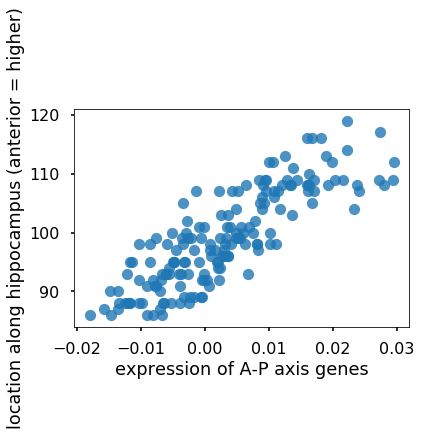

posterior and anterior 100 genes vs. y:  r2 = 0.711342582284, p = 3.41757281096e-47 




In [332]:
all_subs = xp.loc[mod_genes.loc[mod_genes.index].index]
pcalr_out_NEW = PCA_LR_pipeline(xp.values.T, 
                            (df.position_along_hipp_AP_axis), 
                            cv_strategy='score', illustrative=True,
                               sanity_check_style = 'model')

In [347]:
hla_scores = pandas.DataFrame(index = range(12), columns = ['score','model_type','sample'])
hla_scores.loc[:,'model_type'] = ['model']*6 + ['null']*6
hla_scores.loc[:,'sample'] = ['top100','top100-600','top600-2700',
                              'top2700-5000','top5000-end','all']*2
hla_scores.loc[:,'score'] = [81.2, 78.9, 83.0, 70.7, 0.5, 67.5,
                            21.7, 37.02, 55.2, 52.7, 66.6, 70.1]

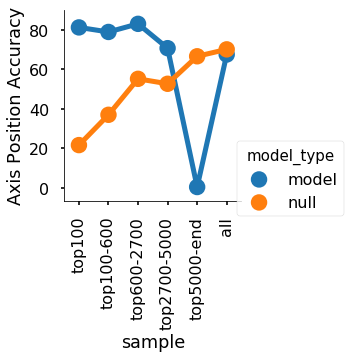

In [348]:
plt.close()
g = sns.factorplot(x='sample',y='score',hue='model_type',data=hla_scores)
g.set_xticklabels(g.ax.get_xticklabels(),rotation=90)
plt.ylabel('Axis Position Accuracy')
plt.show()

In [382]:
vec100 = get_gene_vector(bigdf,probe_ids=top_100.index, betas=MOD_t100['betas'])
vec600 = get_gene_vector(bigdf, probe_ids=top_600.index,betas=MOD_t600['betas'])
vec2700 = get_gene_vector(bigdf,probe_ids=top_2700.index,betas=MOD_t2700['betas'])
#vec5k = get_gene_vector(bigdf,probe_ids=mod_genes[mod_genes.step<5].index)

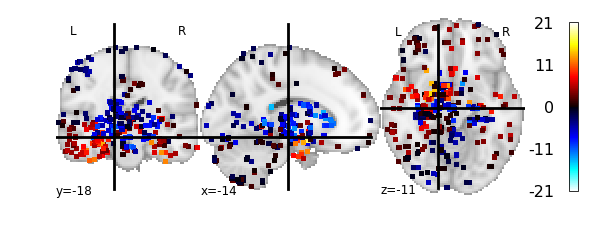

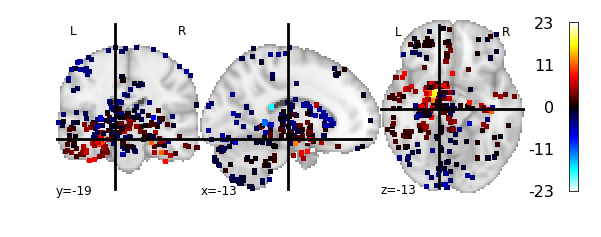

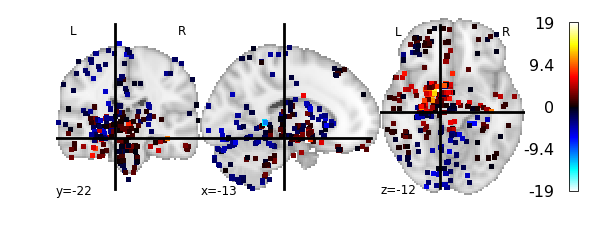

In [383]:
mni = ni.load('/home/users/jvogel/Science/templates/templates/MNI152_T1_1mm_brain.nii')
input_coords = []
for i,row in gdf.iterrows():
    input_coords.append(convert_coords([round(int(row['mni_nlin_x'])), 
                                        round(int(row['mni_nlin_y'])), 
                                        round(int(row['mni_nlin_z']))], 'xyz'))
vex = {'100': vec100, '600': vec600, '2700': vec2700}
for n_probes,vec in vex.items():
    nm = 'XPIMG_%s_top_probes'%n_probes
    gcx_img = make_expression_image(vec, input_coords, mni, wdir, nm, 3, return_img=True)
    plt.close()
    plotting.plot_stat_map(gcx_img)
    plt.show()

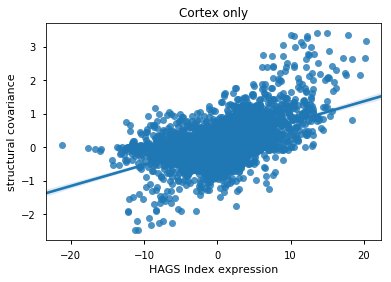

standard statistics: r2 = 0.290977767747, p = 1.13771872797e-250


In [397]:
# structural
# sns.set_context('notebook')
# gdf.loc[:,'vec100'] = vec100
img = diffs_2mm['struc'].get_data()
vrad=3
vdim = 2
gcx_col='vec100'
bootstrap = False
plabs = ['Cortex only',
         'HAGS Index expression','structural covariance']
res, vex = run_gvfcx_analysis(img, gdf, msk2, vrad, vdim, gcx_col, plabs, 
                       bootstrap, n_iter=10, hue_vals=[], illustrative=True)


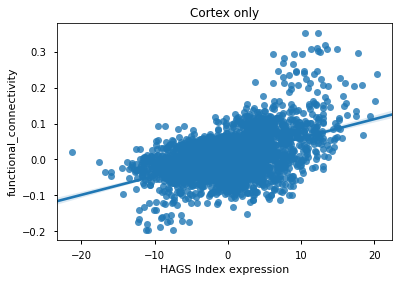

standard statistics: r2 = 0.236654497725, p = 2.62266697114e-197


In [398]:
# functional
img = diffs_2mm['fmri'].get_data()
vrad=3
vdim = 2
gcx_col='vec100'
bootstrap = False
plabs = ['Cortex only',
         'HAGS Index expression','functional_connectivity']
res, vex = run_gvfcx_analysis(img, gdf, msk2, vrad, vdim, gcx_col, plabs, 
                       bootstrap, n_iter=10, hue_vals=[], illustrative=True)


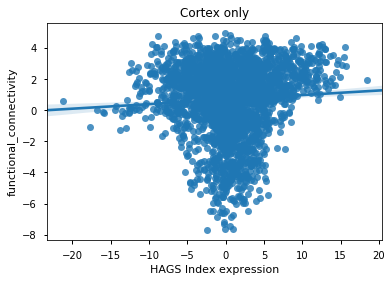

standard statistics: r2 = 0.0036943144328, p = 0.00172876527464


In [403]:
# functional
img = diffs_2mm['dis'].get_data()
vrad=3
vdim = 2
gcx_col='vec100'
bootstrap = False
plabs = ['Cortex only',
         'HAGS Index expression','functional_connectivity']
res, vex = run_gvfcx_analysis(img, gdf, msk4, vrad, vdim, gcx_col, plabs, 
                       bootstrap, n_iter=10, hue_vals=[], illustrative=True)


In [410]:
gdf.to_csv('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/MAIN_gcx_wholebrain_info_W_SMALL_SETS.csv')

#### Testing models to recognize subfield/individual

In [227]:
from sklearn.multiclass import OneVsRestClassifier
from sklearn.cross_validation import StratifiedKFold
from sklearn.multiclass import LabelBinarizer
from sklearn.svm import SVC


In [221]:
from sklearn.multiclass import LabelBinarizer
jnk = LabelBinarizer().fit_transform(df.structure_acronym)

In [280]:
from sklearn.multiclass import OneVsRestClassifier
from sklearn.cross_validation import StratifiedKFold
from sklearn.svm import SVC

def OVR_test(X, y, kfold = StratifiedKFold(y,n_folds=10,shuffle=True,random_state=123),
            clf = SVC(random_state=123), verbosity = 0, save_predicted = False):
    
    if type(verbosity) != int:
        raise IOError('verbosity must be an integer')
    else:
        if verbosity > 2 or verbosity < 0:
            raise IOError('verbosity must be an integer between 0 and 2 inclusive')
    
    i = 0
    scores = []
    if save_predicted:
        predicted = {}
        true = {}
    for tr_ind,te_ind in kfold:
        X_tr = X.loc[X.index[tr_ind]] 
        X_te = X.loc[X.index[te_ind]]
        y_tr = y[tr_ind]
        y_te = y[te_ind]
        ovr = OneVsRestClassifier(clf).fit(X_tr,y_tr)
        score = ovr.score(X_te, y_te)
        if verbosity == 2:
            print('fold %s, score: %s'%(i,score))
        scores.append(score)
        if save_predicted:
            true.update({i: y_te})
            predicted.update({i: ovr.predict(X_te)})
        i += 1
    average_score = np.mean(scores)
    if verbosity > 0:
        print('average score =', average_score)
    
    if save_predicted:
        return average_score, true, predicted
    else:
        return average_score

In [295]:
X = top_100.T
y = df.structure_acronym
t100_score = OVR_test(X,y,verbosity=2)

fold 0, score: 0.894736842105
fold 1, score: 1.0
fold 2, score: 0.944444444444
fold 3, score: 1.0
fold 4, score: 1.0
fold 5, score: 0.764705882353
fold 6, score: 0.882352941176
fold 7, score: 1.0
fold 8, score: 1.0
fold 9, score: 0.857142857143
average score = 0.934338296722


In [288]:
null_subfield_100 = pandas.DataFrame(index=range(100),columns = ['score'])
for i in range(100):
    rand_samp = np.random.randint(0,len(xp.index),len(top_100))
    X = xp.loc[xp.index[rand_samp]].T
    score = OVR_test(X,y)
    null_subfield_100.loc[i,'score'] = score
    if i % 10 == 0:
        print('finished', i)

finished 0
finished 10
finished 20
finished 30
finished 40
finished 50
finished 60
finished 70
finished 80
finished 90


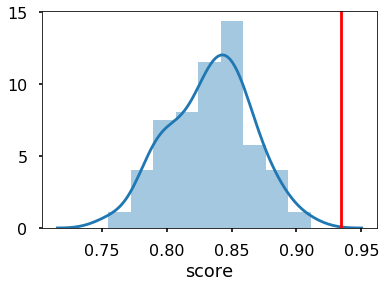

In [296]:
plt.close()
sns.distplot(null_subfield_100.score)
plt.plot((t100_score,t100_score),(0,15),'r-')
plt.show()

In [300]:
X = top_100_600.T
y = df.structure_acronym
t600_score = OVR_test(X,y,verbosity=2)

fold 0, score: 0.894736842105
fold 1, score: 1.0
fold 2, score: 0.944444444444
fold 3, score: 1.0
fold 4, score: 0.944444444444
fold 5, score: 0.764705882353
fold 6, score: 1.0
fold 7, score: 1.0
fold 8, score: 1.0
fold 9, score: 0.857142857143
average score = 0.940547447049


In [306]:
null_subfield_600 = pandas.DataFrame(index=range(100),columns = ['score'])
for i in range(100):
    rand_samp = np.random.randint(0,len(xp.index),len(top_100_600))
    X = xp.loc[xp.index[rand_samp]].T
    score = OVR_test(X,y)
    null_subfield_600.loc[i,'score'] = score
    if i % 10 == 0:
        print('finished', i)

finished 0
finished 10
finished 20
finished 30
finished 40
finished 50
finished 60
finished 70
finished 80
finished 90


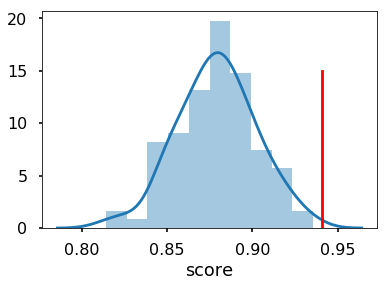

In [313]:
plt.close()
sns.distplot(null_subfield_600.score)
plt.plot((t600_score,t600_score),(0,15),'r-')
plt.show()

In [301]:
X = top_600_2700.T
y = df.structure_acronym
t2700_score = OVR_test(X,y,verbosity=2)

fold 0, score: 0.894736842105
fold 1, score: 0.947368421053
fold 2, score: 0.944444444444
fold 3, score: 1.0
fold 4, score: 0.944444444444
fold 5, score: 0.764705882353
fold 6, score: 0.882352941176
fold 7, score: 1.0
fold 8, score: 1.0
fold 9, score: 0.857142857143
average score = 0.923519583272


In [314]:
null_subfield_2700 = pandas.DataFrame(index=range(100),columns = ['score'])
for i in range(100):
    rand_samp = np.random.randint(0,len(xp.index),len(top_600_2700))
    X = xp.loc[xp.index[rand_samp]].T
    score = OVR_test(X,y)
    null_subfield_2700.loc[i,'score'] = score
    if i % 10 == 0:
        print('finished', i)

finished 0
finished 10
finished 20
finished 30
finished 40
finished 50
finished 60
finished 70
finished 80
finished 90


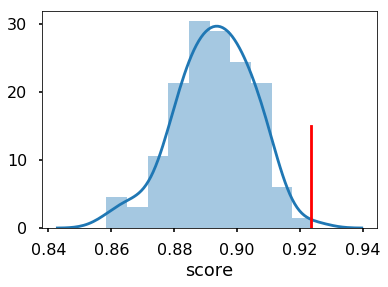

In [315]:
plt.close()
sns.distplot(null_subfield_2700.score)
plt.plot((t2700_score,t2700_score),(0,15),'r-')
plt.show()

In [317]:
subfield_scores = pandas.DataFrame(index = range(6), columns = ['score','model_type','sample'])
subfield_scores.loc[:,'model_type'] = ['model']*3 + ['null']*3
subfield_scores.loc[:,'sample'] = ['top100','top100-600','top600-2700']*2
subfield_scores.loc[:,'score'] = [t100_score,t600_score,t2700_score,
                                 null_subfield_100.score.mean(), null_subfield_600.score.mean(),
                                 null_subfield_2700.score.mean()]

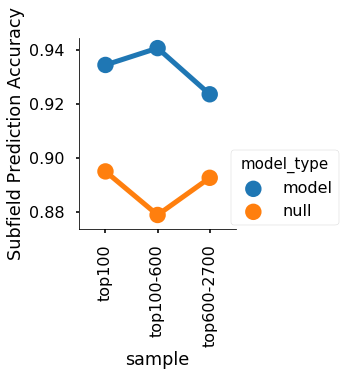

In [330]:
plt.close()
g = sns.factorplot(x='sample',y='score',hue='model_type',data=subfield_scores)
g.set_xticklabels(g.ax.get_xticklabels(),rotation=90)
plt.ylabel('Subfield Prediction Accuracy')
plt.show()

# fig,ax1 = plt.subplots(figsize=(10,6))
# sns.factorplot(x='num', y='score', data=jnk, ax=ax1)
# ax1.set(xlabel = 'Number of probes', 
#         ylabel ='Explained variance in \nhippocampus a-p gradient')
# ax1.set_xticklabels(ax1.get_xticklabels(),rotation=90)

#### testing models to learn points along the axis

In [350]:
X = top_100.T
y = df.position_along_hipp_AP_axis
t100_score = OVR_test(X,y,verbosity=2)

fold 0, score: 0.157894736842
fold 1, score: 0.157894736842
fold 2, score: 0.166666666667
fold 3, score: 0.166666666667
fold 4, score: 0.166666666667
fold 5, score: 0.0588235294118
fold 6, score: 0.235294117647
fold 7, score: 0.0
fold 8, score: 0.0714285714286
fold 9, score: 0.285714285714
average score = 0.146704997789


In [357]:
null_position_100 = pandas.DataFrame(index=range(100),columns = ['score'])
for i in range(10):
    rand_samp = np.random.randint(0,len(xp.index),len(top_100))
    X = xp.loc[xp.index[rand_samp]].T
    score = OVR_test(X,y)
    null_position_100.loc[i,'score'] = score
    print('finished', i)
print(null_position_100.score.mean())

finished 0
finished 1
finished 2
finished 3
finished 4
finished 5
finished 6
finished 7
finished 8
finished 9
0.129497303307


In [351]:
X = top_100_600.T
y = df.position_along_hipp_AP_axis
t600_score = OVR_test(X,y,verbosity=2)

fold 0, score: 0.105263157895
fold 1, score: 0.157894736842
fold 2, score: 0.166666666667
fold 3, score: 0.166666666667
fold 4, score: 0.166666666667
fold 5, score: 0.0588235294118
fold 6, score: 0.176470588235
fold 7, score: 0.125
fold 8, score: 0.0
fold 9, score: 0.214285714286
average score = 0.133773772667


In [352]:
X = top_600_2700.T
y = df.position_along_hipp_AP_axis
t2700_score = OVR_test(X,y,verbosity=2)

fold 0, score: 0.263157894737
fold 1, score: 0.210526315789
fold 2, score: 0.166666666667
fold 3, score: 0.222222222222
fold 4, score: 0.166666666667
fold 5, score: 0.0588235294118
fold 6, score: 0.117647058824
fold 7, score: 0.0625
fold 8, score: 0.0
fold 9, score: 0.285714285714
average score = 0.155392464003


In [353]:
X = top_2700_end.T
y = df.position_along_hipp_AP_axis
t5000_score = OVR_test(X,y,verbosity=2)

fold 0, score: 0.210526315789
fold 1, score: 0.105263157895
fold 2, score: 0.111111111111
fold 3, score: 0.222222222222
fold 4, score: 0.166666666667
fold 5, score: 0.0588235294118
fold 6, score: 0.117647058824
fold 7, score: 0.0
fold 8, score: 0.0
fold 9, score: 0.142857142857
average score = 0.113511720478


In [ ]:
X = top_2700_end.T
y = df.position_along_hipp_AP_axis
t5000_score = OVR_test(X,y,verbosity=2)

In [169]:
ant_entrez = np.unique([int(x) for x in probes.loc[mod_genes[mod_genes['ant-post']=='posterior'].index[:300],'entrez_id'
                                              ].values if pandas.notnull(x)])
string = ''
for x in ant_entrez:
    string += str(x)+' '
string

'135 326 623 846 1013 1124 1134 1290 1392 1644 1869 2006 2027 2554 2557 2561 2563 2786 2892 2897 3067 3358 3363 3554 3776 3816 4025 4521 5179 5806 5816 5888 6094 6397 6496 6863 7056 7139 7162 7276 8614 9099 9162 9260 9423 9480 9607 9828 9840 9980 10611 10645 10874 11015 11123 11259 22987 23105 25928 26031 26255 27133 51083 51765 54738 54769 54796 54798 54869 55806 56114 56128 56256 56603 56902 56937 56963 57491 57528 57604 60495 64168 64388 64399 64919 79180 79805 79937 79977 80031 80036 80115 80323 80326 83481 83988 83999 84790 85004 91624 92292 115557 125058 144402 157506 157869 158295 160851 163702 163933 168002 171019 219938 255743 256364 266743 285180 286530 341359 345895 348093 348840 387751 388341 390874 440279 572558 574036 613212 642373 643827 644150 646576 654790 100127983 100130386 '

In [297]:
ant_entrez = np.unique([x for x in probes.loc[mod_genes[mod_genes['ant-post']=='posterior'].index[:300],'gene_symbol'
                                              ].values if pandas.notnull(x)])
string = ''
for x in ant_entrez:
    string += str(x)+', '
string

'AC073135.1, ADAMTS19, ADORA2A, AIRE, ARHGEF17, A_23_P10488, A_24_P102119, A_24_P247576, A_24_P307599, A_24_P365129, A_24_P365349, A_24_P376139, A_24_P401842, A_24_P42564, A_24_P535256, A_24_P62668, A_24_P710171, A_24_P722248, A_24_P759647, A_24_P85391, A_24_P930963, A_32_P100771, A_32_P104023, A_32_P104448, A_32_P11262, A_32_P121537, A_32_P129265, A_32_P129406, A_32_P137382, A_32_P168561, A_32_P170997, A_32_P175042, A_32_P17525, A_32_P203232, A_32_P217543, A_32_P377880, A_32_P38745, A_32_P405010, A_32_P497742, A_32_P50187, A_32_P51005, A_32_P64286, A_32_P71744, A_32_P93115, A_32_P99399, BAIAP2L2, BCL11B, BDKRB1, BNC2, C17orf76, C1orf133, C8orf84, CAMKK2, CARTPT, CASR, CCDC68, CDH15, CHN2, CHRNA1, CNTNAP3, COL5A2, CPNE8, CRH, CTXN3, CUST_166_PI417507815, CYP26B1, DACT2, DCHS2, DDC, DGKH, DGKI, DIRAS2, DOPEY2, E2F1, EFHD2, ELN, EML3, ENO3, EPPK1, EPS8L1, FAM43B, FEV, FILIP1L, FSTL4, GABRA1, GABRA4, GABRB2, GABRD, GAL, GEFT, GLYATL1, GNG4, GREM2, GRHL2, GRIA3, GRIK1, GVINP1, HDC, HHIP, H

In [301]:
jnk = pandas.read_table('/Users/jakevogel/Downloads/bioDBnet_db2db_180812112321_1636544444.txt',
                       )

string = '' 
for i,row in jnk.iterrows():
    hit = [x for x in row['KEGG Gene ID'].split('; ') if 'hsa' in x]
    if len(hit) > 0:
        string += hit[0]+' '
print(string)

hsa:171019 hsa:135 hsa:326 hsa:9828 hsa:80115 hsa:64919 hsa:623 hsa:54796 hsa:10645 hsa:9607 hsa:846 hsa:80323 hsa:1013 hsa:1124 hsa:1134 hsa:79937 hsa:1290 hsa:144402 hsa:1392 hsa:613212 hsa:56603 hsa:168002 hsa:54798 hsa:1644 hsa:160851 hsa:9162 hsa:54769 hsa:1869 hsa:79180 hsa:2006 hsa:256364 hsa:2027 hsa:83481 hsa:54869 hsa:163933 hsa:54738 hsa:11259 hsa:23105 hsa:2554 hsa:2557 hsa:2561 hsa:2563 hsa:51083 hsa:92292 hsa:2786 hsa:64388 hsa:79977 hsa:2892 hsa:2897 hsa:387751 hsa:3067 hsa:64399 hsa:60495 


### Clustering data

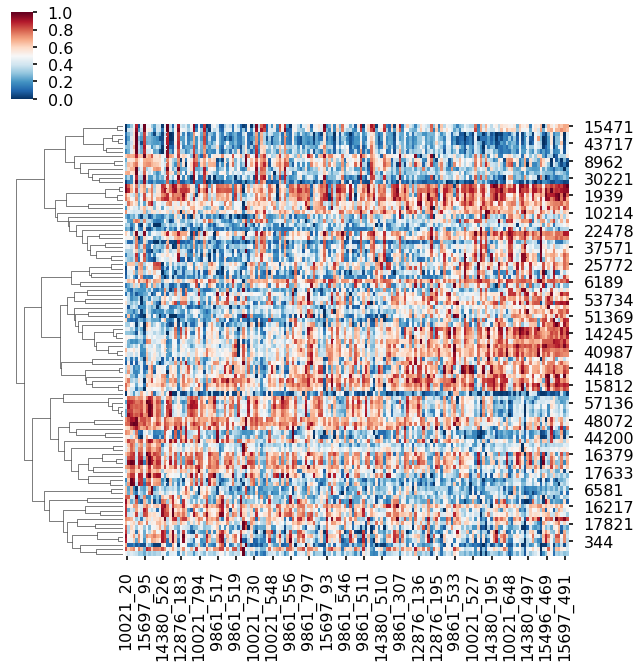

In [85]:

jnk = xp.loc[imp_genes[:step1],
             xp.columns[df.sort_values('position_along_hipp_AP_axis').index]
            ]
plt.close()
g = sns.clustermap(jnk,
               col_cluster=False, metric='correlation', standard_scale=0,
               cmap='RdBu_r')
plt.show()

In [48]:
clusterer.labels_

array([3, 3, 0, 4, 1, 4, 3, 3, 5, 0, 1, 0, 0, 5, 0, 4, 4, 1, 0, 0, 5, 0, 5,
       2, 2, 3, 0, 4, 5, 5, 3, 1, 0, 0, 0, 5, 2, 0, 0, 0, 4, 3, 3, 0, 0, 0,
       3, 0, 3, 3, 1, 1, 3, 1, 3, 1, 2, 5, 5, 0, 5, 0, 1, 3, 5, 4, 0, 4, 2,
       5, 2, 1, 1, 0, 2, 2, 3, 0, 4, 1, 0, 1, 1, 1, 1, 2, 4, 5, 0, 5, 4, 1,
       1, 1, 4, 1, 2, 4, 1, 5])

In [88]:
X = g2.data2d.values
clusterer = hdbscan.HDBSCAN(min_cluster_size=3)
cluster_labels = clusterer.fit_predict(X)
print(len(np.unique(cluster_labels)))
plt.close()
mtx = pandas.DataFrame(g2.data2d, copy=True)
mtx.loc[:,'label'] = cluster_labels
sns.heatmap(mtx.loc[mtx.sort_values('label').index][mtx.columns[:-1]], cmap = 'RdBu_r')
plt.show()

NameError: name 'hdbscan' is not defined

In [63]:
mod_genes.index = mod_genes.probe_ind
mod_genes.head()

,probe_ind,ant-post,step
probe_ind,,,
12941,12941,posterior,1
47792,47792,posterior,1
8962,8962,posterior,1
26238,26238,posterior,1
343,343,posterior,1


In [94]:
from sklearn.neighbors import kneighbors_graph
from sklearn.metrics import calinski_harabaz_score
from sklearn.metrics import silhouette_score
from sklearn.cluster import AgglomerativeClustering

In [92]:

X = g.data2d.values
n_clusters=6
connectivity = kneighbors_graph(X, n_neighbors=2, include_self=False)
clusterer = AgglomerativeClustering(n_clusters=n_clusters, connectivity=connectivity)
#clusterer = KMeans(n_clusters=n_clusters, random_state=10)
cluster_labels = clusterer.fit_predict(X)
mtx = pandas.DataFrame(g.data2d, copy=True)
mtx.loc[:,'label'] = cluster_labels

In [119]:
np.corrcoef(g.data2d.values).shape

(100, 100)

In [126]:
ks = range(2,17)
#X = g.data2d.values
X = np.corrcoef(g.data2d.values)
cluster_solutions_1 = pandas.DataFrame(index = ks, columns = ['avg_ratio', 'n_hits','n_close', 
                                                              'silhouette', 'CH_index',
                                                             'mean_size','min_size','max_size'])
for k in ks:
    connectivity = kneighbors_graph(X, n_neighbors=2, include_self=False)
    clusterer = AgglomerativeClustering(n_clusters=k, connectivity=connectivity)
    cluster_labels = clusterer.fit_predict(X)
    # silhouette
    cluster_solutions_1.loc[k,'silhouette'] = silhouette_score(X, cluster_labels)
    # CH Index
    cluster_solutions_1.loc[k,'CH_index'] = calinski_harabaz_score(X, cluster_labels)
    mtx = pandas.DataFrame(g.data2d, copy=True)
    mtx.loc[:,'label'] = cluster_labels
    rats = []
    hits = 0
    close = 0
    sizes = []
    for i in np.unique(mtx.label):
        clus_data = mtx[mtx.label==i][mtx.columns[:-1]]
        sizes.append(len(clus_data))
        # RATIOS OF ANTERIOR/POSTERIOR GENES
        ants = len([x for x in clus_data.index if mod_genes.loc[x,'ant-post'] == 'anterior'])
        posts = len([x for x in clus_data.index if mod_genes.loc[x,'ant-post'] == 'posterior'])
        if ants > posts:
            rat = (100/(ants+posts)) * ants
        else:
            rat = (100/(ants+posts)) * posts
        rats.append(rat)
        if rat == 100:
            hits += 1
        if rat > 90:
            close += 1
    cluster_solutions_1.loc[k,'avg_ratio'] = np.mean(rats)
    cluster_solutions_1.loc[k,'n_hits'] = hits
    cluster_solutions_1.loc[k,'n_close'] = close
    # SIZES
    cluster_solutions_1.loc[k,'mean_size'] = np.mean(sizes)
    cluster_solutions_1.loc[k,'min_size'] = np.min(sizes)
    cluster_solutions_1.loc[k,'max_size'] = np.max(sizes)
    
    print('finished',k)

/home/users/jvogel/anaconda2/envs/py3/lib/python3.6/site-packages/sklearn/cluster/hierarchical.py:193: UserWarning: the number of connected components of the connectivity matrix is 7 > 1. Completing it to avoid stopping the tree early.
  affinity='euclidean')


finished 2
finished 3
finished 4
finished 5
finished 6
finished 7
finished 8
finished 9
finished 10
finished 11
finished 12
finished 13
finished 14
finished 15
finished 16


In [111]:
cluster_solutions_1.loc[:,'perc_hits'] = cluster_solutions_1.n_hits.values / cluster_solutions_1.index.values
cluster_solutions_1.loc[:,'perc_close'] = cluster_solutions_1.n_close.values / cluster_solutions_1.index.values
cluster_solutions_1.loc[:,'k'] = cluster_solutions_1.index
cluster_solutions_1.head()

,avg_ratio,n_hits,n_close,silhouette,CH_index,mean_size,min_size,max_size,perc_hits,perc_close,k
2,50,0,0,0.163909,22.9564,50,52,48,0,0,2
3,83.3333,2,2,0.141743,18.5335,33.3333,48,26,0.666667,0.666667,3
4,95,3,3,0.132893,16.071,25,30,18,0.75,0.75,4
5,92.5,4,4,0.139016,15.1134,20,26,14,0.8,0.8,5
6,93.75,4,5,0.153227,14.8989,16.6667,26,11,0.666667,0.833333,6


In [127]:
cluster_solutions_1.loc[:,'perc_hits'] = cluster_solutions_1.n_hits.values / cluster_solutions_1.index.values
cluster_solutions_1.loc[:,'perc_close'] = cluster_solutions_1.n_close.values / cluster_solutions_1.index.values
cluster_solutions_1.loc[:,'k'] = cluster_solutions_1.index
cluster_solutions_1.head()

,avg_ratio,n_hits,n_close,silhouette,CH_index,mean_size,min_size,max_size,perc_hits,perc_close,k
2,59.1912,0,0,0.269027,38.4851,50,32,68,0,0,2
3,82.9545,1,1,0.259774,39.9952,33.3333,24,44,0.333333,0.333333,3
4,85.625,2,2,0.260453,37.1655,25,14,32,0.5,0.5,4
5,96,4,4,0.271997,38.5646,20,12,30,0.8,0.8,5
6,100,6,6,0.281903,37.1706,16.6667,6,24,1,1,6


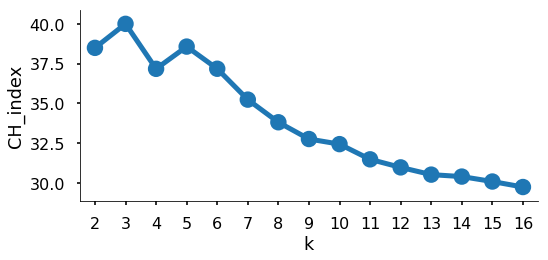

In [128]:
plt.close()
sns.factorplot(x='k', y = 'CH_index', data=cluster_solutions_1, aspect=2)
plt.show()

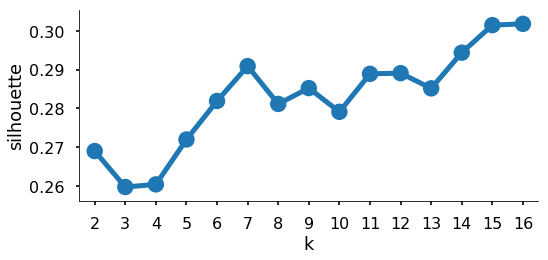

In [130]:
plt.close()
sns.factorplot(x='k', y = 'silhouette', data=cluster_solutions_1, aspect=2)
plt.show()

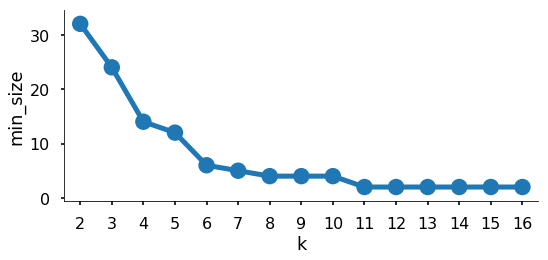

In [143]:
plt.close()
sns.factorplot(x='k', y = 'min_size', data=cluster_solutions_1, aspect=2)
plt.show()

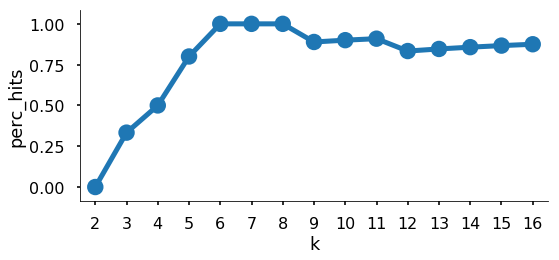

In [133]:
plt.close()
sns.factorplot(x='k', y = 'perc_hits', data=cluster_solutions_1, aspect=2)
plt.show()

In [141]:
k = 6 # based on silhouette and perc_hits
connectivity = kneighbors_graph(X, n_neighbors=2, include_self=False)
clusterer = AgglomerativeClustering(n_clusters=k, connectivity=connectivity)
cluster_labels = clusterer.fit_predict(X)
mtx = pandas.DataFrame(g.data2d, copy=True)
mtx.loc[:,'label'] = cluster_labels

/home/users/jvogel/anaconda2/envs/py3/lib/python3.6/site-packages/sklearn/cluster/hierarchical.py:193: UserWarning: the number of connected components of the connectivity matrix is 7 > 1. Completing it to avoid stopping the tree early.
  affinity='euclidean')


cluster 0
n =  24


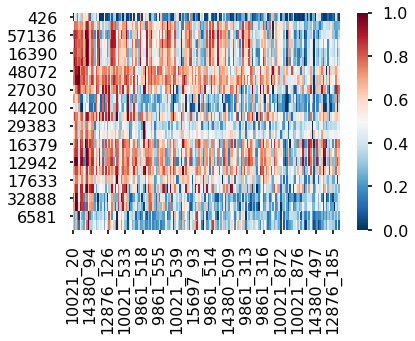

0 anterior genes, 24 posterior genes
CASR
RP11-291L15.2
A_24_P401842
A_32_P11262
HHIP
HHIP
A_24_P62668
SERTAD4
OSBPL3
BDKRB1
BDKRB1
WNT10A
FSTL4
FSTL4
GREM2
GAL
GAL
C1orf133
GRHL2
A_24_P102119
NPNT
NPNT
TTR
TTR



cluster 1
n =  20


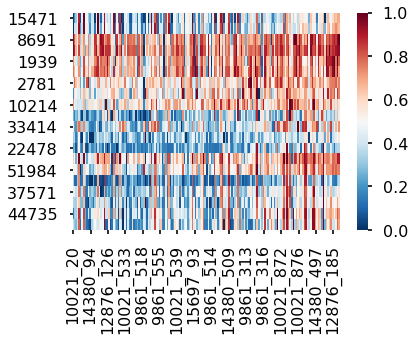

20 anterior genes, 0 posterior genes
GABRQ
A_32_P115840
GDA
GDA
GPR26
GPR26
KCNG1
C20orf103
GPR83
RSPO2
OPRK1
GPR88
RP13-102H20.1
C1QL1
A_23_P213527
RP11-45B20.3
CD36
MYB
AQP3
AQP3



cluster 2
n =  24


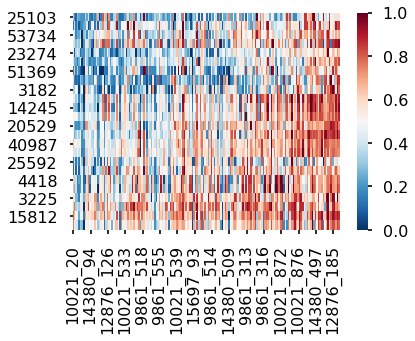

24 anterior genes, 0 posterior genes
VGLL3
SYTL1
C1orf187
SEMA3D
RSPH9
PYDC1
A_32_P136776
GPR39
LGALS2
SYTL2
SYTL2
SYTL2
LYPD1
NR2F2
NR2F2
NR2F2
NRG1
NRG1
SERPINF1
SERPINF1
LMO1
KIAA1772
LXN
LXN



cluster 3
n =  14


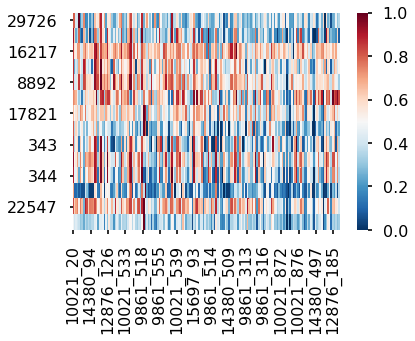

0 anterior genes, 14 posterior genes
KDELR3
RP11-561O23.6
RGMA
NTN1
NTN1
CTXN3
HPSE2
HPSE2
COL5A2
COL5A2
COL5A2
TPBG
FAM43B
PVALB



cluster 4
n =  12


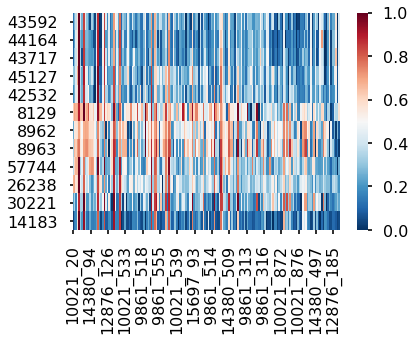

0 anterior genes, 12 posterior genes
DDC
DDC
DDC
DDC
DDC
DGKI
ONECUT2
ONECUT2
A_32_P121537
PDLIM5
TNNT2
BNC2



cluster 5
n =  6


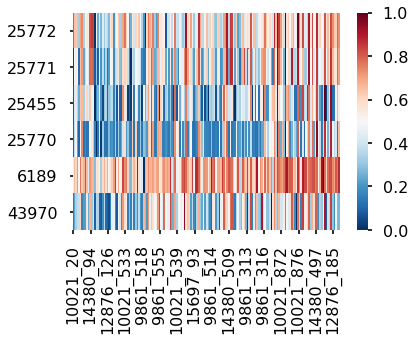

6 anterior genes, 0 posterior genes
KLK7
KLK7
TMEM215
KLK7
SSTR1
PIRT





In [142]:
for i in np.unique(mtx.label):
    plt.close()
    print('cluster',i)
    clus_data = mtx[mtx.label==i][mtx.columns[:-1]]
    print('n = ',len(clus_data))
    sns.heatmap(clus_data, cmap='RdBu_r')
    plt.show()
    ants = [x for x in clus_data.index if mod_genes.loc[x,'ant-post'] == 'anterior']
    posts = [x for x in clus_data.index if mod_genes.loc[x,'ant-post'] == 'posterior']
    print('%s anterior genes, %s posterior genes'%(len(ants),len(posts)))
    #print(probes.loc[clus_data.index]['gene_name'].values)
    for x in probes.loc[clus_data.index]['gene_symbol'].values:
        print(x)
    print('\n\n')

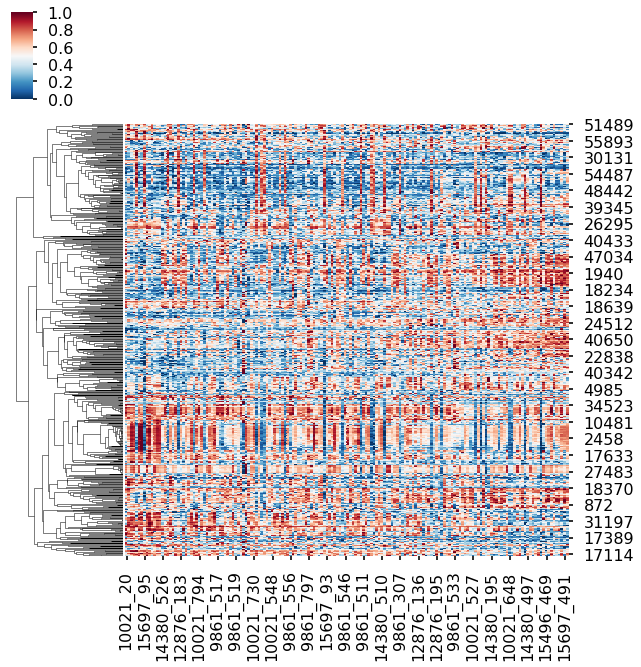

In [87]:
#jnk = xp.loc[imp_genes[:step2],
#             xp.columns[df.sort_values('position_along_hipp_AP_axis').index]
#            ]
#jnk = xp.loc[mod_genes[mod_genes.step==2]['probe_ind'],
#            xp.columns[df.sort_values('position_along_hipp_AP_axis').index]]
jnk = xp.loc[mod_genes[mod_genes.step<3]['probe_ind'],
            xp.columns[df.sort_values('position_along_hipp_AP_axis').index]]
plt.close()
g2 = sns.clustermap(jnk,
               col_cluster=False, metric='correlation', standard_scale=0,
               cmap='RdBu_r')
plt.show()

In [46]:
from sklearn.neighbors import kneighbors_graph
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics.cluster import silhouette_score

In [146]:
ks = range(2,60)
#X = g2.data2d.values
X = np.corrcoef(g2.data2d.values)
cluster_solutions = pandas.DataFrame(index = ks, columns = ['avg_ratio', 'n_hits','n_close', 
                                                              'silhouette', 'CH_index',
                                                             'mean_size','min_size','max_size'])
for k in ks:
    connectivity = kneighbors_graph(X, n_neighbors=2, include_self=False)
    clusterer = AgglomerativeClustering(n_clusters=k, connectivity=connectivity)
    cluster_labels = clusterer.fit_predict(X)
    # silhouette
    cluster_solutions.loc[k,'silhouette'] = silhouette_score(X, cluster_labels)
    # CH Index
    cluster_solutions.loc[k,'CH_index'] = calinski_harabaz_score(X, cluster_labels)
    mtx = pandas.DataFrame(g2.data2d, copy=True)
    mtx.loc[:,'label'] = cluster_labels
    rats = []
    hits = 0
    close = 0
    sizes = []
    for i in np.unique(mtx.label):
        clus_data = mtx[mtx.label==i][mtx.columns[:-1]]
        sizes.append(len(clus_data))
        # RATIO OF ANTERIOR/POSTERIOR GENES
        ants = len([x for x in clus_data.index if mod_genes.loc[x,'ant-post'] == 'anterior'])
        posts = len([x for x in clus_data.index if mod_genes.loc[x,'ant-post'] == 'posterior'])
        if ants > posts:
            rat = (100/(ants+posts)) * ants
        else:
            rat = (100/(ants+posts)) * posts
        rats.append(rat)
        if rat == 100:
            hits += 1
        if rat > 90:
            close += 1
    cluster_solutions.loc[k,'avg_ratio'] = np.mean(rats)
    cluster_solutions.loc[k,'n_hits'] = hits
    cluster_solutions.loc[k,'n_close'] = close
    # SIZES
    cluster_solutions.loc[k,'mean_size'] = np.mean(sizes)
    cluster_solutions.loc[k,'min_size'] = np.min(sizes)
    cluster_solutions.loc[k,'max_size'] = np.max(sizes)
    print('finished',k)

/home/users/jvogel/anaconda2/envs/py3/lib/python3.6/site-packages/sklearn/cluster/hierarchical.py:193: UserWarning: the number of connected components of the connectivity matrix is 17 > 1. Completing it to avoid stopping the tree early.
  affinity='euclidean')


finished 2
finished 3
finished 4
finished 5
finished 6
finished 7
finished 8
finished 9
finished 10
finished 11
finished 12
finished 13
finished 14
finished 15
finished 16
finished 17
finished 18
finished 19
finished 20
finished 21
finished 22
finished 23
finished 24
finished 25
finished 26
finished 27
finished 28
finished 29
finished 30
finished 31
finished 32
finished 33
finished 34
finished 35
finished 36
finished 37
finished 38
finished 39
finished 40
finished 41
finished 42
finished 43
finished 44
finished 45
finished 46
finished 47
finished 48
finished 49
finished 50
finished 51
finished 52
finished 53
finished 54
finished 55
finished 56
finished 57
finished 58
finished 59


In [147]:
cluster_solutions.loc[:,'perc_hits'] = cluster_solutions.n_hits.values / cluster_solutions.index.values
cluster_solutions.loc[:,'perc_close'] = cluster_solutions.n_close.values / cluster_solutions.index.values
cluster_solutions.loc[:,'k'] = cluster_solutions.index
cluster_solutions.head()

,avg_ratio,n_hits,n_close,silhouette,CH_index,mean_size,min_size,max_size,perc_hits,perc_close,k
2,60.7978,0,0,0.310415,320.227,300.5,185,416,0,0,2
3,70.0056,0,0,0.249202,281.748,200.333,185,225,0,0,3
4,67.354,0,0,0.202177,236.365,150.25,88,191,0,0,4
5,64.8291,0,0,0.174104,208.171,120.2,37,191,0,0,5
6,67.9157,0,0,0.175289,190.194,100.167,37,148,0,0,6


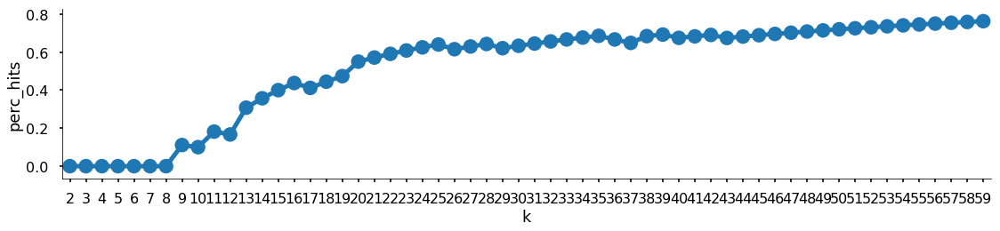

In [152]:
plt.close()
sns.factorplot(x='k', y = 'perc_hits', data=cluster_solutions, aspect=4)
plt.show()

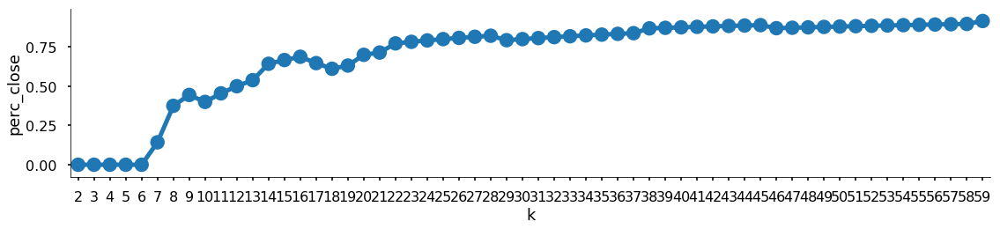

In [154]:
plt.close()
sns.factorplot(x='k', y = 'perc_close', data=cluster_solutions, aspect=4)
plt.show()

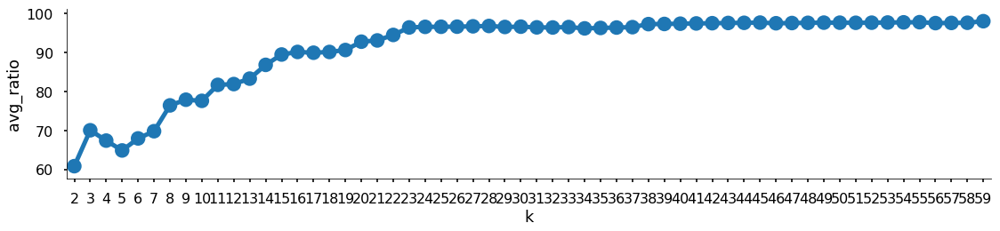

In [155]:
plt.close()
sns.factorplot(x='k', y = 'avg_ratio', data=cluster_solutions, aspect=4)
plt.show()

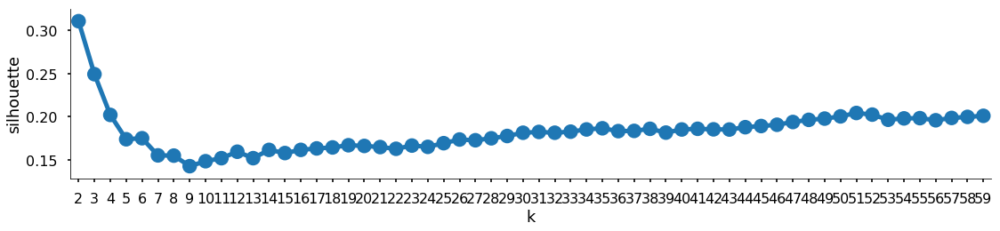

In [156]:
plt.close()
sns.factorplot(x='k', y = 'silhouette', data=cluster_solutions, aspect=4)
plt.show()

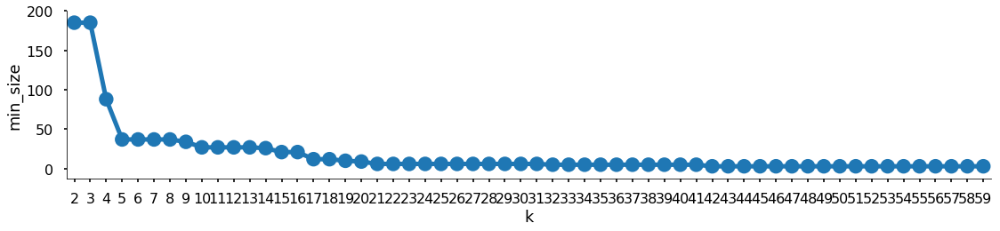

In [160]:
plt.close()
sns.factorplot(x='k', y = 'min_size', data=cluster_solutions, aspect=4)
plt.show()

/home/users/jvogel/anaconda2/envs/py3/lib/python3.6/site-packages/sklearn/cluster/hierarchical.py:193: UserWarning: the number of connected components of the connectivity matrix is 4 > 1. Completing it to avoid stopping the tree early.
  affinity='euclidean')


cluster 0
n =  35


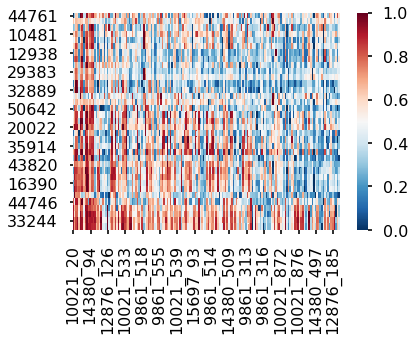

0 anterior genes, 35 posterior genes
AIRE
RDH10
CCDC68
RCAN3
A_32_P71744
RCAN3
GAL
GAL
AIRE
FSTL4
FSTL4
NPNT
NPNT
A_24_P759647
SERTAD4
A_32_P377880
A_24_P102119
RERG
RERG
SIX3
A_24_P85391
VASH2
HTR7
ENO3
RP11-291L15.2
A_24_P401842
A_32_P11262
HHIP
HHIP
TUBA1C
LINC00552
CHN2
CHN2
CHN2
CHN2



cluster 1
n =  23


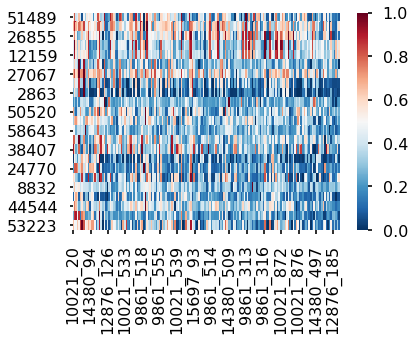

3 anterior genes, 20 posterior genes
A_32_P405010
A_32_P405010
GHSR
PCOLCE2
PCOLCE2
A_24_P535256
KCNK2
KLK1
KLK1
NPAS4
A_24_P12660
A_24_P365129
A_24_P710171
KDELR3
RP11-561O23.6
CASR
P2RY8
SPATA19
DOPEY2
A_32_P64286
ADORA2A
A_32_P50187
A_24_P365349



cluster 2
n =  44


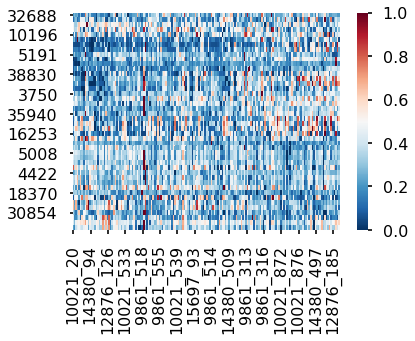

22 anterior genes, 22 posterior genes
APLNR
BHMT
GABRA4
RBPMS2
FAM12A
PTGES
LINC00238
LINC00238
RAD51
CXCR4
A_23_P4341
CPXM2
IRX2
GLI1
A_23_P140654
CRNDE
NDP
ARSJ
PDE5A
PLAC2
PLAC2
KLK7
TMEM215
PAGE4
DMRT3
IL1R1
E2F1
WNT10A
PVALB
PVALB
A_32_P170997
HPSE2
PENK
PENK
PENK
CDH15
BAIAP2L2
VASH2
TTR
TTR
SV2C
OSBPL3
KCNH5
A_32_P168561



cluster 3
n =  43


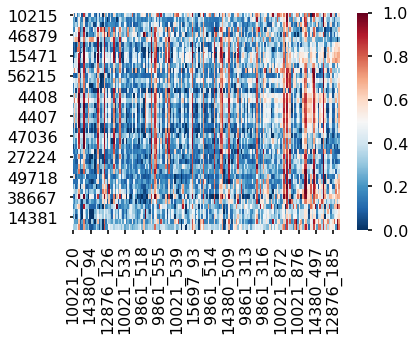

37 anterior genes, 6 posterior genes
GPR83
RP13-102H20.1
DNAH12
A_32_P99399
GABRD
A_32_P121537
GABRQ
GABRQ
GABRQ
A_32_P115840
LYPD6B
PTGFR
A_24_P925505
CD36
CD36
POSTN
PDYN
PDYN
PDYN
PDYN
PDYN
PDYN
PDYN
PDYN
CHRNA1
TNNT2
TNNT2
SGCG
RP11-45B20.3
C1QTNF9
FAT4
A_32_P159126
A_23_P104484
ANKRD62
RSPO2
RSPO2
LY86-AS1
RSPO2
CLDN20
GPR88
GPR88
TDO2
TDO2



cluster 4
n =  36


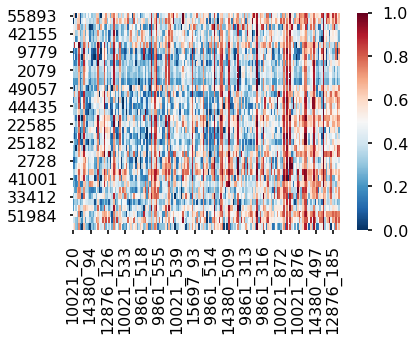

36 anterior genes, 0 posterior genes
A_24_P17052
A_24_P17052
A_24_P92823
SMAD9
SMAD9
COL21A1
SEMA3C
SEMA3C
TRHR
GRP
GRP
GRP
A_32_P89152
CNGA3
AQP3
AQP3
MYB
PTER
C1QL2
DNAJC5G
TRIM54
LOC392145
C1QL1
FOSB
JUN
JUN
CA10
CA10
INSM1
OPRK1
OPRK1
DNAH12
A_32_P163891
A_23_P213527
C20orf46
ARHGAP6



cluster 5
n =  28


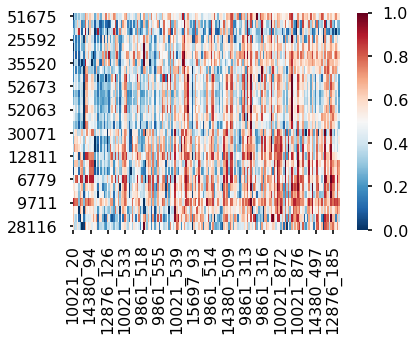

27 anterior genes, 1 posterior genes
A_24_P331711
PIRT
ELN
NRG1
NRG1
NRG1
NRG1
A_24_P50934
A_32_P118657
A_32_P118657
A_32_P118657
A_32_P118657
A_32_P93493
IFI16
WDFY4
DAPL1
LIX1
LIX1
CPAMD8
KLK7
KLK7
TG
PTPRG
PTPRG
PLXNC1
PLXNC1
SRPX2
TP53I3



cluster 6
n =  26


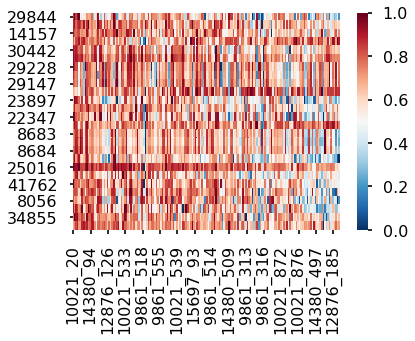

3 anterior genes, 23 posterior genes
KCTD16
DGKI
DIRAS2
RFTN1
NUDT1
NUDT1
GRIK1
GRIK1
GRIK1
DCBLD1
EML3
A_32_P17525
CPNE8
RARRES1
CARTPT
CARTPT
CARTPT
SEC14L1
C17orf76
PTX3
WIPF3
GEFT
STC2
GVINP1
LOC642373
CNTNAP3



cluster 7
n =  56


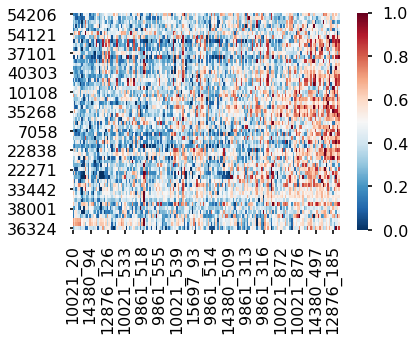

53 anterior genes, 3 posterior genes
A_32_P210232
A_32_P30004
MLPH
LRCOL1
ATP11C
A_32_P175042
CLEC4G
PTGER3
A_24_P673968
CRLF1
FRMPD2
TMEM132D
VGLL3
COCH
NRG1
NRG1
PYDC1
SYTL1
SYTL1
KIF25
IQGAP2
IQGAP2
RSPH9
RSPH9
LOC100129291
CADM1
CADM1
GALR2
DIO3
KLK5
TNFRSF4
GPR39
HES5
SCARA5
CHRNA3
PRSS23
NTSR2
LGALS2
A_24_P617427
NRG1
C5orf38
A_32_P136776
A_23_P140654
EGFEM1P
CDH13
FLJ38379
AC106818.2
AC106818.2
AC106818.2
HRASLS5
AC013271.3
RGS22
SLC39A2
CRH
CRH
AC002563.2



cluster 8
n =  24


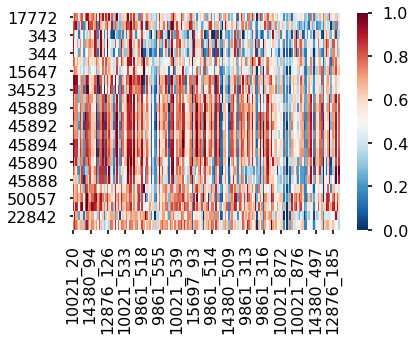

0 anterior genes, 24 posterior genes
WNT10A
A_32_P217543
COL5A2
COL5A2
COL5A2
A_32_P129406
CYP26B1
GNG4
GNG4
GRIK1
GRIK1
GRIK1
GRIK1
GRIK1
GRIK1
GRIK1
GRIK1
GRIK1
GRIK1
FAM43B
A_24_P930963
THBD
DACT2
ROM1



cluster 9
n =  17


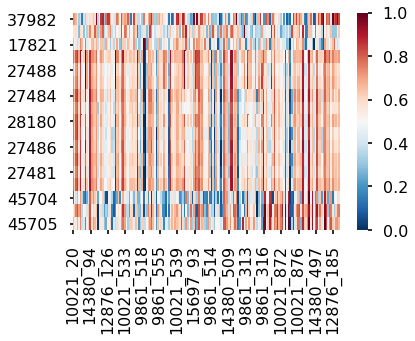

3 anterior genes, 14 posterior genes
CTXN3
CUST_166_PI417507815
HPSE2
TAC1
TAC1
TAC1
TAC1
TAC1
TAC1
TAC1
TAC1
TAC1
TAC1
TAC1
HTR3A
HTR3A
HTR3A



cluster 10
n =  21


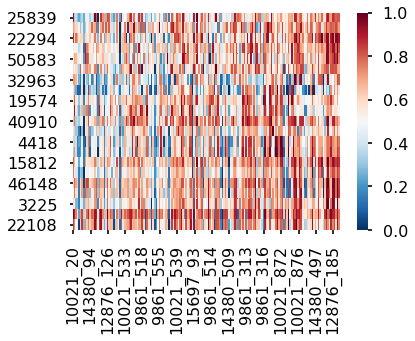

21 anterior genes, 0 posterior genes
MYO16
PIK3CD
SLC2A12
MALL
A_32_P218707
WNT4
ADAMTSL1
GALR1
MEGF11
LAYN
KIAA1772
KIAA1772
SERPINF1
SERPINF1
LXN
LXN
FAM150B
FAM150B
LMO1
A_24_P931017
CCBE1



cluster 11
n =  11


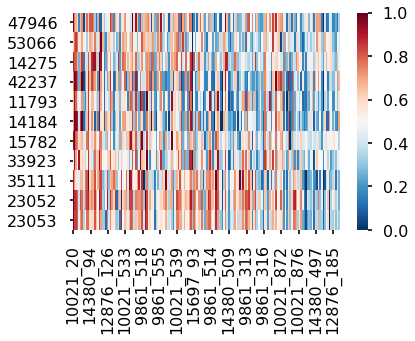

0 anterior genes, 11 posterior genes
A_23_P10488
GRIA3
EPS8L1
DCHS2
SOSTDC1
DCHS2
PNO1
FILIP1L
WIPF3
DGKH
DGKH



cluster 12
n =  28


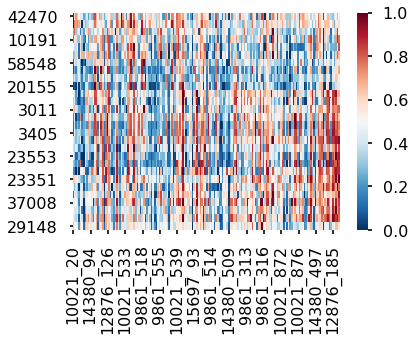

17 anterior genes, 11 posterior genes
RP11-122A3.2
NECAB1
A_32_P38745
NMU
GRIK1
GRIK1
A_32_P497742
PTTG3
PCP4L1
GLYATL1
CHRM5
CHRM5
IGFBP6
MET
MET
MET
SEMA3D
ETV1
SEMA3D
A_32_P133980
A_32_P346000
NUDT10
ASCL2
DCBLD1
VRK2
S100A10
TRPV2
GRIK1



cluster 13
n =  27


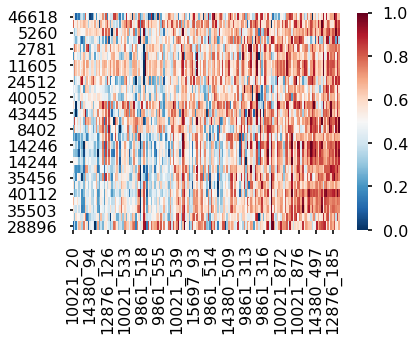

27 anterior genes, 0 posterior genes
P2RX7
ODZ2
PRPH2
PTGES
KCNG1
C20orf103
C20orf103
C20orf103
OVCH1
OBFC2A
OBFC2A
ATOH7
AL589765.4
BAIAP3
BAIAP3
KCNK12
SYTL2
SYTL2
SYTL2
LYPD1
FAM148C
A_32_P136776
NR2F2
NR2F2
NR2F2
TGFBR3
KCNN3



cluster 14
n =  23


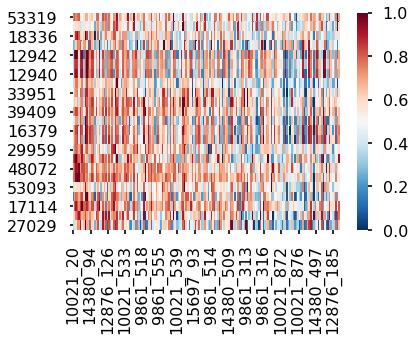

0 anterior genes, 23 posterior genes
KIAA1456
KIAA1456
SEMA6D
UNC13C
GAL
GAL
GAL
GRHL2
NCALD
HR
C1orf133
GREM2
GREM2
GREM2
PDLIM7
LOC643827
A_24_P62668
SERTAD4
A_32_P104448
EFHD2
EFHD2
OSBPL3
OSBPL3



cluster 15
n =  9


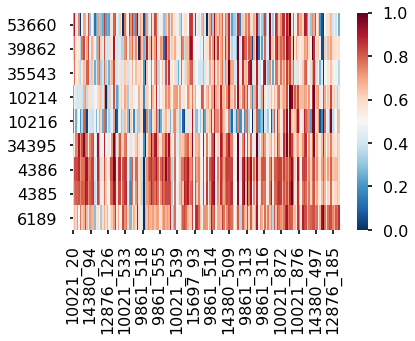

9 anterior genes, 0 posterior genes
A_32_P171185
DGKG
DGKG
GPR83
GPR83
BDNF
NPTX1
NPTX1
SSTR1



cluster 16
n =  16


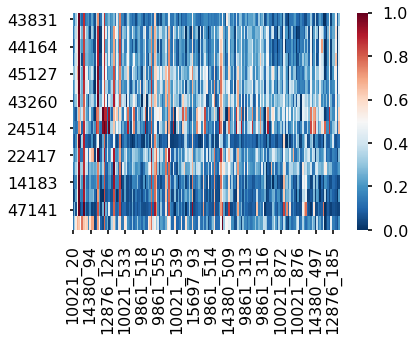

0 anterior genes, 16 posterior genes
DDC
DDC
DDC
DDC
DDC
DDC
DDC
SYT10
SYT10
BNC2
C8orf84
MGC24103
BNC2
BNC2
TNNT2
PDCD6



cluster 17
n =  16


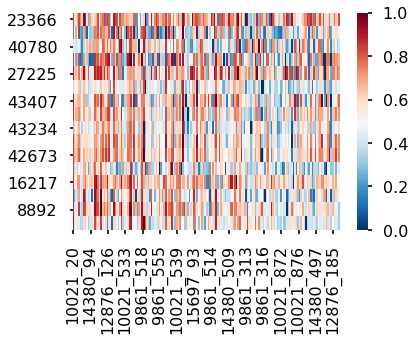

0 anterior genes, 16 posterior genes
ADAMTS19
STK3
GABRA1
A_32_P203232
BCL11B
CAMKK2
GABRA1
GABRB2
GABRA1
GABRA1
GABRA1
KREMEN1
RGMA
NTN1
NTN1
NEXN



cluster 18
n =  19


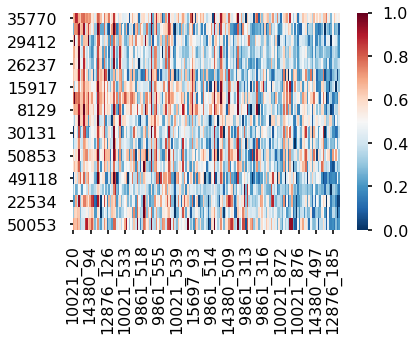

0 anterior genes, 19 posterior genes
AC073135.1
A_32_P129265
PMEPA1
PDLIM5
PDLIM5
A_24_P307599
PCDHB8
PCDHGA1
DGKI
HDC
USP2
A_32_P51005
A_24_P722248
A_32_P100771
A_24_P42564
PMEPA1
IL28RA
TBC1D16
A_24_P376139



cluster 19
n =  17


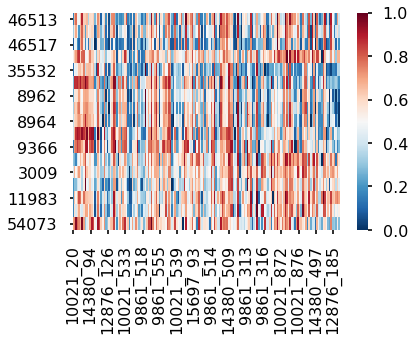

9 anterior genes, 8 posterior genes
SLC18A2
SLC18A2
SLC18A2
GABRA2
ONECUT3
TRPM3
ONECUT2
ONECUT2
ONECUT2
PDCD6
ARHGEF17
IGFBP5
IGFBP5
IGFBP5
TMEFF2
TMEFF2
A_32_P104023



cluster 20
n =  13


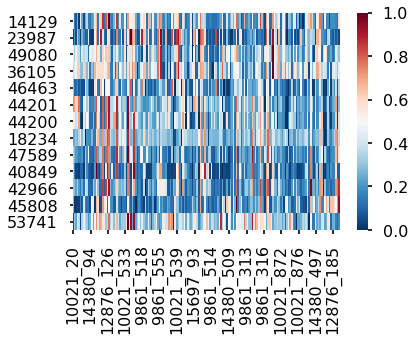

1 anterior genes, 12 posterior genes
FEV
RUFY4
A_32_P93115
RSHL1
TPBG
BDKRB1
BDKRB1
EPPK1
A_24_P247576
LPO
KIAA0748
TH
A_32_P137382



cluster 21
n =  12


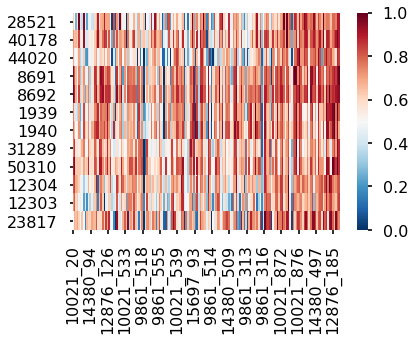

12 anterior genes, 0 posterior genes
C1QL1
HRH1
LOC100129291
GDA
GDA
GPR26
GPR26
HTR1A
A_32_P143778
MOXD1
MOXD1
ATOH7



cluster 22
n =  20


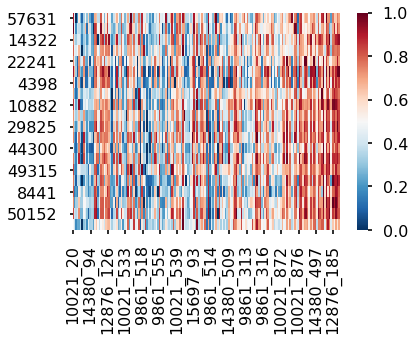

20 anterior genes, 0 posterior genes
MARCH1
MARCH1
FXYD6
AC007601.1
C4orf45
AC078937.4
SLC26A4
SORCS3
SORCS3
RASL10A
RASL10A
ATP2B4
ATP2B4
ATP2B4
A_23_P169319
TOX3
SLIT2
SLIT2
A_32_P106615
C1orf187



cluster 23
n =  8


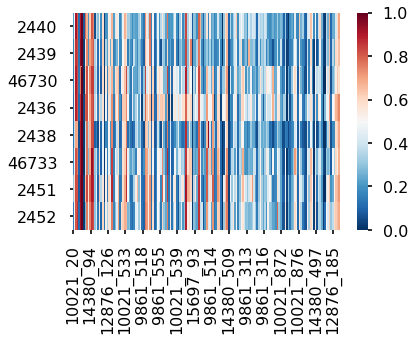

0 anterior genes, 8 posterior genes
HTR2C
HTR2C
HTR2C
HTR2C
HTR2C
HTR2C
HTR2C
HTR2C



cluster 24
n =  29


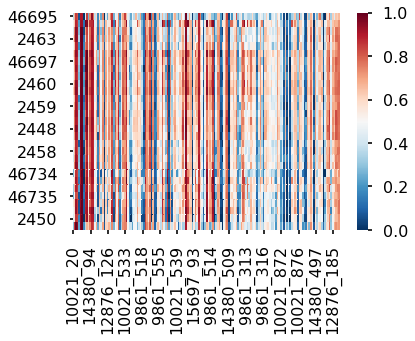

0 anterior genes, 29 posterior genes
HTR2C
HTR2C
HTR2C
HTR2C
HTR2C
HTR2C
HTR2C
HTR2C
HTR2C
HTR2C
HTR2C
HTR2C
HTR2C
HTR2C
HTR2C
HTR2C
HTR2C
HTR2C
HTR2C
HTR2C
HTR2C
HTR2C
HTR2C
HTR2C
HTR2C
HTR2C
HTR2C
HTR2C
HTR2C





In [162]:
#from sklearn.neighbors import kneighbors_graph

X = g2.data2d.values
n_clusters=25 # based on perc_hits mostly
for_gsea = pandas.DataFrame(index=range(60), columns=range(n_clusters))
connectivity = kneighbors_graph(X, n_neighbors=2, include_self=False)
clusterer = AgglomerativeClustering(n_clusters=n_clusters, connectivity=connectivity)
#clusterer = KMeans(n_clusters=n_clusters, random_state=10)
cluster_labels = clusterer.fit_predict(X)
mtx = pandas.DataFrame(g2.data2d, copy=True)
mtx.loc[:,'label'] = cluster_labels

for i in np.unique(mtx.label):
    plt.close()
    print('cluster',i)
    clus_data = mtx[mtx.label==i][mtx.columns[:-1]]
    print('n = ',len(clus_data))
    sns.heatmap(clus_data, cmap='RdBu_r')
    plt.show()
    ants = [x for x in clus_data.index if mod_genes.loc[x,'ant-post'] == 'anterior']
    posts = [x for x in clus_data.index if mod_genes.loc[x,'ant-post'] == 'posterior']
    print('%s anterior genes, %s posterior genes'%(len(ants),len(posts)))
    symbols = probes.loc[clus_data.index]['gene_symbol'].values
    for_gsea.loc[np.arange(len(symbols)),i] = symbols
    #print(probes.loc[clus_data.index]['gene_name'].values)
    for x in probes.loc[clus_data.index]['gene_symbol'].values:
        print(x)
    #print(np.array([int(x) if pandas.notnull(x) else np.nan for x in probes.loc[clus_data.index]['entrez_id'].values]))
    print('\n\n')

In [129]:
for_gsea.to_csv('/Users/jakevogel/Science/AHBA/mod_decomp_gsea.csv')

Int64Index([37982, 47238, 17772, 52806,   343,   345,   344, 56148, 15647,
            42992, 34523, 45891, 45889, 45895, 45892, 45896, 45894, 45893,
            45890, 45887, 45888, 22547, 50057,  6802, 22842,  5358, 17821,
            27487, 27488, 27489, 27484, 27480, 28180, 27485, 27486, 27483,
            27481, 27482, 45704, 45706, 45705],
           dtype='int64')

In [170]:
phdf[phdf.structure_acronym=='S']['cluster_expression']

9      1.199205
14    -2.515695
23     1.531724
29     1.363895
38     1.222968
42     1.081253
52    -0.081035
55     1.120184
57     0.622062
69     1.146238
73     0.902349
76     0.715964
78     1.920864
80     2.017784
83     1.776405
94     1.452702
101    1.021904
104    1.287232
108    1.258215
112    0.462832
115   -0.024969
123    1.470260
129    0.306226
135    0.052478
141    0.336420
146    0.257774
152    0.078434
157    0.518242
163    1.440570
166    0.907158
Name: cluster_expression, dtype: float64

In [171]:
stats.f_oneway(phdf[phdf.structure_acronym=='CA1']['cluster_expression'],
              phdf[phdf.structure_acronym=='CA2']['cluster_expression'],
              phdf[phdf.structure_acronym=='CA3']['cluster_expression'],
              phdf[phdf.structure_acronym=='CA4']['cluster_expression'],
              phdf[phdf.structure_acronym=='S']['cluster_expression'],
              phdf[phdf.structure_acronym=='DG']['cluster_expression'],)

F_onewayResult(statistic=49.232238172825326, pvalue=6.087965661982586e-31)

In [175]:
#from statsmodels.stats.multicomp import pairwise_tukeyhsd
print(pairwise_tukeyhsd(phdf.cluster_expression, phdf.structure_acronym))

Multiple Comparison of Means - Tukey HSD,FWER=0.05
group1 group2 meandiff  lower   upper  reject
---------------------------------------------
 CA1    CA2   -0.8246  -1.4198 -0.2295  True 
 CA1    CA3   -0.4006  -0.9776  0.1764 False 
 CA1    CA4    0.9612   0.3786  1.5439  True 
 CA1     DG   -2.1761  -2.7531 -1.5992  True 
 CA1     S    -0.4555  -1.0222  0.1111 False 
 CA2    CA3    0.424   -0.1895  1.0375 False 
 CA2    CA4    1.7859   1.167   2.4047  True 
 CA2     DG   -1.3515   -1.965  -0.738  True 
 CA2     S     0.3691  -0.2347  0.9729 False 
 CA3    CA4    1.3619   0.7605  1.9633  True 
 CA3     DG   -1.7755  -2.3714 -1.1796  True 
 CA3     S    -0.0549  -0.6408  0.531  False 
 CA4     DG   -3.1374  -3.7388  -2.536  True 
 CA4     S    -1.4168  -2.0083 -0.8253  True 
  DG     S     1.7206   1.1347  2.3065  True 
---------------------------------------------


=================CLUSTER 0================
TOTAL R2 =  0.240338398545


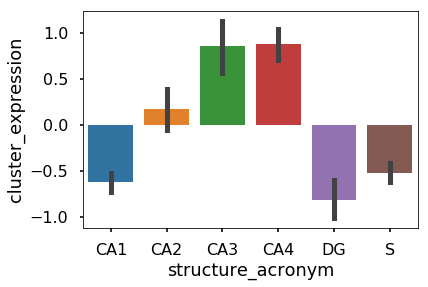

F_onewayResult(statistic=57.760609012342933, pvalue=2.0001049640791645e-34)
Multiple Comparison of Means - Tukey HSD,FWER=0.05
group1 group2 meandiff  lower   upper  reject
---------------------------------------------
 CA1    CA2    0.7934   0.3852  1.2015  True 
 CA1    CA3    1.4796   1.0839  1.8752  True 
 CA1    CA4    1.5058   1.1062  1.9054  True 
 CA1     DG   -0.1915  -0.5871  0.2042 False 
 CA1     S     0.1026   -0.286  0.4912 False 
 CA2    CA3    0.6862   0.2655  1.1069  True 
 CA2    CA4    0.7125   0.2881  1.1368  True 
 CA2     DG   -0.9848  -1.4055 -0.5641  True 
 CA2     S    -0.6907  -1.1048 -0.2767  True 
 CA3    CA4    0.0262  -0.3862  0.4387 False 
 CA3     DG    -1.671  -2.0797 -1.2624  True 
 CA3     S    -1.3769  -1.7787 -0.9752  True 
 CA4     DG   -1.6973  -2.1097 -1.2848  True 
 CA4     S    -1.4032  -1.8088 -0.9976  True 
  DG     S     0.2941  -0.1077  0.6959 False 
---------------------------------------------
>>>>CA1<<<<
0.26194036525
>>>>CA2<<<<
0.56738

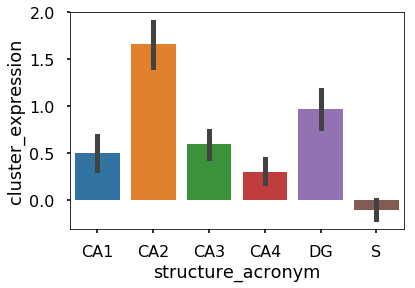

F_onewayResult(statistic=43.340666321217277, pvalue=2.5401976236974936e-28)
Multiple Comparison of Means - Tukey HSD,FWER=0.05
group1 group2 meandiff  lower   upper  reject
---------------------------------------------
 CA1    CA2    1.1578   0.7899  1.5257  True 
 CA1    CA3    0.0912  -0.2654  0.4479 False 
 CA1    CA4   -0.2035  -0.5637  0.1567 False 
 CA1     DG    0.4687   0.112   0.8254  True 
 CA1     S    -0.6074  -0.9577 -0.2571  True 
 CA2    CA3   -1.0666  -1.4458 -0.6873  True 
 CA2    CA4   -1.3613  -1.7439 -0.9787  True 
 CA2     DG   -0.6891  -1.0684 -0.3098  True 
 CA2     S    -1.7652  -2.1385  -1.392  True 
 CA3    CA4   -0.2948  -0.6666  0.077  False 
 CA3     DG    0.3774   0.009   0.7458  True 
 CA3     S    -0.6987  -1.0609 -0.3365  True 
 CA4     DG    0.6722   0.3004  1.044   True 
 CA4     S    -0.4039  -0.7696 -0.0383  True 
  DG     S    -1.0761  -1.4383 -0.7139  True 
---------------------------------------------
>>>>CA1<<<<
0.564869829855
>>>>CA2<<<<
0.1483

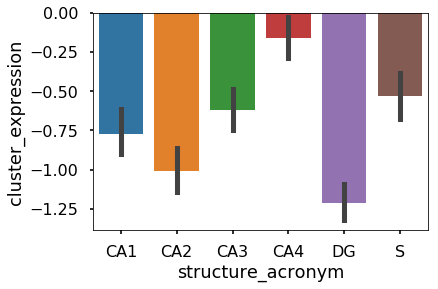

F_onewayResult(statistic=26.27380095521681, pvalue=1.9326776173971582e-19)
Multiple Comparison of Means - Tukey HSD,FWER=0.05
group1 group2 meandiff  lower   upper  reject
---------------------------------------------
 CA1    CA2    -0.238  -0.5281  0.0521 False 
 CA1    CA3    0.1471  -0.1341  0.4284 False 
 CA1    CA4    0.6099   0.326   0.8939  True 
 CA1     DG    -0.44   -0.7212 -0.1588  True 
 CA1     S     0.2376  -0.0386  0.5137 False 
 CA2    CA3    0.3852   0.0861  0.6842  True 
 CA2    CA4    0.8479   0.5463  1.1495  True 
 CA2     DG    -0.202   -0.501  0.097  False 
 CA2     S     0.4756   0.1813  0.7698  True 
 CA3    CA4    0.4628   0.1697  0.7559  True 
 CA3     DG   -0.5871  -0.8776 -0.2967  True 
 CA3     S     0.0904  -0.1951  0.376  False 
 CA4     DG   -1.0499   -1.343 -0.7568  True 
 CA4     S    -0.3724  -0.6606 -0.0841  True 
  DG     S     0.6775   0.392   0.9631  True 
---------------------------------------------
>>>>CA1<<<<
0.102651740129
>>>>CA2<<<<
0.01615

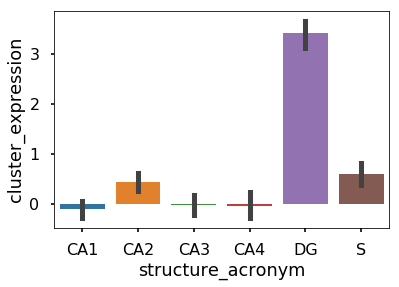

F_onewayResult(statistic=142.34846955598078, pvalue=9.2469159156326436e-58)
Multiple Comparison of Means - Tukey HSD,FWER=0.05
group1 group2 meandiff  lower   upper  reject
---------------------------------------------
 CA1    CA2    0.5591   0.0937  1.0245  True 
 CA1    CA3    0.0908  -0.3604  0.5419 False 
 CA1    CA4    0.0726   -0.383  0.5282 False 
 CA1     DG    3.536    3.0848  3.9872  True 
 CA1     S     0.7012   0.2582  1.1443  True 
 CA2    CA3   -0.4683   -0.948  0.0114 False 
 CA2    CA4   -0.4865  -0.9704 -0.0026  True 
 CA2     DG    2.9769   2.4972  3.4566  True 
 CA2     S     0.1421   -0.33   0.6142 False 
 CA3    CA4   -0.0182  -0.4885  0.452  False 
 CA3     DG    3.4452   2.9793  3.9112  True 
 CA3     S     0.6104   0.1523  1.0686  True 
 CA4     DG    3.4634   2.9932  3.9337  True 
 CA4     S     0.6286   0.1662  1.0911  True 
  DG     S    -2.8348  -3.2929 -2.3767  True 
---------------------------------------------
>>>>CA1<<<<
0.404033324184
>>>>CA2<<<<
0.0680

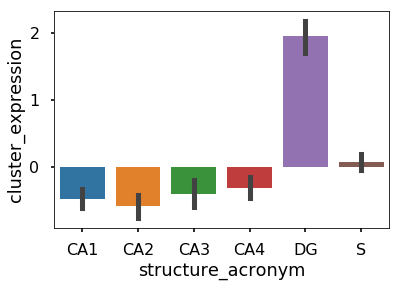

F_onewayResult(statistic=106.76774747163333, pvalue=1.0330139353597976e-49)
Multiple Comparison of Means - Tukey HSD,FWER=0.05
group1 group2 meandiff  lower   upper  reject
---------------------------------------------
 CA1    CA2   -0.1171  -0.4989  0.2646 False 
 CA1    CA3     0.07   -0.3001  0.4401 False 
 CA1    CA4    0.1542  -0.2196  0.5279 False 
 CA1     DG    2.4398   2.0697  2.8099  True 
 CA1     S     0.5489   0.1854  0.9124  True 
 CA2    CA3    0.1871  -0.2064  0.5806 False 
 CA2    CA4    0.2713  -0.1256  0.6683 False 
 CA2     DG    2.557    2.1634  2.9505  True 
 CA2     S     0.666    0.2787  1.0533  True 
 CA3    CA4    0.0842  -0.3016   0.47  False 
 CA3     DG    2.3699   1.9876  2.7521  True 
 CA3     S     0.4789   0.1031  0.8547  True 
 CA4     DG    2.2857   1.8999  2.6714  True 
 CA4     S     0.3947   0.0153  0.7741  True 
  DG     S    -1.8909  -2.2667 -1.5151  True 
---------------------------------------------
>>>>CA1<<<<
0.649685831214
>>>>CA2<<<<
0.4505

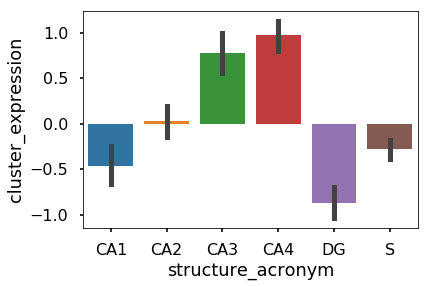

F_onewayResult(statistic=59.647091934493211, pvalue=3.751425046486518e-35)
Multiple Comparison of Means - Tukey HSD,FWER=0.05
group1 group2 meandiff  lower   upper  reject
---------------------------------------------
 CA1    CA2    0.4936   0.1113  0.8758  True 
 CA1    CA3    1.2451   0.8745  1.6157  True 
 CA1    CA4    1.4443   1.0701  1.8185  True 
 CA1     DG   -0.4062  -0.7767 -0.0356  True 
 CA1     S     0.1802  -0.1838  0.5441 False 
 CA2    CA3    0.7515   0.3575  1.1456  True 
 CA2    CA4    0.9507   0.5533  1.3482  True 
 CA2     DG   -0.8997  -1.2938 -0.5057  True 
 CA2     S    -0.3134  -0.7012  0.0744 False 
 CA3    CA4    0.1992   -0.187  0.5855 False 
 CA3     DG   -1.6512   -2.034 -1.2685  True 
 CA3     S    -1.0649  -1.4412 -0.6886  True 
 CA4     DG   -1.8505  -2.2367 -1.4642  True 
 CA4     S    -1.2641   -1.644 -0.8842  True 
  DG     S     0.5863    0.21   0.9626  True 
---------------------------------------------
>>>>CA1<<<<
0.713337049747
>>>>CA2<<<<
0.43037

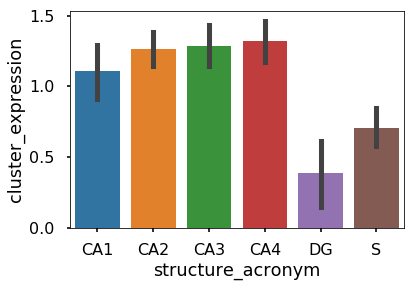

F_onewayResult(statistic=18.945610404412605, pvalue=7.5845410533476612e-15)
Multiple Comparison of Means - Tukey HSD,FWER=0.05
group1 group2 meandiff  lower   upper  reject
---------------------------------------------
 CA1    CA2    0.1609   -0.195  0.5168 False 
 CA1    CA3    0.1821   -0.163  0.5271 False 
 CA1    CA4    0.2147  -0.1338  0.5631 False 
 CA1     DG   -0.7182  -1.0632 -0.3732  True 
 CA1     S     -0.396  -0.7348 -0.0571  True 
 CA2    CA3    0.0212  -0.3457  0.3881 False 
 CA2    CA4    0.0538  -0.3163  0.4239 False 
 CA2     DG   -0.8791   -1.246 -0.5122  True 
 CA2     S    -0.5569  -0.9179 -0.1958  True 
 CA3    CA4    0.0326   -0.327  0.3922 False 
 CA3     DG   -0.9003  -1.2566 -0.5439  True 
 CA3     S     -0.578  -0.9284 -0.2277  True 
 CA4     DG   -0.9329  -1.2925 -0.5732  True 
 CA4     S    -0.6106  -0.9643 -0.2569  True 
  DG     S     0.3222  -0.0281  0.6726 False 
---------------------------------------------
>>>>CA1<<<<
0.241960709809
>>>>CA2<<<<
0.1609

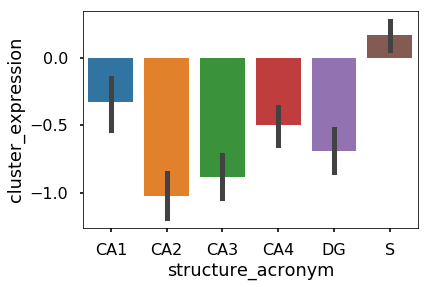

F_onewayResult(statistic=26.139542734916294, pvalue=2.3194379410127051e-19)
Multiple Comparison of Means - Tukey HSD,FWER=0.05
group1 group2 meandiff  lower   upper  reject
---------------------------------------------
 CA1    CA2   -0.6952  -1.0405  -0.35   True 
 CA1    CA3   -0.5551  -0.8898 -0.2204  True 
 CA1    CA4   -0.1688  -0.5068  0.1692 False 
 CA1     DG   -0.3619  -0.6966 -0.0272  True 
 CA1     S     0.4976   0.1689  0.8263  True 
 CA2    CA3    0.1401  -0.2158  0.496  False 
 CA2    CA4    0.5264   0.1674  0.8854  True 
 CA2     DG    0.3333  -0.0226  0.6892 False 
 CA2     S     1.1928   0.8426  1.5431  True 
 CA3    CA4    0.3863   0.0375  0.7352  True 
 CA3     DG    0.1933  -0.1524  0.5389 False 
 CA3     S     1.0528   0.7129  1.3926  True 
 CA4     DG   -0.1931  -0.5419  0.1558 False 
 CA4     S     0.6664   0.3233  1.0095  True 
  DG     S     0.8595   0.5196  1.1994  True 
---------------------------------------------
>>>>CA1<<<<
0.683245675108
>>>>CA2<<<<
0.2774

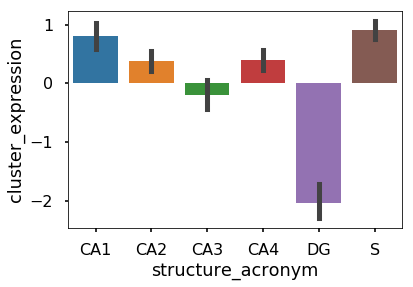

F_onewayResult(statistic=94.922091235913811, pvalue=1.4260601794974924e-46)
Multiple Comparison of Means - Tukey HSD,FWER=0.05
group1 group2 meandiff  lower   upper  reject
---------------------------------------------
 CA1    CA2   -0.4314  -0.8937  0.0309 False 
 CA1    CA3   -1.0079   -1.456 -0.5597  True 
 CA1    CA4   -0.4087  -0.8613  0.0438 False 
 CA1     DG   -2.8552  -3.3033  -2.407  True 
 CA1     S     0.0976  -0.3425  0.5377 False 
 CA2    CA3   -0.5765   -1.053 -0.0999  True 
 CA2    CA4    0.0227   -0.458  0.5033 False 
 CA2     DG   -2.4238  -2.9003 -1.9472  True 
 CA2     S     0.529     0.06   0.998   True 
 CA3    CA4    0.5991   0.132   1.0663  True 
 CA3     DG   -1.8473  -2.3102 -1.3845  True 
 CA3     S     1.1055   0.6504  1.5605  True 
 CA4     DG   -2.4464  -2.9136 -1.9793  True 
 CA4     S     0.5063   0.0469  0.9658  True 
  DG     S     2.9528   2.4977  3.4079  True 
---------------------------------------------
>>>>CA1<<<<
0.347419976931
>>>>CA2<<<<
0.3133

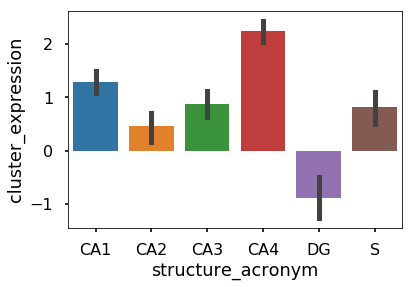

F_onewayResult(statistic=49.232238172825326, pvalue=6.087965661982586e-31)
Multiple Comparison of Means - Tukey HSD,FWER=0.05
group1 group2 meandiff  lower   upper  reject
---------------------------------------------
 CA1    CA2   -0.8246  -1.4198 -0.2295  True 
 CA1    CA3   -0.4006  -0.9776  0.1764 False 
 CA1    CA4    0.9612   0.3786  1.5439  True 
 CA1     DG   -2.1761  -2.7531 -1.5992  True 
 CA1     S    -0.4555  -1.0222  0.1111 False 
 CA2    CA3    0.424   -0.1895  1.0375 False 
 CA2    CA4    1.7859   1.167   2.4047  True 
 CA2     DG   -1.3515   -1.965  -0.738  True 
 CA2     S     0.3691  -0.2347  0.9729 False 
 CA3    CA4    1.3619   0.7605  1.9633  True 
 CA3     DG   -1.7755  -2.3714 -1.1796  True 
 CA3     S    -0.0549  -0.6408  0.531  False 
 CA4     DG   -3.1374  -3.7388  -2.536  True 
 CA4     S    -1.4168  -2.0083 -0.8253  True 
  DG     S     1.7206   1.1347  2.3065  True 
---------------------------------------------
>>>>CA1<<<<
0.0151095176085
>>>>CA2<<<<
0.0139

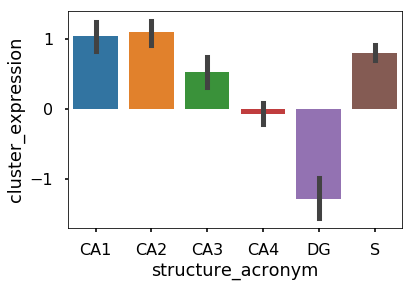

F_onewayResult(statistic=75.064762773397334, pvalue=1.3481044151669345e-40)
Multiple Comparison of Means - Tukey HSD,FWER=0.05
group1 group2 meandiff  lower   upper  reject
---------------------------------------------
 CA1    CA2    0.0491  -0.3793  0.4776 False 
 CA1    CA3   -0.5236  -0.9389 -0.1082  True 
 CA1    CA4   -1.1186  -1.5381 -0.6992  True 
 CA1     DG   -2.3337   -2.749 -1.9183  True 
 CA1     S     -0.242  -0.6499  0.1659 False 
 CA2    CA3   -0.5727  -1.0144  -0.131  True 
 CA2    CA4   -1.1678  -1.6133 -0.7222  True 
 CA2     DG   -2.3828  -2.8245 -1.9411  True 
 CA2     S    -0.2911  -0.7258  0.1436 False 
 CA3    CA4   -0.5951   -1.028 -0.1621  True 
 CA3     DG   -1.8101  -2.2391 -1.3811  True 
 CA3     S     0.2816  -0.1402  0.7034 False 
 CA4     DG    -1.215   -1.648 -0.7821  True 
 CA4     S     0.8766   0.4508  1.3024  True 
  DG     S     2.0917   1.6699  2.5135  True 
---------------------------------------------
>>>>CA1<<<<
0.48605961005
>>>>CA2<<<<
0.52485

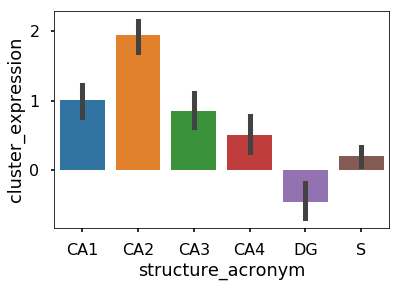

F_onewayResult(statistic=44.223220976467395, pvalue=9.9991699063466486e-29)
Multiple Comparison of Means - Tukey HSD,FWER=0.05
group1 group2 meandiff  lower   upper  reject
---------------------------------------------
 CA1    CA2    0.9326   0.4469  1.4182  True 
 CA1    CA3   -0.1498  -0.6206  0.321  False 
 CA1    CA4    -0.506  -0.9814 -0.0306  True 
 CA1     DG   -1.4679  -1.9387 -0.9971  True 
 CA1     S    -0.8045  -1.2669 -0.3422  True 
 CA2    CA3   -1.0824   -1.583 -0.5818  True 
 CA2    CA4   -1.4386  -1.9435 -0.9336  True 
 CA2     DG   -2.4004   -2.901 -1.8998  True 
 CA2     S    -1.7371  -2.2298 -1.2444  True 
 CA3    CA4   -0.3562  -0.8469  0.1345 False 
 CA3     DG    -1.318  -1.8043 -0.8318  True 
 CA3     S    -0.6547  -1.1328 -0.1766  True 
 CA4     DG   -0.9619  -1.4526 -0.4712  True 
 CA4     S    -0.2985  -0.7811  0.1841 False 
  DG     S     0.6633   0.1853  1.1414  True 
---------------------------------------------
>>>>CA1<<<<
0.687769989812
>>>>CA2<<<<
0.2306

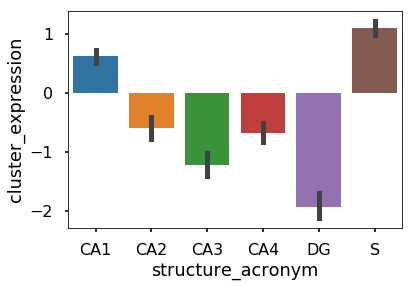

F_onewayResult(statistic=173.13916059342191, pvalue=1.6613765708237549e-63)
Multiple Comparison of Means - Tukey HSD,FWER=0.05
group1 group2 meandiff  lower   upper  reject
---------------------------------------------
 CA1    CA2   -1.2049  -1.5624 -0.8473  True 
 CA1    CA3   -1.8319  -2.1785 -1.4853  True 
 CA1    CA4   -1.3018  -1.6518 -0.9518  True 
 CA1     DG   -2.5402  -2.8868 -2.1936  True 
 CA1     S     0.4777   0.1374  0.8181  True 
 CA2    CA3   -0.6271  -0.9956 -0.2585  True 
 CA2    CA4    -0.097  -0.4687  0.2748 False 
 CA2     DG   -1.3353  -1.7039 -0.9668  True 
 CA2     S     1.6826   1.3199  2.0453  True 
 CA3    CA4    0.5301   0.1688  0.8913  True 
 CA3     DG   -0.7083  -1.0662 -0.3503  True 
 CA3     S     2.3096   1.9577  2.6616  True 
 CA4     DG   -1.2384  -1.5996 -0.8771  True 
 CA4     S     1.7796   1.4243  2.1349  True 
  DG     S     3.0179   2.666   3.3699  True 
---------------------------------------------
>>>>CA1<<<<
0.0691202888739
>>>>CA2<<<<
0.147

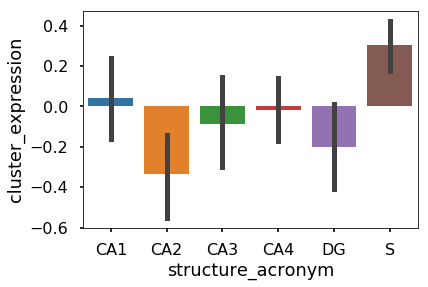

F_onewayResult(statistic=4.8226537167096133, pvalue=0.00038520354410415499)
Multiple Comparison of Means - Tukey HSD,FWER=0.05
group1 group2 meandiff  lower  upper  reject
--------------------------------------------
 CA1    CA2    -0.377  -0.7831 0.0291 False 
 CA1    CA3   -0.1271  -0.5207 0.2666 False 
 CA1    CA4   -0.0583  -0.4559 0.3392 False 
 CA1     DG   -0.2396  -0.6333 0.154  False 
 CA1     S     0.2622  -0.1244 0.6488 False 
 CA2    CA3    0.2499  -0.1687 0.6685 False 
 CA2    CA4    0.3187  -0.1036 0.7409 False 
 CA2     DG    0.1374  -0.2812 0.556  False 
 CA2     S     0.6392   0.2272 1.0512  True 
 CA3    CA4    0.0688  -0.3416 0.4791 False 
 CA3     DG   -0.1126  -0.5191 0.294  False 
 CA3     S     0.3893  -0.0105 0.789  False 
 CA4     DG   -0.1813  -0.5917 0.229  False 
 CA4     S     0.3205  -0.0831 0.7241 False 
  DG     S     0.5018   0.1021 0.9016  True 
--------------------------------------------
>>>>CA1<<<<
0.674819786142
>>>>CA2<<<<
0.382003994578
>>>>CA3<<

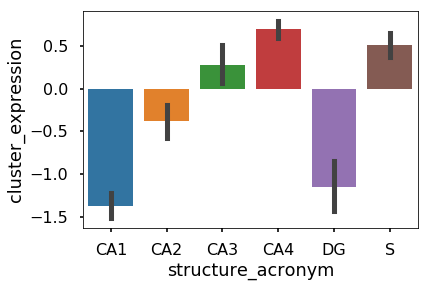

F_onewayResult(statistic=79.414033001343611, pvalue=5.4042457347085897e-42)
Multiple Comparison of Means - Tukey HSD,FWER=0.05
group1 group2 meandiff  lower   upper  reject
---------------------------------------------
 CA1    CA2    0.9848   0.5753  1.3944  True 
 CA1    CA3    1.649    1.252   2.0461  True 
 CA1    CA4    2.0602   1.6593  2.4611  True 
 CA1     DG    0.2158  -0.1812  0.6128 False 
 CA1     S     1.8777   1.4878  2.2676  True 
 CA2    CA3    0.6642   0.242   1.0864  True 
 CA2    CA4    1.0754   0.6495  1.5012  True 
 CA2     DG    -0.769  -1.1912 -0.3469  True 
 CA2     S     0.8929   0.4774  1.3084  True 
 CA3    CA4    0.4112  -0.0027  0.825  False 
 CA3     DG   -1.4332  -1.8433 -1.0232  True 
 CA3     S     0.2287  -0.1745  0.6319 False 
 CA4     DG   -1.8444  -2.2582 -1.4306  True 
 CA4     S    -0.1825  -0.5895  0.2245 False 
  DG     S     1.6619   1.2588  2.0651  True 
---------------------------------------------
>>>>CA1<<<<
0.316003158317
>>>>CA2<<<<
0.2804

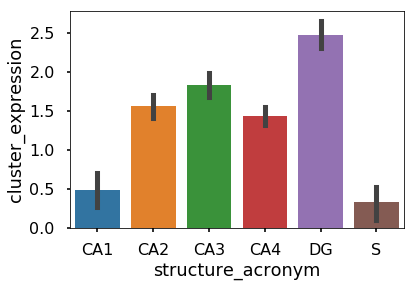

F_onewayResult(statistic=85.915984257041288, pvalue=5.5103128148868939e-44)
Multiple Comparison of Means - Tukey HSD,FWER=0.05
group1 group2 meandiff  lower   upper  reject
---------------------------------------------
 CA1    CA2    1.0799   0.7119  1.448   True 
 CA1    CA3    1.3425   0.9857  1.6993  True 
 CA1    CA4    0.9527   0.5924  1.313   True 
 CA1     DG    1.9886   1.6318  2.3454  True 
 CA1     S    -0.1575  -0.5078  0.1929 False 
 CA2    CA3    0.2626  -0.1168  0.642  False 
 CA2    CA4   -0.1272  -0.5099  0.2555 False 
 CA2     DG    0.9087   0.5293  1.2881  True 
 CA2     S    -1.2374  -1.6108  -0.864  True 
 CA3    CA4   -0.3898  -0.7617 -0.0179  True 
 CA3     DG    0.6461   0.2776  1.0146  True 
 CA3     S      -1.5   -1.8623 -1.1377  True 
 CA4     DG    1.0359   0.664   1.4078  True 
 CA4     S    -1.1102  -1.4759 -0.7444  True 
  DG     S    -2.1461  -2.5084 -1.7838  True 
---------------------------------------------
>>>>CA1<<<<
0.370435931797
>>>>CA2<<<<
0.2682

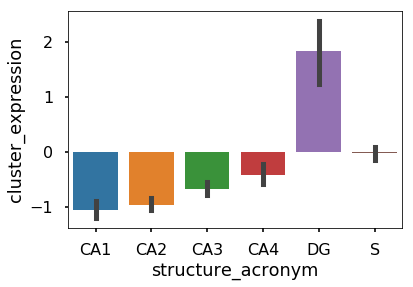

F_onewayResult(statistic=57.34346967164511, pvalue=2.9092849273042354e-34)
Multiple Comparison of Means - Tukey HSD,FWER=0.05
group1 group2 meandiff  lower   upper  reject
---------------------------------------------
 CA1    CA2    0.105   -0.4745  0.6845 False 
 CA1    CA3    0.3975  -0.1643  0.9593 False 
 CA1    CA4    0.6398   0.0725  1.2071  True 
 CA1     DG    2.8988   2.337   3.4606  True 
 CA1     S     1.0369   0.4852  1.5886  True 
 CA2    CA3    0.2925  -0.3048  0.8899 False 
 CA2    CA4    0.5348  -0.0678  1.1373 False 
 CA2     DG    2.7938   2.1965  3.3912  True 
 CA2     S     0.9319   0.344   1.5198  True 
 CA3    CA4    0.2423  -0.3433  0.8278 False 
 CA3     DG    2.5013   1.9211  3.0815  True 
 CA3     S     0.6394   0.0689  1.2098  True 
 CA4     DG    2.2591   1.6735  2.8446  True 
 CA4     S     0.3971  -0.1788  0.973  False 
  DG     S    -1.8619  -2.4324 -1.2915  True 
---------------------------------------------
>>>>CA1<<<<
0.00156600031963
>>>>CA2<<<<
0.062

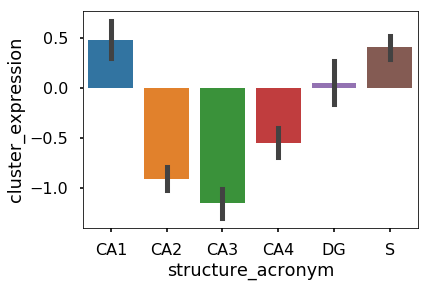

F_onewayResult(statistic=66.574403668339485, pvalue=1.0592260828054302e-37)
Multiple Comparison of Means - Tukey HSD,FWER=0.05
group1 group2 meandiff  lower   upper  reject
---------------------------------------------
 CA1    CA2   -1.3874  -1.7365 -1.0382  True 
 CA1    CA3   -1.6274  -1.9659  -1.289  True 
 CA1    CA4   -1.0319  -1.3737 -0.6901  True 
 CA1     DG   -0.4243  -0.7628 -0.0859  True 
 CA1     S    -0.0711  -0.4035  0.2613 False 
 CA2    CA3    -0.24     -0.6   0.1199 False 
 CA2    CA4    0.3555  -0.0076  0.7185 False 
 CA2     DG    0.963    0.6031  1.323   True 
 CA2     S     1.3163   0.9621  1.6705  True 
 CA3    CA4    0.5955   0.2427  0.9484  True 
 CA3     DG    1.2031   0.8535  1.5527  True 
 CA3     S     1.5564   1.2127  1.9001  True 
 CA4     DG    0.6075   0.2547  0.9604  True 
 CA4     S     0.9608   0.6138  1.3078  True 
  DG     S     0.3533   0.0096  0.697   True 
---------------------------------------------
>>>>CA1<<<<
0.63830292965
>>>>CA2<<<<
0.26606

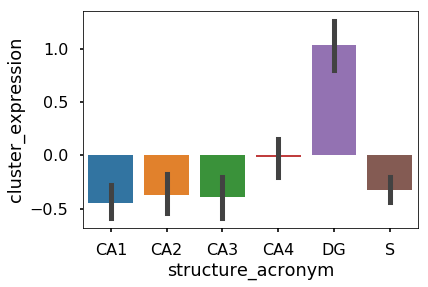

F_onewayResult(statistic=37.167871218866146, pvalue=2.3534833614688252e-25)
Multiple Comparison of Means - Tukey HSD,FWER=0.05
group1 group2 meandiff  lower   upper  reject
---------------------------------------------
 CA1    CA2    0.0784  -0.3051  0.4619 False 
 CA1    CA3    0.0545  -0.3173  0.4263 False 
 CA1    CA4    0.4302   0.0547  0.8057  True 
 CA1     DG    1.4869   1.1151  1.8587  True 
 CA1     S     0.1216  -0.2435  0.4868 False 
 CA2    CA3   -0.0239  -0.4192  0.3715 False 
 CA2    CA4    0.3518   -0.047  0.7506 False 
 CA2     DG    1.4085   1.0132  1.8039  True 
 CA2     S     0.0432  -0.3458  0.4323 False 
 CA3    CA4    0.3757  -0.0119  0.7632 False 
 CA3     DG    1.4324   1.0484  1.8164  True 
 CA3     S     0.0671  -0.3104  0.4447 False 
 CA4     DG    1.0567   0.6692  1.4442  True 
 CA4     S    -0.3085  -0.6897  0.0726 False 
  DG     S    -1.3653  -1.7428 -0.9877  True 
---------------------------------------------
>>>>CA1<<<<
0.468193951747
>>>>CA2<<<<
0.4156

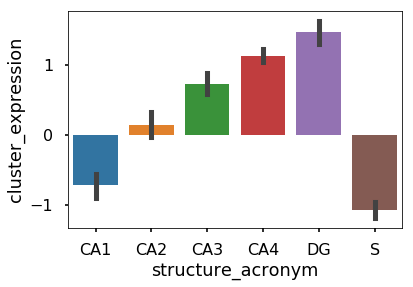

F_onewayResult(statistic=174.28706163988653, pvalue=1.0548525241826714e-63)
Multiple Comparison of Means - Tukey HSD,FWER=0.05
group1 group2 meandiff  lower   upper  reject
---------------------------------------------
 CA1    CA2    0.8675   0.5439  1.1911  True 
 CA1    CA3    1.4594   1.1456  1.7731  True 
 CA1    CA4    1.8605   1.5437  2.1773  True 
 CA1     DG    2.2045   1.8908  2.5182  True 
 CA1     S    -0.3575  -0.6656 -0.0494  True 
 CA2    CA3    0.5919   0.2583  0.9255  True 
 CA2    CA4    0.9931   0.6566  1.3296  True 
 CA2     DG    1.337    1.0034  1.6706  True 
 CA2     S     -1.225  -1.5533 -0.8967  True 
 CA3    CA4    0.4012   0.0742  0.7282  True 
 CA3     DG    0.7451   0.4211  1.0691  True 
 CA3     S    -1.8169  -2.1355 -1.4983  True 
 CA4     DG    0.344    0.017   0.671   True 
 CA4     S    -2.2181  -2.5397 -1.8965  True 
  DG     S     -2.562  -2.8806 -2.2435  True 
---------------------------------------------
>>>>CA1<<<<
0.0939769811479
>>>>CA2<<<<
0.069

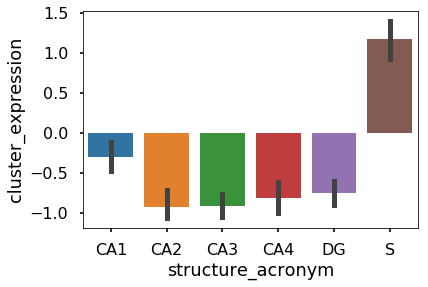

F_onewayResult(statistic=70.601921241960198, pvalue=4.1909986368532074e-39)
Multiple Comparison of Means - Tukey HSD,FWER=0.05
group1 group2 meandiff  lower   upper  reject
---------------------------------------------
 CA1    CA2   -0.6152  -1.0177 -0.2126  True 
 CA1    CA3   -0.6089  -0.9992 -0.2187  True 
 CA1    CA4   -0.5031  -0.8971  -0.109  True 
 CA1     DG   -0.4446  -0.8349 -0.0544  True 
 CA1     S     1.4776   1.0944  1.8608  True 
 CA2    CA3    0.0062  -0.4087  0.4212 False 
 CA2    CA4    0.1121  -0.3065  0.5306 False 
 CA2     DG    0.1705  -0.2444  0.5855 False 
 CA2     S     2.0928   1.6844  2.5011  True 
 CA3    CA4    0.1059  -0.3009  0.5126 False 
 CA3     DG    0.1643  -0.2387  0.5673 False 
 CA3     S     2.0865   1.6903  2.4828  True 
 CA4     DG    0.0584  -0.3483  0.4652 False 
 CA4     S     1.9807   1.5806  2.3807  True 
  DG     S     1.9222   1.526   2.3185  True 
---------------------------------------------
>>>>CA1<<<<
0.346186924045
>>>>CA2<<<<
0.0541

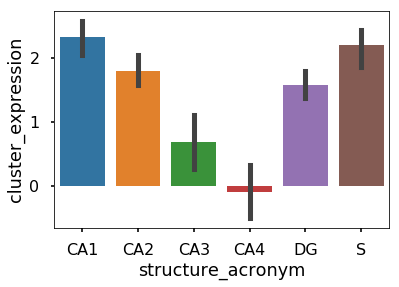

F_onewayResult(statistic=30.732441343517262, pvalue=5.6002440537491723e-22)
Multiple Comparison of Means - Tukey HSD,FWER=0.05
group1 group2 meandiff  lower   upper  reject
---------------------------------------------
 CA1    CA2   -0.5206  -1.2178  0.1766 False 
 CA1    CA3   -1.6458  -2.3217 -0.9699  True 
 CA1    CA4   -2.4215   -3.104 -1.7389  True 
 CA1     DG   -0.7507  -1.4266 -0.0747  True 
 CA1     S    -0.1267  -0.7905  0.5371 False 
 CA2    CA3   -1.1252  -1.8439 -0.4064  True 
 CA2    CA4   -1.9008  -2.6258 -1.1758  True 
 CA2     DG   -0.2301  -0.9488  0.4887 False 
 CA2     S     0.3939  -0.3134  1.1013 False 
 CA3    CA4   -0.7757  -1.4802 -0.0711  True 
 CA3     DG    0.8951   0.197   1.5932  True 
 CA3     S     1.5191   0.8327  2.2055  True 
 CA4     DG    1.6708   0.9662  2.3753  True 
 CA4     S     2.2948   1.6018  2.9877  True 
  DG     S     0.624   -0.0624  1.3103 False 
---------------------------------------------
>>>>CA1<<<<
0.236583586533
>>>>CA2<<<<
0.2254

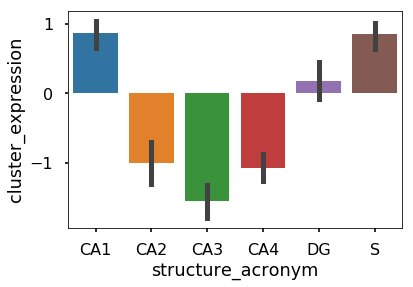

F_onewayResult(statistic=78.535648808370539, pvalue=1.0244836492335226e-41)
Multiple Comparison of Means - Tukey HSD,FWER=0.05
group1 group2 meandiff  lower   upper  reject
---------------------------------------------
 CA1    CA2   -1.8687  -2.3621 -1.3752  True 
 CA1    CA3   -2.4241  -2.9025 -1.9457  True 
 CA1    CA4    -1.935  -2.4181 -1.4518  True 
 CA1     DG   -0.6865  -1.1649 -0.2081  True 
 CA1     S    -0.0167  -0.4866  0.4531 False 
 CA2    CA3   -0.5555  -1.0642 -0.0468  True 
 CA2    CA4   -0.0663  -0.5794  0.4468 False 
 CA2     DG    1.1821   0.6734  1.6909  True 
 CA2     S     1.8519   1.3513  2.3526  True 
 CA3    CA4    0.4892  -0.0095  0.9878 False 
 CA3     DG    1.7376   1.2435  2.2317  True 
 CA3     S     2.4074   1.9216  2.8932  True 
 CA4     DG    1.2484   0.7498  1.7471  True 
 CA4     S     1.9182   1.4278  2.4087  True 
  DG     S     0.6698   0.184   1.1556  True 
---------------------------------------------
>>>>CA1<<<<
0.212147564187
>>>>CA2<<<<
0.1970

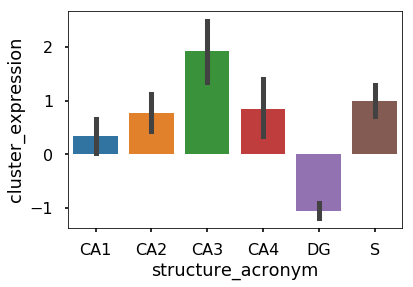

F_onewayResult(statistic=24.598545554359387, pvalue=1.9371015372394759e-18)
Multiple Comparison of Means - Tukey HSD,FWER=0.05
group1 group2 meandiff  lower   upper  reject
---------------------------------------------
 CA1    CA2    0.4384  -0.3706  1.2474 False 
 CA1    CA3    1.5974   0.8131  2.3817  True 
 CA1    CA4    0.5109  -0.2811  1.3029 False 
 CA1     DG   -1.3936  -2.1779 -0.6093  True 
 CA1     S     0.6589  -0.1113  1.4292 False 
 CA2    CA3    1.159    0.325   1.993   True 
 CA2    CA4    0.0725  -0.7687  0.9138 False 
 CA2     DG    -1.832   -2.666  -0.998  True 
 CA2     S     0.2206  -0.6002  1.0413 False 
 CA3    CA4   -1.0865  -1.9039  -0.269  True 
 CA3     DG    -2.991   -3.801  -2.181  True 
 CA3     S    -0.9384  -1.7349  -0.142  True 
 CA4     DG   -1.9046   -2.722 -1.0871  True 
 CA4     S     0.148    -0.656  0.952  False 
  DG     S     2.0526   1.2562  2.849   True 
---------------------------------------------
>>>>CA1<<<<
0.282665665063
>>>>CA2<<<<
0.3114

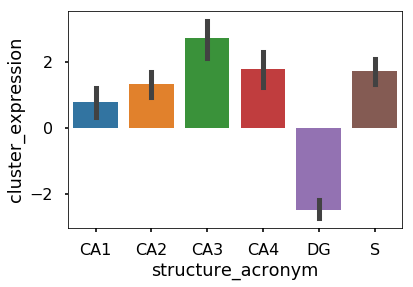

F_onewayResult(statistic=61.918338212285093, pvalue=5.2266739386434117e-36)
Multiple Comparison of Means - Tukey HSD,FWER=0.05
group1 group2 meandiff  lower   upper  reject
---------------------------------------------
 CA1    CA2    0.5272  -0.4086  1.463  False 
 CA1    CA3    1.9132   1.0059  2.8204  True 
 CA1    CA4    0.9934   0.0773  1.9096  True 
 CA1     DG   -3.2792  -4.1865  -2.372  True 
 CA1     S     0.9218   0.0309  1.8128  True 
 CA2    CA3    1.386    0.4213  2.3506  True 
 CA2    CA4    0.4662  -0.5068  1.4393 False 
 CA2     DG   -3.8064  -4.7711 -2.8418  True 
 CA2     S     0.3946  -0.5547  1.344  False 
 CA3    CA4   -0.9197  -1.8653  0.0259 False 
 CA3     DG   -5.1924  -6.1294 -4.2554  True 
 CA3     S    -0.9913  -1.9125 -0.0701  True 
 CA4     DG   -4.2727  -5.2183 -3.3271  True 
 CA4     S    -0.0716  -1.0016  0.8584 False 
  DG     S     4.2011   3.2799  5.1223  True 
---------------------------------------------
>>>>CA1<<<<
0.349479779234
>>>>CA2<<<<
0.3120

In [199]:
from sklearn.metrics import median_absolute_error
cluster_breakdown = pandas.DataFrame(index = np.unique(mtx.label), columns = ['size'])
for i in np.unique(mtx.label):
    print('=================CLUSTER %s================'%i)
    cluster_breakdown.loc[i,'size'] = len(mtx[mtx.label==i].index)
    phdf = pandas.DataFrame(df,copy=True)
    phdf.loc[:,'cluster_expression'] = xp.loc[mtx[mtx.label==i].index].mean(0).values
    tr,tp = stats.pearsonr(phdf['cluster_expression'],
                         phdf['position_along_hipp_AP_axis'])
    print('TOTAL R2 = ',tr**2)
    cluster_breakdown.loc[i,'Total_r2'] = tr**2
    cluster_breakdown.loc[i,'Total_p'] = tp
    plt.close()
    sns.barplot(x='structure_acronym',y='cluster_expression', data=phdf)
    plt.show()
    anova = stats.f_oneway(phdf[phdf.structure_acronym=='CA1']['cluster_expression'],
              phdf[phdf.structure_acronym=='CA2']['cluster_expression'],
              phdf[phdf.structure_acronym=='CA3']['cluster_expression'],
              phdf[phdf.structure_acronym=='CA4']['cluster_expression'],
              phdf[phdf.structure_acronym=='S']['cluster_expression'],
              phdf[phdf.structure_acronym=='DG']['cluster_expression'],)
    print(anova)
    print(pairwise_tukeyhsd(phdf.cluster_expression, phdf.structure_acronym))
    cluster_breakdown.loc[i,'ANOVA_p'] = anova[1]
    for struct in np.unique(df.structure_acronym):
        print('>>>>%s<<<<'%struct)
        gmean = phdf[phdf.structure_acronym==struct]['cluster_expression'].mean()
        cluster_breakdown.loc[i,'%s_mean'%struct] = gmean
        gstd = phdf[phdf.structure_acronym==struct]['cluster_expression'].std()
        cluster_breakdown.loc[i,'%s_std'%struct] = gstd
        #print('%s (%s)'%(gmean,gstd))
        r,p = stats.pearsonr(phdf[phdf.structure_acronym==struct]['cluster_expression'],
                           phdf[phdf.structure_acronym==struct]['position_along_hipp_AP_axis'])
        cluster_breakdown.loc[i,'%s_r2'%struct] = r**2
        cluster_breakdown.loc[i,'%s_p'%struct] = p
        print(r**2)

In [200]:
from statsmodels.sandbox.stats.multicomp import multipletests
cluster_breakdown.loc[:,'Total_FWE_p'] = multipletests(cluster_breakdown.Total_p,method='bonferroni')[1]
cluster_breakdown.loc[:,'ANOVA_FWE_p'] = multipletests(cluster_breakdown.ANOVA_p,method='bonferroni')[1]

In [201]:
cluster_breakdown[['Total_r2','Total_FWE_p']].sort_values('Total_r2').head(12)

,Total_r2,Total_FWE_p
9,0.000548,1.000000
19,0.007868,1.000000
20,0.008224,1.000000
2,0.011659,1.000000
24,0.020179,1.000000
15,0.030695,0.557587
3,0.034975,0.365153
12,0.039977,0.223622
23,0.049404,0.089439
8,0.052028,0.069375


In [202]:
cluster_breakdown.head()

,size,Total_r2,Total_p,ANOVA_p,CA1_mean,CA1_std,CA1_r2,CA1_p,CA2_mean,CA2_std,...,DG_mean,DG_std,DG_r2,DG_p,S_mean,S_std,S_r2,S_p,Total_FWE_p,ANOVA_FWE_p
0,35,0.240338,1.155016e-11,2.000105e-34,-0.621902,0.301662,0.261940,2.751740e-03,0.171452,0.605391,...,-0.813358,0.585969,0.603266,0.000001,-0.519275,0.303518,0.195433,0.014446,2.887541e-10,5.000262e-33
1,23,0.153854,1.222987e-07,2.540198e-28,0.507733,0.548162,0.564870,7.131017e-07,1.665533,0.644642,...,0.976399,0.551444,0.491009,0.000033,-0.099715,0.308949,0.112130,0.070485,3.057468e-06,6.350494e-27
2,44,0.011659,1.610503e-01,1.932678e-19,-0.770616,0.399039,0.102652,7.381280e-02,-1.008627,0.358476,...,-1.210603,0.309122,0.070857,0.170945,-0.533059,0.447762,0.000428,0.913611,1.000000e+00,4.831694e-18
3,43,0.034975,1.460613e-02,9.246916e-58,-0.103916,0.475204,0.404033,9.261220e-05,0.455182,0.441909,...,3.432085,0.725317,0.023777,0.433372,0.597303,0.672407,0.487391,0.000018,3.651533e-01,2.311729e-56
4,36,0.096642,3.689989e-05,1.033014e-49,-0.479669,0.408523,0.649686,2.589550e-08,-0.596797,0.462779,...,1.960164,0.651581,0.264728,0.005090,0.069225,0.368951,0.345304,0.000639,9.224972e-04,2.582535e-48


In [203]:
cluster_breakdown.loc[:,'k'] = cluster_breakdown.index

In [204]:
pcols = [x for x in cluster_breakdown.columns if '_p' in x and 'Total' not in x and 'ANOVA' not in x]
all_ps = []
for col in pcols:
    [all_ps.append(x) for x in cluster_breakdown[col].values]
len(all_ps)

150

In [205]:
pcols

['CA1_p', 'CA2_p', 'CA3_p', 'CA4_p', 'DG_p', 'S_p']

In [206]:
k = 25
p_correction =  multipletests(all_ps,method='bonferroni')
for i,col in enumerate(pcols):
    lab = col.split('_')[0]
    inds = np.arange(k) + (k*i)
    cluster_breakdown.loc[:,'%s_FWE_p'%lab] = p_correction[1][inds]

In [207]:
cluster_breakdown.to_csv('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/clusters_k25_m600_subfield_breakdown_corrcoef.csv')

In [208]:
cluster_breakdown[['CA2_r2','CA2_FWE_p']].sort_values('CA2_r2').head(40)

,CA2_r2,CA2_FWE_p
9,0.013936,1.000000
2,0.016158,1.000000
20,0.054132,1.000000
16,0.062523,1.000000
3,0.068042,1.000000
19,0.069876,1.000000
12,0.147029,1.000000
1,0.148318,1.000000
6,0.160954,1.000000
22,0.197033,1.000000


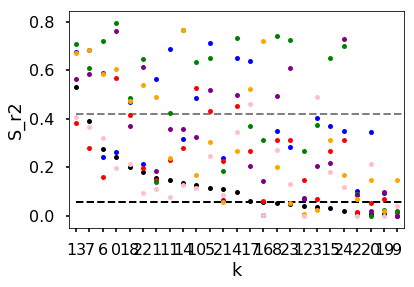

In [196]:
plt.close()
sns.stripplot(x='k',y='Total_r2', data=cluster_breakdown, color='black',
              order=cluster_breakdown.sort_values('Total_r2',ascending=False)['k'])
plt.plot([0, 25], [0.055, 0.055], 'k--', linewidth=2)
sns.stripplot(x='k',y='CA1_r2', data=cluster_breakdown, color = 'blue',
              order=cluster_breakdown.sort_values('Total_r2',ascending=False)['k'])
sns.stripplot(x='k',y='CA2_r2', data=cluster_breakdown, color = 'red',
              order=cluster_breakdown.sort_values('Total_r2',ascending=False)['k'])
sns.stripplot(x='k',y='CA3_r2', data=cluster_breakdown, color = 'green',
              order=cluster_breakdown.sort_values('Total_r2',ascending=False)['k'])
sns.stripplot(x='k',y='CA4_r2', data=cluster_breakdown, color = 'purple',
              order=cluster_breakdown.sort_values('Total_r2',ascending=False)['k'])
sns.stripplot(x='k',y='DG_r2', data=cluster_breakdown, color = 'orange',
              order=cluster_breakdown.sort_values('Total_r2',ascending=False)['k'])
sns.stripplot(x='k',y='S_r2', data=cluster_breakdown, color = 'pink',
              order=cluster_breakdown.sort_values('Total_r2',ascending=False)['k'])
plt.plot([0, 25], [0.42, 0.42], 'grey',linestyle = '--', linewidth=2)
plt.show()

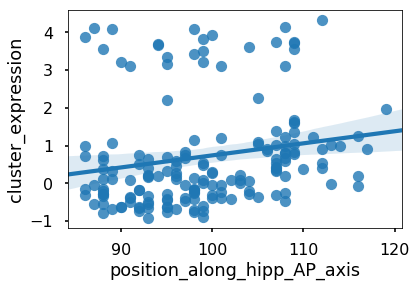

TOTAL R2 =  0.0349754241425
TOTAL MEDIAN ABSOLUTE ERROR =  98.0235910643
>>>>CA1<<<<


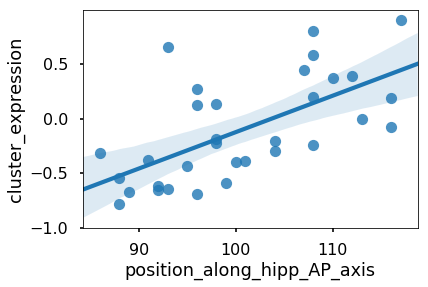

0.404033324184
98.9087439285
>>>>CA2<<<<


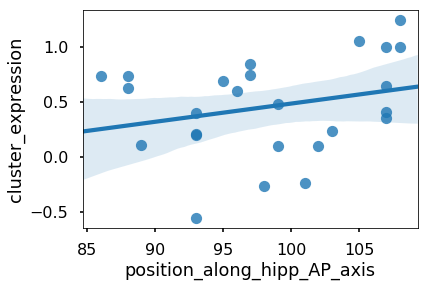

0.0680420586656
98.2686910167
>>>>CA3<<<<


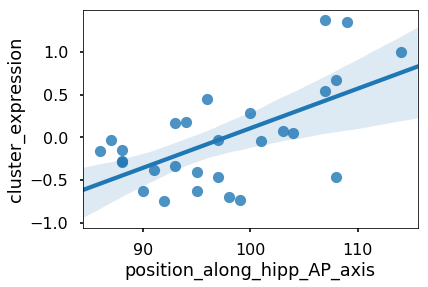

0.375606137874
96.3333426092
>>>>CA4<<<<


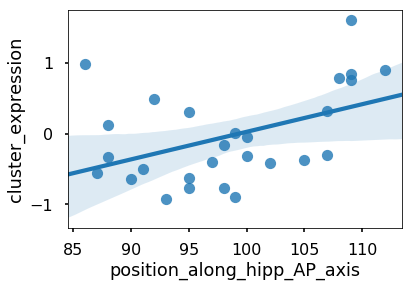

0.202881768906
98.76400431
>>>>DG<<<<


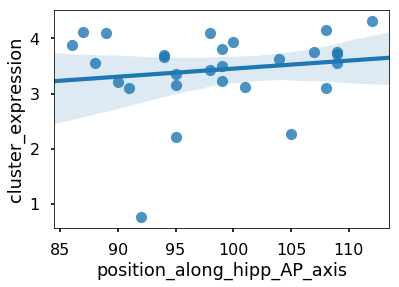

0.0237765868648
94.8816803654
>>>>S<<<<


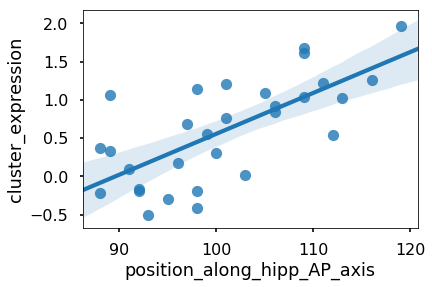

0.487390671781
99.074310752


In [358]:
i = 3
phdf = pandas.DataFrame(df,copy=True)
phdf.loc[:,'cluster_expression'] = xp.loc[mtx[mtx.label==i].index].mean(0).values
plt.close()
sns.regplot(x='position_along_hipp_AP_axis', y = 'cluster_expression', data = phdf)
plt.show()
tr2 = stats.pearsonr(phdf['cluster_expression'],
                     phdf['position_along_hipp_AP_axis'])[0]**2
print('TOTAL R2 = ',tr2)
tmae = median_absolute_error(phdf['cluster_expression'],
                          phdf['position_along_hipp_AP_axis'])
print('TOTAL MEDIAN ABSOLUTE ERROR = ',tmae)
for struct in np.unique(df.structure_acronym):
        print('>>>>%s<<<<'%struct)
        plt.close()
        sns.regplot(phdf[phdf.structure_acronym==struct]['position_along_hipp_AP_axis'],
                    phdf[phdf.structure_acronym==struct]['cluster_expression'])
        plt.show()
        r2 = stats.pearsonr(phdf[phdf.structure_acronym==struct]['cluster_expression'],
                           phdf[phdf.structure_acronym==struct]['position_along_hipp_AP_axis'])[0]**2
        print(r2)
        mae = median_absolute_error(phdf[phdf.structure_acronym==struct]['cluster_expression'],
                                 phdf[phdf.structure_acronym==struct]['position_along_hipp_AP_axis'])
        print(mae)

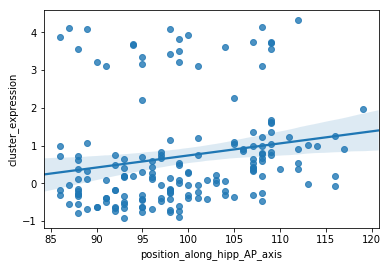

TOTAL R2 =  0.0349754241425
TOTAL MEDIAN ABSOLUTE ERROR =  98.0235910643
>>>>CA1<<<<


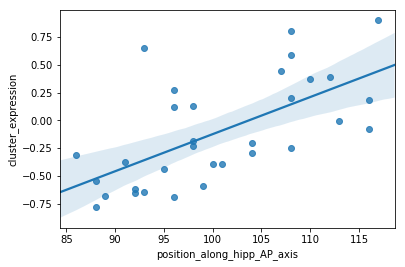

0.404033324184
98.9087439285
>>>>CA2<<<<


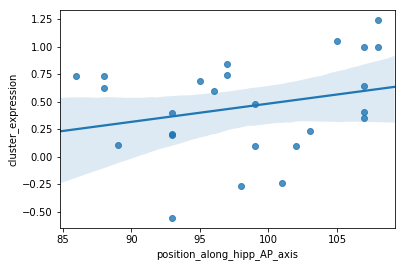

0.0680420586656
98.2686910167
>>>>CA3<<<<


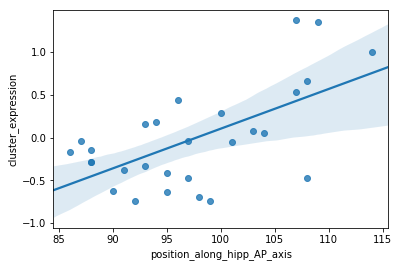

0.375606137874
96.3333426092
>>>>CA4<<<<


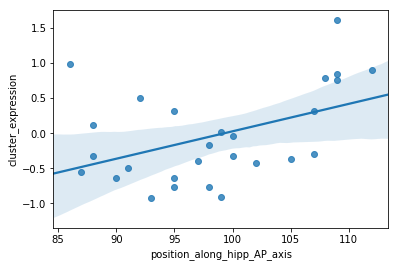

0.202881768906
98.76400431
>>>>DG<<<<


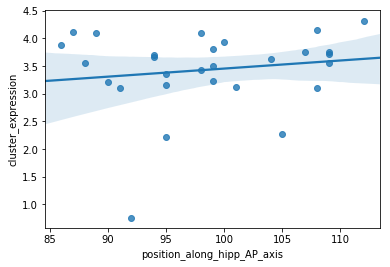

0.0237765868648
94.8816803654
>>>>S<<<<


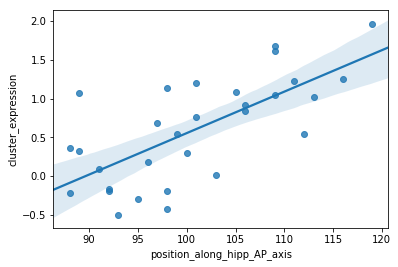

0.487390671781
99.074310752


In [247]:
i = 8
phdf = pandas.DataFrame(df,copy=True)
phdf.loc[:,'cluster_expression'] = xp.loc[mtx[mtx.label==i].index].mean(0).values
plt.close()
sns.regplot(x='position_along_hipp_AP_axis', y = 'cluster_expression', data = phdf)
plt.show()
tr2 = stats.pearsonr(phdf['cluster_expression'],
                     phdf['position_along_hipp_AP_axis'])[0]**2
print('TOTAL R2 = ',tr2)
tmae = median_absolute_error(phdf['cluster_expression'],
                          phdf['position_along_hipp_AP_axis'])
print('TOTAL MEDIAN ABSOLUTE ERROR = ',tmae)
for struct in np.unique(df.structure_acronym):
        print('>>>>%s<<<<'%struct)
        plt.close()
        sns.regplot(phdf[phdf.structure_acronym==struct]['position_along_hipp_AP_axis'],
                    phdf[phdf.structure_acronym==struct]['cluster_expression'])
        plt.show()
        r2 = stats.pearsonr(phdf[phdf.structure_acronym==struct]['cluster_expression'],
                           phdf[phdf.structure_acronym==struct]['position_along_hipp_AP_axis'])[0]**2
        print(r2)
        mae = median_absolute_error(phdf[phdf.structure_acronym==struct]['cluster_expression'],
                                 phdf[phdf.structure_acronym==struct]['position_along_hipp_AP_axis'])
        print(mae)

### Relationship to cx metrics

In [50]:
mod_genes = pandas.read_csv('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/clustering_mod_genes/MAIN_model_genes_of_importance.csv')
mod_genes.index = mod_genes.probe_ind
cluster_breakdown = pandas.read_csv('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/clustering_mod_genes/clusters_k19_m600_subfield_breakdown.csv',
                                   index_col=0)
cluster_breakdown.head()

,size,Total_r2,Total_p,CA1_mean,CA1_std,CA1_r2,CA1_p,CA2_mean,CA2_std,CA2_r2,...,S_r2,S_p,Total_FWE_p,k,CA1_FWE_p,CA2_FWE_p,CA3_FWE_p,CA4_FWE_p,DG_FWE_p,S_FWE_p
0,41,0.025417,3.783664e-02,1.008626,0.376068,0.484425,9.728904e-06,0.414182,0.401381,0.070905,...,0.016212,0.502542,7.188962e-01,0,0.001109,1.000000,9.584633e-05,1.000000,1.000000,1.000000
1,57,0.002247,5.393217e-01,-0.664560,0.365082,0.003674,7.417289e-01,-0.988587,0.334764,0.001135,...,0.057132,0.203343,1.000000e+00,1,1.000000,1.000000,1.000000e+00,1.000000,1.000000,1.000000
2,32,0.172601,1.764784e-08,1.413489,0.651786,0.231273,5.332498e-03,0.050348,0.716524,0.220836,...,0.090716,0.105791,3.353089e-07,2,0.607905,1.000000,5.788081e-03,0.121906,0.048404,1.000000
3,48,0.349553,2.099193e-17,0.481451,0.578892,0.639276,4.047428e-08,0.290887,0.503454,0.449533,...,0.326437,0.000974,3.988467e-16,3,0.000005,0.027926,4.360458e-07,0.006318,0.011539,0.111083
4,22,0.151522,1.552025e-07,0.510665,0.550949,0.545844,1.376036e-06,1.737824,0.674434,0.163951,...,0.111507,0.071319,2.948848e-06,4,0.000157,1.000000,1.000000e+00,1.000000,0.001646,1.000000


In [79]:
mtx.to_csv('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/clustering_mod_genes/n19_matrix')

In [81]:
df.shape

(170, 21)

In [83]:
len(bigdf.loc[mtx[mtx.label==i].index].mean(0).values)

3702

In [90]:
cx_by_cluster = pandas.DataFrame(index = range(18), columns = ['fcx','scx', 'dis'])

In [110]:
img = diffs_2mm['fmri'].get_data()
vrad=3
vdim = 2
gcx_col='cluster_expression'
bootstrap = False
plabs = ['Cortex only',
         'HAGS Index expression','rsfMRI connectivity']
for i in range(18):
    print('======cluster %s======'%i)
    phdf = pandas.DataFrame(gdf,copy=True)
    phdf.loc[:,'cluster_expression'] = bigdf.loc[mtx[mtx.label==i].index].mean(0).values
    res, vex = run_gvfcx_analysis(img, phdf, msk4, vrad, vdim, gcx_col, plabs, 
                       bootstrap, n_iter=10, hue_vals=[], illustrative=True)
    cx_by_cluster.loc[i,'fcx'] = res['r2'].values[0]

In [111]:
img = diffs_2mm['struc'].get_data()
vrad=3
vdim = 2
gcx_col='cluster_expression'
bootstrap = False
plabs = ['Cortex only',
         'HAGS Index expression','rsfMRI connectivity']
for i in range(18):
    print('======cluster %s======'%i)
    phdf = pandas.DataFrame(gdf,copy=True)
    phdf.loc[:,'cluster_expression'] = bigdf.loc[mtx[mtx.label==i].index].mean(0).values
    res, vex = run_gvfcx_analysis(img, phdf, msk4, vrad, vdim, gcx_col, plabs, 
                       bootstrap, n_iter=10, hue_vals=[], illustrative=True)
    cx_by_cluster.loc[i,'scx'] = res['r2'].values[0]

In [112]:
img = diffs_2mm['dis'].get_data()
vrad=3
vdim = 2
gcx_col='cluster_expression'
bootstrap = False
plabs = ['Cortex only',
         'HAGS Index expression','FTD > AD vulnerability']
for i in range(18):
    print('======cluster %s======'%i)
    phdf = pandas.DataFrame(gdf,copy=True)
    phdf.loc[:,'cluster_expression'] = bigdf.loc[mtx[mtx.label==i].index].mean(0).values
    res, vex = run_gvfcx_analysis(img, phdf, msk4, vrad, vdim, gcx_col, plabs, 
                       bootstrap, n_iter=10, hue_vals=[], illustrative=True)
    cx_by_cluster.loc[i,'dis'] = res['r2'].values[0]

In [99]:
cx_by_cluster

,fcx,scx,dis
0,0.00571669,0.00718269,0.000187467
1,0.00210268,0.000181675,0.00219826
2,0.00504436,0.0187756,0.0972086
3,0.0342887,0.0633531,0.0671582
4,0.0764919,0.112991,0.000103437
5,0.0341897,0.0676918,0.0247117
6,0.0283403,0.0198534,0.0491966
7,0.0811906,0.120947,0.00666075
8,0.00992437,0.019249,0.0656705
9,0.0732558,0.154224,0.000654716


In [ ]:
# Cluster expression images

In [341]:
xp.loc[mod_genes[mod_genes.step==1].index].shape
jnk.shape

(101, 101)

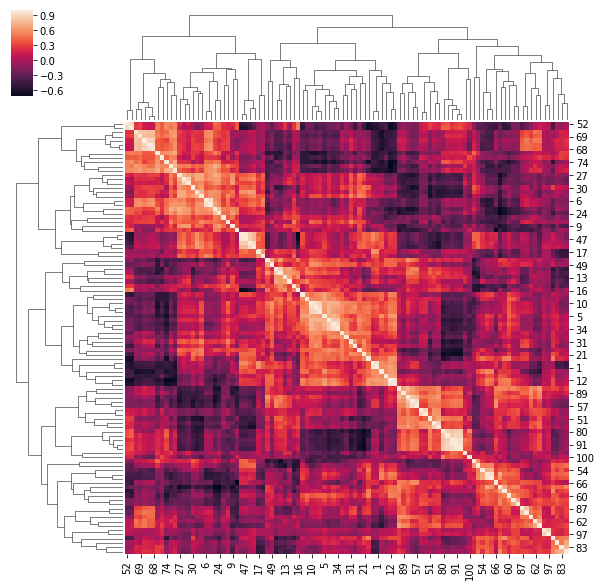

In [344]:
plt.close()
jnk = np.corrcoef(xp.loc[mod_genes[mod_genes.step==1].index])
sns.clustermap(jnk)
plt.show()

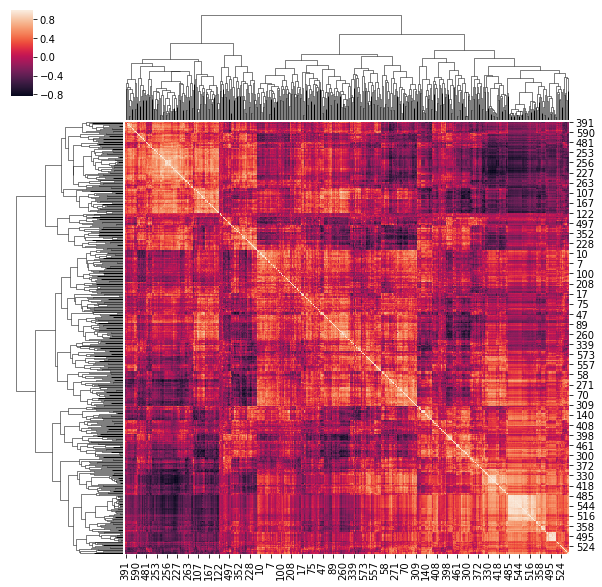

In [345]:
plt.close()
jnk = np.corrcoef(xp.loc[mod_genes[mod_genes.step<3].index])
sns.clustermap(jnk)
plt.show()

In [53]:
plt.close()
jnk = np.corrcoef(xp.loc[mod_genes[mod_genes.step<4].index])
sns.clustermap(jnk)
plt.show()

NameError: name 'mod_genes' is not defined

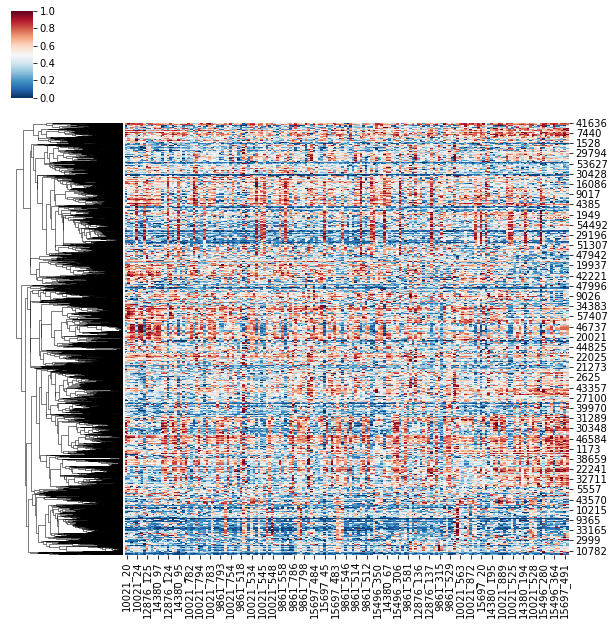

In [136]:
cols = df.sort_values('position_along_hipp_AP_axis')['structure_acronym']
mtx = xp.loc[imp_genes[:step3],
             xp.columns[df.sort_values('position_along_hipp_AP_axis').index]
            ]
plt.close()
g3 = sns.clustermap(mtx,
               col_cluster=False, metric='correlation', standard_scale=0,
               cmap='RdBu_r')
plt.show()

In [138]:
ks = range(2,50)
X = g3.data2d.values
cluster_solutions = pandas.DataFrame(index = ks, columns = ['avg_ratio', 'n_hits','n_close', 'silhouette'])
for k in ks:
    connectivity = kneighbors_graph(X, n_neighbors=2, include_self=False)
    clusterer = AgglomerativeClustering(n_clusters=k, connectivity=connectivity)
    cluster_labels = clusterer.fit_predict(X)
    cluster_solutions.loc[k,'silhouette'] = silhouette_score(X, cluster_labels)
    mtx = pandas.DataFrame(g3.data2d, copy=True)
    mtx.loc[:,'label'] = cluster_labels
    rats = []
    hits = 0
    close = 0
    for i in np.unique(mtx.label):
        clus_data = mtx[mtx.label==i][mtx.columns[:-1]]
        ants = len([x for x in clus_data.index if mod_genes.loc[x,'ant-post'] == 'anterior'])
        posts = len([x for x in clus_data.index if mod_genes.loc[x,'ant-post'] == 'posterior'])
        if ants > posts:
            rat = (100/(ants+posts)) * ants
        else:
            rat = (100/(ants+posts)) * posts
        rats.append(rat)
        if rat == 100:
            hits += 1
        if rat > 90:
            close += 1
    cluster_solutions.loc[k,'avg_ratio'] = np.mean(rats)
    cluster_solutions.loc[k,'n_hits'] = hits
    cluster_solutions.loc[k,'n_close'] = close
    print('finished',k)

//anaconda/envs/py3/lib/python3.5/site-packages/sklearn/cluster/hierarchical.py:193: UserWarning: the number of connected components of the connectivity matrix is 7 > 1. Completing it to avoid stopping the tree early.
  affinity='euclidean')


finished 2
finished 3
finished 4
finished 5
finished 6
finished 7
finished 8
finished 9
finished 10
finished 11
finished 12
finished 13
finished 14
finished 15
finished 16
finished 17
finished 18
finished 19
finished 20
finished 21
finished 22
finished 23
finished 24
finished 25
finished 26
finished 27
finished 28
finished 29
finished 30
finished 31
finished 32
finished 33
finished 34
finished 35
finished 36
finished 37
finished 38
finished 39
finished 40
finished 41
finished 42
finished 43
finished 44
finished 45
finished 46
finished 47
finished 48
finished 49


In [144]:
cluster_solutions.loc[:,'perc_hits'] = cluster_solutions.n_hits.values / cluster_solutions.index.values
cluster_solutions.loc[:,'perc_close'] = cluster_solutions.n_close.values / cluster_solutions.index.values
cluster_solutions.loc[:,'k'] = cluster_solutions.index
cluster_solutions.head()

,avg_ratio,n_hits,n_close,silhouette,perc_hits,perc_close,k
2,52.6593,0,0,0.145252,0,0,2
3,53.2853,0,0,0.0676453,0,0,3
4,63.3036,0,0,0.0606175,0,0,4
5,61.5848,0,0,0.0508971,0,0,5
6,60.0274,0,0,0.0355614,0,0,6


//anaconda/envs/py3/lib/python3.5/site-packages/seaborn/categorical.py:1460: FutureWarning: remove_na is deprecated and is a private function. Do not use.
  stat_data = remove_na(group_data)


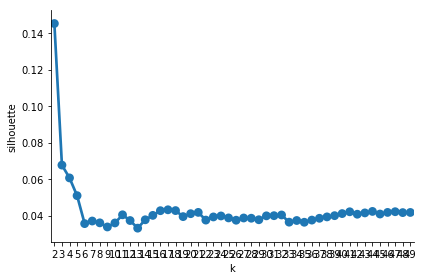

In [145]:
plt.close()
sns.factorplot(x='k', y = 'silhouette', data=cluster_solutions, aspect=1.5)
plt.show()

//anaconda/envs/py3/lib/python3.5/site-packages/seaborn/categorical.py:1460: FutureWarning: remove_na is deprecated and is a private function. Do not use.
  stat_data = remove_na(group_data)


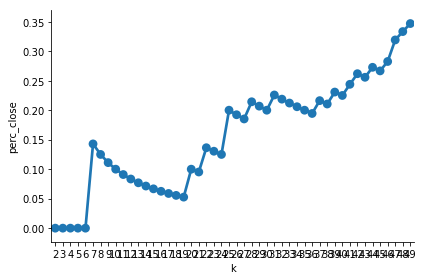

In [147]:
plt.close()
sns.factorplot(x='k', y = 'perc_close', data=cluster_solutions, aspect=1.5)
plt.show()

//anaconda/envs/py3/lib/python3.5/site-packages/seaborn/categorical.py:1460: FutureWarning: remove_na is deprecated and is a private function. Do not use.
  stat_data = remove_na(group_data)


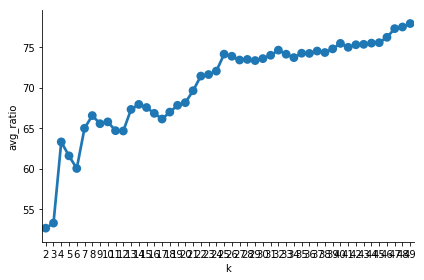

In [148]:
plt.close()
sns.factorplot(x='k', y = 'avg_ratio', data=cluster_solutions, aspect=1.5)
plt.show()

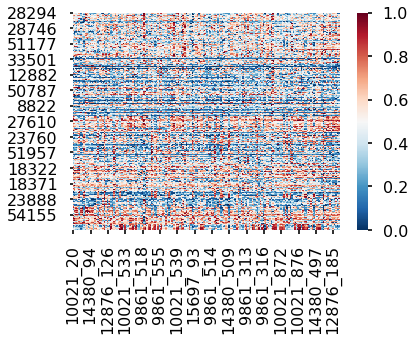

In [229]:

plt.close()
sns.heatmap(g.data2d.loc[output[1].sort_values('order').index],
            cmap = 'RdBu_r')
plt.show()

In [243]:
imp_genes[0]

12941

In [254]:
cols = df.sort_values('position_along_hipp_AP_axis').index
cols

Int64Index([  0,   1,   2,   3,   4, 105,  99,  98,  45,  50,
            ...
             79,  89, 122,  78,  87,  54,  53,  55, 109,  94],
           dtype='int64', length=170)

In [173]:
fxp = list(np.arange(10))
ktxp = list(np.arange(10))
orig = []
new = []
for i in range(10):
    dropper = np.random.randint(0,len(fxp))
    print(dropper)
    orig.append(ktxp[dropper])
    new.append(dropper)
    fxp.remove(dropper)
    ktxp.remove(ktxp[dropper])
    fxp = list(np.arange(len(fxp)))
    print(fxp,'\n', ktxp, '\n\n')
print(orig)

0
[0, 1, 2, 3, 4, 5, 6, 7, 8] 
 [1, 2, 3, 4, 5, 6, 7, 8, 9] 


8
[0, 1, 2, 3, 4, 5, 6, 7] 
 [1, 2, 3, 4, 5, 6, 7, 8] 


1
[0, 1, 2, 3, 4, 5, 6] 
 [1, 3, 4, 5, 6, 7, 8] 


5
[0, 1, 2, 3, 4, 5] 
 [1, 3, 4, 5, 6, 8] 


1
[0, 1, 2, 3, 4] 
 [1, 4, 5, 6, 8] 


2
[0, 1, 2, 3] 
 [1, 4, 6, 8] 


1
[0, 1, 2] 
 [1, 6, 8] 


0
[0, 1] 
 [6, 8] 


0
[0] 
 [8] 


0
[] 
 [] 


[0, 9, 2, 7, 3, 5, 4, 1, 6, 8]


In [159]:
fxp.index == ktxp.index

array([ True,  True,  True, ...,  True,  True,  True], dtype=bool)

### Bootstrap results

In [ ]:
boot_betas = pandas.DataFrame(index = range(xp.shape[0]),
                             columns = range(100))

In [ ]:
def PCA_LR_pipeline(in_mtx, y, pca = PCA(random_state=123), 
                    clf = linear_model.LassoCV(random_state = 123), 
                    cv_strategy = None, cv = 10, test_gene_num = [100], illustrative = False,
                   sanity_check_style = 'separate', cv_labels = [], reverse_axes = True):

In [54]:
from sklearn.model_selection import KFold

In [59]:
jnk = KFold(10,True,123).split(xp.T)
for tr,te in jnk:
    print(len(tr),len(te))

153 17
153 17
153 17
153 17
153 17
153 17
153 17
153 17
153 17
153 17


In [ ]:
boot_betas = pandas.DataFrame(index = range(xp.shape[0]),
                             columns = range(100))
in_mtx = xp.T.values
pca = PCA(random_state=123)
clf = linear_model.LassoCV(random_state = 123)
for i in range(100):
    jnk = KFold(10,True).split(xp.T)
    

if type(pca) == type(None):
    pca_tfm = in_mtx
else:
    print('running PCA')
    dat_pca = pca.fit(in_mtx)
    print('transforming data')
    pca_tfm = dat_pca.transform(in_mtx)
    if len(y) != pca_tfm.shape[-1]:
        raise ValueError('length of y-axis of transformed item must match the length of y')
    final_outputs.update({'pca_object': dat_pca})


print('performing model cross-validation')
if hasattr(cv_strategy, 'get_n_splits'):
    folds = cv_strategy.get_n_splits(pca_tfm)
    #scores = model_selection.cross_val_score(clf, pca_tfm, y=y, groups=folds, cv=cv)
    predicted = model_selection.cross_val_predict(clf, pca_tfm, y=y, groups=folds, cv=cv)
    observed = y
    score = stats.pearsonr(predicted, y)[0]**2
elif cv_strategy == 'LOLO':
    print('using leave-one-label-out cross-validation')
    observed, predicted = leave_one_x_out(cv_labels, pca_tfm, y, clf)
    score = stats.pearsonr(predicted,observed)[0]**2
elif cv_strategy == 'balanced':
    print('balancing cross-validation by labels')
    observed, predicted = balanced_cv(cv_labels, pca_tfm, y, clf, cv)
    score = stats.pearsonr(predicted,observed)[0]**2
elif type(cv_strategy) == int:
    print('using %s iterations of %s-fold cross-validation'%(cv_strategy,cv))
    score = []
    preds = np.zeros((cv_strategy,len(y)))
    for i in range(cv_strategy):
        sel = model_selection.KFold(n_splits=cv, shuffle=True)
        predicted = model_selection.cross_val_predict(clf, pca_tfm, y=y, cv=sel)
        preds[i,:] = predicted
        score.append(stats.pearsonr(predicted, y)[0]**2)
        print('completed iteration',i+1)
elif type(cv_strategy) != type(None):
    print('using basic %s-fold cross-validation'%cv)
    #scores = model_selection.cross_val_score(clf, pca_tfm, y=y, cv=cv)
    predicted = model_selection.cross_val_predict(clf, pca_tfm, y=y, cv=cv)
    observed = y
    score = stats.pearsonr(predicted, y)[0]**2
else:
    score = None
if type(score) != type(None):
    if type(score) == list:
        if illustrative:
            plt.close()
            sns.regplot(preds.mean(0), y, fit_reg=False)
            plt.xlabel('Average CV model predicted position along axis')
            plt.ylabel('Actual position along axis')
            plt.show()

            jnk = pandas.DataFrame(index = range(cv_strategy+1), 
                                   columns = ['score','iteration'])
            jnk.loc[:,'iteration'] = list(range(cv_strategy)) + ['mean']
            jnk.loc[:,'score'] = score + [np.mean(score)]
            plt.close()
            sns.factorplot(x='iteration',y='score',data=jnk)
            plt.show()
            print('model cv scores (r2):')
            print(score)
            print('average r2:',np.mean(score))
            final_outputs.update({'CV_scores': score})
    else:        
        if illustrative:
            plt.close()
            sns.regplot(predicted, observed, fit_reg=False)
            plt.xlabel('CV model predicted position along axis')
            plt.ylabel('Actual position along axis')
            plt.show()
        print('model cv score: r2 = ',score)
        final_outputs.update({'CV_scores': score})
else:
    print('no valid cross-validation method specified')

print('running final model')
mod = clf.fit(pca_tfm, y)
if not hasattr(mod,'coef_'):
    raise IOError('right now, this pipeline can only accept clf objects with a coef_ attribute')
final_outputs.update({'final_model': mod})
scr = mod.score(pca_tfm, y)
print('final model fit r2 = ',scr)
if illustrative:
    plt.close()
    sns.regplot(x=mod.predict(pca_tfm), y=y)
    plt.xlabel('Model predicted position along A-P axis')
    plt.ylabel('Actual position along A-P axis')
    plt.show()

if type(pca) == type(None):
    f_betas = mod.coef_
else:
    f_betas = back_transform(dat_pca, mod)
final_outputs.update({'betas': f_betas})

gene_selections = sanity_check(in_mtx, y, f_betas, test_gene_num, 
                               illustrative, sanity_check_style, reverse_axes)
final_outputs.update({'gene_selections': gene_selections})

return final_outputs

def back_transform(pca_obj, clf_obj):
return np.dot(pca_obj.components_.T,clf_obj.coef_)


In [21]:
bs = pandas.read_csv('/Users/jakevogel/Science/AHBA/MAIN_hipp_model_bootstrap_betas.csv',
                    index_col = 0)
bs.shape

(58692, 100)

In [38]:
mean_b_vals = []
stab_b_vals = []
for col in xp.columns:
    stab_b_vals.append(stats.pearsonr(xp[col].values,
                  stability)[0])
    mean_b_vals.append(stats.pearsonr(xp[col].values,
                                     bs.mean(1))[0])
    

In [48]:
df.position_along_hipp_AP_axis.astype(float)

0       86.0
1       86.0
2       86.0
3       86.0
4       86.0
5      109.0
6      109.0
7      107.0
8      110.0
9      111.0
10      92.0
11      92.0
12      93.0
13      93.0
14      93.0
15      96.0
16      94.0
17      95.0
18      94.0
19      95.0
20      96.0
21      98.0
22      98.0
23      98.0
24     107.0
25     107.0
26     107.0
27     107.0
28     107.0
29     106.0
       ...  
140    108.0
141     98.0
142     98.0
143     98.0
144     98.0
145     99.0
146     95.0
147     95.0
148     93.0
149     95.0
150     95.0
151     95.0
152    112.0
153    101.0
154    101.0
155    102.0
156     93.0
157     96.0
158     95.0
159     95.0
160     95.0
161     90.0
162     92.0
163     97.0
164     96.0
165     97.0
166     92.0
167     92.0
168     90.0
169     90.0
Name: position_along_hipp_AP_axis, Length: 170, dtype: float64

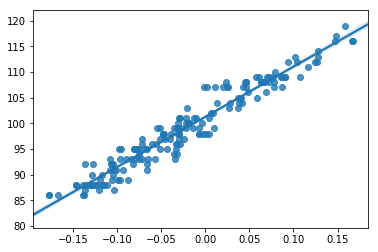

r2 = 0.939303343127


In [52]:
plt.close()
sns.regplot(x=np.array(mean_b_vals),y=df.position_along_hipp_AP_axis.astype(float).values)
plt.show()
r2 = stats.pearsonr(np.array(mean_b_vals),
                   df.position_along_hipp_AP_axis.astype(float).values)[0]**2
print('r2 = %s'%r2)

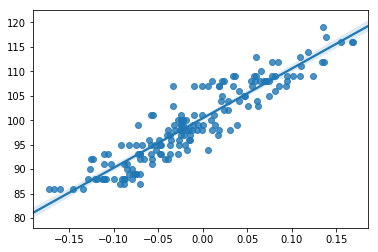

r2 = 0.854098046279


In [53]:
plt.close()
sns.regplot(x=np.array(stab_b_vals),y=df.position_along_hipp_AP_axis.astype(float).values)
plt.show()
r2 = stats.pearsonr(np.array(stab_b_vals),
                   df.position_along_hipp_AP_axis.astype(float).values)[0]**2
print('r2 = %s'%r2)

In [34]:
stability = pcalr_out_NEW['betas'] / bs.std(1)
probes.loc[stability.sort_values(ascending=False).index[-50:],'gene_name']

26238                                 PDZ and LIM domain 5
35758    solute carrier family 39 (zinc transporter), m...
42095    gamma-aminobutyric acid (GABA) A receptor, alp...
31489                                        astrotactin 2
14150                       tripartite motif containing 44
20576    ArfGAP with GTPase domain, ankyrin repeat and ...
14684    Rho guanine nucleotide exchange factor (GEF) 1...
44267    neural precursor cell expressed, developmental...
30441    nudix (nucleoside diphosphate linked moiety X)...
27858                             neurofibromin 2 (merlin)
35847    gamma-aminobutyric acid (GABA) A receptor, alp...
49301                        TBC1 domain family, member 16
4424                                           peptidase D
22080    essential meiotic endonuclease 1 homolog 1 (S....
43234    gamma-aminobutyric acid (GABA) A receptor, alp...
19653                           KRAB-A domain containing 1
5819     ST3 beta-galactoside alpha-2,3-sialyltransfera.

In [31]:


PCA_LR_pipeline?

In [39]:
len(xp.index) - len(keep_axis)

886

# Renaud suggets middle hippocampus

In [12]:
df.position_along_hipp_AP_axis.describe()

count    170.000000
mean      99.117647
std        8.050009
min       86.000000
25%       93.000000
50%       98.000000
75%      107.000000
max      119.000000
Name: position_along_hipp_AP_axis, dtype: float64

In [13]:
np.mean([86,119])

102.5

In [17]:
df.loc[:,'distance_from_center'] = abs(df.position_along_hipp_AP_axis - 102.5)

running PCA
transforming data
performing model cross-validation
using basic 10-fold cross-validation


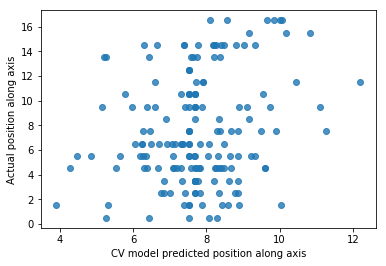

model cv score: r2 =  0.05385182655
running final model
final model fit r2 =  0.27436574595


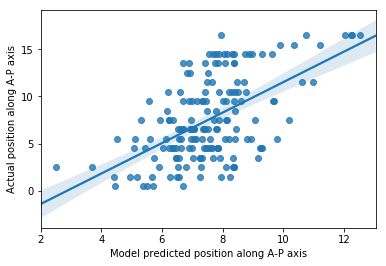

running sanity_check


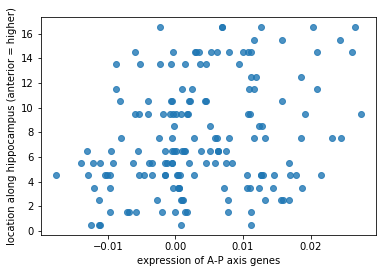

posterior and anterior 1 genes vs. y:  r2 = 0.0735294698418, p = 0.000347958825978 




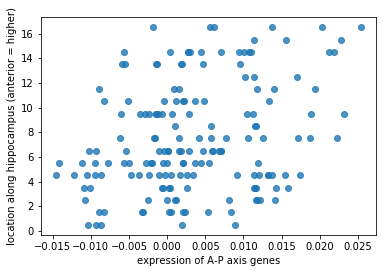

posterior and anterior 2 genes vs. y:  r2 = 0.0867156564542, p = 9.70110741263e-05 




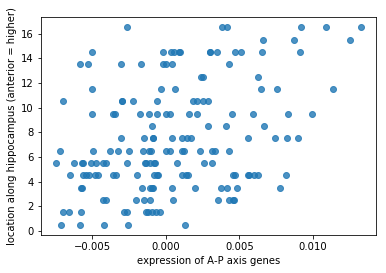

posterior and anterior 5 genes vs. y:  r2 = 0.138226111038, p = 5.97987143208e-07 




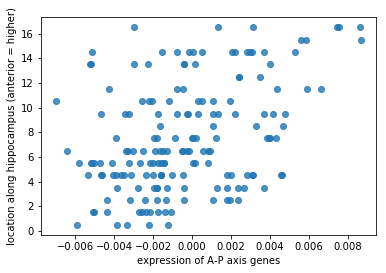

posterior and anterior 10 genes vs. y:  r2 = 0.172838507291, p = 1.72159255893e-08 




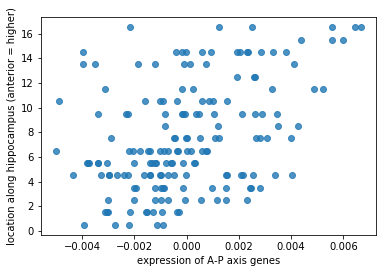

posterior and anterior 20 genes vs. y:  r2 = 0.17906380152, p = 8.97648135643e-09 




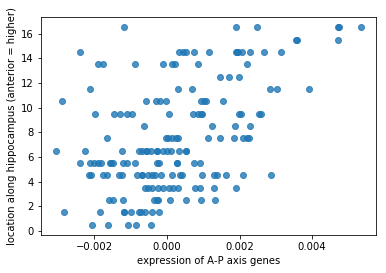

posterior and anterior 50 genes vs. y:  r2 = 0.245846181584, p = 6.20050171064e-12 




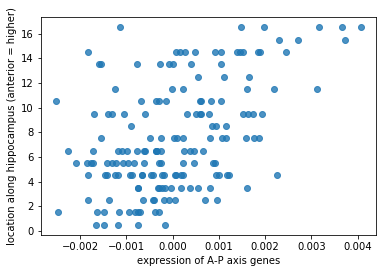

posterior and anterior 100 genes vs. y:  r2 = 0.238171133794, p = 1.47365309666e-11 




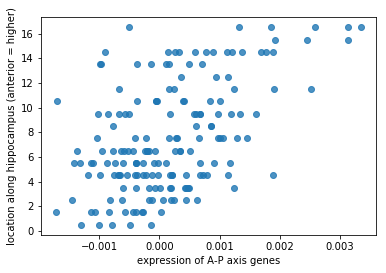

posterior and anterior 200 genes vs. y:  r2 = 0.26523926943, p = 6.70295441464e-13 




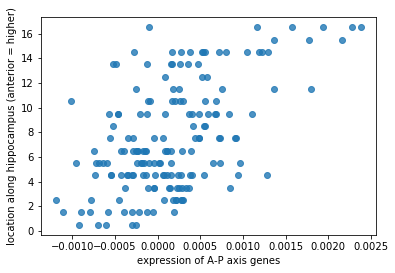

posterior and anterior 500 genes vs. y:  r2 = 0.301736725902, p = 8.72393665933e-15 




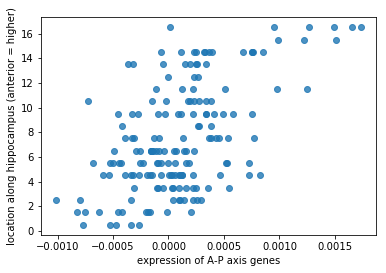

posterior and anterior 1000 genes vs. y:  r2 = 0.321190346305, p = 7.8858405904e-16 




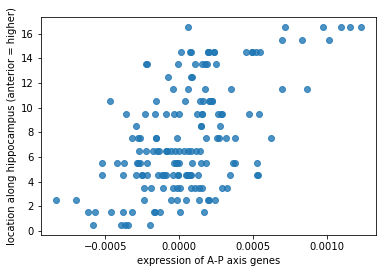

posterior and anterior 2000 genes vs. y:  r2 = 0.325037449715, p = 4.86420022087e-16 




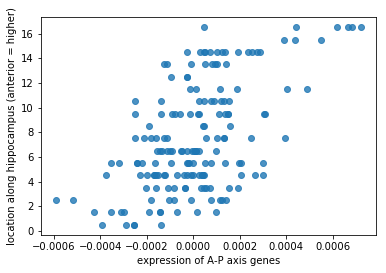

posterior and anterior 5000 genes vs. y:  r2 = 0.32035519525, p = 8.75485722454e-16 




//anaconda/envs/py3/lib/python3.5/site-packages/seaborn/categorical.py:1460: FutureWarning: remove_na is deprecated and is a private function. Do not use.
  stat_data = remove_na(group_data)


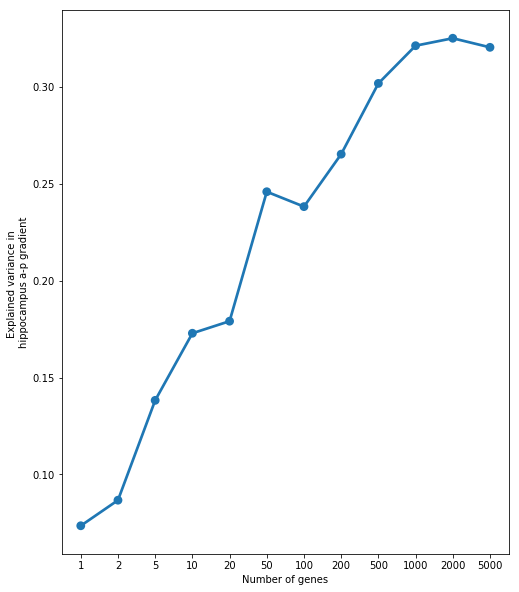

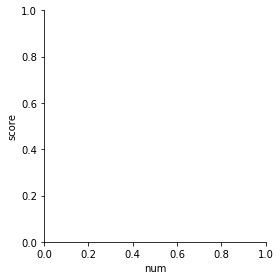

In [19]:
# testing weighted averages
pcalr_CENTER = PCA_LR_pipeline(xp.values.T, 
                            (df.distance_from_center), 
                            cv_strategy='score', illustrative=True,
                           test_gene_num = [1, 2, 5, 10, 20, 50, 100, 
                                            200, 500, 1000, 2000, 5000],
                               sanity_check_style = 'model')